## loading libraries, dataset and defining target variable

In [ ]:
# Basic Imports (add more as needed within each step)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE, SelectKBest, chi2, f_classif, mutual_info_classif
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, precision_recall_curve, auc, f1_score, make_scorer
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import TomekLinks
from collections import Counter

In [ ]:
import pandas as pd
import json
from google.colab import drive
drive.mount('/content/drive')

file_path="/content/drive/MyDrive/attiki odos/augmented_accidents_data_final.csv"



try:
    df = pd.read_csv(file_path, encoding='utf-8')
except FileNotFoundError:
    print("Error: file_path not found.")
    df = None
except pd.errors.ParserError:
    print("Error: Unable to parse the CSV file.")
    df = None
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    df = None

if df is not None:
    display(df.head())
    print(df.shape)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,α/α,ΗΜ/ΝΙΑ_ΚΑΤΑΧΩΡΗΣΗΣ,ΑΝΑΦΟΡΑ,ΗΜ/ΝΙΑ_ΕΝΑΡΞΗΣ,ΗΜ.ΛΗΞΗΣ,ΑΥΤ/ΔΡΟΜΟΣ,ΚΟΜΒΟΣ,ΣΤΑΘΜ.ΔΙΟΔΙΩΝ,ΚΛΑΔΟΣ,ΧΙΛ.ΘΕΣΗ,...,next_curve_direction,next_curve_category,next_curve_lat,next_curve_lng,profile_total_curves,profile_left_turns,profile_right_turns,profile_avg_angle,nearby_junctions_count_500m,nearby_roads_count_100m
0,1,2014-01-01 00:00:00,Δ.Π.Λ.Υ.,2014-01-01 16:50:00,2014-01-01 17:33:00,K,2.0,NaN,1,0.0,...,NaN,NaN,NaN,NaN,58,43,15,7.703853,0,0
1,2,2014-01-11 00:00:00,Δ.Π.Λ.Υ.,2014-01-11 05:41:00,2014-01-11 07:27:00,P,NaN,NaN,NaN,6.1,...,left,Very Sharp Curve,38.001362,23.845701,38,22,16,11.052188,0,0
2,3,2014-01-14 00:00:00,ΕΛ.ΕΣ.Σ. ΔΥΤΙΚΑ,2014-01-14 14:30:00,2014-01-14 15:36:00,E,1.0,NaN,A-1,0.0,...,right,Very Sharp Curve,38.057494,23.512682,443,295,148,8.630010,0,0
3,4,2014-01-19 00:00:00,Δ.Π.Λ.Υ.,2014-01-19 14:34:00,2014-01-19 14:54:00,K,NaN,NaN,NaN,3.8,...,left,Very Sharp Curve,37.993188,23.820712,58,43,15,7.703853,0,0
4,5,2014-01-28 00:00:00,ΕΛ.ΕΣ.Σ. ΔΥΤΙΚΑ,2014-01-28 16:41:00,2014-01-28 17:46:00,A,NaN,NaN,NaN,22.8,...,left,Very Sharp Curve,38.059926,23.756841,416,245,171,7.394187,0,0


(523, 215)



--- Distribution of Accident Duration (minutes) ---


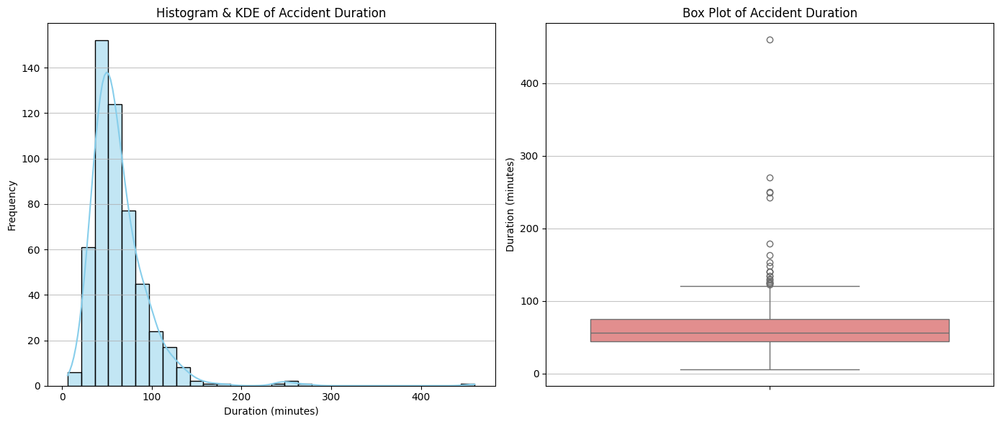


--- Percentile Values for 'duration_minutes' ---
0.25     44.00
0.50     56.00
0.75     75.00
0.80     81.00
0.85     90.00
0.90     98.80
0.95    116.80
0.99    175.48
Name: duration_minutes, dtype: float64

Descriptive Percentiles:
25th percentile: 44.00 minutes
50th percentile: 56.00 minutes
75th percentile: 75.00 minutes
80th percentile: 81.00 minutes
85th percentile: 90.00 minutes
90th percentile: 98.80 minutes
95th percentile: 116.80 minutes
99th percentile: 175.48 minutes

--- Descriptive Statistics ---
count    523.000000
mean      63.596558
std       35.260494
min        6.000000
25%       44.000000
50%       56.000000
75%       75.000000
max      460.000000
Name: duration_minutes, dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np # For np.percentile if needed, though pandas quantile is good

# --- 1. Data Preparation & Initial Check ---
if df is not None and 'duration_minutes' in df.columns:
    duration_minutes = df['duration_minutes'].dropna() # Remove NaNs for robust analysis

    if duration_minutes.empty:
        print("The 'duration_minutes' column is empty or only contains NaNs after cleaning.")
    else:
        # --- 2. Visualizing the Distribution ---
        print("\n--- Distribution of Accident Duration (minutes) ---")
        plt.figure(figsize=(14, 6))

        # Histogram with KDE
        plt.subplot(1, 2, 1)
        sns.histplot(duration_minutes, kde=True, bins=30, color='skyblue', edgecolor='black')
        plt.title('Histogram & KDE of Accident Duration')
        plt.xlabel('Duration (minutes)')
        plt.ylabel('Frequency')
        plt.grid(axis='y', alpha=0.75)

        # Box Plot
        plt.subplot(1, 2, 2)
        sns.boxplot(y=duration_minutes, color='lightcoral')
        plt.title('Box Plot of Accident Duration')
        plt.ylabel('Duration (minutes)')
        plt.grid(axis='y', alpha=0.75)

        plt.tight_layout()
        plt.show()

        # --- 3. Calculating and Displaying Percentiles ---
        print("\n--- Percentile Values for 'duration_minutes' ---")
        percentiles_to_calculate = [25, 50, 75, 80, 85, 90, 95, 99]
        percentile_values = duration_minutes.quantile([p/100 for p in percentiles_to_calculate])

        print(percentile_values)

        # You can also print them more descriptively:
        print("\nDescriptive Percentiles:")
        for p in percentiles_to_calculate:
            print(f"{p}th percentile: {duration_minutes.quantile(p/100):.2f} minutes")

        # Basic descriptive statistics again, as they are useful
        print("\n--- Descriptive Statistics ---")
        print(duration_minutes.describe())

else:
    if df is None:
        print("DataFrame was not loaded. Cannot perform analysis.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame.")
        print(f"Available columns are: {df.columns.tolist()}")

## target variable definition

In [ ]:
df_original = df.copy()

import pandas as pd
import numpy as np

# Assuming 'df_original' is your DataFrame and it's already loaded
# as per your previous code snippet.

if df_original is not None and 'duration_minutes' in df_original.columns:
    # --- 1. Calculate the Median Threshold ---
    median_duration = df_original['duration_minutes'].median()
    print(f"Calculated Median Duration (threshold): {median_duration:.2f} minutes")

    # --- 2. Create the Binary Target Variable 'duration_long_accident' ---
    # 1 if duration_minutes > median_duration, 0 otherwise
    df_original['duration_long_accident'] = np.where(df_original['duration_minutes'] > median_duration, 1, 0)

    print("\n--- Target Variable Distribution ('duration_long_accident' based on Median) ---")
    print(df_original['duration_long_accident'].value_counts(normalize=True))
    print("\nValue Counts:")
    print(df_original['duration_long_accident'].value_counts())

    # Display the first few rows with the new column
    print("\n--- DataFrame Head with new 'duration_long_accident' column ---")
    # Using display() if in a Jupyter/Colab environment, otherwise print()
    try:
        display(df_original[['duration_minutes', 'duration_long_accident']].head())
    except NameError: # display is not defined (e.g., running in a standard Python script)
        print(df_original[['duration_minutes', 'duration_long_accident']].head())

else:
    if df_original is None:
        print("DataFrame 'df_original' was not loaded. Cannot create target variable.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame 'df_original'.")
        print(f"Available columns are: {df_original.columns.tolist()}")

Calculated Median Duration (threshold): 56.00 minutes

--- Target Variable Distribution ('duration_long_accident' based on Median) ---
duration_long_accident
0    0.51434
1    0.48566
Name: proportion, dtype: float64

Value Counts:
duration_long_accident
0    269
1    254
Name: count, dtype: int64

--- DataFrame Head with new 'duration_long_accident' column ---


,duration_minutes,duration_long_accident
0,43.0,0
1,106.0,1
2,66.0,1
3,20.0,0
4,65.0,1


# Iteration 1: Small feature set

## selecting initial features

In [ ]:
if df_original is not None:
    columns_iter1 = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ',
        'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
        'ΚΑΤ._ΟΔ.','ΤΕΧΝ._ΦΩΤ.', #'accident_type', # This is now our target or related to it
        'lat', 'lng', 'num_involved_vehicles', 'has_ΙΧΕ',
        'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ',
        'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'duration_long_accident', # Keep the target variable
        'effective_lighting_condition',# replacing ΤΕΧΝ._ΦΩΤ. with effective_lighting_condition
    ]
    # Ensure all selected columns exist in df_original
    columns_iter1 = [col for col in columns_iter1 if col in df_original.columns]
    if 'duration_long_accident' not in columns_iter1 and 'duration_long_accident' in df_original.columns:
         columns_iter1.append('duration_long_accident')


    df_iter1 = df_original[columns_iter1].copy()
    print(f"\n--- Iteration 1: Working with {len(df_iter1.columns)-1} features ---")
    # display(df_iter1.head())



--- Iteration 1: Working with 20 features ---


## data splitting (train, validation, test)

In [ ]:
if 'df_iter1' in locals() and df_iter1 is not None:
    X = df_iter1.drop('duration_long_accident', axis=1)
    y = df_iter1['duration_long_accident']

    # Split into Train (60%) and Temp (40% for Val+Test)
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.4, random_state=42, stratify=y
    )

    # Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
    )

    print(f"Training set: {X_train.shape}, {y_train.shape}, Minority class: {Counter(y_train)[1]}")
    print(f"Validation set: {X_val.shape}, {y_val.shape}, Minority class: {Counter(y_val)[1]}")
    print(f"Test set: {X_test.shape}, {y_test.shape}, Minority class: {Counter(y_test)[1]}")


Training set: (313, 20), (313,), Minority class: 152
Validation set: (105, 20), (105,), Minority class: 51
Test set: (105, 20), (105,), Minority class: 51


## data exploration

Numerical Features: ['ΧΙΛ.ΘΕΣΗ', 'lat', 'lng', 'num_involved_vehicles']
Categorical Features: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', 'effective_lighting_condition']


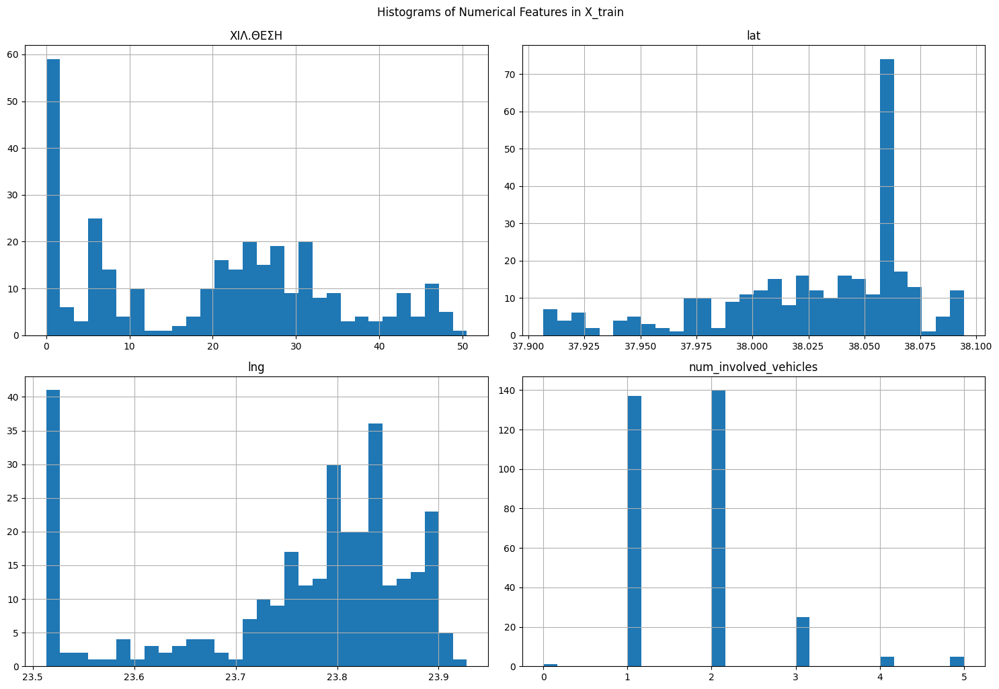

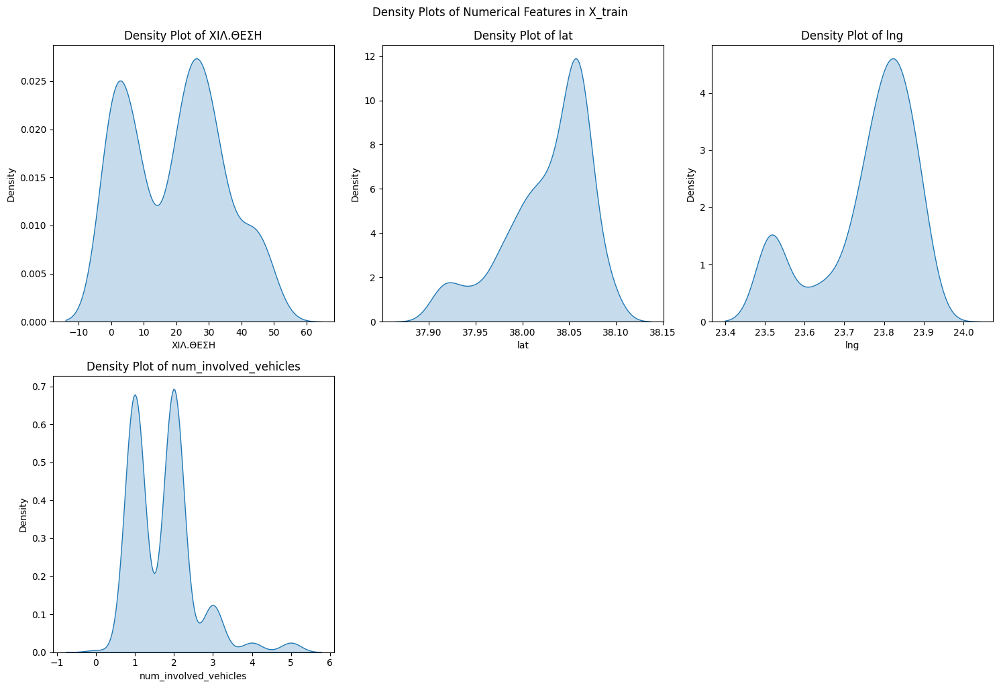

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Separate numerical and categorical features
numerical_features = X_train.select_dtypes(include=np.number).columns
categorical_features = X_train.select_dtypes(include='object').columns

print("Numerical Features:", list(numerical_features))
print("Categorical Features:", list(categorical_features))

# Analyze distribution of numerical features
if len(numerical_features) > 0:
    X_train[numerical_features].hist(bins=30, figsize=(15, 10))
    plt.tight_layout()
    plt.suptitle('Histograms of Numerical Features in X_train', y=1.02)
    plt.show()

    plt.figure(figsize=(15, 10))
    for i, col in enumerate(numerical_features):
        plt.subplot(len(numerical_features) // 3 + 1, 3, i + 1)
        sns.kdeplot(X_train[col], fill=True)
        plt.title(f'Density Plot of {col}')
    plt.tight_layout()
    plt.suptitle('Density Plots of Numerical Features in X_train', y=1.02)
    plt.show()
else:
    print("No numerical features to plot.")

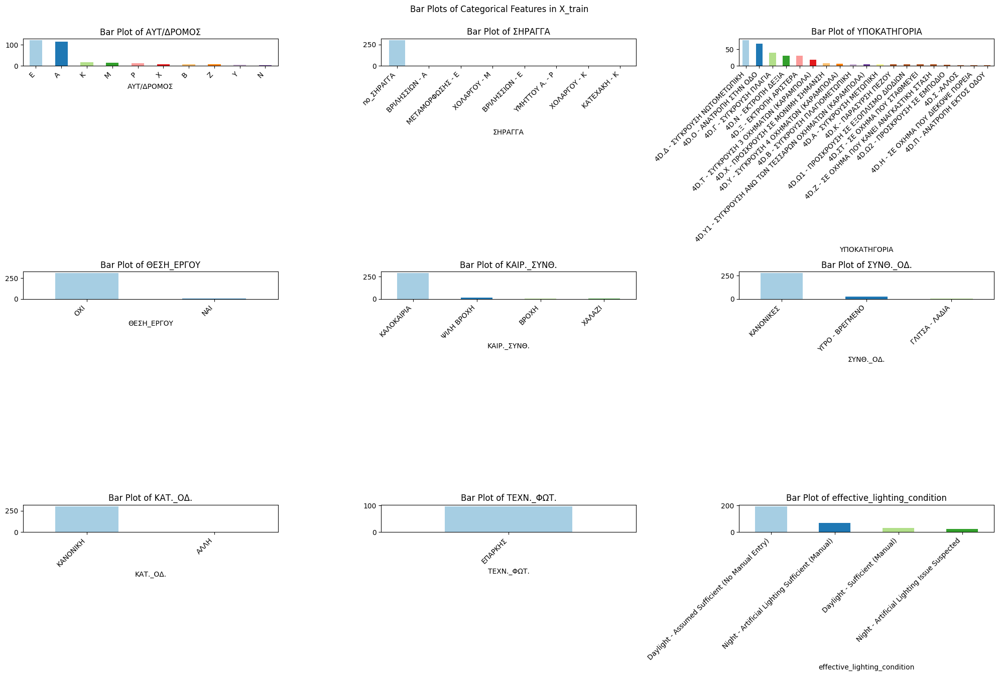

In [ ]:
# Analyze distribution of categorical features
if len(categorical_features) > 0:
    plt.figure(figsize=(20, 15))
    for i, col in enumerate(categorical_features):
        plt.subplot(len(categorical_features) // 3 + 1, 3, i + 1)
        X_train[col].value_counts().plot(kind='bar', color=plt.cm.Paired(np.arange(len(X_train[col].value_counts()))))
        plt.title(f'Bar Plot of {col}')
        plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.suptitle('Bar Plots of Categorical Features in X_train', y=1.02)
    plt.show()
else:
    print("No categorical features to plot.")

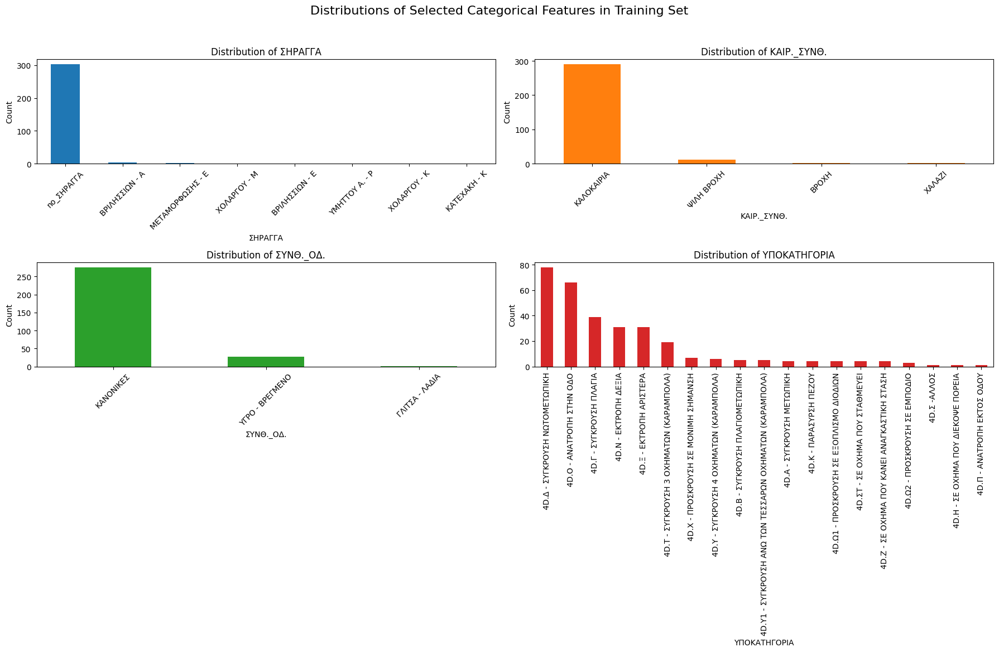

In [ ]:
# Single Canvas with Four Categorical Plots
features_to_plot_together = ['ΣΗΡΑΓΓΑ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΥΠΟΚΑΤΗΓΟΡΙΑ']
valid_features_to_plot = [f for f in features_to_plot_together if f in X_train.columns]

if valid_features_to_plot:
    n_features = len(valid_features_to_plot)
    # Determine grid size (e.g., 2x2 for 4 plots)
    n_cols = 2
    n_rows = (n_features + n_cols - 1) // n_cols

    # Increased figure width to accommodate potential longer labels
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 6)) # Adjusted figsize: increased width

    # Flatten the axes array if it's 2D, for easy iteration
    axes = axes.flatten() if n_rows > 1 else [axes]

    for i, feature in enumerate(valid_features_to_plot):
        ax = axes[i]
        X_train[feature].value_counts().plot(kind='bar', ax=ax, color=plt.cm.tab10(i)) # Use different colormap for each plot
        ax.set_title(f'Distribution of {feature}')
        ax.set_xlabel(feature)
        ax.set_ylabel('Count')

        # Adjust rotation specifically for the 'ΥΠΟΚΑΤΗΓΟΡΙΑ' plot if needed
        rotation_angle = 45 # Default rotation
        if feature == 'ΥΠΟΚΑΤΗΓΟΡΙΑ':
            rotation_angle = 90 # More vertical rotation for long labels

        ax.tick_params(axis='x', rotation=rotation_angle) # Apply the chosen rotation

    # Hide any unused subplots if n_features is less than n_rows * n_cols
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make space for suptitle
    fig.suptitle('Distributions of Selected Categorical Features in Training Set', fontsize=16, y=1.0)
    plt.show()
else:
    print("None of the specified categorical features were found in X_train.")

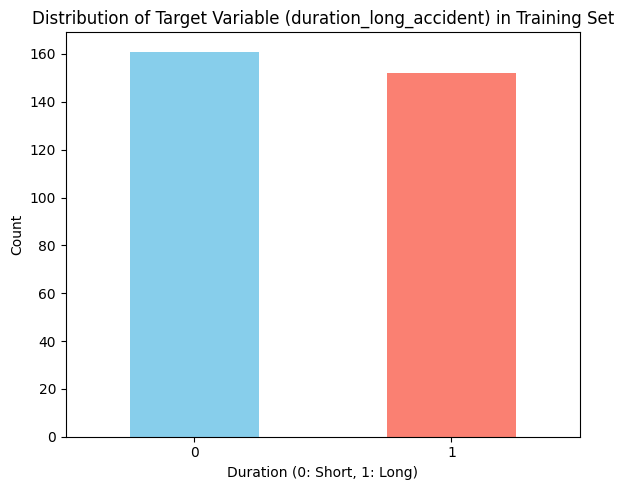

In [ ]:
# Bar Chart for Target Variable (duration_long_accident) Distribution
if 'y_train' in locals():
    plt.figure(figsize=(6, 5))
    y_train.value_counts().sort_index().plot(kind='bar', color=['skyblue', 'salmon']) # Assuming 0 and 1 as labels
    plt.title('Distribution of Target Variable (duration_long_accident) in Training Set')
    plt.xlabel('Duration (0: Short, 1: Long)')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()
else:
    print("Target variable y_train not available.")

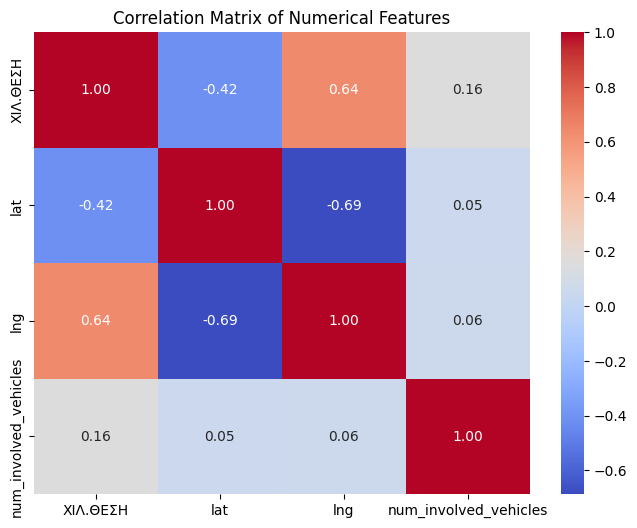

In [ ]:
# Analyze correlation between numerical features
if len(numerical_features) > 1:
    correlation_matrix = X_train[numerical_features].corr()
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix of Numerical Features')
    plt.show()
else:
    print("Not enough numerical features to compute correlation matrix.")

## spatial engineering

In [ ]:
!pip install pygeohash -q

In [ ]:
# You might need to install pygeohash:
# !pip install pygeohash sklearn

import pandas as pd
import numpy as np
import pygeohash # For geohashing
from sklearn.neighbors import KernelDensity # For KDE

# --- 1. Coordinate Binning Function ---
# (This function remains unchanged from your version)
def create_coordinate_bins(df, lat_col='lat', lng_col='lng', n_bins=10, fit_df=None):
    """
    Creates bins for latitude and longitude.
    fit_df: DataFrame to use for fitting bin edges (e.g., X_train).
            If None, df itself is used.
    """
    df_out = df.copy()
    fit_data = fit_df if fit_df is not None else df_out

    # Fit bins on training data (fit_df)
    # Ensure lat_col and lng_col are present and not all NaN in fit_data
    if fit_data[lat_col].isnull().all() or fit_data[lng_col].isnull().all():
        print(f"Warning: All values in {lat_col} or {lng_col} are NaN in fit_df. Binning may fail or be meaningless.")
        # Create dummy columns to prevent errors downstream, or handle as appropriate
        df_out[f'{lat_col}_bin_{n_bins}'] = -1
        df_out[f'{lng_col}_bin_{n_bins}'] = -1
        df_out[f'grid_cell_{n_bins}x{n_bins}'] = 'unknown_cell'
        return df_out

    _, lat_bin_edges = pd.cut(fit_data[lat_col].dropna(), bins=n_bins, labels=False, retbins=True, include_lowest=True, duplicates='drop')
    _, lng_bin_edges = pd.cut(fit_data[lng_col].dropna(), bins=n_bins, labels=False, retbins=True, include_lowest=True, duplicates='drop')

    df_out[f'{lat_col}_bin_{n_bins}'] = pd.cut(df_out[lat_col], bins=lat_bin_edges, labels=False, include_lowest=True)
    df_out[f'{lng_col}_bin_{n_bins}'] = pd.cut(df_out[lng_col], bins=lng_bin_edges, labels=False, include_lowest=True)

    # Combine into a single grid cell ID
    df_out[f'grid_cell_{n_bins}x{n_bins}'] = (
        df_out[f'{lat_col}_bin_{n_bins}'].astype(str) + "_" + df_out[f'{lng_col}_bin_{n_bins}'].astype(str)
    )
    # Handle potential NaNs from out-of-bounds or original NaNs
    df_out.fillna({f'{lat_col}_bin_{n_bins}':-1},inplace=True)
    df_out.fillna({f'{lng_col}_bin_{n_bins}':-1},inplace=True)

    # Robustly replace NaN combinations in the combined cell ID
    # Combinations like 'nan_-1.0', '-1.0_nan', 'nan_nan' can occur if original lat/lng were NaN
    # or if pd.cut resulted in NaN for some reason (e.g. value outside explicitly defined bin edges from training)
    df_out[f'grid_cell_{n_bins}x{n_bins}'] = df_out[f'grid_cell_{n_bins}x{n_bins}'].str.replace(r'.*_nan.*|nan_.*', 'unknown_cell', regex=True)
    df_out.fillna({f'grid_cell_{n_bins}x{n_bins}':'unknown_cell'},inplace=True)

    return df_out

# --- 2. Geohashing Function ---
# (This function remains unchanged from your version)
def apply_geohash(df, lat_col='lat', lng_col='lng', precision=7):
    df_out = df.copy()
    # Handle potential NaNs in lat/lng before applying geohash
    valid_coords_idx = df_out[[lat_col, lng_col]].dropna().index
    df_out.loc[valid_coords_idx, f'geohash_p{precision}'] = df_out.loc[valid_coords_idx].apply(
        lambda row: pygeohash.encode(row[lat_col], row[lng_col], precision=precision), axis=1
    )
    df_out.fillna({f'geohash_p{precision}':'unknown_geohash'},inplace=True)
    return df_out

# --- 3. KDE Score Function ---
# (This function remains unchanged from your version)
def apply_kde_score(df_to_score, df_fit_on, lat_col='lat', lng_col='lng', bandwidth=0.01):
    df_out = df_to_score.copy()
    # Ensure no NaNs in fitting data
    coords_fit = df_fit_on[[lat_col, lng_col]].dropna().values

    if coords_fit.shape[0] == 0:
        df_out['kde_score'] = 0.0 # Ensure float
        return df_out

    kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth)
    kde.fit(coords_fit)

    # Ensure no NaNs in scoring data, score only valid coords
    valid_score_idx = df_out[[lat_col, lng_col]].dropna().index
    coords_score = df_out.loc[valid_score_idx, [lat_col, lng_col]].values

    df_out['kde_score'] = 0.0 # Initialize column
    if coords_score.shape[0] > 0:
        log_density_scores = kde.score_samples(coords_score)
        df_out.loc[valid_score_idx, 'kde_score'] = np.exp(log_density_scores)

    # df_out['kde_score'].fillna(0.0, inplace=True) # Fill if original lat/lng were NaN or for rows not scored
    df_out.fillna({'kde_score':0.0},inplace=True)
    return df_out

# --- 4. MODIFIED Combined Road-Kilometer Feature ---
def create_road_segment_feature_adjusted(df, road_col='ΑΥΤ/ΔΡΟΜΟΣ', km_col='ΧΙΛ.ΘΕΣΗ', prefix='segment'):
    df_out = df.copy()

    # Fill NaNs before converting to string, to ensure consistent string representation
    df_out[road_col] = df_out[road_col].fillna('UnknownRoad')
    # For km_col, fill NaNs, then convert to float (to handle "0", "0.0", "0.00" consistently) then to string for comparison
    # This handles cases where km_col might be object but contain numbers, or already float/int
    try:
        # Attempt to convert to numeric, coerce errors to NaN, then fill and convert to string
        km_numeric = pd.to_numeric(df_out[km_col], errors='coerce')
        # Check for 0.0. Be careful with float comparisons.
        # It's safer to convert to a string format that you can reliably check, AFTER numeric conversion.
        # For example, format to one decimal place string for comparison.
        # However, if the original data is '0.0' as a string, direct string comparison after fillna is simpler
        # Let's assume after .astype(str) later, '0.0' is the consistent representation.
        df_out[km_col] = df_out[km_col].fillna('UnknownKM').astype(str) # Original approach for string consistency
    except Exception: # Fallback if complex conversion fails
         df_out[km_col] = df_out[km_col].fillna('UnknownKM').astype(str)


    df_out[road_col] = df_out[road_col].astype(str) # Ensure road_col is also string

    # Default segment_id
    df_out[f'{prefix}_id'] = df_out[road_col] + "_" + df_out[km_col]

    # --- Specific adjustments for "A_0.0" and "E_0.0" ---
    # Create boolean masks for the conditions
    # Robust check for "0.0" (or "0", "0.00" etc. depending on your data's string format)
    # Assuming km_col after astype(str) will be '0.0' for these cases.
    # If it could be '0', you might need: (df_out[km_col] == '0.0') | (df_out[km_col] == '0')
    condition_A0 = (df_out[road_col] == 'A') & (df_out[km_col] == '0.0')
    condition_E0 = (df_out[road_col] == 'E') & (df_out[km_col] == '0.0')

    # Apply the new category
    df_out.loc[condition_A0, f'{prefix}_id'] = 'A_EntryZone_Or_UnknownKM'
    df_out.loc[condition_E0, f'{prefix}_id'] = 'E_EntryZone_Or_UnknownKM'

    return df_out

print("Spatial feature engineering functions defined (road segment function is adjusted).")

Spatial feature engineering functions defined (road segment function is adjusted).


In [ ]:
# Ensure X_train, X_val, X_test from the train_test_split of df_iter2 are available.
# Ensure all your spatial feature engineering functions are defined from the first code block.
# Make sure Counter from collections is imported for the downsampling part if you want to check counts.
from collections import Counter # If not already imported

if 'X_train' in locals() and 'lat' in X_train.columns and 'lng' in X_train.columns:
    N_BINS = 8
    GEOHASH_PRECISION = 7
    KDE_BANDWIDTH = 0.05 # You set this, and it will be passed to apply_kde_score

    print(f"\n--- Iteration X: Spatial Feature Engineering (with KDE Downsampling) ---")
    print(f"Original X_train shape before spatial eng: {X_train.shape}")


    # --- 1. Create Road Segment ID using the adjusted function ---
    # This function should be called first as 'segment_id' is used for downsampling KDE data.
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train.columns:
        X_train = create_road_segment_feature_adjusted(X_train)
        X_val = create_road_segment_feature_adjusted(X_val)
        X_test = create_road_segment_feature_adjusted(X_test)
        print("Adjusted road segment ID feature created.")
    else:
        print("Skipping road segment ID creation: Required columns not found.")
        # If segment_id cannot be created, KDE downsampling based on it cannot proceed as planned.
        # Add dummy 'segment_id' if it's critical for subsequent steps to not fail,
        # or ensure code handles its absence. For now, we assume it's created.
        if 'segment_id' not in X_train.columns: X_train['segment_id'] = 'unknown_segment'
        if 'segment_id' not in X_val.columns: X_val['segment_id'] = 'unknown_segment'
        if 'segment_id' not in X_test.columns: X_test['segment_id'] = 'unknown_segment'


    # --- Downsampling logic for KDE fitting data (from X_train) ---
    # This X_train now has 'segment_id', 'lat', 'lng'
    print("\nPreparing data for KDE model fitting with downsampling of high-frequency segments...")

    # Create a copy of X_train specifically for preparing the KDE fitting data
    # This copy should have 'segment_id', 'lat', 'lng'
    X_train_for_kde_fitting_preparation = X_train.copy()

    segments_to_downsample = [
        "A_EntryZone_Or_UnknownKM",
        "E_EntryZone_Or_UnknownKM",
        # Add other re-categorized "0.0" segments like M_0.0, K_0.0 if they become e.g.,
        # "M_EntryZone_Or_UnknownKM", "K_EntryZone_Or_UnknownKM" or whatever their segment_id is
    ]
    # To be more robust, you might identify these high-frequency segments dynamically
    # For example, any segment with more than X occurrences if you don't want to hardcode.
    # For now, using the hardcoded list based on prior observation.

    N_SAMPLES_PER_SEGMENT_FOR_KDE = 3 # Max samples from each high-frequency segment for KDE fit

    downsampled_dfs_for_kde = []
    other_dfs_for_kde = []

    # Ensure 'segment_id' exists before trying to use it for downsampling
    if 'segment_id' in X_train_for_kde_fitting_preparation.columns:
        # Check actual unique segment_id values to correctly identify M_0.0 and K_0.0 if they were not re-categorized
        # The create_road_segment_feature_adjusted re-categorizes A_0.0 and E_0.0.
        # If M_0.0 and K_0.0 become "M_0.0" and "K_0.0" as segment_id, add them to segments_to_downsample list.
        # Example: segments_to_downsample.extend(["M_0.0", "K_0.0"])

        print(f"Segments identified for potential downsampling in KDE: {segments_to_downsample}")
        print(f"Target samples per downsampled segment for KDE: {N_SAMPLES_PER_SEGMENT_FOR_KDE}")

        for segment_name in X_train_for_kde_fitting_preparation['segment_id'].unique():
            segment_df = X_train_for_kde_fitting_preparation[X_train_for_kde_fitting_preparation['segment_id'] == segment_name]
            if segment_name in segments_to_downsample:
                if len(segment_df) > N_SAMPLES_PER_SEGMENT_FOR_KDE:
                    downsampled_dfs_for_kde.append(segment_df.sample(N_SAMPLES_PER_SEGMENT_FOR_KDE, random_state=42))
                    print(f"Downsampled segment '{segment_name}' from {len(segment_df)} to {N_SAMPLES_PER_SEGMENT_FOR_KDE} for KDE fitting.")
                else:
                    downsampled_dfs_for_kde.append(segment_df) # Keep all if less than N
                    print(f"Segment '{segment_name}' has {len(segment_df)} samples (<=N), keeping all for KDE fitting.")
            else:
                other_dfs_for_kde.append(segment_df)

        temp_concat_list = downsampled_dfs_for_kde + other_dfs_for_kde
        if temp_concat_list: # Ensure list is not empty before concat
            X_train_data_for_kde_fit = pd.concat(temp_concat_list)
            print(f"Shape of data used to FIT KDE model after downsampling: {X_train_data_for_kde_fit.shape}")
        else:
            print("Warning: No data selected for KDE fitting after downsampling attempt. Using original X_train for KDE fitting.")
            X_train_data_for_kde_fit = X_train_for_kde_fitting_preparation # Fallback
    else:
        print("Warning: 'segment_id' column not found in X_train. Skipping downsampling for KDE. Using original X_train for KDE fitting.")
        X_train_data_for_kde_fit = X_train_for_kde_fitting_preparation # Fallback

    # Now, X_train_coords_for_kde should be derived from this potentially downsampled DataFrame
    if 'lat' in X_train_data_for_kde_fit.columns and 'lng' in X_train_data_for_kde_fit.columns:
        X_train_coords_for_kde_fitting = X_train_data_for_kde_fit[['lat', 'lng']].dropna()
    else:
        print("Warning: lat/lng not in X_train_data_for_kde_fit. KDE might fail or be inaccurate.")
        X_train_coords_for_kde_fitting = pd.DataFrame(columns=['lat','lng']) # Empty DF to prevent error


    # --- Apply Coordinate Binning ---
    # Uses X_train (original training split for this iter, now with segment_id) for fit_df
    if 'lat' in X_train.columns and 'lng' in X_train.columns:
        X_train = create_coordinate_bins(X_train, n_bins=N_BINS, fit_df=X_train.copy())
        X_val = create_coordinate_bins(X_val, n_bins=N_BINS, fit_df=X_train.copy())
        X_test = create_coordinate_bins(X_test, n_bins=N_BINS, fit_df=X_train.copy())
        print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
    else:
        print("Skipping coordinate binning: lat/lng columns not found in X_train (after segment_id creation).")

    # --- Apply Geohashing ---
    if 'lat' in X_train.columns and 'lng' in X_train.columns:
        X_train = apply_geohash(X_train, precision=GEOHASH_PRECISION)
        X_val = apply_geohash(X_val, precision=GEOHASH_PRECISION)
        X_test = apply_geohash(X_test, precision=GEOHASH_PRECISION)
        print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
    else:
        print("Skipping geohashing: lat/lng columns not found.")


    # --- Apply KDE Score ---
    # The KDE model is FIT using X_train_coords_for_kde_fitting (from downsampled data)
    # Then, this fitted KDE model is used to SCORE the original X_train, X_val, X_test (which still have all their rows)
    if not X_train_coords_for_kde_fitting.empty and \
       all(col in X_train.columns for col in ['lat','lng']) and \
       all(col in X_val.columns for col in ['lat','lng']) and \
       all(col in X_test.columns for col in ['lat','lng']):

        print(f"Fitting KDE model using data of shape: {X_train_coords_for_kde_fitting.shape}")
        X_train = apply_kde_score(X_train, X_train_coords_for_kde_fitting, bandwidth=KDE_BANDWIDTH)
        X_val = apply_kde_score(X_val, X_train_coords_for_kde_fitting, bandwidth=KDE_BANDWIDTH)
        X_test = apply_kde_score(X_test, X_train_coords_for_kde_fitting, bandwidth=KDE_BANDWIDTH)
        # fillna for kde_score is now inside apply_kde_score function
        print("KDE scores created (KDE model fit on potentially downsampled training data).")
    else:
        print("Skipping KDE score creation: Not enough valid coordinates for fitting KDE or lat/lng missing in X_train/X_val/X_test.")
        X_train['kde_score'] = 0.0
        X_val['kde_score'] = 0.0
        X_test['kde_score'] = 0.0

    # Display some of the new features
    new_spatial_cols = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'kde_score' in X_train.columns: new_spatial_cols.append('kde_score')
    if 'segment_id' in X_train.columns: new_spatial_cols.append('segment_id')

    new_spatial_cols = [col for col in new_spatial_cols if col in X_train.columns] # Should not be necessary if checks above are fine
    if new_spatial_cols:
        print("\nSample of new spatial features in X_train (post all spatial engineering):")
        try:
            display(X_train[new_spatial_cols].head())
        except NameError:
            print(X_train[new_spatial_cols].head())
    else:
        print("\nNo new spatial features were available to display.")
else:
    print("Skipping spatial feature engineering: Initial X_train or lat/lng columns not found.")


--- Iteration X: Spatial Feature Engineering (with KDE Downsampling) ---
Original X_train shape before spatial eng: (313, 20)
Adjusted road segment ID feature created.

Preparing data for KDE model fitting with downsampling of high-frequency segments...
Segments identified for potential downsampling in KDE: ['A_EntryZone_Or_UnknownKM', 'E_EntryZone_Or_UnknownKM']
Target samples per downsampled segment for KDE: 3
Downsampled segment 'E_EntryZone_Or_UnknownKM' from 23 to 3 for KDE fitting.
Downsampled segment 'A_EntryZone_Or_UnknownKM' from 16 to 3 for KDE fitting.
Shape of data used to FIT KDE model after downsampling: (280, 21)
Coordinate bins (8x8) created.
Geohash (precision 7) features created.
Fitting KDE model using data of shape: (280, 2)
KDE scores created (KDE model fit on potentially downsampled training data).

Sample of new spatial features in X_train (post all spatial engineering):


,grid_cell_8x8,geohash_p7,kde_score,segment_id
467,7_2,swbb9tc,5.451852,A_11.4
144,3_5,swbbjfc,24.756449,K_1.7
395,4_6,swbbnx3,29.191940,P_6.0
325,5_6,swbbq64,30.107243,B_8.0
177,5_5,swbbmuw,30.017163,A_29.6


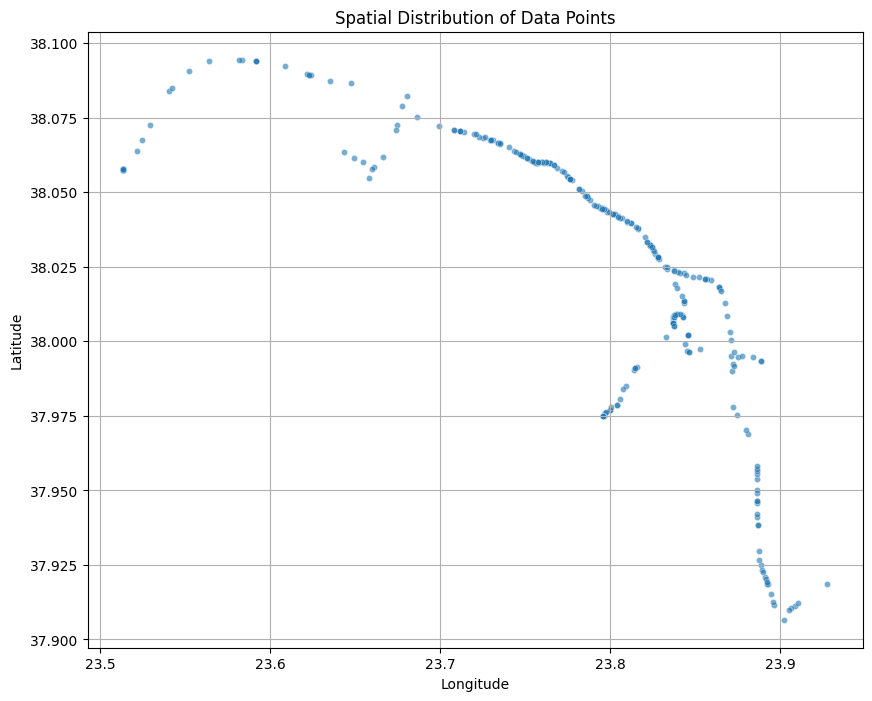

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X_train has the required columns
# Use a small sample if the dataset is very large for faster plotting
sample_df = X_train.sample(n=500, random_state=42) if X_train.shape[0] > 500 else X_train.copy()

plt.figure(figsize=(10, 8))
sns.scatterplot(data=sample_df, x='lng', y='lat', s=20, alpha=0.6, legend=False)
plt.title('Spatial Distribution of Data Points')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

Highlighting points for common geohashes: ['swb8x01', 'swb8x04', 'swbbj3p', 'swbbnqv', 'swbbq5e']


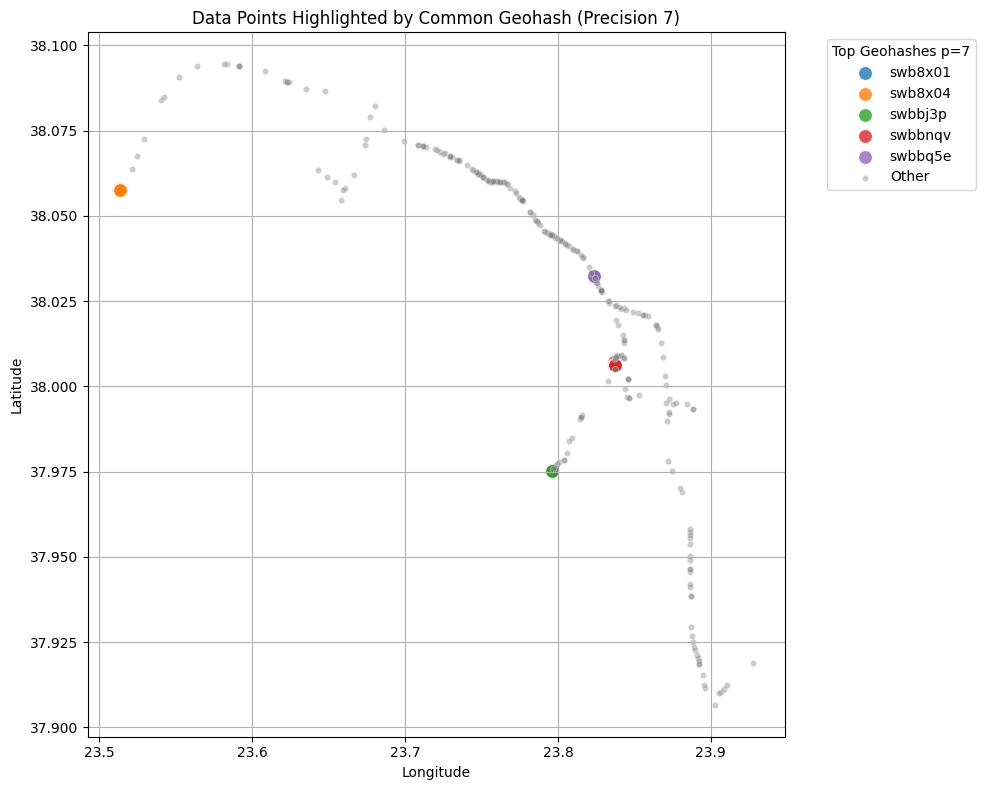

In [ ]:
# Assuming GEOHASH_PRECISION is defined (e.g., GEOHASH_PRECISION = 7)
if f'geohash_p{GEOHASH_PRECISION}' in sample_df.columns:
    plt.figure(figsize=(10, 8))

    # Option 1: Scatter plot colored by Geohash (can be cluttered)
    # sns.scatterplot(data=sample_df, x='lng', y='lat', hue=f'geohash_p{GEOHASH_PRECISION}',
    #                 s=50, alpha=0.7, palette='viridis', legend=False)

    # Option 2: Highlight points for a few common Geohashes
    # Find some common geohashes
    common_geohashes = sample_df[f'geohash_p{GEOHASH_PRECISION}'].value_counts().nlargest(5).index.tolist()
    print(f"Highlighting points for common geohashes: {common_geohashes}")

    for i, gh in enumerate(common_geohashes):
        subset_df = sample_df[sample_df[f'geohash_p{GEOHASH_PRECISION}'] == gh]
        sns.scatterplot(data=subset_df, x='lng', y='lat', s=100, alpha=0.8, label=gh,
                        color=plt.cm.tab10(i % 10)) # Use different colors

    # Plot other points as a background
    other_points_df = sample_df[~sample_df[f'geohash_p{GEOHASH_PRECISION}'].isin(common_geohashes)]
    sns.scatterplot(data=other_points_df, x='lng', y='lat', s=20, alpha=0.4, color='gray', label='Other')

    plt.title(f'Data Points Highlighted by Common Geohash (Precision {GEOHASH_PRECISION})')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.legend(title=f'Top Geohashes p={GEOHASH_PRECISION}', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout() # Adjust layout to make space for legend
    plt.show()

Highlighting points for common segments: ['K_0.0', 'E_30.5', 'A_25.6', 'M_5.3', 'P_6.9']


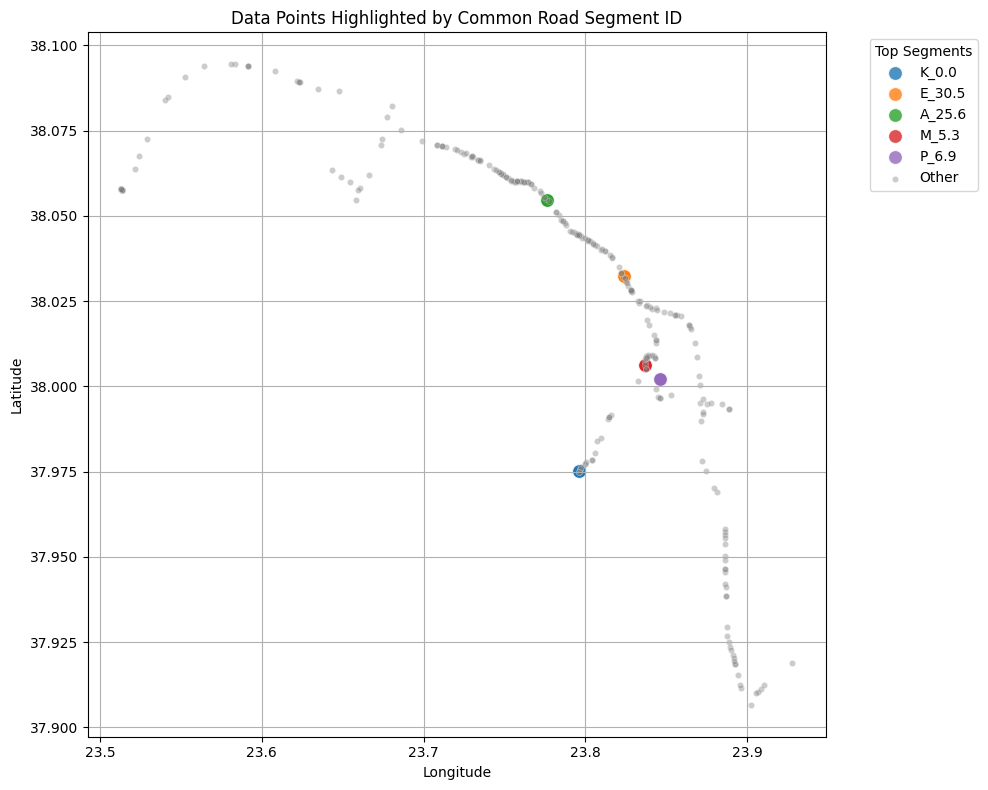

In [ ]:
# Assuming 'segment_id' is the column name created
if 'segment_id' in sample_df.columns:
    plt.figure(figsize=(10, 8))

    # Find some common segment IDs (excluding 'UnknownRoad_UnknownKM' if applicable)
    segment_counts = sample_df['segment_id'].value_counts()
    # Exclude 'UnknownRoad_UnknownKM' and take the next top N
    common_segments = segment_counts[~segment_counts.index.str.contains('Unknown')].nlargest(5).index.tolist()
    print(f"Highlighting points for common segments: {common_segments}")


    for i, segment in enumerate(common_segments):
        subset_df = sample_df[sample_df['segment_id'] == segment]
        sns.scatterplot(data=subset_df, x='lng', y='lat', s=100, alpha=0.8, label=segment,
                        color=plt.cm.tab10(i % 10)) # Use different colors

    # Plot other points as a background
    other_points_df = sample_df[~sample_df['segment_id'].isin(common_segments)]
    sns.scatterplot(data=other_points_df, x='lng', y='lat', s=20, alpha=0.4, color='gray', label='Other')


    plt.title('Data Points Highlighted by Common Road Segment ID')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.legend(title='Top Segments', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

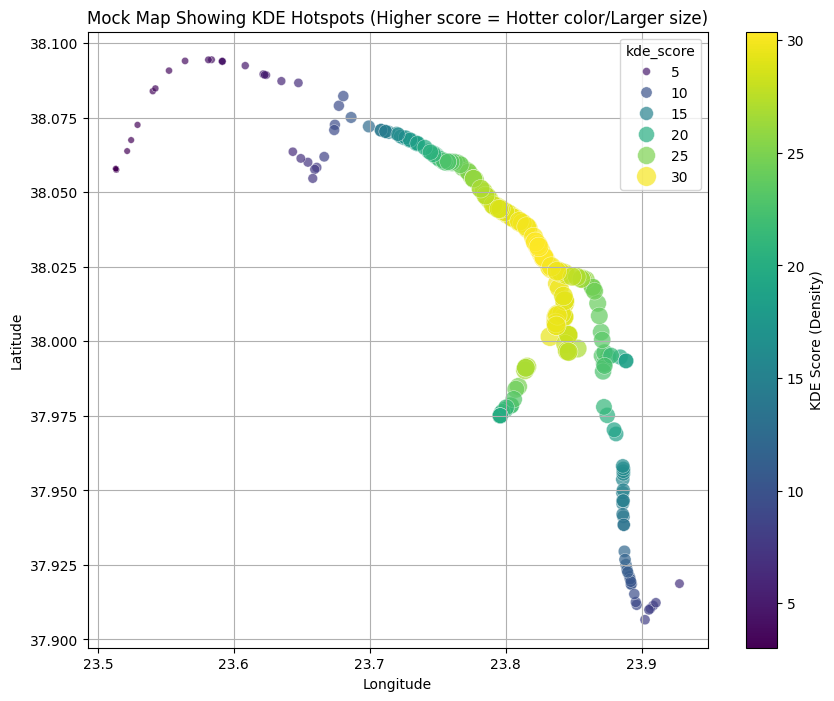

In [ ]:
# Assuming 'kde_score' is available in X_train
if 'kde_score' in X_train.columns:
    plt.figure(figsize=(10, 8))

    # Use a sample again for performance
    sample_df_kde = X_train.sample(n=500, random_state=42).copy() if X_train.shape[0] > 500 else X_train.copy()

    # Plotting with color representing KDE score
    # Use a colormap that shows intensity
    # Get the current axes
    ax = plt.gca()
    scatter = sns.scatterplot(data=sample_df_kde, x='lng', y='lat', hue='kde_score',
                              palette='viridis', # Changed colormap
                              size='kde_score', sizes=(20, 200), # Optional: vary size as well
                              alpha=0.7, legend='brief', ax=ax) # Ensure scatterplot uses the current axes

    plt.title('Mock Map Showing KDE Hotspots (Higher score = Hotter color/Larger size)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)

    # Add a colorbar to explain the KDE score mapping
    norm = plt.Normalize(sample_df_kde['kde_score'].min(), sample_df_kde['kde_score'].max())
    # Make sure the colormap here matches the scatterplot palette
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
    sm.set_array([]) # Dummy array for the colorbar
    # Pass the axes object (ax) to the colorbar function
    plt.colorbar(sm, label='KDE Score (Density)', ax=ax)

    plt.show()

In [ ]:
# Assuming 'segment_id' was created in the previous spatial engineering step
if 'segment_id' in X_train.columns:
    # Calculate the value counts for the 'segment_id' column
    segment_counts = X_train['segment_id'].value_counts()

    # Convert the result to a DataFrame for better display and potential further use
    segment_counts_df = segment_counts.reset_index()

    # Rename the columns for clarity
    segment_counts_df.columns = ['segment_id', 'occurrence_count']

    print("\nOccurrence count for each road segment in X_train:")
    # Display the resulting DataFrame
    display(segment_counts_df)
else:
    print("The 'segment_id' column was not found in X_train. Skipping segment count analysis.")


Occurrence count for each road segment in X_train:


,segment_id,occurrence_count
0,E_EntryZone_Or_UnknownKM,23
1,A_EntryZone_Or_UnknownKM,16
2,K_0.0,6
3,E_30.5,4
4,A_25.6,4
...,...,...
213,E_20.4,1
214,E_22.2,1
215,A_22.6,1
216,E_6.2,1


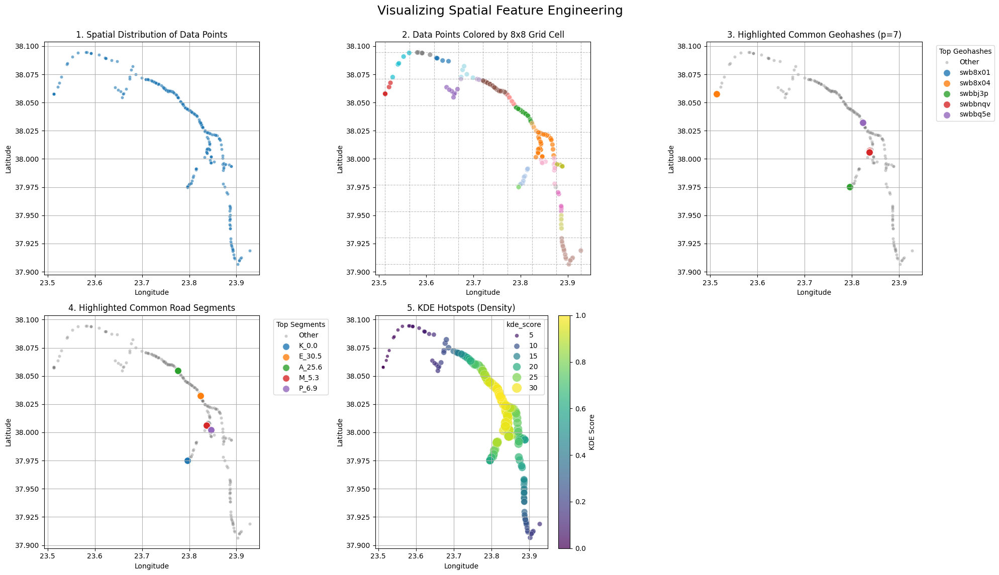

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming X_train has the required columns and spatial features are created
# Use a small sample if the dataset is very large for faster plotting
sample_df = X_train.sample(n=500, random_state=42).copy() if X_train.shape[0] > 500 else X_train.copy()

# Define the layout: 2 rows, 3 columns
n_rows = 2
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12)) # Adjust figsize as needed

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Counter for subplots
plot_index = 0

# --- 1. Base Spatial Distribution ---
ax = axes[plot_index]
sns.scatterplot(data=sample_df, x='lng', y='lat', s=20, alpha=0.6, legend=False, ax=ax)
ax.set_title('1. Spatial Distribution of Data Points')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.grid(True)
plot_index += 1

# --- 2. Grid Cell Discretization ---
# Assuming N_BINS is defined (e.g., N_BINS = 8)
if f'grid_cell_{N_BINS}x{N_BINS}' in sample_df.columns:
    ax = axes[plot_index]
    sns.scatterplot(data=sample_df, x='lng', y='lat', hue=f'grid_cell_{N_BINS}x{N_BINS}',
                    s=50, alpha=0.7, palette='tab20', legend=False, ax=ax)

    # Optional: Overlay grid lines (approximate based on data range)
    min_lat, max_lat = sample_df['lat'].min(), sample_df['lat'].max()
    min_lng, max_lng = sample_df['lng'].min(), sample_df['lng'].max()
    lat_bins = np.linspace(min_lat, max_lat, N_BINS + 1)
    lng_bins = np.linspace(min_lng, max_lng, N_BINS + 1)

    for l in lat_bins:
        ax.axhline(y=l, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
    for l in lng_bins:
        ax.axvline(x=l, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)

    ax.set_title(f'2. Data Points Colored by {N_BINS}x{N_BINS} Grid Cell')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(False)
    plot_index += 1
else:
    print("Skipping Grid Cell plot: Feature not found.")

# --- 3. Geohash Discretization (Highlighting Common) ---
# Assuming GEOHASH_PRECISION is defined (e.g., GEOHASH_PRECISION = 7)
if f'geohash_p{GEOHASH_PRECISION}' in sample_df.columns:
    ax = axes[plot_index]

    # Find some common geohashes
    common_geohashes = sample_df[f'geohash_p{GEOHASH_PRECISION}'].value_counts().nlargest(5).index.tolist()

    # Plot other points as a background
    other_points_df = sample_df[~sample_df[f'geohash_p{GEOHASH_PRECISION}'].isin(common_geohashes)]
    sns.scatterplot(data=other_points_df, x='lng', y='lat', s=20, alpha=0.4, color='gray', label='Other', ax=ax)

    for i, gh in enumerate(common_geohashes):
        subset_df = sample_df[sample_df[f'geohash_p{GEOHASH_PRECISION}'] == gh]
        sns.scatterplot(data=subset_df, x='lng', y='lat', s=100, alpha=0.8, label=gh,
                        color=plt.cm.tab10(i % 10), ax=ax) # Use different colors

    ax.set_title(f'3. Highlighted Common Geohashes (p={GEOHASH_PRECISION})')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # Place legend outside the plot for better readability
    ax.legend(title=f'Top Geohashes', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True)
    plot_index += 1
else:
    print("Skipping Geohash plot: Feature not found.")


# --- 4. Road Segment Discretization (Highlighting Common) ---
# Assuming 'segment_id' is the column name created
if 'segment_id' in sample_df.columns:
    ax = axes[plot_index]

    # Find some common segment IDs (excluding 'UnknownRoad_UnknownKM' if applicable)
    segment_counts = sample_df['segment_id'].value_counts()
    common_segments = segment_counts[~segment_counts.index.str.contains('Unknown')].nlargest(5).index.tolist()

    # Plot other points as a background
    other_points_df = sample_df[~sample_df['segment_id'].isin(common_segments)]
    sns.scatterplot(data=other_points_df, x='lng', y='lat', s=20, alpha=0.4, color='gray', label='Other', ax=ax)

    for i, segment in enumerate(common_segments):
        subset_df = sample_df[sample_df['segment_id'] == segment]
        sns.scatterplot(data=subset_df, x='lng', y='lat', s=100, alpha=0.8, label=segment,
                        color=plt.cm.tab10(i % 10), ax=ax) # Use different colors

    ax.set_title('4. Highlighted Common Road Segments')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # Place legend outside the plot
    ax.legend(title='Top Segments', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True)
    plot_index += 1
else:
    print("Skipping Road Segment plot: Feature not found.")

# --- 5. KDE Hotspots (Mock Map) ---
# Assuming 'kde_score' is available
if 'kde_score' in sample_df.columns:
    ax = axes[plot_index]

    scatter = sns.scatterplot(data=sample_df, x='lng', y='lat', hue='kde_score',
                              palette='viridis', # Example colormap
                              size='kde_score', sizes=(20, 200),
                              alpha=0.7, legend='brief', ax=ax) # Plot on the current axes

    ax.set_title('5. KDE Hotspots (Density)')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(True)

    # Add a colorbar to this specific subplot's axes
    norm = plt.Normalize(sample_df['kde_score'].min(), sample_df['kde_score'].max())
    sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
    sm.set_array([])
    # Specify the axes for the colorbar using the 'ax' argument of scatterplot
    # Or more directly using the mappable as before, but linked to the subplot ax
    fig.colorbar(scatter.collections[0], ax=ax, label='KDE Score') # Use fig.colorbar and link to ax

    plot_index += 1
else:
    print("Skipping KDE plot: Feature not found.")

# --- Remove any unused subplots ---
for j in range(plot_index, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to prevent titles/labels overlapping
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect to make space for suptitle
fig.suptitle('Visualizing Spatial Feature Engineering', fontsize=18, y=0.98) # Add a main title

plt.show()

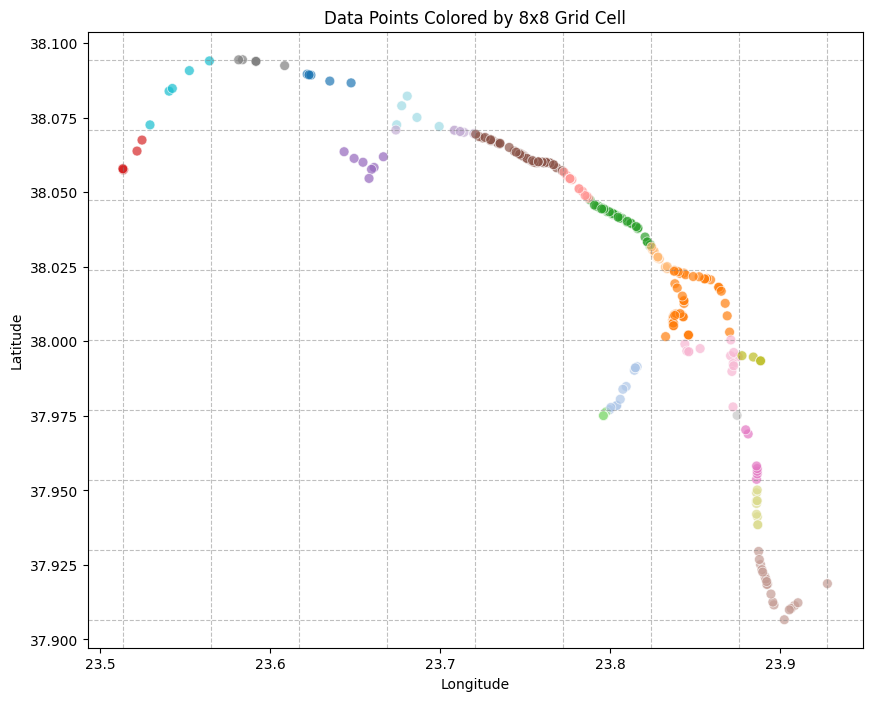

In [ ]:
# Assuming N_BINS is defined (e.g., N_BINS = 8)
if f'grid_cell_{N_BINS}x{N_BINS}' in sample_df.columns:
    plt.figure(figsize=(10, 8))
    # Color-coding points by grid cell
    sns.scatterplot(data=sample_df, x='lng', y='lat', hue=f'grid_cell_{N_BINS}x{N_BINS}',
                    s=50, alpha=0.7, palette='tab20', legend=False) # Use a suitable palette

    # Optional: Overlay grid lines (approximate based on data range)
    min_lat, max_lat = sample_df['lat'].min(), sample_df['lat'].max()
    min_lng, max_lng = sample_df['lng'].min(), sample_df['lng'].max()
    lat_bins = np.linspace(min_lat, max_lat, N_BINS + 1)
    lng_bins = np.linspace(min_lng, max_lng, N_BINS + 1)

    for l in lat_bins:
        plt.axhline(y=l, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
    for l in lng_bins:
        plt.axvline(x=l, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)

    plt.title(f'Data Points Colored by {N_BINS}x{N_BINS} Grid Cell')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(False) # Turn off default grid to avoid clutter
    plt.show()

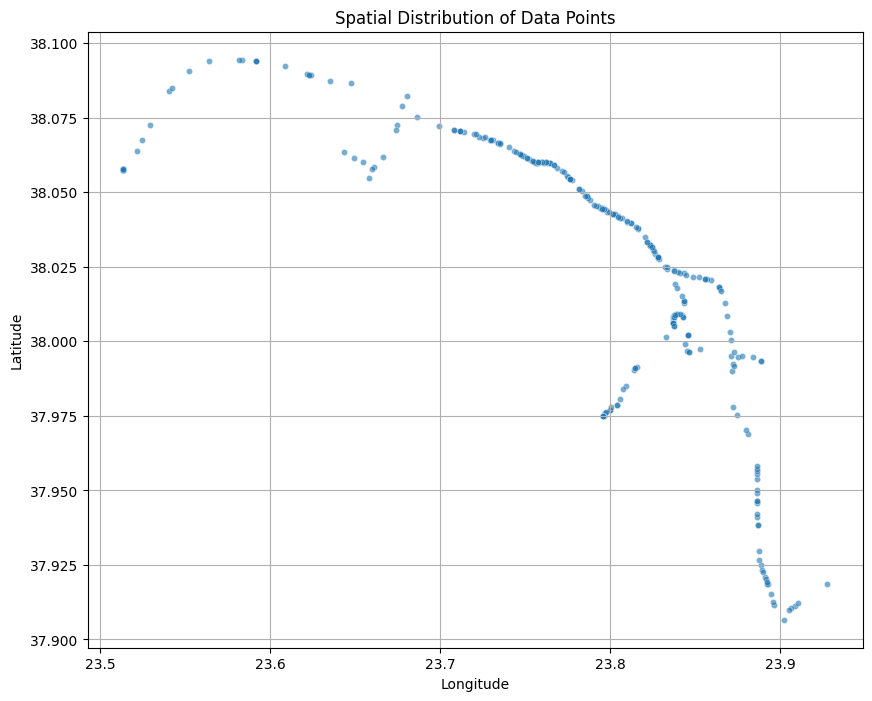

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X_train has the required columns
# Use a small sample if the dataset is very large for faster plotting
sample_df = X_train.sample(n=500, random_state=42) if X_train.shape[0] > 500 else X_train.copy()

plt.figure(figsize=(10, 8))
sns.scatterplot(data=sample_df, x='lng', y='lat', s=20, alpha=0.6, legend=False)
plt.title('Spatial Distribution of Data Points')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

In [ ]:
# X_train, X_val, X_test are your dataframes after spatial features are engineered
columns_to_drop_after_spatial_eng = ['lat', 'lng'] # Add any other raw source columns if needed

X_train = X_train.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_val = X_val.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_test = X_test.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')

print(f"Dropped raw spatial columns: {columns_to_drop_after_spatial_eng}")

Dropped raw spatial columns: ['lat', 'lng']


## pre-processing

In [ ]:
if 'X_train' in locals():
    # Identify feature types AFTER new spatial features are created
    # New categorical features from spatial engineering:
    new_cat_spatial_features = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train.columns: new_cat_spatial_features.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train.columns: new_cat_spatial_features.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'segment_id' in X_train.columns: new_cat_spatial_features.append('segment_id')
    # Add more if you create other categorical spatial features e.g. lat_bin_N, lng_bin_N as separate features

    # New numerical features from spatial engineering:
    new_num_spatial_features = []
    if 'kde_score' in X_train.columns: new_num_spatial_features.append('kde_score')


    all_categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
    # Ensure our new spatial categoricals are included if not automatically detected as object/category
    for f in new_cat_spatial_features:
        if f not in all_categorical_features and f in X_train.columns:
            all_categorical_features.append(f)
            X_train[f] = X_train[f].astype('category') # Ensure correct dtype
            X_val[f] = X_val[f].astype('category')
            X_test[f] = X_test[f].astype('category')


    # Features for 'unknown' imputation (original list)
    categorical_features_unknown_impute = [
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.'# , 'effective_lighting_condition'
    ]
    categorical_features_unknown_impute = [col for col in categorical_features_unknown_impute if col in X_train.columns and col in all_categorical_features]


    # Other categorical features (if any) for 'most_frequent' imputation
    # This will now include new_cat_spatial_features if they are not in the unknown_impute list
    categorical_features_mode_impute = [
        col for col in all_categorical_features if col not in categorical_features_unknown_impute
    ]

    boolean_features = X_train.select_dtypes(include=['bool']).columns.tolist()
    for bf in boolean_features:
        X_train[bf] = X_train[bf].astype(int)
        X_val[bf] = X_val[bf].astype(int)
        X_test[bf] = X_test[bf].astype(int)

    numerical_features = X_train.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    # Ensure our new numerical spatial features are included
    for f in new_num_spatial_features:
        if f not in numerical_features and f in X_train.columns:
            numerical_features.append(f)


    print(f"Final Numerical features for preprocessor: {numerical_features}")
    print(f"Final Categorical features for 'unknown' imputation: {categorical_features_unknown_impute}")
    print(f"Final Categorical features for 'most_frequent' imputation: {categorical_features_mode_impute}")


    # --- The rest of your ColumnTransformer and preprocessing code follows ---
    # Create preprocessing pipelines (as you had before)
    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    categorical_pipeline_unknown = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    categorical_pipeline_mode = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')), # New spatial categoricals (grid_cell, geohash) usually don't have NaNs if created properly
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    transformers_list = []
    if numerical_features: # Add only if list is not empty
         transformers_list.append(('num', numerical_pipeline, numerical_features))
    if categorical_features_unknown_impute:
        transformers_list.append(('cat_unknown', categorical_pipeline_unknown, categorical_features_unknown_impute))
    if categorical_features_mode_impute:
        transformers_list.append(('cat_mode', categorical_pipeline_mode, categorical_features_mode_impute))

    preprocessor = ColumnTransformer(
        transformers=transformers_list,
        remainder='passthrough'
    )

    # Fit and transform (as you had before)
    # ... your existing code for fitting preprocessor and creating X_train_processed_df ...
    # (No changes needed to that part if the feature lists fed into ColumnTransformer are correct)
    # Fit preprocessor on X_train and transform all sets
    X_train_processed = preprocessor.fit_transform(X_train)
    X_val_processed = preprocessor.transform(X_val)
    X_test_processed = preprocessor.transform(X_test)

    # Get feature names after one-hot encoding for RFE and interpretation
    try:
        feature_names_out = preprocessor.get_feature_names_out()
        X_train_processed_df = pd.DataFrame(X_train_processed, columns=feature_names_out, index=X_train.index)
        X_val_processed_df = pd.DataFrame(X_val_processed, columns=feature_names_out, index=X_val.index)
        X_test_processed_df = pd.DataFrame(X_test_processed, columns=feature_names_out, index=X_test.index)
        print(f"Processed training data shape: {X_train_processed_df.shape}")
    except Exception as e:
        print(f"Could not get feature names from preprocessor automatically: {e}")
        X_train_processed_df = pd.DataFrame(X_train_processed, index=X_train.index)
        X_val_processed_df = pd.DataFrame(X_val_processed, index=X_val.index)
        X_test_processed_df = pd.DataFrame(X_test_processed, index=X_test.index)
        feature_names_out = X_train_processed_df.columns.astype(str)
        print(f"Processed training data shape (generic column names): {X_train_processed_df.shape}")

Final Numerical features for preprocessor: ['num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.', 'lat_bin_8', 'lng_bin_8', 'kde_score']
Final Categorical features for 'unknown' imputation: ['ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.']
Final Categorical features for 'most_frequent' imputation: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'effective_lighting_condition', 'segment_id', 'grid_cell_8x8', 'geohash_p7']
Processed training data shape: (313, 678)


## feature realtionship analysis

### we will use filter methods:
- numerical vs target: ANOVA f-statistic, mutual information
- categorical vs target: x^2, mutual information

## and check for colinearity using the correlation matrix and VIF for post ohe


Mutual Information Scores (Top 15):
cat_mode__segment_id_E_10.1         0.090041
cat_mode__segment_id_P_9.9          0.082304
num__has_ΔΙΚΥΚΛΟ                    0.080853
cat_mode__ΣΗΡΑΓΓΑ_ΒΡΙΛΗΣΣΙΩΝ - Ε    0.078321
cat_mode__ΧΙΛ.ΘΕΣΗ_34.7             0.073277
cat_mode__ΧΙΛ.ΘΕΣΗ_28.6             0.072103
cat_mode__ΧΙΛ.ΘΕΣΗ_27.6             0.069662
cat_mode__ΧΙΛ.ΘΕΣΗ_3.8              0.068154
cat_mode__ΧΙΛ.ΘΕΣΗ_21.7             0.066102
cat_mode__ΧΙΛ.ΘΕΣΗ_29.0             0.065481
cat_mode__segment_id_P_8.3          0.064195
cat_mode__geohash_p7_swbbq4x        0.063007
cat_mode__ΧΙΛ.ΘΕΣΗ_2.2              0.062712
cat_mode__segment_id_A_27.5         0.062432
cat_mode__ΧΙΛ.ΘΕΣΗ_5.1              0.062157
dtype: float64


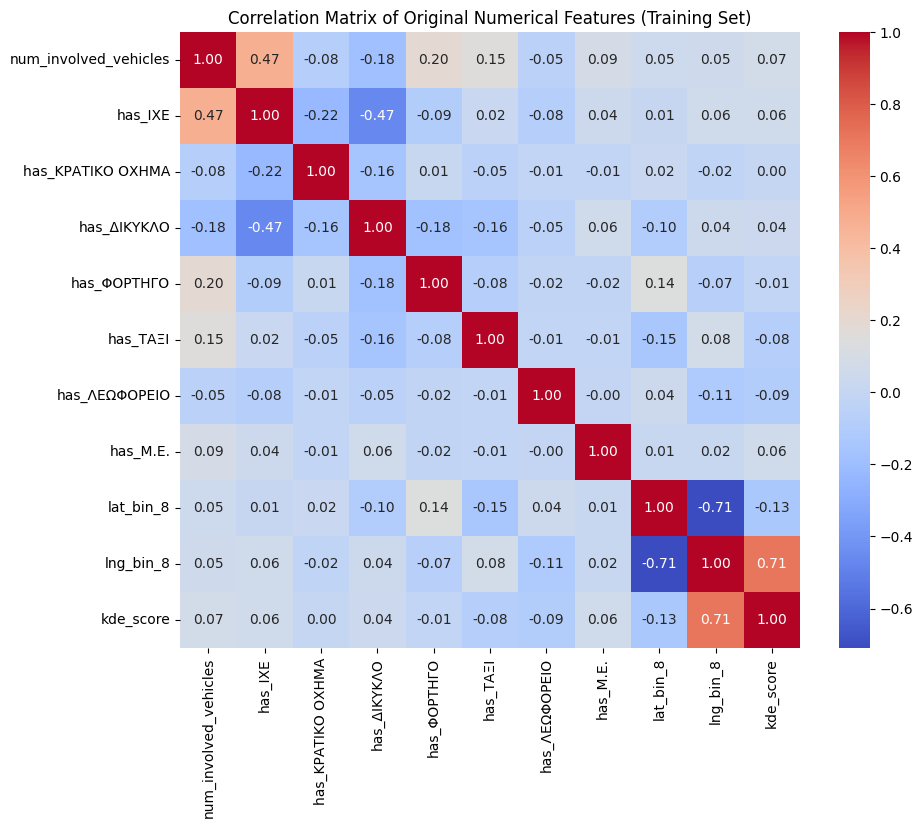

In [ ]:
if 'X_train_processed_df' in locals():
    # Note: For filter methods, it's often better to use them on data *before* extensive transformations
    # if the transformations obscure original relationships (e.g. scaling for chi2).
    # However, for simplicity here, we use the processed data.
    # Ensure all data is non-negative for chi2 if applicable
    # For mutual_info_classif and f_classif, current processed data is fine.

    # Mutual Information (works for both num and cat (post-OHE))
    mi_scores = mutual_info_classif(X_train_processed_df, y_train, random_state=42)
    mi_series = pd.Series(mi_scores, index=feature_names_out).sort_values(ascending=False)
    print("\nMutual Information Scores (Top 15):")
    print(mi_series.head(15))

    # Correlation (for numerical features in X_train_processed_df - identify them again)
    # This is more complex with OHE. For now, let's skip detailed VIF on OHE.
    # A simple correlation heatmap on the original numerical features can be insightful:
    if len(numerical_features) > 1:
        plt.figure(figsize=(10, 8))
        sns.heatmap(X_train[numerical_features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
        plt.title("Correlation Matrix of Original Numerical Features (Training Set)")
        plt.show()


## recursive feature elimination

In [ ]:
if 'X_train_processed_df' in locals():
    estimator_rfe = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)
    # Decide on number of features to select, e.g., half or a fixed number
    num_features_to_select = max(5, X_train_processed_df.shape[1] // 2) # Example: select half, but at least 5

    rfe = RFE(estimator=estimator_rfe, n_features_to_select=num_features_to_select, step=1)
    rfe.fit(X_train_processed_df, y_train)

    selected_features_rfe_mask = rfe.support_
    selected_features_rfe = X_train_processed_df.columns[selected_features_rfe_mask]
    print(f"\nSelected features from RFE ({len(selected_features_rfe)}):")
    print(selected_features_rfe.tolist())

    # Update X_train_processed_df and X_val_processed_df for this iteration
    X_train_iter_final = X_train_processed_df[selected_features_rfe]
    X_val_iter_final = X_val_processed_df[selected_features_rfe]
    X_test_iter_final = X_test_processed_df[selected_features_rfe] # Also transform test set
else:
    print("Skipping RFE as processed data is not available.")
    # Fallback if RFE was skipped
    if 'X_train_processed_df' in locals():
        X_train_iter_final = X_train_processed_df.copy()
        X_val_iter_final = X_val_processed_df.copy()
        X_test_iter_final = X_test_processed_df.copy()


Selected features from RFE (339):
['num__has_ΔΙΚΥΚΛΟ', 'num__has_ΦΟΡΤΗΓΟ', 'num__has_Μ.Ε.', 'num__lat_bin_8', 'num__lng_bin_8', 'num__kde_score', 'cat_unknown__ΚΑΙΡ._ΣΥΝΘ._ΨΙΛΗ ΒΡΟΧΗ', 'cat_unknown__ΣΥΝΘ._ΟΔ._ΓΛΙΤΣΑ - ΛΑΔΙΑ', 'cat_unknown__ΣΥΝΘ._ΟΔ._ΥΓΡΟ - ΒΡΕΓΜΕΝΟ', 'cat_unknown__ΚΑΤ._ΟΔ._ΑΛΛΗ', 'cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_A', 'cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_B', 'cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_E', 'cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_K', 'cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_M', 'cat_mode__ΧΙΛ.ΘΕΣΗ_0.2', 'cat_mode__ΧΙΛ.ΘΕΣΗ_0.4', 'cat_mode__ΧΙΛ.ΘΕΣΗ_0.5', 'cat_mode__ΧΙΛ.ΘΕΣΗ_0.8', 'cat_mode__ΧΙΛ.ΘΕΣΗ_1.1', 'cat_mode__ΧΙΛ.ΘΕΣΗ_10.1', 'cat_mode__ΧΙΛ.ΘΕΣΗ_11.5', 'cat_mode__ΧΙΛ.ΘΕΣΗ_16.0', 'cat_mode__ΧΙΛ.ΘΕΣΗ_17.2', 'cat_mode__ΧΙΛ.ΘΕΣΗ_18.5', 'cat_mode__ΧΙΛ.ΘΕΣΗ_19.5', 'cat_mode__ΧΙΛ.ΘΕΣΗ_19.6', 'cat_mode__ΧΙΛ.ΘΕΣΗ_19.8', 'cat_mode__ΧΙΛ.ΘΕΣΗ_2.2', 'cat_mode__ΧΙΛ.ΘΕΣΗ_2.6', 'cat_mode__ΧΙΛ.ΘΕΣΗ_20.3', 'cat_mode__ΧΙΛ.ΘΕΣΗ_20.6', 'cat_mode__ΧΙΛ.ΘΕΣΗ_20.8', 'cat_mode__ΧΙΛ.ΘΕΣΗ_20.9', 'cat_mode__ΧΙΛ.ΘΕΣΗ_21.2', 'cat_mode__ΧΙΛ.ΘΕΣΗ_21.3', 'cat_mode__

## balancing techniuqes

- only applying them to the training set
- experimenting with vairous balancing techniques

In [ ]:
# Previous code: X_train_iter_final, y_train, X_val_iter_final, y_val are defined

resampled_datasets = {} # To store (X_resampled, y_resampled) for each technique

if 'X_train_iter_final' in locals() and X_train_iter_final is not None and y_train is not None:
    print(f"\nOriginal training set shape: {X_train_iter_final.shape}, Original class distribution: {Counter(y_train)}")
    # minority_class_count = Counter(y_train).get(1, 0) # Assuming 1 is the minority class

    # # Store the original (non-resampled) training data as a baseline
    # resampled_datasets['Original'] = (X_train_iter_final.copy(), y_train.copy())

    # # Define samplers
    # samplers = {
    #     "RandomOverSampler": RandomOverSampler(random_state=42),
    #     "SMOTE": None, # Will initialize carefully due to k_neighbors
    #     "ADASYN": None, # Will initialize carefully due to n_neighbors
    #     "TomekLinks": TomekLinks(sampling_strategy='auto', n_jobs=-1), # Undersampling, removes Tomek links
    #     "SMOTETomek": None, # Will initialize carefully
    #     "SMOTEENN": None # Will initialize carefully
    # }

    # # SMOTE and ADASYN require k_neighbors (or n_neighbors for ADASYN) < minority_class_count
    # if minority_class_count > 1:
    #     k_val = min(4, minority_class_count - 1) # A common heuristic for k, ensuring it's less than minority samples

    #     if k_val > 0 : # Ensure k_val is positive
    #         samplers["SMOTE"] = SMOTE(random_state=42, k_neighbors=k_val)
    #         samplers["ADASYN"] = ADASYN(random_state=42, n_neighbors=k_val) # ADASYN uses n_neighbors
    #         samplers["SMOTETomek"] = SMOTETomek(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), tomek=TomekLinks(sampling_strategy='auto'), n_jobs=-1)
    #         samplers["SMOTEENN"] = SMOTEENN(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), enn=None, n_jobs=-1) # enn default is good
    #     else:
    #         print(f"Skipping SMOTE-based samplers as k_val ({k_val}) would be too small or zero based on minority count ({minority_class_count}).")
    #         # Remove them if they can't be initialized
    #         for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
    #             if key in samplers: samplers.pop(key)

    # else:
    #     print(f"Skipping SMOTE-based samplers as minority count ({minority_class_count}) is <= 1.")
    #     for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
    #         if key in samplers: samplers.pop(key)


    # # Apply each sampler
    # for name, sampler in samplers.items():
    #     if sampler is None: # Sampler was not initialized
    #         continue
    #     print(f"\nApplying {name}...")
    #     try:
    #         X_res, y_res = sampler.fit_resample(X_train_iter_final, y_train)
    #         resampled_datasets[name] = (X_res, y_res)
    #         print(f"Resampled with {name}: X_shape={X_res.shape}, y_dist={Counter(y_res)}")
    #     except Exception as e:
    #         print(f"Could not apply {name}. Error: {e}")
    #         # Optionally store original if sampler fails, or skip
    #         # resampled_datasets[name] = (X_train_iter_final.copy(), y_train.copy())


    if not resampled_datasets: # If all samplers failed or were skipped
        print("No resampling techniques were successfully applied or initialized. Using original data only.")
        if 'Original' not in resampled_datasets: # Should already be there
             resampled_datasets['Original'] = (X_train_iter_final.copy(), y_train.copy())


else:
    print("Skipping balancing as X_train_iter_final or y_train is not available.")
    # Ensure there's at least 'Original' if X_train_iter_final was available
    if 'X_train_iter_final' in locals() and X_train_iter_final is not None and y_train is not None:
        resampled_datasets['Original'] = (X_train_iter_final.copy(), y_train.copy())


Original training set shape: (313, 339), Original class distribution: Counter({0: 161, 1: 152})
No resampling techniques were successfully applied or initialized. Using original data only.


## model training

### we will be training random forest with class_weight balanced, logistic regression, logistic regression with L1 regularization, and xgboost

In [ ]:
trained_models = {} # To store trained models: key will be "ModelName_SamplerName"

if 'resampled_datasets' in locals() and resampled_datasets:
    minority_class_label = 1 # Assuming 'death' is 1
    f1_minority_scorer = make_scorer(f1_score, pos_label=minority_class_label, average='binary') # For CV if you add it later

    for sampler_name, (X_train_curr_resampled, y_train_curr_resampled) in resampled_datasets.items():
        print(f"\n--- Training models on data from: {sampler_name} ---")
        print(f"Training data shape: {X_train_curr_resampled.shape}, Distribution: {Counter(y_train_curr_resampled)}")

        # Define your models here or ensure they are defined from a previous cell
        # Re-initialize models for each dataset to ensure they are fresh

        # Calculate scale_pos_weight for XGBoost based on the current resampled data
        counts_curr = Counter(y_train_curr_resampled)
        scale_pos_weight_curr = counts_curr[0] / counts_curr[1] if counts_curr[1] > 0 else 1

        current_models_definitions = {
            'LogisticRegression': LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_L1': LogisticRegression(solver='liblinear', penalty='l1', random_state=42, class_weight='balanced', max_iter=1000),
            'RandomForest': RandomForestClassifier(random_state=42, class_weight='balanced_subsample', n_estimators=100),
            'XGBoost': xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss',
                                         scale_pos_weight=scale_pos_weight_curr)
        }
        # Note on class_weight='balanced':
        # For 'Original' data (imbalanced), it's useful.
        # For data resampled to be perfectly balanced (e.g., SMOTE to 50/50), class_weight='balanced' might have less effect
        # or could be omitted, but it generally doesn't hurt and can help if balance isn't perfect.

        for model_name, model_instance in current_models_definitions.items():
            full_model_name = f"{model_name}_{sampler_name}"
            print(f"Training {full_model_name}...")
            try:
                model_instance.fit(X_train_curr_resampled, y_train_curr_resampled)
                trained_models[full_model_name] = model_instance
                print(f"{full_model_name} trained.")
            except Exception as e:
                print(f"Could not train {full_model_name}. Error: {e}")
                trained_models[full_model_name] = None # Store None if training failed

else:
    print("Skipping model training as no resampled datasets are available.")


--- Training models on data from: Original ---
Training data shape: (313, 339), Distribution: Counter({0: 161, 1: 152})
Training LogisticRegression_Original...
LogisticRegression_Original trained.
Training LogisticRegression_L1_Original...
LogisticRegression_L1_Original trained.
Training RandomForest_Original...
RandomForest_Original trained.
Training XGBoost_Original...


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:16:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost_Original trained.


## model assessment

In [ ]:
if 'trained_models' in locals() and trained_models and \
   'X_val_iter_final' in locals() and X_val_iter_final is not None and y_val is not None:

    print("\n--- Model Assessment on Validation Set ---")

    # Store results for later comparison if needed
    validation_results = {}

    for full_model_name, model in trained_models.items():
        if model is not None: # Check if model was trained
            print(f"\n--- Assessing: {full_model_name} ---")
            try:
                y_pred_val = model.predict(X_val_iter_final)
                y_proba_val = model.predict_proba(X_val_iter_final)[:, 1] # Probability of positive class

                report = classification_report(y_val, y_pred_val, target_names=['Short (0)', 'Long (1)'], output_dict=True)
                roc_auc = roc_auc_score(y_val, y_proba_val)
                precision_pr, recall_pr, _ = precision_recall_curve(y_val, y_proba_val)
                pr_auc = auc(recall_pr, precision_pr)
                conf_matrix = confusion_matrix(y_val, y_pred_val)

                print(classification_report(y_val, y_pred_val, target_names=['Short (0)', 'Long (1)']))
                print(f"Confusion Matrix:\n{conf_matrix}")
                print(f"ROC AUC: {roc_auc:.4f}")
                print(f"PR AUC: {pr_auc:.4f}")

                # Store results
                validation_results[full_model_name] = {
                    'classification_report': report,
                    'confusion_matrix': conf_matrix.tolist(), # convert numpy array to list for easier storage/JSON
                    'roc_auc': roc_auc,
                    'pr_auc': pr_auc,
                    'f1_long': report.get('Long (1)', {}).get('f1-score', 0), # F1 for minority class
                    'recall_long': report.get('Long (1)', {}).get('recall', 0) # Recall for minority class
                }
            except Exception as e:
                print(f"Could not assess {full_model_name}. Error: {e}")
                validation_results[full_model_name] = {'error': str(e)}
        else:
            print(f"Model {full_model_name} was not trained, skipping assessment.")
            validation_results[full_model_name] = {'error': 'Model not trained'}

    # Optional: Print a summary table of key metrics from validation_results
    if validation_results:
        print("\n--- Validation Results Summary (F1 and Recall for Long class, PR AUC) ---")
        summary_df = pd.DataFrame([
            {'Model_Sampler': name,
             'F1_Long': data.get('f1_long', 'N/A'),
             'Recall_Long': data.get('recall_long', 'N/A'),
             'PR_AUC': data.get('pr_auc', 'N/A'),
             'ROC_AUC': data.get('roc_auc', 'N/A')}
            for name, data in validation_results.items() if 'error' not in data
        ])
        if not summary_df.empty:
            summary_df = summary_df.sort_values(by='F1_Long', ascending=False) # Sort by F1 for death class
            try:
                display(summary_df) # Works well in Colab
            except NameError:
                print(summary_df)
        else:
            print("No valid results to summarize.")


else:
    print("Skipping model assessment: Trained models or validation data are not available.")


--- Model Assessment on Validation Set ---

--- Assessing: LogisticRegression_Original ---
              precision    recall  f1-score   support

   Short (0)       0.63      0.67      0.65        54
    Long (1)       0.62      0.59      0.61        51

    accuracy                           0.63       105
   macro avg       0.63      0.63      0.63       105
weighted avg       0.63      0.63      0.63       105

Confusion Matrix:
[[36 18]
 [21 30]]
ROC AUC: 0.7021
PR AUC: 0.6820

--- Assessing: LogisticRegression_L1_Original ---
              precision    recall  f1-score   support

   Short (0)       0.65      0.69      0.67        54
    Long (1)       0.65      0.61      0.63        51

    accuracy                           0.65       105
   macro avg       0.65      0.65      0.65       105
weighted avg       0.65      0.65      0.65       105

Confusion Matrix:
[[37 17]
 [20 31]]
ROC AUC: 0.7180
PR AUC: 0.6834

--- Assessing: RandomForest_Original ---
              precision  

,Model_Sampler,F1_Long,Recall_Long,PR_AUC,ROC_AUC
1,LogisticRegression_L1_Original,0.626263,0.607843,0.683368,0.718046
0,LogisticRegression_Original,0.606061,0.588235,0.682038,0.702070
3,XGBoost_Original,0.516129,0.470588,0.615316,0.644880
2,RandomForest_Original,0.494382,0.431373,0.606112,0.632171


## error analysis on validation set misclassification

In [ ]:
import pandas as pd # Ensure pandas is imported

# --- Helper Function for Error Analysis ---
def perform_detailed_error_analysis(model_name, model,
                                    X_val_processed_features, y_true_labels,
                                    X_val_original_features,
                                    target_class_name='Long', positive_label=1, negative_label=0):
    """
    Performs detailed error analysis for a given model.

    Args:
        model_name (str): Name of the model (e.g., "XGBoost_SMOTE").
        model (estimator): The trained model object.
        X_val_processed_features (pd.DataFrame or np.array): Processed features for prediction.
        y_true_labels (pd.Series): True labels.
        X_val_original_features (pd.DataFrame): Original, interpretable features for analysis.
                                               Must have the same index as y_true_labels.
        target_class_name (str): Name of the positive class for reporting.
        positive_label (int): Label for the positive class.
        negative_label (int): Label for the negative class.
    """
    print(f"\n--- Detailed Error Analysis for: {model_name} ---")

    if model is None:
        print("Model is None, skipping analysis.")
        return

    # Make predictions
    y_pred = model.predict(X_val_processed_features)

    # Ensure indices match for proper alignment
    if not X_val_original_features.index.equals(y_true_labels.index):
        print("Error: Indices of X_val_original_features and y_true_labels do not match!")
        # Attempt to reindex X_val_original_features based on y_true_labels's index if shapes match
        if len(X_val_original_features) == len(y_true_labels):
            print("Attempting to reindex X_val_original_features...")
            X_val_original_features = X_val_original_features.reindex(y_true_labels.index)
            if not X_val_original_features.index.equals(y_true_labels.index):
                 print("Reindexing failed. Please ensure indices are aligned before calling this function.")
                 return
        else:
            print("Cannot reindex due to different lengths. Please ensure indices are aligned.")
            return


    # Create a DataFrame with true labels, predicted labels, and original features
    # It's crucial that X_val_original_features has an index that aligns with y_true_labels
    analysis_df = X_val_original_features.copy()
    analysis_df['actual_duration'] = y_true_labels
    analysis_df['predicted_duration'] = y_pred

    # Identify TP, FP, TN, FN for the positive class (Long)
    # True Positives (TP): Correctly predicted Long
    tp_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == positive_label)]
    # False Positives (FP): Predicted Long, but was Short (Type I error for Long class)
    fp_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == positive_label)]
    # False Negatives (FN): Predicted Short, but was Long (Type II error for Long class - CRITICAL)
    fn_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == negative_label)]
    # True Negatives (TN): Correctly predicted Short
    tn_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == negative_label)]

    print(f"\nTotal cases in validation: {len(analysis_df)}")
    print(f"Actual {target_class_name}s ({positive_label}): {sum(y_true_labels == positive_label)}")
    print(f"Predicted {target_class_name}s ({positive_label}): {sum(y_pred == positive_label)}")

    print(f"\n--- {target_class_name} Class ---")
    print(f"True Positives (TP - Correctly predicted {target_class_name}): {len(tp_data)}")
    if not tp_data.empty:
        print(f"Characteristics of TPs for {target_class_name}:")
        try:
            display(tp_data.describe(include='all').transpose())
            # Value counts for key categoricals (adjust column names as needed)
            for col in ['ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'segment_id', 'geohash_p7', 'grid_cell_8x8']: # Example columns
                if col in tp_data.columns:
                    print(f"\nValue counts for '{col}' in TPs:")
                    display(tp_data[col].value_counts(normalize=True).head())
        except Exception as e:
            print(f"Could not display describe/value_counts for TPs: {e}")


    print(f"\nFalse Negatives (FN - Missed {target_class_name}s - Predicted Short): {len(fn_data)}")
    if not fn_data.empty:
        print(f"Characteristics of FNs for {target_class_name} (Actual {target_class_name}, Predicted Short):")
        try:
            display(fn_data.describe(include='all').transpose())
            for col in ['ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'segment_id', 'geohash_p7', 'grid_cell_8x8', 'hour_group', 'is_weekend', 'num_involved_vehicles']: # Example columns
                if col in fn_data.columns:
                    print(f"\nValue counts for '{col}' in FNs:")
                    display(fn_data[col].value_counts(normalize=True).head())
        except Exception as e:
            print(f"Could not display describe/value_counts for FNs: {e}")


    print(f"\nFalse Positives (FP - Incorrectly predicted {target_class_name} - Was Short): {len(fp_data)}")
    if not fp_data.empty:
        print(f"Characteristics of FPs for {target_class_name} (Actual Short, Predicted {target_class_name}):")
        try:
            display(fp_data.describe(include='all').transpose())
            for col in ['ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'segment_id', 'geohash_p7', 'grid_cell_8x8', 'hour_group', 'is_weekend', 'num_involved_vehicles']: # Example columns
                if col in fp_data.columns:
                    print(f"\nValue counts for '{col}' in FPs:")
                    display(fp_data[col].value_counts(normalize=True).head())
        except Exception as e:
            print(f"Could not display describe/value_counts for FPs: {e}")

    # You can also print a few full examples of FN and FP cases
    if not fn_data.empty:
        print("\nSample False Negatives (Actual Long, Predicted Short):")
        try:
            display(fn_data.head(min(5, len(fn_data)))) # Display up to 5 FNs
        except Exception as e:
            print(f"Could not display sample FNs: {e}")

    if not fp_data.empty:
        print("\nSample False Positives (Actual Short, Predicted Long):")
        try:
            display(fp_data.head(min(5, len(fp_data)))) # Display up to 5 FPs
        except Exception as e:
            print(f"Could not display sample FPs: {e}")

# --- Specify Models for Analysis ---
models_for_analysis = [
    'LogisticRegression_L1_Original',
]

# --- Run Analysis ---
# Ensure X_val (before processing) is available and has the original feature values for this iteration.
# This X_val should have an index that aligns with y_val.
# If X_val doesn't contain all original features you want to see,
# you might need to use df_original.loc[X_val.index] or df_iterX.loc[X_val.index]
# For this example, let's assume X_val (the DataFrame that was input to the preprocessor for the validation split)
# contains the necessary interpretable features for this iteration.

if 'X_val' in locals() and 'y_val' in locals() and 'X_val_iter_final' in locals() and 'trained_models' in locals():
    # Make sure X_val has the same index as y_val if it's being used directly
    # If X_val was created from X (which was from df_iterX), its index should be fine.

    # We need to ensure the 'X_val_original_features' (which is `X_val` here)
    # has the correct index that matches `y_val`.
    # `X_val` is the data that was split off for validation *before* `ColumnTransformer` processing.
    # Its index should align with `y_val`.

    df_for_error_analysis = X_val.copy() # Use the X_val from the train/val/test split
                                         # This contains the features of the current iteration in their original form.
                                         # Ensure it has all the columns you listed in the 'cols' variable in the function.

    for model_key in models_for_analysis:
        if model_key in trained_models:
            model_object = trained_models[model_key]
            perform_detailed_error_analysis(model_key, model_object,
                                            X_val_iter_final, y_val,
                                            df_for_error_analysis) # Pass the non-processed X_val
        else:
            print(f"Model {model_key} not found in trained_models.")
else:
    print("Required data for error analysis (X_val, y_val, X_val_iter_final, trained_models) not found.")


--- Detailed Error Analysis for: LogisticRegression_L1_Original ---

Total cases in validation: 105
Actual Longs (1): 51
Predicted Longs (1): 48

--- Long Class ---
True Positives (TP - Correctly predicted Long): 31
Characteristics of TPs for Long:


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,31,6,A,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΧΙΛ.ΘΕΣΗ,31,27,0.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΣΗΡΑΓΓΑ,31,2,no_ΣΗΡΑΓΓΑ,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΥΠΟΚΑΤΗΓΟΡΙΑ,31,11,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΘΕΣΗ_ΕΡΓΟΥ,31,2,ΟΧΙ,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΚΑΙΡ._ΣΥΝΘ.,31,2,ΚΑΛΟΚΑΙΡΙΑ,29,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΣΥΝΘ._ΟΔ.,31,2,ΚΑΝΟΝΙΚΕΣ,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΚΑΤ._ΟΔ.,31,1,ΚΑΝΟΝΙΚΗ,31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΤΕΧΝ._ΦΩΤ.,12,1,ΕΠΑΡΚΗΣ,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_involved_vehicles,31.0,NaN,NaN,NaN,2.096774,1.011759,1.0,1.5,2.0,2.5,6.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in TPs:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.290323
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.193548
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.096774
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.096774
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.096774



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in TPs:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.935484
ΒΡΟΧΗ,0.064516



Value counts for 'ΣΥΝΘ._ΟΔ.' in TPs:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.903226
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.096774



Value counts for 'segment_id' in TPs:


,proportion
segment_id,
A_EntryZone_Or_UnknownKM,0.064516
E_24.0,0.064516
A_23.4,0.032258
E_1.6,0.032258
A_24.4,0.032258



Value counts for 'geohash_p7' in TPs:


,proportion
geohash_p7,
swbbs8t,0.096774
swb8x04,0.064516
swbbs88,0.032258
swbbsb8,0.032258
swbbmug,0.032258



Value counts for 'grid_cell_8x8' in TPs:


,proportion
grid_cell_8x8,
6_4,0.161290
5_5,0.161290
6_0,0.129032
0_7,0.129032
7_3,0.096774



False Negatives (FN - Missed Longs - Predicted Short): 20
Characteristics of FNs for Long (Actual Long, Predicted Short):


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,20,6,E,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΧΙΛ.ΘΕΣΗ,20,15,0.0,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΣΗΡΑΓΓΑ,20,1,no_ΣΗΡΑΓΓΑ,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΥΠΟΚΑΤΗΓΟΡΙΑ,20,8,4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΘΕΣΗ_ΕΡΓΟΥ,20,1,ΟΧΙ,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΚΑΙΡ._ΣΥΝΘ.,19,1,ΚΑΛΟΚΑΙΡΙΑ,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΣΥΝΘ._ΟΔ.,19,2,ΚΑΝΟΝΙΚΕΣ,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΚΑΤ._ΟΔ.,19,1,ΚΑΝΟΝΙΚΗ,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΤΕΧΝ._ΦΩΤ.,3,1,ΕΠΑΡΚΗΣ,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_involved_vehicles,20.0,NaN,NaN,NaN,1.9,1.071153,1.0,1.0,2.0,2.0,4.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FNs:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.25
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.20
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.15
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.15
4D.Υ - ΣΥΓΚΡΟΥΣΗ 4 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.10



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FNs:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,1.0



Value counts for 'ΣΥΝΘ._ΟΔ.' in FNs:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.894737
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.105263



Value counts for 'segment_id' in FNs:


,proportion
segment_id,
E_EntryZone_Or_UnknownKM,0.25
B_5.6,0.05
E_23.9,0.05
E_22.9,0.05
M_5.2,0.05



Value counts for 'geohash_p7' in FNs:


,proportion
geohash_p7,
swb8x01,0.25
swbbnrj,0.05
swbbs8s,0.05
swbbs3h,0.05
swbbnqt,0.05



Value counts for 'grid_cell_8x8' in FNs:


,proportion
grid_cell_8x8,
4_6,0.25
6_0,0.25
6_4,0.15
3_6,0.10
2_5,0.05



Value counts for 'num_involved_vehicles' in FNs:


,proportion
num_involved_vehicles,
1,0.45
2,0.35
4,0.15
3,0.05



False Positives (FP - Incorrectly predicted Long - Was Short): 17
Characteristics of FPs for Long (Actual Short, Predicted Long):


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,17,2,A,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΧΙΛ.ΘΕΣΗ,17,15,0.0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΣΗΡΑΓΓΑ,17,1,no_ΣΗΡΑΓΓΑ,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΥΠΟΚΑΤΗΓΟΡΙΑ,17,7,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΘΕΣΗ_ΕΡΓΟΥ,17,1,ΟΧΙ,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΚΑΙΡ._ΣΥΝΘ.,16,2,ΚΑΛΟΚΑΙΡΙΑ,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΣΥΝΘ._ΟΔ.,16,2,ΚΑΝΟΝΙΚΕΣ,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΚΑΤ._ΟΔ.,15,1,ΚΑΝΟΝΙΚΗ,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ΤΕΧΝ._ΦΩΤ.,5,1,ΕΠΑΡΚΗΣ,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num_involved_vehicles,17.0,NaN,NaN,NaN,1.941176,0.658653,1.0,2.0,2.0,2.0,3.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FPs:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.235294
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.235294
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.176471
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.117647
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.117647



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FPs:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.9375
ΨΙΛΗ ΒΡΟΧΗ,0.0625



Value counts for 'ΣΥΝΘ._ΟΔ.' in FPs:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.8125
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.1875



Value counts for 'segment_id' in FPs:


,proportion
segment_id,
A_EntryZone_Or_UnknownKM,0.117647
E_28.9,0.117647
E_41.9,0.058824
A_27.8,0.058824
A_42.5,0.058824



Value counts for 'geohash_p7' in FPs:


,proportion
geohash_p7,
swb8x04,0.117647
swbbmv1,0.117647
sw8zztc,0.058824
swbbmt8,0.058824
sw8zzsc,0.058824



Value counts for 'grid_cell_8x8' in FPs:


,proportion
grid_cell_8x8,
5_5,0.235294
6_4,0.176471
6_0,0.117647
2_7,0.117647
6_5,0.117647



Value counts for 'num_involved_vehicles' in FPs:


,proportion
num_involved_vehicles,
2,0.588235
1,0.235294
3,0.176471



Sample False Negatives (Actual Long, Predicted Short):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,has_Μ.Ε.,effective_lighting_condition,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration
105,B,5.6,no_ΣΗΡΑΓΓΑ,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,1,...,0,Night - Artificial Lighting Sufficient (Manual),B_5.6,4,6,4_6,swbbnrj,29.700874,1,0
248,E,0.0,no_ΣΗΡΑΓΓΑ,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,0,Daylight - Assumed Sufficient (No Manual Entry),E_EntryZone_Or_UnknownKM,6,0,6_0,swb8x01,3.021825,1,0
298,E,0.0,no_ΣΗΡΑΓΓΑ,4D.Υ - ΣΥΓΚΡΟΥΣΗ 4 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,4,...,0,Daylight - Assumed Sufficient (No Manual Entry),E_EntryZone_Or_UnknownKM,6,0,6_0,swb8x01,3.021825,1,0
235,E,23.9,no_ΣΗΡΑΓΓΑ,4D.Υ - ΣΥΓΚΡΟΥΣΗ 4 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,4,...,0,Daylight - Assumed Sufficient (No Manual Entry),E_23.9,6,4,6_4,swbbs8s,23.032129,1,0
521,E,22.9,no_ΣΗΡΑΓΓΑ,4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,0,Daylight - Assumed Sufficient (No Manual Entry),E_22.9,6,4,6_4,swbbs3h,21.124987,1,0



Sample False Positives (Actual Short, Predicted Long):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,has_Μ.Ε.,effective_lighting_condition,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration
111,E,41.9,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,Daylight - Assumed Sufficient (No Manual Entry),E_41.9,2,7,2_7,sw8zztc,16.095431,0,1
400,A,41.3,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,0,Daylight - Assumed Sufficient (No Manual Entry),A_41.3,2,7,2_7,sw8zzwb,16.938100,0,1
167,A,0.0,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,Daylight - Assumed Sufficient (No Manual Entry),A_EntryZone_Or_UnknownKM,6,0,6_0,swb8x04,3.025096,0,1
26,A,27.8,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,NaN,NaN,NaN,NaN,2,...,0,Daylight - Assumed Sufficient (No Manual Entry),A_27.8,5,5,5_5,swbbmt8,29.031336,0,1
13,A,42.5,no_ΣΗΡΑΓΓΑ,4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,1,...,0,Night - Artificial Lighting Sufficient (Manual),A_42.5,1,7,1_7,sw8zzsc,15.434689,0,1


# Iteration 2

## definition of target variable

In [ ]:
df_original = df.copy()

import pandas as pd
import numpy as np

# Assuming 'df_original' is your DataFrame and it's already loaded
# as per your previous code snippet.

if df_original is not None and 'duration_minutes' in df_original.columns:
    # --- 1. Calculate the Median Threshold ---
    median_duration = df_original['duration_minutes'].median()
    print(f"Calculated Median Duration (threshold): {median_duration:.2f} minutes")

    # --- 2. Create the Binary Target Variable 'duration_long_accident' ---
    # 1 if duration_minutes > median_duration, 0 otherwise
    df_original['duration_long_accident'] = np.where(df_original['duration_minutes'] > median_duration, 1, 0)

    print("\n--- Target Variable Distribution ('duration_long_accident' based on Median) ---")
    print(df_original['duration_long_accident'].value_counts(normalize=True))
    print("\nValue Counts:")
    print(df_original['duration_long_accident'].value_counts())

    # Display the first few rows with the new column
    print("\n--- DataFrame Head with new 'duration_long_accident' column ---")
    # Using display() if in a Jupyter/Colab environment, otherwise print()
    try:
        display(df_original[['duration_minutes', 'duration_long_accident']].head())
    except NameError: # display is not defined (e.g., running in a standard Python script)
        print(df_original[['duration_minutes', 'duration_long_accident']].head())

else:
    if df_original is None:
        print("DataFrame 'df_original' was not loaded. Cannot create target variable.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame 'df_original'.")
        print(f"Available columns are: {df_original.columns.tolist()}")

Calculated Median Duration (threshold): 56.00 minutes

--- Target Variable Distribution ('duration_long_accident' based on Median) ---
duration_long_accident
0    0.51434
1    0.48566
Name: proportion, dtype: float64

Value Counts:
duration_long_accident
0    269
1    254
Name: count, dtype: int64

--- DataFrame Head with new 'duration_long_accident' column ---


,duration_minutes,duration_long_accident
0,43.0,0
1,106.0,1
2,66.0,1
3,20.0,0
4,65.0,1


## definition of new columns based on the error analysis of the previous iteration

In [ ]:
# Assuming 'df_original' is your DataFrame and 'duration_long_accident' is created.
# Also assuming relevant columns like 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ',
# 'num_involved_vehicles', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.' exist and are correctly populated.

print("\n--- Creating New Features ---")

# 1. is_motorcycle_accident_no_truck
df_original['is_motorcycle_accident_no_truck'] = (
    (df_original['has_ΔΙΚΥΚΛΟ'] == True) &
    (df_original['has_ΦΟΡΤΗΓΟ'] == False)
).astype(int)
print("Created 'is_motorcycle_accident_no_truck'")

# 2. is_single_vehicle_no_truck_good_weather
# Assuming 'ΚΑΛΟΚΑΙΡΙΑ' is the value for good weather in 'ΚΑΙΡ._ΣΥΝΘ.'
df_original['is_single_vehicle_no_truck_good_weather'] = (
    (df_original['num_involved_vehicles'] == 1) &
    (df_original['has_ΦΟΡΤΗΓΟ'] == False) &
    (df_original['ΚΑΙΡ._ΣΥΝΘ.'] == 'ΚΑΛΟΚΑΙΡΙΑ')
).astype(int)
print("Created 'is_single_vehicle_no_truck_good_weather'")

# 3. is_truck_involved_but_minor_indicators
# Defining "minor indicators" as good weather and normal road conditions.
# You might refine "minor indicators" further, e.g., by also checking num_involved_vehicles.
# Assuming 'ΚΑΛΟΚΑΙΡΙΑ' for good weather and 'ΚΑΝΟΝΙΚΕΣ' for normal road conditions.
df_original['is_truck_involved_but_minor_indicators'] = (
    (df_original['has_ΦΟΡΤΗΓΟ'] == True) &
    (df_original['ΚΑΙΡ._ΣΥΝΘ.'] == 'ΚΑΛΟΚΑΙΡΙΑ') &
    (df_original['ΣΥΝΘ._ΟΔ.'] == 'ΚΑΝΟΝΙΚΕΣ')
    # Potentially add: & (df_original['num_involved_vehicles'] <= 2)
).astype(int)
print("Created 'is_truck_involved_but_minor_indicators'")

# 4. is_multi_vehicle_pileup_on_wet_road
# Defining "multi-vehicle pileup" as num_involved_vehicles >= 3
# Assuming 'ΥΓΡΟ - ΒΡΕΓΜΕΝΟ' is the value for wet road conditions in 'ΣΥΝΘ._ΟΔ.'
df_original['is_multi_vehicle_pileup_on_wet_road'] = (
    (df_original['num_involved_vehicles'] >= 3) &
    (df_original['ΣΥΝΘ._ΟΔ.'] == 'ΥΓΡΟ - ΒΡΕΓΜΕΝΟ')
).astype(int)
print("Created 'is_multi_vehicle_pileup_on_wet_road'")

print("\n--- Value Counts for New Features ---")
for col in ['is_motorcycle_accident_no_truck',
            'is_single_vehicle_no_truck_good_weather',
            'is_truck_involved_but_minor_indicators',
            'is_multi_vehicle_pileup_on_wet_road']:
    if col in df_original.columns:
        print(f"\nValue counts for {col}:")
        print(df_original[col].value_counts(dropna=False))

# Display the first few rows with the new feature columns (and relevant base columns)
print("\n--- DataFrame Head with New Features ---")
cols_to_show = ['duration_minutes', 'duration_long_accident',
                'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'num_involved_vehicles', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
                'is_motorcycle_accident_no_truck',
                'is_single_vehicle_no_truck_good_weather',
                'is_truck_involved_but_minor_indicators',
                'is_multi_vehicle_pileup_on_wet_road']
# Filter to only show columns that actually exist in df_original to prevent errors
cols_to_show = [col for col in cols_to_show if col in df_original.columns]

try:
    display(df_original[cols_to_show].head())
except NameError:
    print(df_original[cols_to_show].head())


--- Creating New Features ---
Created 'is_motorcycle_accident_no_truck'
Created 'is_single_vehicle_no_truck_good_weather'
Created 'is_truck_involved_but_minor_indicators'
Created 'is_multi_vehicle_pileup_on_wet_road'

--- Value Counts for New Features ---

Value counts for is_motorcycle_accident_no_truck:
is_motorcycle_accident_no_truck
0    287
1    236
Name: count, dtype: int64

Value counts for is_single_vehicle_no_truck_good_weather:
is_single_vehicle_no_truck_good_weather
0    334
1    189
Name: count, dtype: int64

Value counts for is_truck_involved_but_minor_indicators:
is_truck_involved_but_minor_indicators
0    468
1     55
Name: count, dtype: int64

Value counts for is_multi_vehicle_pileup_on_wet_road:
is_multi_vehicle_pileup_on_wet_road
0    517
1      6
Name: count, dtype: int64

--- DataFrame Head with New Features ---


,duration_minutes,duration_long_accident,has_ΔΙΚΥΚΛΟ,has_ΦΟΡΤΗΓΟ,num_involved_vehicles,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,is_motorcycle_accident_no_truck,is_single_vehicle_no_truck_good_weather,is_truck_involved_but_minor_indicators,is_multi_vehicle_pileup_on_wet_road
0,43.0,0,False,False,2,ΚΑΛΟΚΑΙΡΙΑ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0,0,0,0
1,106.0,1,False,False,1,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,0,1,0,0
2,66.0,1,False,False,1,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,0,1,0,0
3,20.0,0,False,False,2,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,0,0,0,0
4,65.0,1,False,False,2,ΨΙΛΗ ΒΡΟΧΗ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0,0,0,0


##  definition of columns

In [ ]:
if df_original is not None:
    columns_iter2 = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ',
        'ΥΠΟΚΑΤΗΓΟΡΙΑ',
        'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
        'ΚΑΤ._ΟΔ.','ΤΕΧΝ._ΦΩΤ.', #'accident_type', # This is now our target or related to it
        'lat', 'lng', 'num_involved_vehicles', 'has_ΙΧΕ',
        'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ',
        'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'duration_long_accident', # Keep the target variable
        'effective_lighting_condition',# replacing ΤΕΧΝ._ΦΩΤ. with effective_lighting_condition
        'is_motorcycle_accident_no_truck',
        'is_single_vehicle_no_truck_good_weather',
        'is_truck_involved_but_minor_indicators',
        'is_multi_vehicle_pileup_on_wet_road'


    ]
    # Ensure all selected columns exist in df_original
    columns_iter2 = [col for col in columns_iter2 if col in df_original.columns]
    if 'duration_long_accident' not in columns_iter2 and 'duration_long_accident' in df_original.columns:
         columns_iter2.append('duration_long_accident')


    df_iter2 = df_original[columns_iter2].copy()
    print(f"\n--- Iteration 2: Working with {len(df_iter2.columns)-1} features ---")
    # display(df_iter1.head())



--- Iteration 2: Working with 24 features ---


## stratified data splitting

In [ ]:
if 'df_iter2' in locals() and df_iter2 is not None:
    X = df_iter2.drop('duration_long_accident', axis=1)
    y = df_iter2['duration_long_accident']

    # Split into Train (60%) and Temp (40% for Val+Test)
    X_train_iter_2, X_temp_iter_2, y_train_iter_2, y_temp_iter_2 = train_test_split(
        X, y, test_size=0.4, random_state=42, stratify=y
    )

    # Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
    X_val_iter_2, X_test_iter_2, y_val_iter_2, y_test_iter_2 = train_test_split(
        X_temp_iter_2, y_temp_iter_2, test_size=0.5, random_state=42, stratify=y_temp_iter_2
    )

    print(f"Training set: {X_train_iter_2.shape}, {y_train_iter_2.shape}, Minority class: {Counter(y_train_iter_2)[1]}")
    print(f"Validation set: {X_val_iter_2.shape}, {y_val_iter_2.shape}, Minority class: {Counter(y_val_iter_2)[1]}")
    print(f"Test set: {X_test_iter_2.shape}, {y_test_iter_2.shape}, Minority class: {Counter(y_test_iter_2)[1]}")


Training set: (313, 24), (313,), Minority class: 152
Validation set: (105, 24), (105,), Minority class: 51
Test set: (105, 24), (105,), Minority class: 51


In [ ]:
X_train_iter_2_for_fitting = X_train_iter_2.copy()
X_test_iter_2_original_from_split = X_test_iter_2.copy() # You likely already do this or similar

print("Saved a pristine copy of X_train_iter_2 (for fitting spatial transforms on val/test) and X_test_iter_2.")


Saved a pristine copy of X_train_iter_2 (for fitting spatial transforms on val/test) and X_test_iter_2.


## data exploration

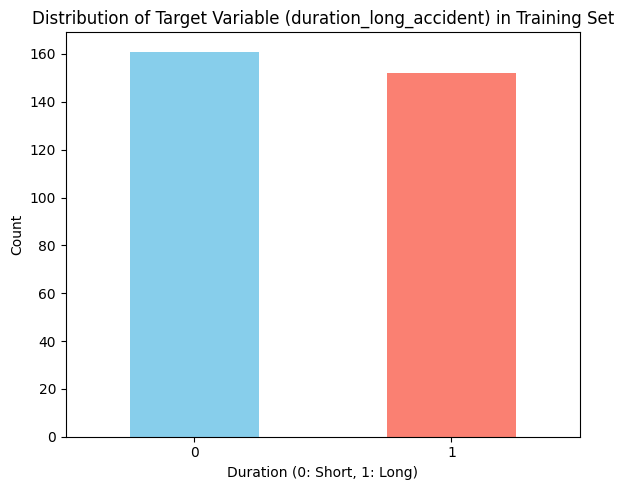

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming y_train is your target variable for the training set
if 'y_train' in locals():
    plt.figure(figsize=(6, 5))
    # Use value_counts to get the counts of each category (0 and 1)
    # sort_index() ensures the bars are in order 0, 1
    y_train.value_counts().sort_index().plot(kind='bar', color=['skyblue', 'salmon'])

    plt.title('Distribution of Target Variable (duration_long_accident) in Training Set')
    plt.xlabel('Duration (0: Short, 1: Long)')
    plt.ylabel('Count')
    plt.xticks(rotation=0) # Keep labels horizontal
    plt.tight_layout() # Adjust layout to prevent labels overlapping
    plt.show()
else:
    print("Target variable y_train not available. Please ensure data splitting was successful.")

Numerical Features: ['ΧΙΛ.ΘΕΣΗ', 'lat', 'lng', 'num_involved_vehicles', 'is_motorcycle_accident_no_truck', 'is_single_vehicle_no_truck_good_weather', 'is_truck_involved_but_minor_indicators', 'is_multi_vehicle_pileup_on_wet_road']
Categorical Features: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', 'effective_lighting_condition']


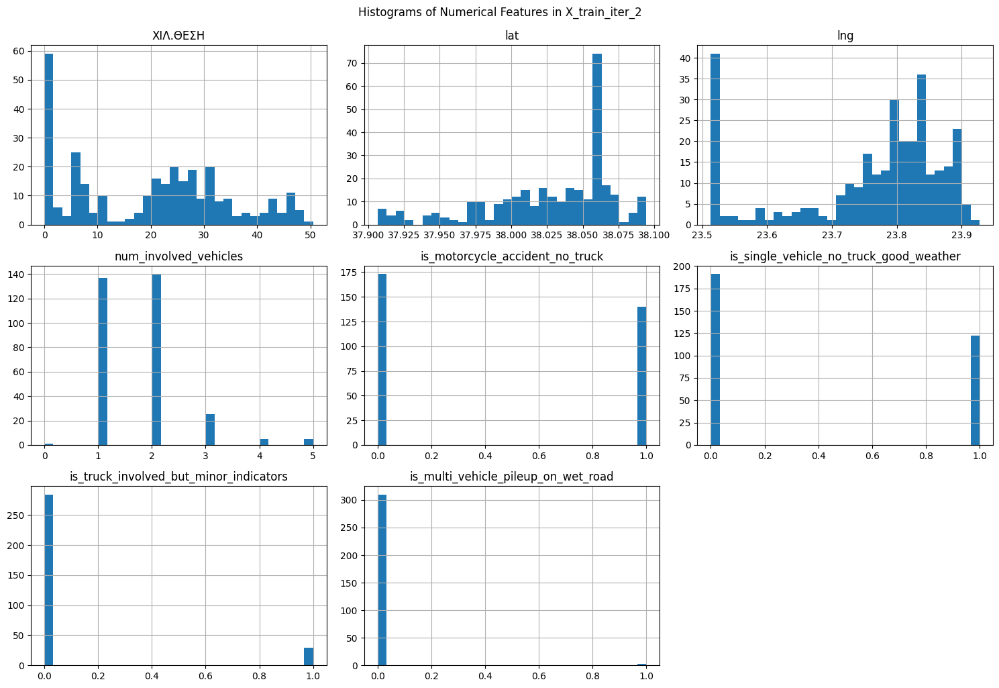

<Figure size 1500x1000 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Separate numerical and categorical features
numerical_features = X_train_iter_2.select_dtypes(include=np.number).columns
categorical_features = X_train_iter_2.select_dtypes(include='object').columns

print("Numerical Features:", list(numerical_features))
print("Categorical Features:", list(categorical_features))

# Analyze distribution of numerical features
if len(numerical_features) > 0:
    X_train_iter_2[numerical_features].hist(bins=30, figsize=(15, 10))
    plt.tight_layout()
    plt.suptitle('Histograms of Numerical Features in X_train_iter_2', y=1.02)
    plt.show()

    plt.figure(figsize=(15, 10))
else:
    print("No numerical features to plot.")


Plotting distribution for standard categorical features...


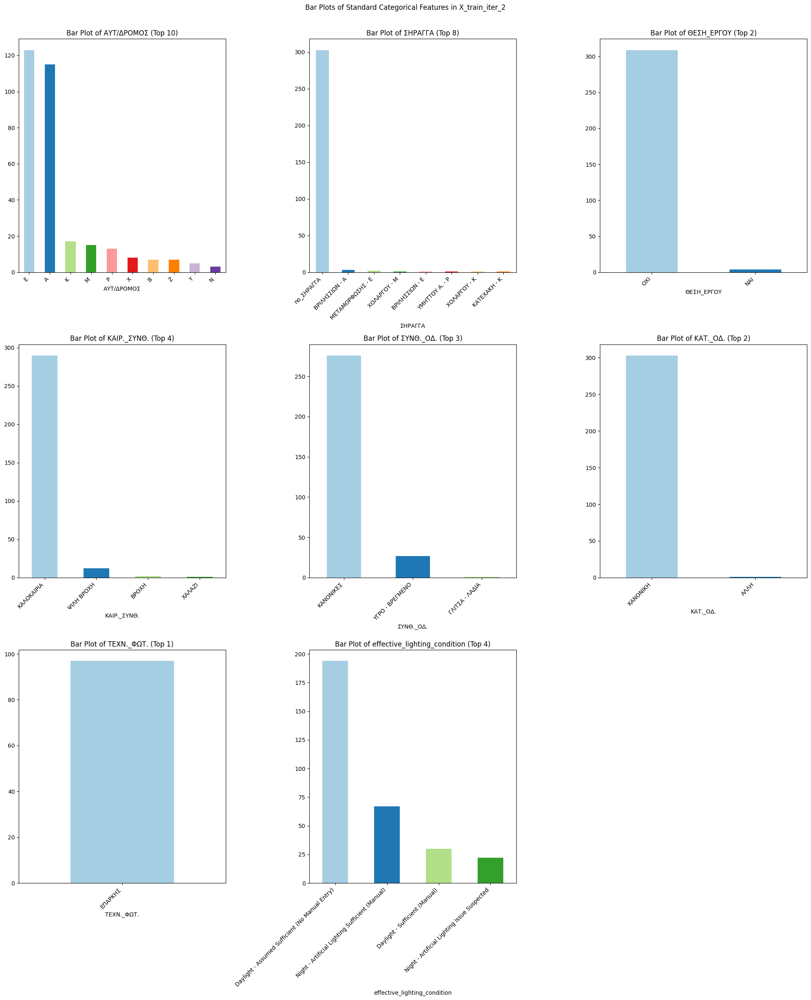


Plotting distribution for feature with long names: 'ΥΠΟΚΑΤΗΓΟΡΙΑ'


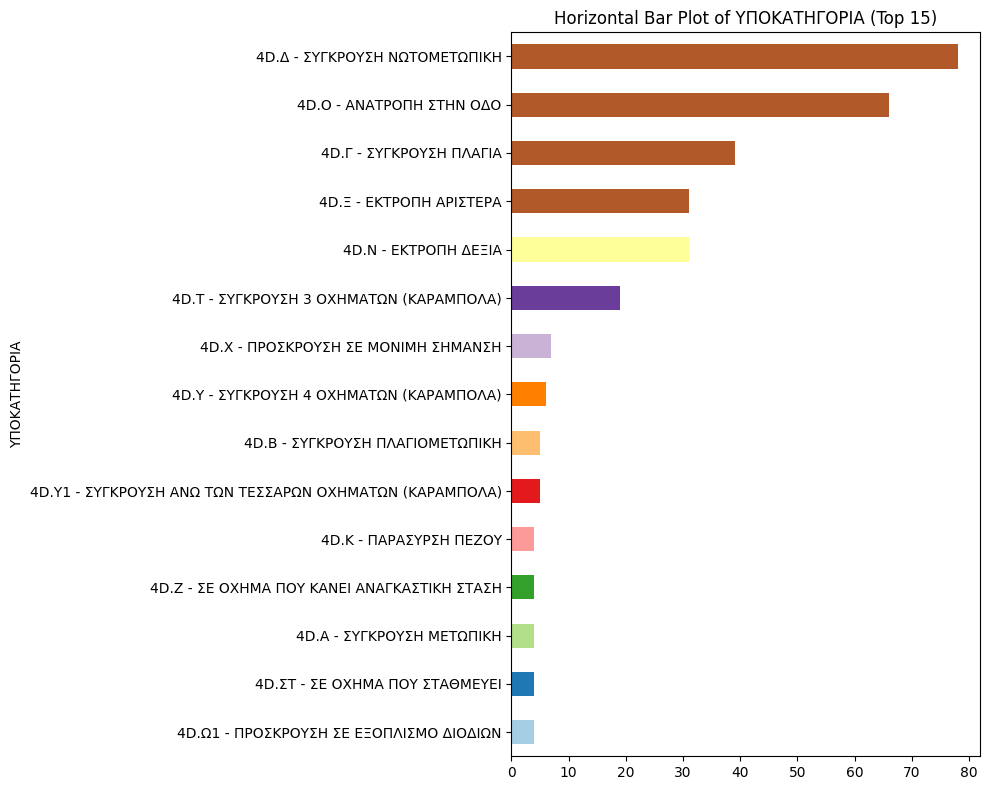


Top 10 values and counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ':
ΥΠΟΚΑΤΗΓΟΡΙΑ
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ                              78
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ                                   66
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ                                    39
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ                                       31
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ                                    31
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ)                    19
4D.Χ - ΠΡΟΣΚΡΟΥΣΗ ΣΕ ΜΟΝΙΜΗ ΣΗΜΑΝΣΗ                         7
4D.Υ - ΣΥΓΚΡΟΥΣΗ 4 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ)                     6
4D.Β - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΟΜΕΤΩΠΙΚΗ                             5
4D.Υ1 - ΣΥΓΚΡΟΥΣΗ ΑΝΩ ΤΩΝ ΤΕΣΣΑΡΩΝ ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ)     5
Name: count, dtype: int64


In [ ]:
# Analyze distribution of categorical features
if len(categorical_features) > 0:

    # Identify features that are high cardinality or have very long names
    # Add any other categorical features that cause plotting issues here
    high_cardinality_features = ['segment_id', 'geohash_p7']
    problematic_name_features = ['ΥΠΟΚΑΤΗΓΟΡΙΑ'] # Features known to have long names

    # Features to plot in the standard bar plots
    features_to_plot = [
        col for col in categorical_features
        if col not in high_cardinality_features and col not in problematic_name_features
    ]

    if len(features_to_plot) > 0:
        print("\nPlotting distribution for standard categorical features...")
        plt.figure(figsize=(20, max(15, len(features_to_plot) * 3))) # Adjust figure height dynamically
        num_cols = 3
        num_rows = (len(features_to_plot) + num_cols - 1) // num_cols # Ceiling division

        for i, col in enumerate(features_to_plot):
            plt.subplot(num_rows, num_cols, i + 1)
            # Consider showing only top N categories if still crowded
            top_n = X_train_iter_2[col].value_counts().nlargest(10) # Show top 10 categories
            top_n.plot(kind='bar', color=plt.cm.Paired(np.arange(len(top_n))))
            plt.title(f'Bar Plot of {col} (Top {len(top_n)})')
            plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.suptitle('Bar Plots of Standard Categorical Features in X_train_iter_2', y=1.02)
        plt.show()
    else:
        print("No standard categorical features suitable for bar plots.")


    # --- Optional: Handle problematic features separately ---

    # For high cardinality features, maybe just print top values
    for col in high_cardinality_features:
        if col in categorical_features:
            print(f"\nTop 10 values and counts for high cardinality feature '{col}':")
            # Ensure value_counts handles potential NaNs appropriately
            print(X_train_iter_2[col].value_counts(dropna=False).head(10))


    # For features with long names, you might try horizontal bars or printing
    for col in problematic_name_features:
         if col in categorical_features:
            print(f"\nPlotting distribution for feature with long names: '{col}'")
            plt.figure(figsize=(10, 8))
            # Use horizontal bar plot (barh)
            # Show top N categories if still too many
            top_n = X_train_iter_2[col].value_counts().nlargest(15) # Show top 15 categories
            top_n.sort_values().plot(kind='barh', color=plt.cm.Paired(np.arange(len(top_n))))
            plt.title(f'Horizontal Bar Plot of {col} (Top {len(top_n)})')
            plt.tight_layout()
            plt.show()
            # Also print top values
            print(f"\nTop 10 values and counts for '{col}':")
            print(X_train_iter_2[col].value_counts(dropna=False).head(10))


else:
    print("No categorical features to plot or analyze.")

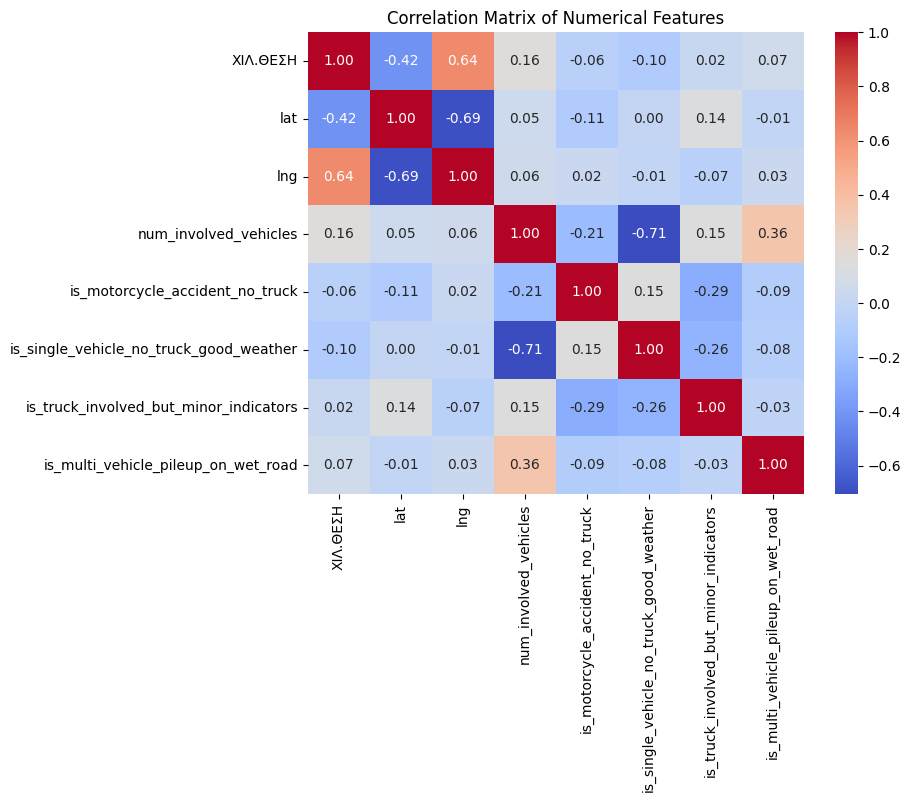

In [ ]:
# Analyze correlation between numerical features
if len(numerical_features) > 1:
    correlation_matrix = X_train_iter_2[numerical_features].corr()
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix of Numerical Features')
    plt.show()
else:
    print("Not enough numerical features to compute correlation matrix.")

## spatial feature engineering

In [ ]:
if 'X_train_iter_2' in locals() and 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns: # Check if data and columns exist
    N_BINS = 8 # Example number of bins for gridding
    GEOHASH_PRECISION = 7 # Example geohash precision
    KDE_BANDWIDTH = 0.05 # Example KDE bandwidth - VERY SENSITIVE, needs tuning/domain knowledge

    # --- Create Road Segment ID using the adjusted function ---
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train_iter_2.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train_iter_2.columns:
        # Call the adjusted function
        X_train_iter_2 = create_road_segment_feature_adjusted(X_train_iter_2)
        X_val_iter_2 = create_road_segment_feature_adjusted(X_val_iter_2)
        X_test_iter_2 = create_road_segment_feature_adjusted(X_test_iter_2)
        print("Adjusted road segment ID feature created.")
        # You can check the counts of the new categories:
        # print("Value counts for adjusted segment_id in X_train_iter_2:")
        # print(X_train_iter_2['segment_id'].value_counts().head(10))
    else:
        print("Skipping road segment ID creation: Required columns not found.")


    # --- Apply Coordinate Binning ---
    # (No changes needed here, ensure 'lat'/'lng' are present if you run this)
    if 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns:
        X_train_iter_2 = create_coordinate_bins(X_train_iter_2, n_bins=N_BINS, fit_df=X_train_iter_2.copy())
        X_val_iter_2 = create_coordinate_bins(X_val_iter_2, n_bins=N_BINS, fit_df=X_train_iter_2.copy())
        X_test_iter_2 = create_coordinate_bins(X_test_iter_2, n_bins=N_BINS, fit_df=X_train_iter_2.copy())
        print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
    else:
        print("Skipping coordinate binning: lat/lng columns not found.")


    # --- Apply Geohashing ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns:
        X_train_iter_2 = apply_geohash(X_train_iter_2, precision=GEOHASH_PRECISION)
        X_val_iter_2 = apply_geohash(X_val_iter_2, precision=GEOHASH_PRECISION)
        X_test_iter_2 = apply_geohash(X_test_iter_2, precision=GEOHASH_PRECISION)
        print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
    else:
        print("Skipping geohashing: lat/lng columns not found.")


    # --- Apply KDE Score ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns:
        X_train_iter_2_coords_for_kde = X_train_iter_2[['lat', 'lng']].dropna()
        if not X_train_iter_2_coords_for_kde.empty:
            X_train_iter_2 = apply_kde_score(X_train_iter_2.dropna(subset=['lat', 'lng']), X_train_iter_2_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_val_iter_2 = apply_kde_score(X_val_iter_2.dropna(subset=['lat', 'lng']), X_train_iter_2_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_test_iter_2 = apply_kde_score(X_test_iter_2.dropna(subset=['lat', 'lng']), X_train_iter_2_coords_for_kde, bandwidth=KDE_BANDWIDTH)

            # X_train_iter_2['kde_score'].fillna(0.0, inplace=True)
            X_train_iter_2.fillna({'kde_score':0.0},inplace=True)
            # X_val_iter_2['kde_score'].fillna(0.0, inplace=True)
            X_val_iter_2.fillna({'kde_score':0.0},inplace=True)
            # X_test_iter_2['kde_score'].fillna(0.0, inplace=True)
            X_test_iter_2.fillna({'kde_score':0.0},inplace=True)

            print("KDE scores created.")
        else:
            print("Skipping KDE: No valid coordinates in X_train_iter_2 to fit KDE.")
            X_train_iter_2['kde_score'] = 0.0
            X_val_iter_2['kde_score'] = 0.0
            X_test_iter_2['kde_score'] = 0.0
    else:
        print("Skipping KDE score: lat/lng columns not found.")


    # Display some of the new features
    # (Ensure the column name for segment_id matches what's created, e.g. 'segment_id')
    new_spatial_cols = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_2.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_2.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'kde_score' in X_train_iter_2.columns: new_spatial_cols.append('kde_score')
    # Check for the actual segment_id column name, assuming it's 'segment_id' from prefix='segment'
    if 'segment_id' in X_train_iter_2.columns: new_spatial_cols.append('segment_id')

    new_spatial_cols = [col for col in new_spatial_cols if col in X_train_iter_2.columns]
    if new_spatial_cols:
        print("\nSample of new spatial features in X_train_iter_2:")
        # In Colab, display() is better for DataFrames
        try:
            display(X_train_iter_2[new_spatial_cols].head())
        except NameError: # If display() is not available (e.g. standard Python script)
            print(X_train_iter_2[new_spatial_cols].head())

    else:
        print("\nNo new spatial features were added or found to display.")

else:
    print("Skipping spatial feature engineering: X_train_iter_2 or key columns not available.")
# Ensure X_train, X_val, X_test from the train_test_split of df_iter2 are available.
# Ensure all your spatial feature engineering functions are defined from the first code block.
# Make sure Counter from collections is imported for the downsampling part if you want to check counts.
# from collections import Counter # If not already imported

# if 'X_train_iter_2' in locals() and 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns:
#     N_BINS = 8
#     GEOHASH_PRECISION = 7
#     KDE_BANDWIDTH = 0.05 # You set this, and it will be passed to apply_kde_score

#     print(f"\n--- Iteration X: Spatial Feature Engineering (with KDE Downsampling) ---")
#     print(f"Original X_train_iter_2 shape before spatial eng: {X_train_iter_2.shape}")


#     # --- 1. Create Road Segment ID using the adjusted function ---
#     # This function should be called first as 'segment_id' is used for downsampling KDE data.
#     if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train_iter_2.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train_iter_2.columns:
#         X_train_iter_2 = create_road_segment_feature_adjusted(X_train_iter_2)
#         X_val_iter_2 = create_road_segment_feature_adjusted(X_val_iter_2)
#         X_test_iter_2 = create_road_segment_feature_adjusted(X_test_iter_2)
#         print("Adjusted road segment ID feature created.")
#     else:
#         print("Skipping road segment ID creation: Required columns not found.")
#         # If segment_id cannot be created, KDE downsampling based on it cannot proceed as planned.
#         # Add dummy 'segment_id' if it's critical for subsequent steps to not fail,
#         # or ensure code handles its absence. For now, we assume it's created.
#         if 'segment_id' not in X_train_iter_2.columns: X_train_iter_2['segment_id'] = 'unknown_segment'
#         if 'segment_id' not in X_val_iter_2.columns: X_val_iter_2['segment_id'] = 'unknown_segment'
#         if 'segment_id' not in X_test_iter_2.columns: X_test_iter_2['segment_id'] = 'unknown_segment'


#     # --- Downsampling logic for KDE fitting data (from X_train_iter_2) ---
#     # This X_train_iter_2 now has 'segment_id', 'lat', 'lng'
#     print("\nPreparing data for KDE model fitting with downsampling of high-frequency segments...")

#     # Create a copy of X_train_iter_2 specifically for preparing the KDE fitting data
#     # This copy should have 'segment_id', 'lat', 'lng'
#     X_train_iter_2_for_kde_fitting_preparation = X_train_iter_2.copy()

#     segments_to_downsample = [
#         "A_EntryZone_Or_UnknownKM",
#         "E_EntryZone_Or_UnknownKM",
#         # Add other re-categorized "0.0" segments like M_0.0, K_0.0 if they become e.g.,
#         # "M_EntryZone_Or_UnknownKM", "K_EntryZone_Or_UnknownKM" or whatever their segment_id is
#     ]
#     # To be more robust, you might identify these high-frequency segments dynamically
#     # For example, any segment with more than X occurrences if you don't want to hardcode.
#     # For now, using the hardcoded list based on prior observation.

#     N_SAMPLES_PER_SEGMENT_FOR_KDE = 3 # Max samples from each high-frequency segment for KDE fit

#     downsampled_dfs_for_kde = []
#     other_dfs_for_kde = []

#     # Ensure 'segment_id' exists before trying to use it for downsampling
#     if 'segment_id' in X_train_iter_2_for_kde_fitting_preparation.columns:
#         # Check actual unique segment_id values to correctly identify M_0.0 and K_0.0 if they were not re-categorized
#         # The create_road_segment_feature_adjusted re-categorizes A_0.0 and E_0.0.
#         # If M_0.0 and K_0.0 become "M_0.0" and "K_0.0" as segment_id, add them to segments_to_downsample list.
#         # Example: segments_to_downsample.extend(["M_0.0", "K_0.0"])

#         print(f"Segments identified for potential downsampling in KDE: {segments_to_downsample}")
#         print(f"Target samples per downsampled segment for KDE: {N_SAMPLES_PER_SEGMENT_FOR_KDE}")

#         for segment_name in X_train_iter_2_for_kde_fitting_preparation['segment_id'].unique():
#             segment_df = X_train_iter_2_for_kde_fitting_preparation[X_train_iter_2_for_kde_fitting_preparation['segment_id'] == segment_name]
#             if segment_name in segments_to_downsample:
#                 if len(segment_df) > N_SAMPLES_PER_SEGMENT_FOR_KDE:
#                     downsampled_dfs_for_kde.append(segment_df.sample(N_SAMPLES_PER_SEGMENT_FOR_KDE, random_state=42))
#                     print(f"Downsampled segment '{segment_name}' from {len(segment_df)} to {N_SAMPLES_PER_SEGMENT_FOR_KDE} for KDE fitting.")
#                 else:
#                     downsampled_dfs_for_kde.append(segment_df) # Keep all if less than N
#                     print(f"Segment '{segment_name}' has {len(segment_df)} samples (<=N), keeping all for KDE fitting.")
#             else:
#                 other_dfs_for_kde.append(segment_df)

#         temp_concat_list = downsampled_dfs_for_kde + other_dfs_for_kde
#         if temp_concat_list: # Ensure list is not empty before concat
#             X_train_iter_2_data_for_kde_fit = pd.concat(temp_concat_list)
#             print(f"Shape of data used to FIT KDE model after downsampling: {X_train_iter_2_data_for_kde_fit.shape}")
#         else:
#             print("Warning: No data selected for KDE fitting after downsampling attempt. Using original X_train_iter_2 for KDE fitting.")
#             X_train_iter_2_data_for_kde_fit = X_train_iter_2_for_kde_fitting_preparation # Fallback
#     else:
#         print("Warning: 'segment_id' column not found in X_train_iter_2. Skipping downsampling for KDE. Using original X_train_iter_2 for KDE fitting.")
#         X_train_iter_2_data_for_kde_fit = X_train_iter_2_for_kde_fitting_preparation # Fallback

#     # Now, X_train_iter_2_coords_for_kde should be derived from this potentially downsampled DataFrame
#     if 'lat' in X_train_iter_2_data_for_kde_fit.columns and 'lng' in X_train_iter_2_data_for_kde_fit.columns:
#         X_train_iter_2_coords_for_kde_fitting = X_train_iter_2_data_for_kde_fit[['lat', 'lng']].dropna()
#     else:
#         print("Warning: lat/lng not in X_train_iter_2_data_for_kde_fit. KDE might fail or be inaccurate.")
#         X_train_iter_2_coords_for_kde_fitting = pd.DataFrame(columns=['lat','lng']) # Empty DF to prevent error


#     # --- Apply Coordinate Binning ---
#     # Uses X_train_iter_2 (original training split for this iter, now with segment_id) for fit_df
#     if 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns:
#         X_train_iter_2 = create_coordinate_bins(X_train_iter_2, n_bins=N_BINS, fit_df=X_train_iter_2.copy())
#         X_val_iter_2 = create_coordinate_bins(X_val_iter_2, n_bins=N_BINS, fit_df=X_train_iter_2.copy())
#         X_test_iter_2 = create_coordinate_bins(X_test_iter_2, n_bins=N_BINS, fit_df=X_train_iter_2.copy())
#         print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
#     else:
#         print("Skipping coordinate binning: lat/lng columns not found in X_train_iter_2 (after segment_id creation).")

#     # --- Apply Geohashing ---
#     if 'lat' in X_train_iter_2.columns and 'lng' in X_train_iter_2.columns:
#         X_train_iter_2 = apply_geohash(X_train_iter_2, precision=GEOHASH_PRECISION)
#         X_val_iter_2 = apply_geohash(X_val_iter_2, precision=GEOHASH_PRECISION)
#         X_test_iter_2 = apply_geohash(X_test_iter_2, precision=GEOHASH_PRECISION)
#         print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
#     else:
#         print("Skipping geohashing: lat/lng columns not found.")


#     # --- Apply KDE Score ---
#     # The KDE model is FIT using X_train_iter_2_coords_for_kde_fitting (from downsampled data)
#     # Then, this fitted KDE model is used to SCORE the original X_train_iter_2, X_val_iter_2, X_test_iter_2 (which still have all their rows)
#     if not X_train_iter_2_coords_for_kde_fitting.empty and \
#        all(col in X_train_iter_2.columns for col in ['lat','lng']) and \
#        all(col in X_val_iter_2.columns for col in ['lat','lng']) and \
#        all(col in X_test_iter_2.columns for col in ['lat','lng']):

#         print(f"Fitting KDE model using data of shape: {X_train_iter_2_coords_for_kde_fitting.shape}")
#         X_train_iter_2 = apply_kde_score(X_train_iter_2, X_train_iter_2_coords_for_kde_fitting, bandwidth=KDE_BANDWIDTH)
#         X_val_iter_2 = apply_kde_score(X_val_iter_2, X_train_iter_2_coords_for_kde_fitting, bandwidth=KDE_BANDWIDTH)
#         X_test_iter_2 = apply_kde_score(X_test_iter_2, X_train_iter_2_coords_for_kde_fitting, bandwidth=KDE_BANDWIDTH)
#         # fillna for kde_score is now inside apply_kde_score function
#         print("KDE scores created (KDE model fit on potentially downsampled training data).")
#     else:
#         print("Skipping KDE score creation: Not enough valid coordinates for fitting KDE or lat/lng missing in X_train_iter_2/X_val_iter_2/X_test_iter_2.")
#         X_train_iter_2['kde_score'] = 0.0
#         X_val['kde_score'] = 0.0
#         X_test_iter_2['kde_score'] = 0.0

#     # Display some of the new features
#     new_spatial_cols = []
#     if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_2.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
#     if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_2.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
#     if 'kde_score' in X_train_iter_2.columns: new_spatial_cols.append('kde_score')
#     if 'segment_id' in X_train_iter_2.columns: new_spatial_cols.append('segment_id')

#     new_spatial_cols = [col for col in new_spatial_cols if col in X_train_iter_2.columns] # Should not be necessary if checks above are fine
#     if new_spatial_cols:
#         print("\nSample of new spatial features in X_train_iter_2 (post all spatial engineering):")
#         try:
#             display(X_train_iter_2[new_spatial_cols].head())
#         except NameError:
#             print(X_train_iter_2[new_spatial_cols].head())
#     else:
#         print("\nNo new spatial features were available to display.")
# else:
#     print("Skipping spatial feature engineering: Initial X_train or lat/lng columns not found.")

Adjusted road segment ID feature created.
Coordinate bins (8x8) created.
Geohash (precision 7) features created.
KDE scores created.

Sample of new spatial features in X_train_iter_2:


,grid_cell_8x8,geohash_p7,kde_score,segment_id
467,7_2,swbb9tc,5.378061,A_11.4
144,3_5,swbbjfc,22.146344,K_1.7
395,4_6,swbbnx3,26.114196,P_6.0
325,5_6,swbbq64,26.932997,B_8.0
177,5_5,swbbmuw,26.852414,A_29.6


In [ ]:
X_test_iter_2.columns

Index(['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ',
       'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', 'lat', 'lng',
       'num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ',
       'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
       'effective_lighting_condition', 'is_motorcycle_accident_no_truck',
       'is_single_vehicle_no_truck_good_weather',
       'is_truck_involved_but_minor_indicators',
       'is_multi_vehicle_pileup_on_wet_road', 'segment_id', 'lat_bin_8',
       'lng_bin_8', 'grid_cell_8x8', 'geohash_p7', 'kde_score'],
      dtype='object')

In [ ]:
# X_train_iter_2, X_val_iter_2, X_test_iter_2 are your dataframes after spatial features are engineered
columns_to_drop_after_spatial_eng = ['lat', 'lng'] # Add any other raw source columns if needed

X_train_iter_2 = X_train_iter_2.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_val_iter_2 = X_val_iter_2.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_test_iter_2 = X_test_iter_2.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')

print(f"Dropped raw spatial columns: {columns_to_drop_after_spatial_eng}")

Dropped raw spatial columns: ['lat', 'lng']


In [ ]:
X_test_iter_2.columns

Index(['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ',
       'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.',
       'num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ',
       'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
       'effective_lighting_condition', 'is_motorcycle_accident_no_truck',
       'is_single_vehicle_no_truck_good_weather',
       'is_truck_involved_but_minor_indicators',
       'is_multi_vehicle_pileup_on_wet_road', 'segment_id', 'lat_bin_8',
       'lng_bin_8', 'grid_cell_8x8', 'geohash_p7', 'kde_score'],
      dtype='object')

## pre-processing

In [ ]:
if 'X_train_iter_2' in locals():
    # Identify feature types AFTER new spatial features are created
    # New categorical features from spatial engineering:
    new_cat_spatial_features = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_2.columns: new_cat_spatial_features.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_2.columns: new_cat_spatial_features.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'segment_id' in X_train_iter_2.columns: new_cat_spatial_features.append('segment_id')
    # Add more if you create other categorical spatial features e.g. lat_bin_N, lng_bin_N as separate features

    # New numerical features from spatial engineering:
    new_num_spatial_features = []
    if 'kde_score' in X_train_iter_2.columns: new_num_spatial_features.append('kde_score')


    all_categorical_features = X_train_iter_2.select_dtypes(include=['object', 'category']).columns.tolist()
    # Ensure our new spatial categoricals are included if not automatically detected as object/category
    for f in new_cat_spatial_features:
        if f not in all_categorical_features and f in X_train_iter_2.columns:
            all_categorical_features.append(f)
            X_train_iter_2[f] = X_train_iter_2[f].astype('category') # Ensure correct dtype
            X_val_iter_2[f] = X_val_iter_2[f].astype('category')
            X_test_iter_2[f] = X_test_iter_2[f].astype('category')


    # Features for 'unknown' imputation (original list)
    categorical_features_unknown_impute = [
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', "weather_description", 'effective_lighting_condition'
    ]
    categorical_features_unknown_impute = [col for col in categorical_features_unknown_impute if col in X_train_iter_2.columns and col in all_categorical_features]


    # Other categorical features (if any) for 'most_frequent' imputation
    # This will now include new_cat_spatial_features if they are not in the unknown_impute list
    categorical_features_mode_impute = [
        col for col in all_categorical_features if col not in categorical_features_unknown_impute
    ]

    boolean_features = X_train_iter_2.select_dtypes(include=['bool']).columns.tolist()
    for bf in boolean_features:
        X_train_iter_2[bf] = X_train_iter_2[bf].astype(int)
        X_val_iter_2[bf] = X_val_iter_2[bf].astype(int)
        X_test_iter_2[bf] = X_test_iter_2[bf].astype(int)

    numerical_features = X_train_iter_2.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    # Ensure our new numerical spatial features are included
    for f in new_num_spatial_features:
        if f not in numerical_features and f in X_train_iter_2.columns:
            numerical_features.append(f)


    print(f"Final Numerical features for preprocessor: {numerical_features}")
    print(f"Final Categorical features for 'unknown' imputation: {categorical_features_unknown_impute}")
    print(f"Final Categorical features for 'most_frequent' imputation: {categorical_features_mode_impute}")


    # --- The rest of your ColumnTransformer and preprocessing code follows ---
    # Create preprocessing pipelines (as you had before)
    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    categorical_pipeline_unknown = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    categorical_pipeline_mode = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')), # New spatial categoricals (grid_cell, geohash) usually don't have NaNs if created properly
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    transformers_list = []
    if numerical_features: # Add only if list is not empty
         transformers_list.append(('num', numerical_pipeline, numerical_features))
    if categorical_features_unknown_impute:
        transformers_list.append(('cat_unknown', categorical_pipeline_unknown, categorical_features_unknown_impute))
    if categorical_features_mode_impute:
        transformers_list.append(('cat_mode', categorical_pipeline_mode, categorical_features_mode_impute))

    preprocessor = ColumnTransformer(
        transformers=transformers_list,
        remainder='passthrough'
    )

    # Fit and transform (as you had before)
    # ... your existing code for fitting preprocessor and creating X_train_iter_2_processed_df ...
    # (No changes needed to that part if the feature lists fed into ColumnTransformer are correct)
    # Fit preprocessor on X_train_iter_2 and transform all sets
    X_train_iter_2_processed = preprocessor.fit_transform(X_train_iter_2)
    X_val_iter_2_processed = preprocessor.transform(X_val_iter_2)
    X_test_iter_2_processed = preprocessor.transform(X_test_iter_2)

    # Get feature names after one-hot encoding for RFE and interpretation
    try:
        feature_names_out = preprocessor.get_feature_names_out()
        X_train_iter_2_processed_df = pd.DataFrame(X_train_iter_2_processed, columns=feature_names_out, index=X_train_iter_2.index)
        X_val_iter_2_processed_df = pd.DataFrame(X_val_iter_2_processed, columns=feature_names_out, index=X_val_iter_2.index)
        X_test_iter_2_processed_df = pd.DataFrame(X_test_iter_2_processed, columns=feature_names_out, index=X_test_iter_2.index)
        print(f"Processed training data shape: {X_train_iter_2_processed_df.shape}")
    except Exception as e:
        print(f"Could not get feature names from preprocessor automatically: {e}")
        X_train_iter_2_processed_df = pd.DataFrame(X_train_iter_2_processed, index=X_train_iter_2.index)
        X_val_iter_2_processed_df = pd.DataFrame(X_val_iter_2_processed, index=X_val_iter_2.index)
        X_test_iter_2_processed_df = pd.DataFrame(X_test_iter_2_processed, index=X_test_iter_2.index)
        feature_names_out = X_train_iter_2_processed_df.columns.astype(str)
        print(f"Processed training data shape (generic column names): {X_train_iter_2_processed_df.shape}")

Final Numerical features for preprocessor: ['num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.', 'is_motorcycle_accident_no_truck', 'is_single_vehicle_no_truck_good_weather', 'is_truck_involved_but_minor_indicators', 'is_multi_vehicle_pileup_on_wet_road', 'lat_bin_8', 'lng_bin_8', 'kde_score']
Final Categorical features for 'unknown' imputation: ['ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', 'effective_lighting_condition']
Final Categorical features for 'most_frequent' imputation: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'segment_id', 'grid_cell_8x8', 'geohash_p7']
Processed training data shape: (313, 682)


## colinerity


Mutual Information Scores (Top 15):
cat_mode__segment_id_E_43.7                      0.108058
num__is_motorcycle_accident_no_truck             0.101532
cat_mode__ΧΙΛ.ΘΕΣΗ_36.3                          0.093452
num__has_ΔΙΚΥΚΛΟ                                 0.086424
cat_mode__ΧΙΛ.ΘΕΣΗ_24.6                          0.083100
cat_mode__segment_id_P_6.1                       0.080251
cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_K                           0.076806
cat_mode__geohash_p7_swbbecz                     0.073082
cat_mode__segment_id_E_32.6                      0.072682
cat_mode__segment_id_A_21.7                      0.071189
cat_mode__segment_id_M_0.0                       0.069463
cat_mode__segment_id_M_0.4                       0.068959
cat_mode__ΧΙΛ.ΘΕΣΗ_13.6                          0.068385
cat_mode__ΥΠΟΚΑΤΗΓΟΡΙΑ_4D.Κ - ΠΑΡΑΣΥΡΣΗ ΠΕΖΟΥ    0.067961
cat_mode__ΧΙΛ.ΘΕΣΗ_24.2                          0.065604
dtype: float64


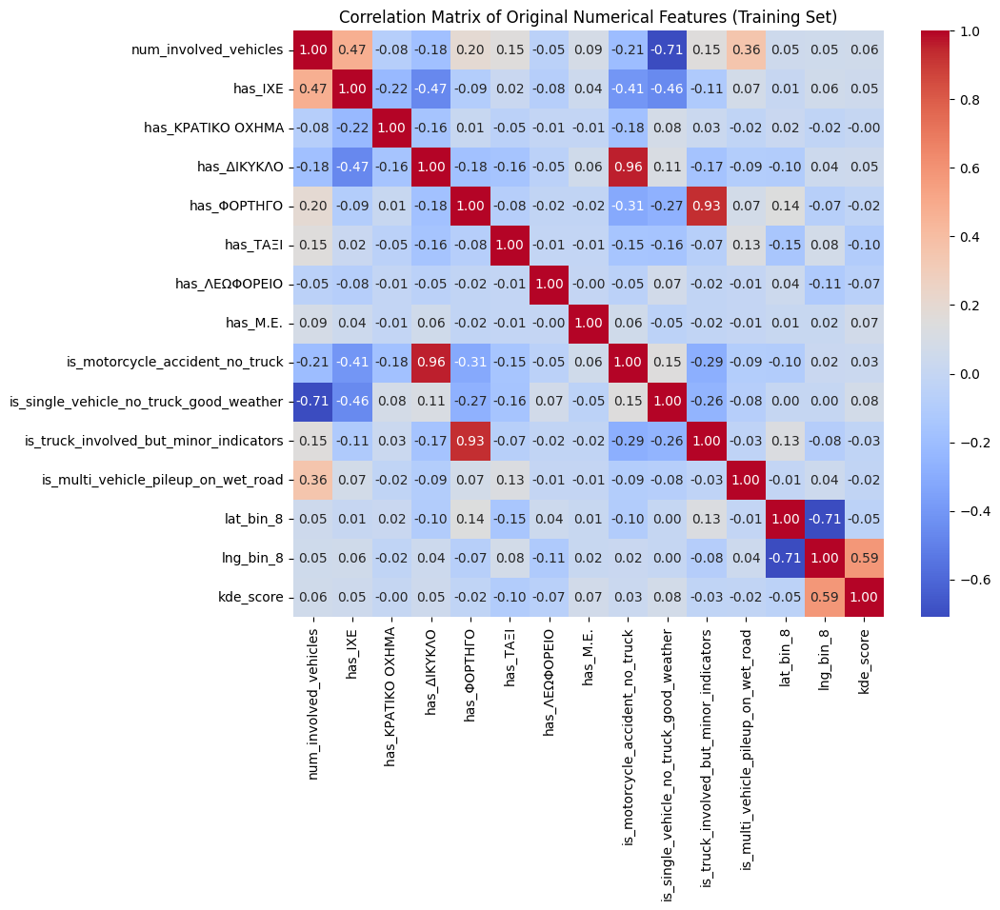

In [ ]:
if 'X_train_iter_2_processed_df' in locals():
    # Note: For filter methods, it's often better to use them on data *before* extensive transformations
    # if the transformations obscure original relationships (e.g. scaling for chi2).
    # However, for simplicity here, we use the processed data.
    # Ensure all data is non-negative for chi2 if applicable
    # For mutual_info_classif and f_classif, current processed data is fine.

    # Mutual Information (works for both num and cat (post-OHE))
    mi_scores = mutual_info_classif(X_train_iter_2_processed_df, y_train, random_state=42)
    mi_series = pd.Series(mi_scores, index=feature_names_out).sort_values(ascending=False)
    print("\nMutual Information Scores (Top 15):")
    print(mi_series.head(15))

    # Correlation (for numerical features in X_train_iter_2_processed_df - identify them again)
    # This is more complex with OHE. For now, let's skip detailed VIF on OHE.
    # A simple correlation heatmap on the original numerical features can be insightful:
    if len(numerical_features) > 1:
        plt.figure(figsize=(10, 8))
        sns.heatmap(X_train_iter_2[numerical_features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
        plt.title("Correlation Matrix of Original Numerical Features (Training Set)")
        plt.show()


## recursive feature elimination

In [ ]:
# if 'X_train_iter_2_processed_df' in locals():
#     estimator_rfe = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)
#     # Decide on number of features to select, e.g., half or a fixed number
#     num_features_to_select = max(5, X_train_iter_2_processed_df.shape[1] // 2) # Example: select half, but at least 5

#     rfe = RFE(estimator=estimator_rfe, n_features_to_select=num_features_to_select, step=1)
#     rfe.fit(X_train_iter_2_processed_df, y_train_iter_2)

#     selected_features_rfe_mask = rfe.support_
#     selected_features_rfe = X_train_iter_2_processed_df.columns[selected_features_rfe_mask]
#     print(f"\nSelected features from RFE ({len(selected_features_rfe)}):")
#     print(selected_features_rfe.tolist())

#     # Update X_train_iter_2_processed_df and X_val_iter_2_processed_df for this iteration
#     X_train_iter_2_iter_final = X_train_iter_2_processed_df[selected_features_rfe]
#     X_val_iter_2_iter_final = X_val_iter_2_processed_df[selected_features_rfe]
#     X_test_iter_2_iter_final = X_test_iter_2_processed_df[selected_features_rfe] # Also transform test set
# else:
#     print("Skipping RFE as processed data is not available.")
#     # Fallback if RFE was skipped
#     if 'X_train_iter_2_processed_df' in locals():
#         X_train_iter_2_iter_final = X_train_iter_2_processed_df.copy()
#         X_val_iter_2_iter_final = X_val_iter_2_processed_df.copy()
#         X_test_iter_2_iter_final = X_test_iter_2_processed_df.copy()

## recursive feature analysis with cross validation


--- Iteration 2: Recursive Feature Elimination with Cross-Validation (RFECV) ---
RFECV will use the estimator: LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42,
                   solver='liblinear')
Cross-validation strategy: StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
Scoring metric for feature selection: 'roc_auc'
Fitting RFECV... (This might take some time)
Optimal number of features found by RFECV: 256

Selected features from RFECV (256):
Shape of X_train after RFECV: (313, 256)


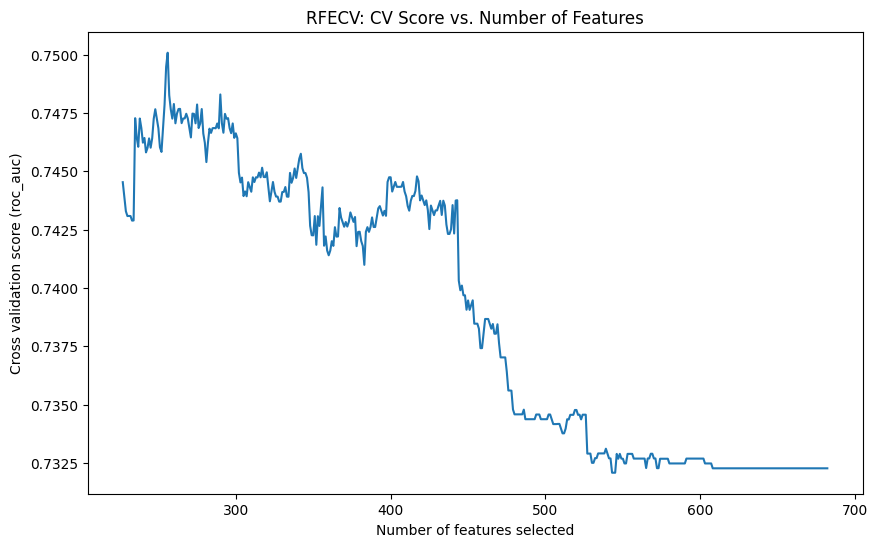

In [ ]:
# Ensure necessary imports
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression # Your chosen estimator
from sklearn.metrics import make_scorer, f1_score # For scoring if needed


if 'X_train_iter_2_processed_df' in locals() and X_train_iter_2_processed_df is not None and \
   'y_train_iter_2' in locals() and y_train_iter_2 is not None:

    print("\n--- Iteration 2: Recursive Feature Elimination with Cross-Validation (RFECV) ---")

    estimator_rfecv = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)

    # Define the cross-validation strategy
    # StratifiedKFold is good for classification, especially with imbalanced classes
    cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) # Using 5 splits as an example

    # Define the scoring metric for RFECV to optimize
    # For imbalanced classes, 'f1', 'roc_auc', or 'average_precision' (PR AUC) are often better than 'accuracy'.
    # Let's use 'f1' for the positive class (assuming positive_label=1)
    # If your positive class is not 1, adjust pos_label
    # You can also use 'roc_auc', 'average_precision', etc.
    scorer_for_rfecv = make_scorer(f1_score, pos_label=1, average='binary', zero_division=0)
    # Alternatively, just use a string like 'f1_macro', 'roc_auc'.
    # For binary classification and focusing on the positive class, 'f1' (which defaults to f1 of positive class if pos_label=1) or 'roc_auc' are good.
    # Let's use 'roc_auc' as it's a common general-purpose metric for RFECV selection
    # and less prone to issues if a fold has no positive predictions for some feature subsets.

    print(f"RFECV will use the estimator: {estimator_rfecv}")
    print(f"Cross-validation strategy: {cv_strategy}")
    print(f"Scoring metric for feature selection: 'roc_auc'") # Or your chosen scorer

    rfecv = RFECV(
        estimator=estimator_rfecv,
        step=1,  # Remove 1 feature at each step
        cv=cv_strategy,
        scoring='roc_auc',  # Metric to optimize for feature selection
        min_features_to_select=max(5, X_train_iter_2_processed_df.shape[1] // 3), # Example: select at least 5 features, or 10%
        n_jobs=-1 # Use all available cores
    )

    print("Fitting RFECV... (This might take some time)")
    try:
        rfecv.fit(X_train_iter_2_processed_df, y_train_iter_2)

        print(f"Optimal number of features found by RFECV: {rfecv.n_features_}")

        # Get the mask of selected features
        selected_features_rfecv_mask = rfecv.support_

        # Get the names of the selected features
        # Ensure that X_train_iter_2_processed_df has columns attribute (it should if it's a DataFrame)
        selected_features_rfecv = X_train_iter_2_processed_df.columns[selected_features_rfecv_mask]

        print(f"\nSelected features from RFECV ({len(selected_features_rfecv)}):")
        # Printing all feature names can be very long, consider printing only a few or just the count
        # print(selected_features_rfecv.tolist())

        # Update DataFrames to keep only RFECV selected features
        X_train_iter_2_iter_final = X_train_iter_2_processed_df[selected_features_rfecv]
        X_val_iter_2_iter_final = X_val_iter_2_processed_df[selected_features_rfecv]
        X_test_iter_2_iter_final = X_test_iter_2_processed_df[selected_features_rfecv]

        print(f"Shape of X_train after RFECV: {X_train_iter_2_iter_final.shape}")

        # You can also plot the number of features vs. cross-validation scores
        if hasattr(rfecv, "cv_results_"):
            try:
                import matplotlib.pyplot as plt
                n_scores = len(rfecv.cv_results_["mean_test_score"]) # Number of features evaluated
                plt.figure(figsize=(10,6))
                plt.xlabel("Number of features selected")
                plt.ylabel(f"Cross validation score ({rfecv.scoring})")
                plt.plot(
                    range(rfecv.min_features_to_select, n_scores + rfecv.min_features_to_select), # X-axis: number of features
                    rfecv.cv_results_["mean_test_score"],
                )
                plt.title("RFECV: CV Score vs. Number of Features")
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot RFECV scores: {plot_e}")

    except ValueError as ve:
        print(f"ValueError during RFECV fitting: {ve}")
        print("This might occur if input data is problematic or no features could be selected.")
        # Fallback: use all features from preprocessing if RFECV fails
        X_train_iter_2_iter_final = X_train_iter_2_processed_df.copy()
        X_val_iter_2_iter_final = X_val_iter_2_processed_df.copy()
        X_test_iter_2_iter_final = X_test_iter_2_processed_df.copy()
        print("Using all preprocessed features as RFECV failed.")
    except Exception as e:
        print(f"An unexpected error occurred during RFECV: {e}")
        X_train_iter_2_iter_final = X_train_iter_2_processed_df.copy() # Fallback
        X_val_iter_2_iter_final = X_val_iter_2_processed_df.copy()
        X_test_iter_2_iter_final = X_test_iter_2_processed_df.copy()
        print("Using all preprocessed features as RFECV encountered an error.")


else:
    print("Skipping RFECV as processed data (X_train_iter_2_processed_df or y_train_iter_2) is not available.")
    # Define fallback if previous steps failed
    if 'X_train_iter_2_processed_df' in locals() and X_train_iter_2_processed_df is not None:
        X_train_iter_2_iter_final = X_train_iter_2_processed_df.copy()
        X_val_iter_2_iter_final = X_val_iter_2_processed_df.copy() if 'X_val_iter_2_processed_df' in locals() and X_val_iter_2_processed_df is not None else None
        X_test_iter_2_iter_final = X_test_iter_2_processed_df.copy() if 'X_test_iter_2_processed_df' in locals() and X_test_iter_2_processed_df is not None else None
    else:
        X_train_iter_2_iter_final, X_val_iter_2_iter_final, X_test_iter_2_iter_final = None, None, None

In [ ]:
X_train_iter_2_iter_final.shape

(313, 256)

## balancing techniuqes

In [ ]:
# Previous code: X_train_iter_2_iter_final, y_train_iter_2, X_val_iter_final, y_val are defined

resampled_datasets_iter_2 = {} # To store (X_resampled, y_resampled) for each technique

if 'X_train_iter_2_iter_final' in locals() and X_train_iter_2_iter_final is not None and y_train_iter_2 is not None:
    print(f"\nOriginal training set shape: {X_train_iter_2_iter_final.shape}, Original class distribution: {Counter(y_train_iter_2)}")
    minority_class_count = Counter(y_train_iter_2).get(1, 0) # Assuming 1 is the minority class

    # Store the original (non-resampled) training data as a baseline
    resampled_datasets_iter_2['Original'] = (X_train_iter_2_iter_final.copy(), y_train_iter_2.copy())

    # Define samplers
    samplers = {
        "RandomOverSampler": RandomOverSampler(random_state=42),
        "SMOTE": None, # Will initialize carefully due to k_neighbors
        "ADASYN": None, # Will initialize carefully due to n_neighbors
        "TomekLinks": TomekLinks(sampling_strategy='auto', n_jobs=-1), # Undersampling, removes Tomek links
        "SMOTETomek": None, # Will initialize carefully
        "SMOTEENN": None # Will initialize carefully
    }

    # SMOTE and ADASYN require k_neighbors (or n_neighbors for ADASYN) < minority_class_count
    if minority_class_count > 1:
        k_val = min(4, minority_class_count - 1) # A common heuristic for k, ensuring it's less than minority samples

        if k_val > 0 : # Ensure k_val is positive
            samplers["SMOTE"] = SMOTE(random_state=42, k_neighbors=k_val)
            samplers["ADASYN"] = ADASYN(random_state=42, n_neighbors=k_val) # ADASYN uses n_neighbors
            samplers["SMOTETomek"] = SMOTETomek(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), tomek=TomekLinks(sampling_strategy='auto'), n_jobs=-1)
            samplers["SMOTEENN"] = SMOTEENN(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), enn=None, n_jobs=-1) # enn default is good
        else:
            print(f"Skipping SMOTE-based samplers as k_val ({k_val}) would be too small or zero based on minority count ({minority_class_count}).")
            # Remove them if they can't be initialized
            for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
                if key in samplers: samplers.pop(key)

    else:
        print(f"Skipping SMOTE-based samplers as minority count ({minority_class_count}) is <= 1.")
        for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
            if key in samplers: samplers.pop(key)


    # Apply each sampler
    for name, sampler in samplers.items():
        if sampler is None: # Sampler was not initialized
            continue
        print(f"\nApplying {name}...")
        try:
            X_res, y_res = sampler.fit_resample(X_train_iter_2_iter_final, y_train_iter_2)
            resampled_datasets_iter_2[name] = (X_res, y_res)
            print(f"Resampled with {name}: X_shape={X_res.shape}, y_dist={Counter(y_res)}")
        except Exception as e:
            print(f"Could not apply {name}. Error: {e}")
            # Optionally store original if sampler fails, or skip
            # resampled_datasets_iter_2[name] = (X_train_iter_2_iter_final.copy(), y_train_iter_2.copy())


    if not resampled_datasets_iter_2: # If all samplers failed or were skipped
        print("No resampling techniques were successfully applied or initialized. Using original data only.")
        if 'Original' not in resampled_datasets_iter_2: # Should already be there
             resampled_datasets_iter_2['Original'] = (X_train_iter_2_iter_final.copy(), y_train_iter_2.copy())


else:
    print("Skipping balancing as X_train_iter_2_iter_final or y_train_iter_2 is not available.")
    # Ensure there's at least 'Original' if X_train_iter_2_iter_final was available
    if 'X_train_iter_2_iter_final' in locals() and X_train_iter_2_iter_final is not None and y_train_iter_2 is not None:
        resampled_datasets_iter_2['Original'] = (X_train_iter_2_iter_final.copy(), y_train_iter_2.copy())


Original training set shape: (313, 256), Original class distribution: Counter({0: 161, 1: 152})

Applying RandomOverSampler...
Resampled with RandomOverSampler: X_shape=(322, 256), y_dist=Counter({1: 161, 0: 161})

Applying SMOTE...
Resampled with SMOTE: X_shape=(322, 256), y_dist=Counter({1: 161, 0: 161})

Applying ADASYN...
Could not apply ADASYN. Error: No samples will be generated with the provided ratio settings.

Applying TomekLinks...
Resampled with TomekLinks: X_shape=(307, 256), y_dist=Counter({0: 155, 1: 152})

Applying SMOTETomek...
Resampled with SMOTETomek: X_shape=(316, 256), y_dist=Counter({0: 161, 1: 155})

Applying SMOTEENN...
Resampled with SMOTEENN: X_shape=(178, 256), y_dist=Counter({1: 98, 0: 80})


## model training

In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier # Ensure this import is present


trained_models_iter_2 = {} # To store trained models: key will be "ModelName_SamplerName"

if 'resampled_datasets_iter_2' in locals() and resampled_datasets_iter_2:
    minority_class_label = 1 # Assuming 'death' is 1
    f1_minority_scorer = make_scorer(f1_score, pos_label=minority_class_label, average='binary') # For CV if you add it later

    for sampler_name, (X_train_curr_resampled, y_train_curr_resampled) in resampled_datasets_iter_2.items():
        print(f"\n--- Training models on data from: {sampler_name} ---")
        print(f"Training data shape: {X_train_curr_resampled.shape}, Distribution: {Counter(y_train_curr_resampled)}")

        # Define your models here or ensure they are defined from a previous cell
        # Re-initialize models for each dataset to ensure they are fresh

        # Calculate scale_pos_weight for XGBoost based on the current resampled data
        counts_curr = Counter(y_train_curr_resampled)
        scale_pos_weight_curr = counts_curr[0] / counts_curr[1] if counts_curr[1] > 0 else 1

        # calculate the ratio of the target variable in the training set in order to
        # get the weights for the custom ratio logistic regression
        counts_curr = Counter(y_train_curr_resampled)
        n_majority = counts_curr.get(0, 0) # Count of class 0 (assuming majority)
        n_minority = counts_curr.get(1, 0) # Count of class 1 (assuming minority)

        if n_minority > 0 and n_majority > 0:
          # A simple inverse frequency ratio: weight_minority = N_majority / N_minority
          # Or, to make the majority weight 1, weight_minority = N_majority / N_minority
          # Or inversely proportional to frequency: weight_i = 1 / freq_i
          # For 1:9 ratio, N_majority / N_minority is approx 9 / 1 = 9
          # Let's use a ratio where the minority class weight is 9 times the majority class weight.
          # We can arbitrarily set the majority weight to 1 and the minority weight to 9.
          # custom_class_weights = {0: 1.0, 1: 9.0} # Using floats is standard
          weight_minority = n_majority / n_minority
          custom_class_weights = {0: 1.0, 1: weight_minority}


        current_models_definitions = {
            'LogisticRegression': LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_custom_ratio':LogisticRegression(solver='liblinear',random_state=42,class_weight=custom_class_weights,max_iter=1000),
            'LogisticRegression_L1': LogisticRegression(solver='liblinear', penalty='l1', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_L2':LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000, penalty='l2'),
            'RandomForest': RandomForestClassifier(random_state=42, class_weight='balanced_subsample', n_estimators=100),
            'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='logloss',
                             scale_pos_weight=scale_pos_weight_curr),
            'BalancedRandomForest': BalancedRandomForestClassifier(random_state=42, n_estimators=100, sampling_strategy='auto', replacement=True, n_jobs=-1),
            'RUSBoost': RUSBoostClassifier(random_state=42, n_estimators=50, sampling_strategy='auto') # n_estimators often lower for boosting
        }
        # Note on class_weight='balanced':
        # For 'Original' data (imbalanced), it's useful.
        # For data resampled to be perfectly balanced (e.g., SMOTE to 50/50), class_weight='balanced' might have less effect
        # or could be omitted, but it generally doesn't hurt and can help if balance isn't perfect.

        for model_name, model_instance in current_models_definitions.items():
            full_model_name = f"{model_name}_{sampler_name}"
            print(f"Training {full_model_name}...")
            try:
                model_instance.fit(X_train_curr_resampled, y_train_curr_resampled)
                trained_models_iter_2[full_model_name] = model_instance
                print(f"{full_model_name} trained.")
            except Exception as e:
                print(f"Could not train {full_model_name}. Error: {e}")
                trained_models_iter_2[full_model_name] = None # Store None if training failed

else:
    print("Skipping model training as no resampled datasets are available.")


--- Training models on data from: Original ---
Training data shape: (313, 256), Distribution: Counter({0: 161, 1: 152})
Training LogisticRegression_Original...
LogisticRegression_Original trained.
Training LogisticRegression_custom_ratio_Original...
LogisticRegression_custom_ratio_Original trained.
Training LogisticRegression_L1_Original...
LogisticRegression_L1_Original trained.
Training LogisticRegression_L2_Original...
LogisticRegression_L2_Original trained.
Training RandomForest_Original...
RandomForest_Original trained.
Training XGBoost_Original...
XGBoost_Original trained.
Training BalancedRandomForest_Original...
BalancedRandomForest_Original trained.
Training RUSBoost_Original...
RUSBoost_Original trained.

--- Training models on data from: RandomOverSampler ---
Training data shape: (322, 256), Distribution: Counter({1: 161, 0: 161})
Training LogisticRegression_RandomOverSampler...
LogisticRegression_RandomOverSampler trained.
Training LogisticRegression_custom_ratio_RandomOve

## model evaluation

In [ ]:
if 'trained_models_iter_2' in locals() and trained_models_iter_2 and \
   'X_val_iter_2_iter_final' in locals() and X_val_iter_2_iter_final is not None and y_val_iter_2 is not None:

    print("\n--- Model Assessment on Validation Set ---")

    # Store results for later comparison if needed
    validation_results_iter_2 = {}

    for full_model_name, model in trained_models_iter_2.items():
        if model is not None: # Check if model was trained
            print(f"\n--- Assessing: {full_model_name} ---")
            try:
                y_pred_val_iter_2 = model.predict(X_val_iter_2_iter_final)
                y_proba_val_iter_2 = model.predict_proba(X_val_iter_2_iter_final)[:, 1] # Probability of positive class

                report = classification_report(y_val_iter_2, y_pred_val_iter_2, target_names=['Short (0)', 'Long (1)'], output_dict=True)
                roc_auc = roc_auc_score(y_val_iter_2, y_proba_val_iter_2)
                precision_pr, recall_pr, _ = precision_recall_curve(y_val_iter_2, y_proba_val_iter_2)
                pr_auc = auc(recall_pr, precision_pr)
                conf_matrix = confusion_matrix(y_val_iter_2, y_pred_val_iter_2)

                print(classification_report(y_val_iter_2, y_pred_val_iter_2, target_names=['Short (0)', 'Long (1)']))
                print(f"Confusion Matrix:\n{conf_matrix}")
                print(f"ROC AUC: {roc_auc:.4f}")
                print(f"PR AUC: {pr_auc:.4f}")

                # Store results
                validation_results_iter_2[full_model_name] = {
                    'classification_report': report,
                    'confusion_matrix': conf_matrix.tolist(), # convert numpy array to list for easier storage/JSON
                    'roc_auc': roc_auc,
                    'pr_auc': pr_auc,
                    'f1_long': report.get('Long (1)', {}).get('f1-score', 0), # F1 for minority class
                    'recall_long': report.get('Long (1)', {}).get('recall', 0) # Recall for minority class
                }
            except Exception as e:
                print(f"Could not assess {full_model_name}. Error: {e}")
                validation_results_iter_2[full_model_name] = {'error': str(e)}
        else:
            print(f"Model {full_model_name} was not trained, skipping assessment.")
            validation_results_iter_2[full_model_name] = {'error': 'Model not trained'}

    # Optional: Print a summary table of key metrics from validation_results_iter_2
    if validation_results_iter_2:
        print("\n--- Validation Results Summary (F1 and Recall for Long class, PR AUC) ---")
        summary_df = pd.DataFrame([
            {'Model_Sampler': name,
             'F1_long': data.get('f1_long', 'N/A'),
             'Recall_long': data.get('recall_long', 'N/A'),
             'PR_AUC': data.get('pr_auc', 'N/A'),
             'ROC_AUC': data.get('roc_auc', 'N/A')}
            for name, data in validation_results_iter_2.items() if 'error' not in data
        ])
        if not summary_df.empty:
            summary_df = summary_df.sort_values(by='F1_long', ascending=False) # Sort by F1 for Long class
            try:
                display(summary_df) # Works well in Colab
            except NameError:
                print(summary_df)
        else:
            print("No valid results to summarize.")


else:
    print("Skipping model assessment: Trained models or validation data are not available.")


--- Model Assessment on Validation Set ---

--- Assessing: LogisticRegression_Original ---
              precision    recall  f1-score   support

   Short (0)       0.64      0.65      0.64        54
    Long (1)       0.62      0.61      0.61        51

    accuracy                           0.63       105
   macro avg       0.63      0.63      0.63       105
weighted avg       0.63      0.63      0.63       105

Confusion Matrix:
[[35 19]
 [20 31]]
ROC AUC: 0.7084
PR AUC: 0.6717

--- Assessing: LogisticRegression_custom_ratio_Original ---
              precision    recall  f1-score   support

   Short (0)       0.64      0.65      0.64        54
    Long (1)       0.62      0.61      0.61        51

    accuracy                           0.63       105
   macro avg       0.63      0.63      0.63       105
weighted avg       0.63      0.63      0.63       105

Confusion Matrix:
[[35 19]
 [20 31]]
ROC AUC: 0.7081
PR AUC: 0.6714

--- Assessing: LogisticRegression_L1_Original ---
      

,Model_Sampler,F1_long,Recall_long,PR_AUC,ROC_AUC
7,RUSBoost_Original,0.685714,0.705882,0.707109,0.723130
31,RUSBoost_TomekLinks,0.659794,0.627451,0.694251,0.728214
39,RUSBoost_SMOTETomek,0.653465,0.647059,0.712094,0.727306
15,RUSBoost_RandomOverSampler,0.653465,0.647059,0.709911,0.723130
34,LogisticRegression_L1_SMOTETomek,0.646465,0.627451,0.691485,0.726216
45,XGBoost_SMOTEENN,0.642202,0.686275,0.675088,0.677197
44,RandomForest_SMOTEENN,0.634615,0.647059,0.660227,0.674837
18,LogisticRegression_L1_SMOTE,0.632653,0.607843,0.677265,0.720770
23,RUSBoost_SMOTE,0.632653,0.607843,0.722717,0.740559
26,LogisticRegression_L1_TomekLinks,0.632653,0.607843,0.666090,0.716412


## error analysis

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display # To ensure display works if in Colab/Jupyter

# --- Enhanced Helper Function for Error Analysis ---
def perform_more_comprehensive_error_analysis(
    model_name, model,
    X_val_processed_features, y_true_labels,
    X_val_original_features, # DataFrame with original, interpretable features
    key_categorical_features, # List of key categorical feature names to analyze
    key_numerical_features, # List of key numerical feature names to analyze
    target_class_name='Death', positive_label=1, negative_label=0
):
    print(f"\n--- Comprehensive Error Analysis for: {model_name} ---")

    if model is None:
        print("Model is None, skipping analysis.")
        return None

    # Make predictions and get probabilities
    y_pred = model.predict(X_val_processed_features)
    try:
        y_pred_proba = model.predict_proba(X_val_processed_features)[:, positive_label] # Probability of positive class
    except AttributeError:
        y_pred_proba = None # Model might not have predict_proba (e.g., some SVMs)
        print("Warning: Model does not have predict_proba method.")


    # Ensure indices match for proper alignment
    if not X_val_original_features.index.equals(y_true_labels.index):
        print("Error: Indices of X_val_original_features and y_true_labels do not match!")
        # Attempt to reindex
        if len(X_val_original_features) == len(y_true_labels):
            print("Attempting to reindex X_val_original_features...")
            X_val_original_features = X_val_original_features.reindex(y_true_labels.index)
            if not X_val_original_features.index.equals(y_true_labels.index):
                 print("Reindexing failed. Critical error.")
                 return None
        else:
            print("Cannot reindex due to different lengths. Critical error.")
            return None

    analysis_df = X_val_original_features.copy()
    analysis_df['actual_severity'] = y_true_labels
    analysis_df['predicted_severity'] = y_pred
    if y_pred_proba is not None:
        analysis_df[f'predicted_proba_{target_class_name}'] = y_pred_proba

    # Define groups
    tp_data = analysis_df[(analysis_df['actual_severity'] == positive_label) & (analysis_df['predicted_severity'] == positive_label)]
    fp_data = analysis_df[(analysis_df['actual_severity'] == negative_label) & (analysis_df['predicted_severity'] == positive_label)]
    fn_data = analysis_df[(analysis_df['actual_severity'] == positive_label) & (analysis_df['predicted_severity'] == negative_label)]
    tn_data = analysis_df[(analysis_df['actual_severity'] == negative_label) & (analysis_df['predicted_severity'] == negative_label)]

    print(f"\nOverall Validation Set Performance ({model_name}):")
    print(f"Total cases: {len(analysis_df)}")
    print(f"Actual {target_class_name}s: {len(tp_data) + len(fn_data)}")
    print(f"Predicted {target_class_name}s: {len(tp_data) + len(fp_data)}")
    print(f"TP ({target_class_name}): {len(tp_data)}, FP ({target_class_name}): {len(fp_data)}, FN ({target_class_name}): {len(fn_data)}, TN (Not {target_class_name}): {len(tn_data)}")

    groups = {'TP': tp_data, 'FN': fn_data, 'FP': fp_data, 'TN': tn_data}

    for group_name, group_df in groups.items():
        if group_df.empty:
            print(f"\nNo data for {group_name} group.")
            continue
        print(f"\n--- Characteristics of {group_name} for {target_class_name} (Count: {len(group_df)}) ---")

        # Display full describe for the group
        try:
            print(f"Overall descriptive stats for {group_name}:")
            display(group_df.describe(include='all').transpose().fillna('')) # Fill NaN for cleaner display
        except Exception as e:
            print(f"Could not display describe for {group_name}: {e}")

        # Numerical features comparison
        if key_numerical_features:
            print(f"\nNumerical Feature Summaries for {group_name}:")
            try:
                display(group_df[[col for col in key_numerical_features if col in group_df.columns]].describe().transpose().fillna(''))
            except Exception as e:
                print(f"Could not display numerical summaries for {group_name}: {e}")


        # Categorical features comparison
        if key_categorical_features:
            print(f"\nCategorical Feature Value Counts (Top 5) for {group_name}:")
            for col in key_categorical_features:
                if col in group_df.columns:
                    print(f"\nValue counts for '{col}' in {group_name}:")
                    try:
                        display(group_df[col].value_counts(normalize=True, dropna=False).head().to_frame())
                    except Exception as e:
                        print(f"Could not display value_counts for {col} in {group_name}: {e}")

        # Misclassification probabilities if available
        if y_pred_proba is not None and group_name in ['FP', 'FN']:
             print(f"\nPredicted Probabilities for {group_name}:")
             try:
                display(group_df[[f'predicted_proba_{target_class_name}']].describe().transpose().fillna(''))
             except Exception as e:
                print(f"Could not display probability summaries for {group_name}: {e}")


    # Optional: Side-by-side comparison for a few very critical features
    # This part can be expanded significantly
    if key_numerical_features:
        for feature in key_numerical_features:
            if feature in analysis_df.columns:
                plt.figure(figsize=(10, 4))
                sns.histplot(data=analysis_df, x=feature, hue='actual_severity', kde=True, multiple="stack")
                plt.title(f'Distribution of {feature} by Actual Severity')
                plt.show()

                plt.figure(figsize=(10,4))
                sns.boxplot(data=analysis_df, x='actual_severity', y=feature)
                plt.title(f'Boxplot of {feature} by Actual Severity')
                plt.show()


    print(f"\n--- End of Error Analysis for: {model_name} ---")
    return analysis_df # Return the dataframe with predictions for further manual inspection

In [ ]:
# Example:
key_cats = ['ΥΠΟΚΑΤΗΓΟΡΙΑ', 'segment_id', 'effective_lighting_condition', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.']
key_nums = ['num_involved_vehicles', 'kde_score', 'wind_gusts_10m', 'relative_humidity_2m'] # Add your numerical features

# Filter them to ensure they exist in the df_for_error_analysis passed to the function
# This should be done where you define df_for_error_analysis
# key_cats = [col for col in key_cats if col in df_for_error_analysis.columns]
# key_nums = [col for col in key_nums if col in df_for_error_analysis.columns]


--- Comprehensive Error Analysis for: RUSBoost_Original ---

Overall Validation Set Performance (RUSBoost_Original):
Total cases: 105
Actual Deaths: 51
Predicted Deaths: 54
TP (Death): 36, FP (Death): 18, FN (Death): 15, TN (Not Death): 36

--- Characteristics of TP for Death (Count: 36) ---
Overall descriptive stats for TP:


<ipython-input-139-5996070e4ce6>:73: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna('')) # Fill NaN for cleaner display


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,36.0,8,E,15,,,,,,,
ΧΙΛ.ΘΕΣΗ,36.0,29,0.0,6,,,,,,,
ΣΗΡΑΓΓΑ,36.0,2,no_ΣΗΡΑΓΓΑ,35,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,36.0,12,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,9,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,36.0,2,ΟΧΙ,35,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,36.0,2,ΚΑΛΟΚΑΙΡΙΑ,34,,,,,,,
ΣΥΝΘ._ΟΔ.,36.0,2,ΚΑΝΟΝΙΚΕΣ,33,,,,,,,
ΚΑΤ._ΟΔ.,36.0,1,ΚΑΝΟΝΙΚΗ,36,,,,,,,
ΤΕΧΝ._ΦΩΤ.,12.0,1,ΕΠΑΡΚΗΣ,12,,,,,,,
num_involved_vehicles,36.0,,,,2.138889,1.046157,1.0,1.75,2.0,2.25,6.0



Numerical Feature Summaries for TP:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,36.0,2.138889,1.046157,1.000000,1.750000,2.000000,2.250000,6.000000
kde_score,36.0,16.828976,10.411093,3.021825,7.561338,17.012954,27.818721,30.329124



Categorical Feature Value Counts (Top 5) for TP:

Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in TP:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.250000
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.166667
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.138889
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.111111
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.083333



Value counts for 'segment_id' in TP:


,proportion
segment_id,
E_EntryZone_Or_UnknownKM,0.111111
A_EntryZone_Or_UnknownKM,0.055556
E_24.0,0.055556
A_23.4,0.027778
A_24.4,0.027778



Value counts for 'effective_lighting_condition' in TP:


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.611111
Night - Artificial Lighting Sufficient (Manual),0.250000
Daylight - Sufficient (Manual),0.083333
Night - Artificial Lighting Issue Suspected,0.055556



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in TP:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.944444
ΒΡΟΧΗ,0.055556



Value counts for 'ΣΥΝΘ._ΟΔ.' in TP:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.916667
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.083333



--- Characteristics of FN for Death (Count: 15) ---
Overall descriptive stats for FN:


<ipython-input-139-5996070e4ce6>:73: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna('')) # Fill NaN for cleaner display


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,15.0,6,E,6,,,,,,,
ΧΙΛ.ΘΕΣΗ,15.0,13,0.0,3,,,,,,,
ΣΗΡΑΓΓΑ,15.0,1,no_ΣΗΡΑΓΓΑ,15,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,15.0,5,4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,7,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,15.0,1,ΟΧΙ,15,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,14.0,1,ΚΑΛΟΚΑΙΡΙΑ,14,,,,,,,
ΣΥΝΘ._ΟΔ.,14.0,2,ΚΑΝΟΝΙΚΕΣ,12,,,,,,,
ΚΑΤ._ΟΔ.,14.0,1,ΚΑΝΟΝΙΚΗ,14,,,,,,,
ΤΕΧΝ._ΦΩΤ.,3.0,1,ΕΠΑΡΚΗΣ,3,,,,,,,
num_involved_vehicles,15.0,,,,1.733333,0.96115,1.0,1.0,1.0,2.0,4.0



Numerical Feature Summaries for FN:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,15.0,1.733333,0.961150,1.000000,1.000000,1.000000,2.000000,4.000000
kde_score,15.0,20.442548,9.695064,3.021825,19.903255,21.705173,28.638815,30.243003



Categorical Feature Value Counts (Top 5) for FN:

Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FN:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.466667
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.200000
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.133333
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.133333
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.066667



Value counts for 'segment_id' in FN:


,proportion
segment_id,
E_EntryZone_Or_UnknownKM,0.133333
E_1.6,0.066667
E_22.9,0.066667
K_0.0,0.066667
A_22.3,0.066667



Value counts for 'effective_lighting_condition' in FN:


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.733333
Night - Artificial Lighting Sufficient (Manual),0.200000
Night - Artificial Lighting Issue Suspected,0.066667



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FN:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.933333
NaN,0.066667



Value counts for 'ΣΥΝΘ._ΟΔ.' in FN:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.800000
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.133333
NaN,0.066667



Predicted Probabilities for FN:


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Death,15.0,0.362764,0.101435,0.172021,0.339226,0.378437,0.417174,0.493919


<ipython-input-139-5996070e4ce6>:73: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna('')) # Fill NaN for cleaner display



--- Characteristics of FP for Death (Count: 18) ---
Overall descriptive stats for FP:


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,18.0,3,A,9,,,,,,,
ΧΙΛ.ΘΕΣΗ,18.0,17,28.9,2,,,,,,,
ΣΗΡΑΓΓΑ,18.0,1,no_ΣΗΡΑΓΓΑ,18,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,18.0,7,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,5,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,18.0,1,ΟΧΙ,18,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,17.0,3,ΚΑΛΟΚΑΙΡΙΑ,15,,,,,,,
ΣΥΝΘ._ΟΔ.,17.0,2,ΚΑΝΟΝΙΚΕΣ,12,,,,,,,
ΚΑΤ._ΟΔ.,16.0,1,ΚΑΝΟΝΙΚΗ,16,,,,,,,
ΤΕΧΝ._ΦΩΤ.,3.0,1,ΕΠΑΡΚΗΣ,3,,,,,,,
num_involved_vehicles,18.0,,,,2.166667,0.923548,1.0,2.0,2.0,2.0,5.0



Numerical Feature Summaries for FP:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,18.0,2.166667,0.923548,1.000000,2.000000,2.00000,2.000000,5.00000
kde_score,18.0,21.748447,8.214275,3.025096,16.617622,23.64546,28.553882,30.09565



Categorical Feature Value Counts (Top 5) for FP:

Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FP:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.277778
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.222222
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.166667
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.111111
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.111111



Value counts for 'segment_id' in FP:


,proportion
segment_id,
E_28.9,0.111111
E_41.9,0.055556
A_41.3,0.055556
A_EntryZone_Or_UnknownKM,0.055556
K_3.8,0.055556



Value counts for 'effective_lighting_condition' in FP:


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.722222
Night - Artificial Lighting Sufficient (Manual),0.111111
Night - Artificial Lighting Issue Suspected,0.111111
Daylight - Sufficient (Manual),0.055556



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FP:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.833333
NaN,0.055556
ΨΙΛΗ ΒΡΟΧΗ,0.055556
ΒΡΟΧΗ,0.055556



Value counts for 'ΣΥΝΘ._ΟΔ.' in FP:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.666667
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.277778
NaN,0.055556



Predicted Probabilities for FP:


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Death,18.0,0.602445,0.077045,0.510759,0.533609,0.596088,0.673454,0.727057



--- Characteristics of TN for Death (Count: 36) ---
Overall descriptive stats for TN:


<ipython-input-139-5996070e4ce6>:73: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna('')) # Fill NaN for cleaner display


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,36.0,8,E,12,,,,,,,
ΧΙΛ.ΘΕΣΗ,36.0,30,0.0,4,,,,,,,
ΣΗΡΑΓΓΑ,36.0,2,no_ΣΗΡΑΓΓΑ,35,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,36.0,8,4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,14,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,36.0,1,ΟΧΙ,36,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,36.0,3,ΚΑΛΟΚΑΙΡΙΑ,34,,,,,,,
ΣΥΝΘ._ΟΔ.,36.0,2,ΚΑΝΟΝΙΚΕΣ,35,,,,,,,
ΚΑΤ._ΟΔ.,36.0,1,ΚΑΝΟΝΙΚΗ,36,,,,,,,
ΤΕΧΝ._ΦΩΤ.,16.0,1,ΕΠΑΡΚΗΣ,16,,,,,,,
num_involved_vehicles,36.0,,,,1.527778,0.559904,1.0,1.0,1.5,2.0,3.0



Numerical Feature Summaries for TN:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,36.0,1.527778,0.559904,1.000000,1.000000,1.500000,2.000000,3.000000
kde_score,36.0,24.735505,6.220462,3.025096,22.013003,27.371218,29.558569,30.312728



Categorical Feature Value Counts (Top 5) for TN:

Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in TN:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.388889
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.222222
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.194444
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.055556
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.055556



Value counts for 'segment_id' in TN:


,proportion
segment_id,
E_27.8,0.055556
K_0.0,0.055556
E_25.3,0.027778
A_29.0,0.027778
P_7.0,0.027778



Value counts for 'effective_lighting_condition' in TN:


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.527778
Night - Artificial Lighting Sufficient (Manual),0.250000
Daylight - Sufficient (Manual),0.194444
Night - Artificial Lighting Issue Suspected,0.027778



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in TN:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.944444
ΒΡΟΧΗ,0.027778
ΙΣΧΥΡΟΙ ΑΝΕΜΟΙ,0.027778



Value counts for 'ΣΥΝΘ._ΟΔ.' in TN:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.972222
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.027778


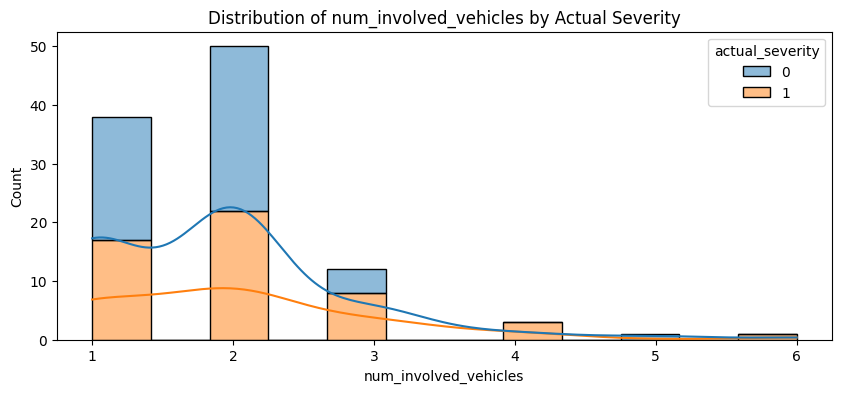

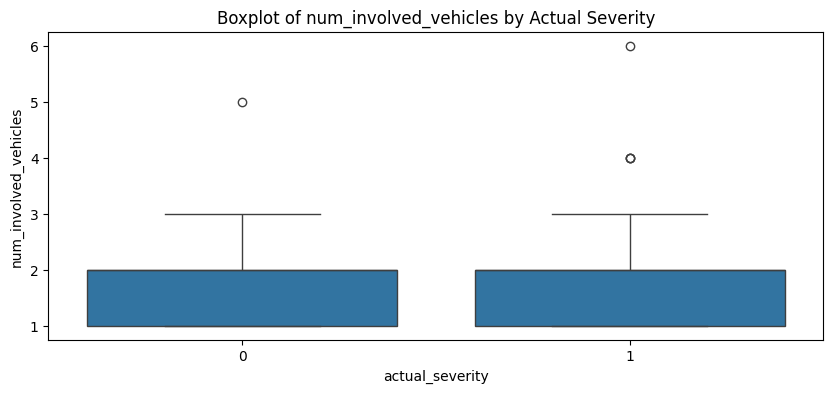

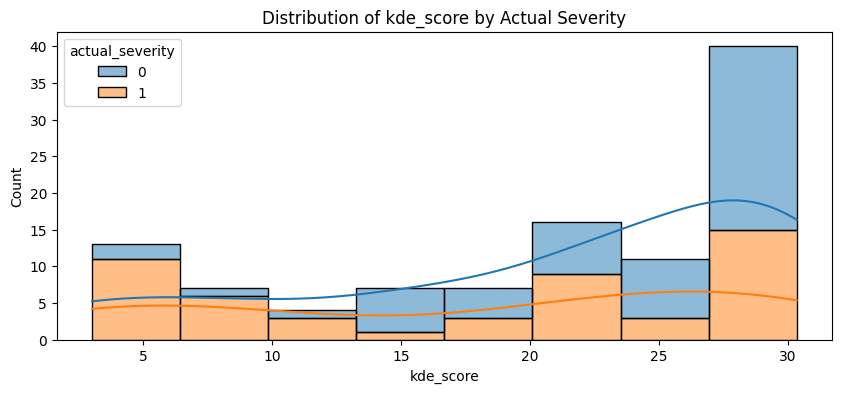

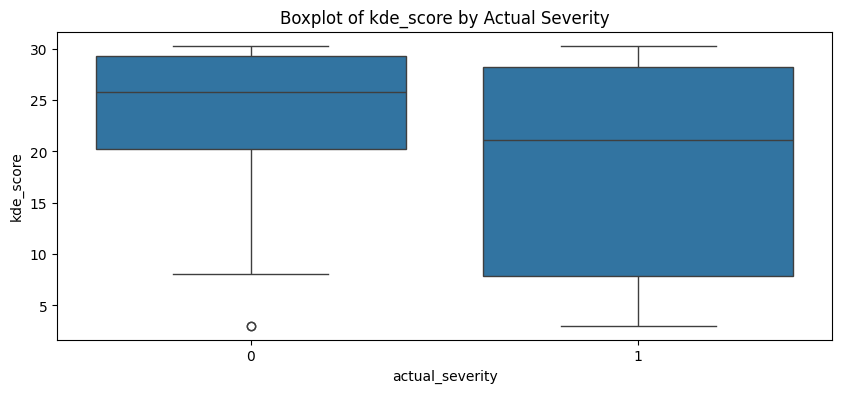


--- End of Error Analysis for: RUSBoost_Original ---


In [ ]:
# Assuming df_for_error_analysis is correctly set up (e.g., X_val_iter_2.copy())
# And relevant key_cats and key_nums lists are defined based on columns in df_for_error_analysis

# Example for one model:
model_key_to_analyze = 'RUSBoost_Original' # Use the full key from your trained_models_iter2
model_object_to_analyze = trained_models_iter_2.get(model_key_to_analyze)

analysis_output_df = perform_more_comprehensive_error_analysis(
    model_key_to_analyze,
    model_object_to_analyze,
    X_val_iter_2_iter_final, # Processed features for prediction
    y_val_iter_2,            # True labels
    df_for_error_analysis,   # Original interpretable features
    key_cats,
    key_nums
)

## precision-recall curve, roc validation set


Generating ROC and PR curves for: RUSBoost_Original


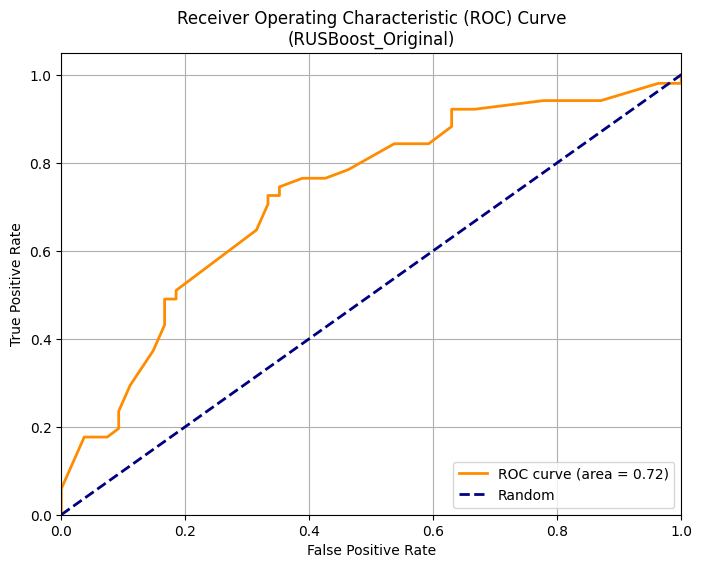

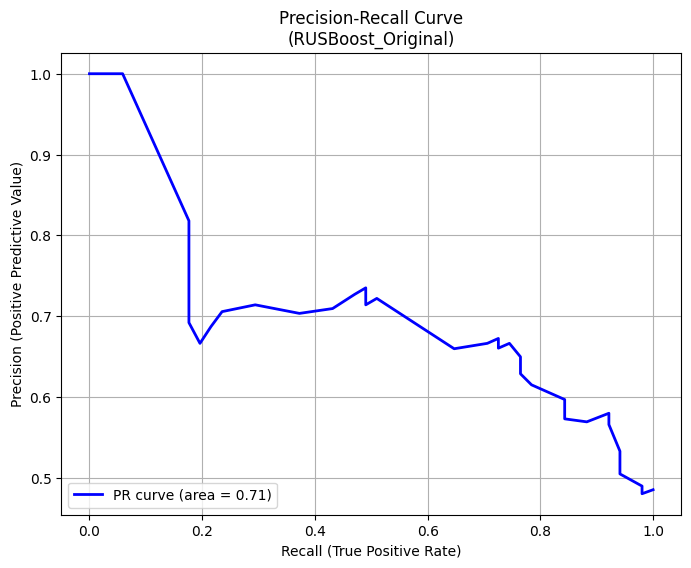

In [ ]:
# Make sure these libraries are imported at the top of your notebook or in an earlier cell
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, PrecisionRecallDisplay

# Assuming the previous code block defining model_key_to_analyze, model_object_to_analyze,
# and performing the error analysis has run.
# We need y_val_iter_2 (true labels) and y_proba_val_iter_2 (predicted probabilities)
# These variables should have been generated in the "model evaluation" cell if that cell ran successfully.

if 'model_object_to_analyze' in locals() and model_object_to_analyze is not None and \
   'X_val_iter_2_iter_final' in locals() and X_val_iter_2_iter_final is not None and \
   'y_val_iter_2' in locals() and y_val_iter_2 is not None:

    print(f"\nGenerating ROC and PR curves for: {model_key_to_analyze}")

    try:
        # Get predicted probabilities for the positive class (assuming it's label 1)
        # This should ideally be the same as y_proba_val_iter_2 generated during assessment
        y_proba = model_object_to_analyze.predict_proba(X_val_iter_2_iter_final)[:, 1]

        # --- Plot ROC Curve ---
        fpr, tpr, thresholds = roc_curve(y_val_iter_2, y_proba)
        roc_auc = auc(fpr, tpr) # Calculate Area Under the Curve

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic (ROC) Curve\n({model_key_to_analyze})')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.show()

        # --- Plot Precision-Recall Curve ---
        precision, recall, _ = precision_recall_curve(y_val_iter_2, y_proba)
        pr_auc = auc(recall, precision) # Calculate Area Under the Curve for PR Curve

        plt.figure(figsize=(8, 6))
        plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (area = {pr_auc:.2f})')
        plt.xlabel('Recall (True Positive Rate)')
        plt.ylabel('Precision (Positive Predictive Value)')
        plt.title(f'Precision-Recall Curve\n({model_key_to_analyze})')
        plt.legend(loc="lower left")
        plt.grid(True)
        plt.show()

        # Alternative way to plot PR curve using PrecisionRecallDisplay (requires scikit-learn >= 0.24)
        # try:
        #     disp = PrecisionRecallDisplay(precision=precision, recall=recall, average_precision=pr_auc)
        #     plt.figure(figsize=(8, 6))
        #     disp.plot(ax=plt.gca()) # Plot on current axes
        #     plt.title(f'Precision-Recall Curve\n({model_key_to_analyze})')
        #     plt.grid(True)
        #     plt.show()
        # except ImportError:
        #     print("scikit-learn version too old for PrecisionRecallDisplay.")


    except AttributeError:
        print(f"Model {model_key_to_analyze} does not have 'predict_proba' method. Cannot plot curves.")
    except Exception as e:
        print(f"An error occurred while plotting curves for {model_key_to_analyze}: {e}")

else:
    print("Skipping curve plotting: Model object, processed validation features, or true validation labels not available.")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns # Often used for better aesthetics

# Assuming the previous code blocks for training, evaluation, and error analysis have run.
# We need the model object: model_object_to_analyze
# We also need the names of the features *after* preprocessing, but *filtered* by RFECV.
# The 'selected_features_rfecv' variable created after the RFECV fitting step should contain these names.


if 'model_object_to_analyze' in locals() and model_object_to_analyze is not None and \
   'selected_features_rfecv' in locals() and selected_features_rfecv is not None: # Check for selected_features_rfecv

    print(f"\nAnalyzing Feature Coefficients for: {model_key_to_analyze}")

    # Check if the selected model is a Logistic Regression model
    if isinstance(model_object_to_analyze, LogisticRegression):
        # Check if the model has coefficients (fitted models will have this attribute)
        if hasattr(model_object_to_analyze, 'coef_'):

            # Logistic Regression has coef_ as a 2D array (n_classes, n_features)
            # For binary classification, it's typically (1, n_features) or (n_features,) depending on liblinear/saga solver
            # We are interested in the coefficients for the positive class (class 1, 'Death')
            # If coef_ is (1, n_features), select the first row [0, :]
            # If coef_ is (n_features,), just use it directly
            coefficients = model_object_to_analyze.coef_

            # Ensure coefficients is a 1D array for binary classification
            if coefficients.ndim > 1:
                if coefficients.shape[0] > 1:
                    print("Warning: Model coefficients shape > 1, assuming binary classification and taking coefficients for class 1.")
                    # Assuming class 1 is the positive class you're interested in
                    coef_positive_class = coefficients[1, :] # Take the row corresponding to class 1
                else: # Shape (1, n_features)
                    coef_positive_class = coefficients[0, :] # Take the first and only row
            else: # Shape (n_features,)
                 coef_positive_class = coefficients # Already 1D

            # Create a pandas Series to easily sort and manage coefficients with feature names
            # *** FIX APPLIED HERE: Use selected_features_rfecv as the index ***
            coef_series = pd.Series(coef_positive_class, index=selected_features_rfecv)

            # Calculate the absolute values of coefficients
            coef_series_abs = coef_series.abs()

            # Sort by absolute value to find the largest (most influential) coefficients
            sorted_coef_abs = coef_series_abs.sort_values(ascending=False)

            # Define the number of top features to display
            N_TOP_FEATURES = 20 # You can adjust this number

            # Get the top N features based on absolute coefficient values
            top_n_coef_abs = sorted_coef_abs.head(N_TOP_FEATURES)

            # Get the actual coefficients for these top features (maintaining the sign)
            top_n_coef = coef_series.loc[top_n_coef_abs.index]

            print(f"\nTop {N_TOP_FEATURES} Features by Absolute Coefficient Value:")
            # Print the top N coefficients and their feature names
            # Display as a DataFrame for better readability in a notebook
            try:
                display(top_n_coef.to_frame(name='Coefficient Value'))
            except NameError:
                 print(top_n_coef.to_frame(name='Coefficient Value'))


            # --- Plotting the coefficients ---
            plt.figure(figsize=(10, max(6, N_TOP_FEATURES * 0.3))) # Adjust figure height dynamically
            # Use a bar plot
            # You can color bars based on the sign if you want (positive/negative influence)
            # Or just plot the absolute values as suggested
            # Let's plot the actual coefficient values to see direction (positive/negative)
            top_n_coef.sort_values().plot(kind='barh', color=top_n_coef.sort_values().apply(lambda x: 'skyblue' if x > 0 else 'salmon'))

            plt.title(f'Top {N_TOP_FEATURES} Feature Coefficients (Absolute Value)\n({model_key_to_analyze})')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Feature')
            plt.tight_layout() # Adjust layout to prevent labels overlapping
            plt.show()

            # Optional: You can plot the absolute values as well
            plt.figure(figsize=(10, max(6, N_TOP_FEATURES * 0.3)))
            top_n_coef_abs.sort_values().plot(kind='barh', color='lightblue') # Plot absolute values

            plt.title(f'Top {N_TOP_FEATURES} Feature Absolute Coefficients\n({model_key_to_analyze})')
            plt.xlabel('Absolute Coefficient Value')
            plt.ylabel('Feature')
            plt.tight_layout()
            plt.show()


        else:
            print(f"Model {model_key_to_analyze} does not have 'coef_' attribute. It might not be a fitted Logistic Regression model.")
    else:
        print(f"Model {model_key_to_analyze} is not a Logistic Regression model. Coefficient analysis is not applicable in this way.")


else:
    print("Skipping coefficient analysis: Model object or selected feature names (from RFECV) are not available.")


Analyzing Feature Coefficients for: RUSBoost_Original
Model RUSBoost_Original is not a Logistic Regression model. Coefficient analysis is not applicable in this way.


## evaluation

In [ ]:
# Example:
best_model_key = 'RUSBoost_Original' # Or whatever your best model_sampler key was
if best_model_key in trained_models_iter_2:
    final_chosen_model = trained_models_iter_2[best_model_key]
else:
    print(f"Error: Best model key '{best_model_key}' not found in trained_models_iter_2.")
    final_chosen_model = None

In [ ]:
# Ensure all necessary functions (spatial engineering) and objects (fitted preprocessor,
# fitted RFECV selector, final_chosen_model) are available in the environment.
# Also, ensure metrics for evaluation are imported.
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, precision_recall_curve, auc
import pandas as pd # Ensure pandas is imported

print("\n--- Iteration 2: Preparing Test Set for Final Evaluation ---")


# Start with the pristine copy that has original lat/lng
if 'X_test_iter_2_original_from_split' in locals() and X_test_iter_2_original_from_split is not None:
    X_test_for_eval = X_test_iter_2_original_from_split.copy()

    # Now, the rest of the script proceeds:
    # 1. Apply Spatial Feature Engineering to X_test_for_eval
    #    (using X_train from iter2 for fitting bins/KDE as before)
    print("Applying spatial feature engineering to the test set for final evaluation...")
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_test_for_eval.columns and 'ΧΙΛ.ΘΕΣΗ' in X_test_for_eval.columns:
        X_test_for_eval = create_road_segment_feature_adjusted(X_test_for_eval, road_col='ΑΥΤ/ΔΡΟΜΟΣ', km_col='ΧΙΛ.ΘΕΣΗ' )
        print("Segment ID created for X_test_for_eval.")

    if 'lat' in X_test_for_eval.columns and 'lng' in X_test_for_eval.columns:
        # Use the preserved training set for fitting parameters
        if 'X_train_iter_2_for_fitting' in locals() and X_train_iter_2_for_fitting is not None:
            print("Using X_train_iter_2_for_fitting to derive bin edges and KDE model for test set.")

            X_test_for_eval = create_coordinate_bins(
                X_test_for_eval,
                lat_col='lat', lng_col='lng',
                n_bins=N_BINS,
                fit_df=X_train_iter_2_for_fitting.copy() # <-- Use the preserved copy
            )
            print(f"Coordinate bins ({N_BINS}x{N_BINS}) created for test set.")

            X_test_for_eval = apply_geohash(
                X_test_for_eval,
                lat_col='lat', lng_col='lng',
                precision=GEOHASH_PRECISION
            )
            print(f"Geohash (precision {GEOHASH_PRECISION}) features created for test set.")

            X_train_coords_for_kde_fit = X_train_iter_2_for_fitting[['lat', 'lng']].dropna() # <-- Use the preserved copy
            if not X_train_coords_for_kde_fit.empty:
                X_test_for_eval = apply_kde_score(
                    X_test_for_eval,
                    X_train_coords_for_kde_fit,
                    lat_col='lat', lng_col='lng',
                    bandwidth=KDE_BANDWIDTH
                )
                print("KDE scores created for test set.")
            else:
                print("Skipping KDE for test set: No valid coordinates in X_train_iter_2_for_fitting. Adding 'kde_score' column with 0.")
                X_test_for_eval['kde_score'] = 0.0
        else:
            print("CRITICAL ERROR: X_train_iter_2_for_fitting (original train split with lat/lng) not available for test set processing.")
            # Handle error: test results would be invalid.
            # Add dummy columns if these steps are skipped to avoid downstream errors, matching training
            if f'grid_cell_{N_BINS}x{N_BINS}' not in X_test_for_eval.columns: X_test_for_eval[f'grid_cell_{N_BINS}x{N_BINS}'] = 'unknown_cell'
            if f'geohash_p{GEOHASH_PRECISION}' not in X_test_for_eval.columns: X_test_for_eval[f'geohash_p{GEOHASH_PRECISION}'] = 'unknown_geohash'
            if 'kde_score' not in X_test_for_eval.columns: X_test_for_eval['kde_score'] = 0.0
    else:
        print("CRITICAL: lat/lng not found in X_test_for_eval at start of test processing. Spatial features (bins, geohash, KDE) will be missing or dummied.")
        # Add dummy columns if these features were expected by preprocessor_iter2
        if f'grid_cell_{N_BINS}x{N_BINS}' not in X_test_for_eval.columns: X_test_for_eval[f'grid_cell_{N_BINS}x{N_BINS}'] = 'unknown_cell'
        if f'geohash_p{GEOHASH_PRECISION}' not in X_test_for_eval.columns: X_test_for_eval[f'geohash_p{GEOHASH_PRECISION}'] = 'unknown_geohash'
        if 'kde_score' not in X_test_for_eval.columns: X_test_for_eval['kde_score'] = 0.0

    # 2. Drop raw lat/lng columns (if this was done for training/validation)
    columns_to_drop_after_spatial_eng = ['lat', 'lng']
    if all(col in X_test_for_eval.columns for col in columns_to_drop_after_spatial_eng):
        X_test_for_eval = X_test_for_eval.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
        print(f"Dropped raw spatial columns from test set: {columns_to_drop_after_spatial_eng}")
    else:
        print("Skipping lat/lng drop for test set, columns not found or already dropped.")

    # 3. Apply the FITTED ColumnTransformer (preprocessor)
    # DO NOT RE-FIT IT ON THE TEST DATA
    if 'preprocessor' in locals() and preprocessor is not None:
        print("Applying fitted preprocessor to the test set...")
        try:
            X_test_processed = preprocessor.transform(X_test_for_eval)

            # Get feature names from the preprocessor (should match training)
            # Ensure feature_names_out was stored from fitting preprocessor
            if 'feature_names_out' in locals() and feature_names_out is not None:
                 X_test_processed_df = pd.DataFrame(X_test_processed, columns=feature_names_out, index=X_test_for_eval.index)
            else: # Fallback if feature_names_out wasn't captured properly
                print("Warning: feature_names_out not available. Using generic column names for processed test data.")
                X_test_processed_df = pd.DataFrame(X_test_processed, index=X_test_for_eval.index)

            print(f"Test set processed. Shape: {X_test_processed_df.shape}")

        except Exception as e:
            print(f"Error applying preprocessor to test set: {e}")
            X_test_processed_df = None # Ensure it's None if error
    else:
        print("Error: Fitted preprocessor not found.")
        X_test_processed_df = None

    # 4. Apply FITTED RFE/RFECV feature selection
    # Use the support_ mask from the rfecv object that was fit on X_train_iter_2_processed_df
    # DO NOT RE-FIT RFECV ON THE TEST DATA
    X_test_final_features = None
    if X_test_processed_df is not None:
        if 'rfecv' in locals() and rfecv is not None and hasattr(rfecv, 'support_'): # Assuming rfecv is your fitted RFECV object
            print("Applying RFECV feature selection to the processed test set...")
            try:
                selected_features_mask_from_training = rfecv.support_
                # Ensure columns align if X_test_processed_df was created with generic names
                if X_test_processed_df.shape[1] == len(selected_features_mask_from_training):
                    X_test_final_features = X_test_processed_df.loc[:, selected_features_mask_from_training]
                    print(f"Test set features selected by RFECV. Shape: {X_test_final_features.shape}")
                else:
                    print(f"Error: Column mismatch between processed test set ({X_test_processed_df.shape[1]}) and RFECV mask ({len(selected_features_mask_from_training)}). Cannot apply RFE selection.")
                    X_test_final_features = None

            except Exception as e:
                print(f"Error applying RFECV selection to test set: {e}")
                X_test_final_features = None
        elif 'rfe_iter2' in locals() and rfe_iter2 is not None and hasattr(rfe_iter2, 'support_'): # Fallback if you used rfe_iter2 (plain RFE)
            print("Applying RFE feature selection to the processed test set...")
            try:
                selected_features_mask_from_training = rfe_iter2.support_
                if X_test_processed_df.shape[1] == len(selected_features_mask_from_training):
                    X_test_final_features = X_test_processed_df.loc[:, selected_features_mask_from_training]
                    print(f"Test set features selected by RFE. Shape: {X_test_final_features.shape}")
                else:
                    print(f"Error: Column mismatch for RFE. Cannot apply RFE selection.")
                    X_test_final_features = None
            except Exception as e:
                print(f"Error applying RFE selection to test set: {e}")
                X_test_final_features = None
        else:
            print("Error: Fitted RFE/RFECV object not found or doesn't have 'support_'. Assuming all processed features are used.")
            # This would happen if RFE/RFECV was skipped or failed during training.
            # In this case, X_test_final_features would be X_test_processed_df
            X_test_final_features = X_test_processed_df


    # 5. Make Predictions with the Final Chosen Model
    if X_test_final_features is not None and 'final_chosen_model' in locals() and final_chosen_model is not None:
        print(f"\n--- Final Evaluation on Test Set using: {type(final_chosen_model).__name__} (trained with appropriate balancing) ---")

        if 'y_test_iter_2' not in locals() or y_test_iter_2 is None:
            print("Error: y_test_iter_2 (true labels for test set) not found.")
        else:
            try:
                y_pred_test = final_chosen_model.predict(X_test_final_features)

                # Ensure y_test_iter_2 has the same index as X_test_final_features if it's a Series for alignment,
                # though usually for metrics, direct array/Series comparison works if lengths match.
                # For safety, ensure y_test_iter_2 is aligned if X_test_final_features index was preserved.
                y_true_test_aligned = y_test_iter_2.loc[X_test_final_features.index]


                if hasattr(final_chosen_model, "predict_proba"):
                    y_proba_test = final_chosen_model.predict_proba(X_test_final_features)[:, 1]
                    roc_auc_test = roc_auc_score(y_true_test_aligned, y_proba_test)
                    precision_pr_test, recall_pr_test, _ = precision_recall_curve(y_true_test_aligned, y_proba_test)
                    pr_auc_test = auc(recall_pr_test, precision_pr_test)
                    print(f"ROC AUC (Test): {roc_auc_test:.4f}")
                    print(f"PR AUC (Test): {pr_auc_test:.4f}")
                else:
                    print("ROC AUC / PR AUC not available as model doesn't have predict_proba.")

                print("\nClassification Report (Test Set):")
                print(classification_report(y_true_test_aligned, y_pred_test, target_names=['Short (0)', 'Long (1)'], zero_division=0))

                print("\nConfusion Matrix (Test Set):")
                print(confusion_matrix(y_true_test_aligned, y_pred_test))
            except Exception as e:
                print(f"Error during test set prediction or evaluation: {e}")
    else:
        if 'final_chosen_model' not in locals() or final_chosen_model is None:
            print("Error: final_chosen_model is not defined. Please specify your best model.")
        if X_test_final_features is None:
            print("Error: Final test set features (X_test_final_features) are not available for prediction.")


--- Iteration 2: Preparing Test Set for Final Evaluation ---
Applying spatial feature engineering to the test set for final evaluation...
Segment ID created for X_test_for_eval.
Using X_train_iter_2_for_fitting to derive bin edges and KDE model for test set.
Coordinate bins (8x8) created for test set.
Geohash (precision 7) features created for test set.
KDE scores created for test set.
Dropped raw spatial columns from test set: ['lat', 'lng']
Applying fitted preprocessor to the test set...
Test set processed. Shape: (105, 682)
Applying RFECV feature selection to the processed test set...
Test set features selected by RFECV. Shape: (105, 256)

--- Final Evaluation on Test Set using: RUSBoostClassifier (trained with appropriate balancing) ---
ROC AUC (Test): 0.7914
PR AUC (Test): 0.7692

Classification Report (Test Set):
              precision    recall  f1-score   support

   Short (0)       0.76      0.63      0.69        54
    Long (1)       0.67      0.78      0.72        51

    

## precision-recall, roc curve test set


Generating ROC and PR curves for the TEST SET using model: RUSBoost_Original


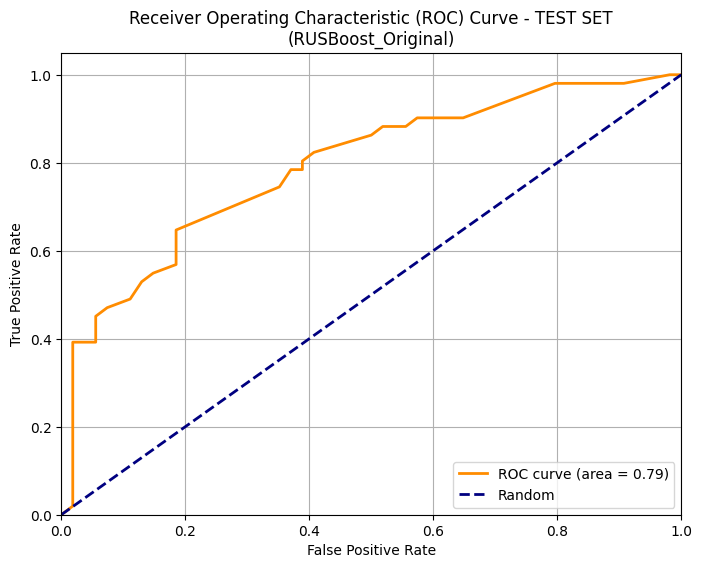

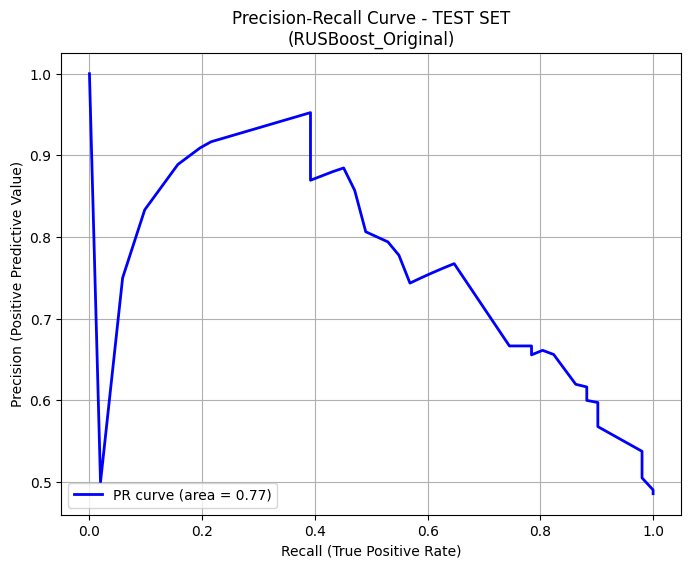

In [ ]:
## precision-recall curve and roc for the test set

# Make sure these libraries are imported at the top of your notebook or in an earlier cell
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, PrecisionRecallDisplay

# We need the chosen trained model, the processed test features, and the true test labels.
# Assuming the model_object_to_analyze is the best model selected from the validation step,
# and X_test_iter_2_iter_final and y_test_iter_2 are available from the data splitting and processing steps.

if 'model_object_to_analyze' in locals() and model_object_to_analyze is not None and \
   'X_test_iter_2_iter_final' in locals() and X_test_iter_2_iter_final is not None and \
   'y_test_iter_2' in locals() and y_test_iter_2 is not None:

    print(f"\nGenerating ROC and PR curves for the TEST SET using model: {model_key_to_analyze}")

    try:
        # Get predicted probabilities for the positive class (assuming it's label 1) on the TEST set
        y_proba_test = model_object_to_analyze.predict_proba(X_test_iter_2_iter_final)[:, 1]

        # --- Plot ROC Curve for Test Set ---
        fpr_test, tpr_test, thresholds_test = roc_curve(y_test_iter_2, y_proba_test)
        roc_auc_test = auc(fpr_test, tpr_test) # Calculate Area Under the Curve

        plt.figure(figsize=(8, 6))
        plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_test:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic (ROC) Curve - TEST SET\n({model_key_to_analyze})')
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.show()

        # --- Plot Precision-Recall Curve for Test Set ---
        precision_test, recall_test, _ = precision_recall_curve(y_test_iter_2, y_proba_test)
        pr_auc_test = auc(recall_test, precision_test) # Calculate Area Under the Curve for PR Curve

        plt.figure(figsize=(8, 6))
        plt.plot(recall_test, precision_test, color='blue', lw=2, label=f'PR curve (area = {pr_auc_test:.2f})')
        plt.xlabel('Recall (True Positive Rate)')
        plt.ylabel('Precision (Positive Predictive Value)')
        plt.title(f'Precision-Recall Curve - TEST SET\n({model_key_to_analyze})')
        plt.legend(loc="lower left")
        plt.grid(True)
        plt.show()

    except AttributeError:
        print(f"Model {model_key_to_analyze} does not have 'predict_proba' method. Cannot plot curves for test set.")
    except Exception as e:
        print(f"An error occurred while plotting test set curves for {model_key_to_analyze}: {e}")

else:
    print("Skipping test set curve plotting: Chosen model object, processed test features, or true test labels not available.")

## permutation analysis

In [ ]:
# (Existing code for Iteration 2 test set PR/ROC curves ends here)
# ...
# plt.show() # Last line of PR curve plotting for Iteration 2 test set

print("\n--- Iteration 2: Permutation Importance on Test Set ---")

# We will use 'model_object_to_analyze' (the best model from Iteration 2, used for PR/ROC curves),
# 'X_test_iter_2_iter_final' (processed test features for Iteration 2),
# and 'y_test_iter_2' (true test labels for Iteration 2).
# 'selected_features_rfecv' should hold the feature names from Iteration 2's RFECV.

if ('model_object_to_analyze' in locals() and model_object_to_analyze is not None and
    'X_test_iter_2_iter_final' in locals() and X_test_iter_2_iter_final is not None and not X_test_iter_2_iter_final.empty and
    'y_test_iter_2' in locals() and y_test_iter_2 is not None and
    'selected_features_rfecv' in locals() and selected_features_rfecv is not None and
    len(selected_features_rfecv) == X_test_iter_2_iter_final.shape[1]): # Crucial check for feature name alignment

    current_model_name_for_perm = model_key_to_analyze # From the PR/ROC curve section
    print(f"Calculating Permutation Importance for model: {current_model_name_for_perm} on Iteration 2 test set.")

    # Define the scorer: F1 score for the positive class ('Long' duration)
    # Assuming positive_label=1 for 'Long' duration accidents
    f1_long_scorer_perm = make_scorer(f1_score, pos_label=1, average='binary', zero_division=0)

    try:
        perm_importance_results_test_iter2 = permutation_importance(
            model_object_to_analyze,
            X_test_iter_2_iter_final, # Processed and feature-selected test data
            y_test_iter_2,            # True labels for the test set
            scoring=f1_long_scorer_perm,
            n_repeats=10,             # Number of times to permute a feature
            random_state=42,
            n_jobs=-1                 # Use all available cores
        )

        # Get sorted feature importances (mean)
        sorted_idx_perm_test_iter2 = perm_importance_results_test_iter2.importances_mean.argsort()

        # Plotting the permutation importances
        plt.figure(figsize=(12, max(8, len(selected_features_rfecv) * 0.3))) # Adjust height based on num features
        plt.barh(
            X_test_iter_2_iter_final.columns[sorted_idx_perm_test_iter2], # Feature names
            perm_importance_results_test_iter2.importances_mean[sorted_idx_perm_test_iter2]
        )
        plt.xlabel(f"Permutation Importance (Mean Decrease in F1 Score - Long Class)")
        plt.title(f"Permutation Importance for {current_model_name_for_perm} (Iteration 2 Test Set)")
        plt.tight_layout()
        plt.show()

        # Display top N mean importances as a Series/DataFrame for clarity
        top_n_features_perm_iter2 = 20 # Or however many you want to see
        perm_mean_series_test_iter2 = pd.Series(
            perm_importance_results_test_iter2.importances_mean,
            index=X_test_iter_2_iter_final.columns
        )
        print(f"\nTop {top_n_features_perm_iter2} Features by Permutation Importance (Iteration 2 Test Set - Mean Decrease in F1 Long):")

        # Ensure display works, fallback to print
        top_features_display_iter2 = perm_mean_series_test_iter2.sort_values(ascending=False).head(top_n_features_perm_iter2).to_frame(name="Mean F1 Decrease")
        try:
            from IPython.display import display
            display(top_features_display_iter2)
        except ImportError:
            print(top_features_display_iter2)

    except Exception as e_perm_test_iter2:
        print(f"Error calculating Permutation Importance on Iteration 2 test set: {e_perm_test_iter2}")
else:
    print("Skipping Permutation Importance on Iteration 2 test set due to missing variables or mismatched feature names.")
    if not ('model_object_to_analyze' in locals() and model_object_to_analyze is not None):
        print("- 'model_object_to_analyze' from Iteration 2 is missing.")
    if not ('X_test_iter_2_iter_final' in locals() and X_test_iter_2_iter_final is not None and not X_test_iter_2_iter_final.empty):
        print("- 'X_test_iter_2_iter_final' (processed test data for Iteration 2) is missing or empty.")
    if not ('y_test_iter_2' in locals() and y_test_iter_2 is not None):
        print("- 'y_test_iter_2' (test labels for Iteration 2) is missing.")
    if not ('selected_features_rfecv' in locals() and selected_features_rfecv is not None):
        print("- 'selected_features_rfecv' (feature names from Iteration 2 RFECV) is missing.")
    elif 'X_test_iter_2_iter_final' in locals() and X_test_iter_2_iter_final is not None and 'selected_features_rfecv' in locals() and selected_features_rfecv is not None:
         if len(selected_features_rfecv) != X_test_iter_2_iter_final.shape[1]:
            print(f"- Mismatch: len(selected_features_rfecv)={len(selected_features_rfecv)}, X_test_iter_2_iter_final.shape[1]={X_test_iter_2_iter_final.shape[1]}")


--- Iteration 2: Permutation Importance on Test Set ---
Calculating Permutation Importance for model: RUSBoost_Original on Iteration 2 test set.
Error calculating Permutation Importance on Iteration 2 test set: name 'permutation_importance' is not defined


In [ ]:
print("\n--- Iteration 2: Filtered Permutation Importance on Test Set (Mean Importance > 0) ---")

# Ensure necessary variables are available from the previous Permutation Importance block
if ('model_object_to_analyze' in locals() and model_object_to_analyze is not None and
    'X_test_iter_2_iter_final' in locals() and X_test_iter_2_iter_final is not None and not X_test_iter_2_iter_final.empty and
    'y_test_iter_2' in locals() and y_test_iter_2 is not None and
    'selected_features_rfecv' in locals() and selected_features_rfecv is not None and
    len(selected_features_rfecv) == X_test_iter_2_iter_final.shape[1]):

    current_model_name_for_perm = model_key_to_analyze # From the PR/ROC curve section

    # Ensure permutation importance results are available from the previous calculation
    if 'perm_importance_results_test_iter2' in locals():

        print(f"Filtering and Plotting Permutation Importance for model: {current_model_name_for_perm}")

        # Get the mean importances as a pandas Series
        perm_mean_series_test_iter2 = pd.Series(
            perm_importance_results_test_iter2.importances_mean,
            index=X_test_iter_2_iter_final.columns
        )

        # --- Filter features with mean importance > 0 ---
        positive_importance_features = perm_mean_series_test_iter2[perm_mean_series_test_iter2 > 0]

        if positive_importance_features.empty:
            print("\nNo features found with mean permutation importance > 0.")
        else:
            # Sort the filtered features by importance
            sorted_positive_importance = positive_importance_features.sort_values(ascending=False)

            print(f"\nPlotting {len(sorted_positive_importance)} Features with Mean Permutation Importance > 0 (Iteration 2 Test Set):")

            # --- Plotting the filtered permutation importances ---
            plt.figure(figsize=(12, max(8, len(sorted_positive_importance) * 0.3))) # Adjust height
            plt.barh(
                sorted_positive_importance.index, # Feature names with > 0 importance
                sorted_positive_importance.values   # Mean importance values > 0
            )
            plt.xlabel(f"Permutation Importance (Mean Decrease in F1 Score - Long Class)")
            # plt.title(f"Filtered Permutation Importance (Mean Importance > 0)\nfor {current_model_name_for_perm} (Iteration 2 Test Set)")
            plt.tight_layout()
            plt.show()

            # Optional: Display the filtered features and their importance values
            print("\nFeatures with Mean Permutation Importance > 0:")
            try:
                 display(sorted_positive_importance.to_frame(name="Mean F1 Decrease"))
            except ImportError:
                 print(sorted_positive_importance.to_frame(name="Mean F1 Decrease"))

    else:
        print("Skipping filtered plot: Permutation importance results ('perm_importance_results_test_iter2') not found. Please run the previous permutation analysis cell first.")

else:
    print("Skipping filtered permutation importance plot due to missing variables or mismatched feature names. Please ensure the previous permutation analysis cell ran successfully.")
    # Add specific missing variable checks for debugging if needed, similar to the previous block


--- Iteration 2: Filtered Permutation Importance on Test Set (Mean Importance > 0) ---
Skipping filtered plot: Permutation importance results ('perm_importance_results_test_iter2') not found. Please run the previous permutation analysis cell first.


# Iteration 3

## definition of target variable

In [ ]:
import pandas as pd
import numpy as np

# Assuming 'df' is your initial DataFrame loaded from the CSV.
# Create a fresh copy for this new iteration to avoid interference
# if df_original was modified extensively in previous iterations.
df_iteration_p75 = df.copy() # Using a new copy for this iteration

if df_iteration_p75 is not None and 'duration_minutes' in df_iteration_p75.columns:
    # --- 1. Calculate the 75th Percentile Threshold ---
    percentile_75_duration = df_iteration_p75['duration_minutes'].quantile(0.75)
    print(f"Calculated 75th Percentile Duration (threshold): {percentile_75_duration:.2f} minutes")

    # --- 2. Create the Binary Target Variable 'duration_long_accident_p75' ---
    # 1 if duration_minutes > percentile_75_duration, 0 otherwise
    df_iteration_p75['duration_long_accident_p75'] = np.where(
        df_iteration_p75['duration_minutes'] > percentile_75_duration, 1, 0
    )

    print(f"\n--- Target Variable Distribution ('duration_long_accident_p75' based on 75th Percentile) ---")
    print(df_iteration_p75['duration_long_accident_p75'].value_counts(normalize=True))
    print("\nValue Counts:")
    print(df_iteration_p75['duration_long_accident_p75'].value_counts())

    # Display the first few rows with the new column and original duration
    print(f"\n--- DataFrame Head with new 'duration_long_accident_p75' column ---")
    cols_to_show = ['duration_minutes', 'duration_long_accident_p75']
    try:
        # Assuming 'display' is available in your environment (e.g., Jupyter)
        from IPython.display import display
        display(df_iteration_p75[cols_to_show].head())
    except ImportError:
        print(df_iteration_p75[cols_to_show].head())

    # You can also check a few rows where duration_minutes is around the threshold
    print(f"\n--- Sample rows around the P75 threshold ({percentile_75_duration:.2f} min) ---")
    sample_around_threshold = df_iteration_p75[
        (df_iteration_p75['duration_minutes'] >= percentile_75_duration - 5) &
        (df_iteration_p75['duration_minutes'] <= percentile_75_duration + 5)
    ][cols_to_show].sort_values(by='duration_minutes')
    try:
        display(sample_around_threshold.head(10))
    except NameError:
        print(sample_around_threshold.head(10))

else:
    if df_iteration_p75 is None:
        print("DataFrame was not loaded. Cannot create target variable.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame.")
        # print(f"Available columns are: {df_iteration_p75.columns.tolist()}") # Uncomment to see columns

Calculated 75th Percentile Duration (threshold): 75.00 minutes

--- Target Variable Distribution ('duration_long_accident_p75' based on 75th Percentile) ---
duration_long_accident_p75
0    0.753346
1    0.246654
Name: proportion, dtype: float64

Value Counts:
duration_long_accident_p75
0    394
1    129
Name: count, dtype: int64

--- DataFrame Head with new 'duration_long_accident_p75' column ---


,duration_minutes,duration_long_accident_p75
0,43.0,0
1,106.0,1
2,66.0,0
3,20.0,0
4,65.0,0



--- Sample rows around the P75 threshold (75.00 min) ---


,duration_minutes,duration_long_accident_p75
275,70.0,0
349,70.0,0
208,70.0,0
430,70.0,0
442,70.0,0
407,71.0,0
179,71.0,0
40,71.0,0
363,71.0,0
455,71.0,0


## definition of columns

In [ ]:
if df_iteration_p75 is not None:
    columns_iter3 = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ',
        'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
        'ΚΑΤ._ΟΔ.','ΤΕΧΝ._ΦΩΤ.', #'accident_type', # This is now our target or related to it
        'lat', 'lng', 'num_involved_vehicles', 'has_ΙΧΕ',
        'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ',
        'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'duration_long_accident_p75', # Keep the target variable
        'effective_lighting_condition',# replacing ΤΕΧΝ._ΦΩΤ. with effective_lighting_condition
    ]
    # Ensure all selected columns exist in df_iteration_p75
    columns_iter3 = [col for col in columns_iter3 if col in df_iteration_p75.columns]
    if 'duration_long_accident_p75' not in columns_iter3 and 'duration_long_accident_p75' in df_iteration_p75.columns:
         columns_iter3.append('duration_long_accident_p75')


    df_iter3 = df_iteration_p75[columns_iter3].copy()
    print(f"\n--- Iteration 3: Working with {len(df_iter3.columns)-1} features ---")
    # display(df_iter1.head())



--- Iteration 3: Working with 20 features ---


## stratified data splitting

In [ ]:
if 'df_iter3' in locals() and df_iter3 is not None:
    X = df_iter3.drop('duration_long_accident_p75', axis=1)
    y = df_iter3['duration_long_accident_p75']

    # Split into Train (60%) and Temp (40% for Val+Test)
    X_train_iter_3, X_temp_iter_3, y_train_iter_3, y_temp_iter_3 = train_test_split(
        X, y, test_size=0.4, random_state=42, stratify=y
    )

    # Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
    X_val_iter_3, X_test_iter_3, y_val_iter_3, y_test_iter_3 = train_test_split(
        X_temp_iter_3, y_temp_iter_3, test_size=0.5, random_state=42, stratify=y_temp_iter_3
    )

    print(f"Training set: {X_train_iter_3.shape}, {y_train_iter_3.shape}, Minority class: {Counter(y_train_iter_3)[1]}")
    print(f"Validation set: {X_val_iter_3.shape}, {y_val_iter_3.shape}, Minority class: {Counter(y_val_iter_3)[1]}")
    print(f"Test set: {X_test_iter_3.shape}, {y_test_iter_3.shape}, Minority class: {Counter(y_test_iter_3)[1]}")


Training set: (313, 20), (313,), Minority class: 77
Validation set: (105, 20), (105,), Minority class: 26
Test set: (105, 20), (105,), Minority class: 26


In [ ]:
X_train_iter_3_for_fitting = X_train_iter_3.copy()
X_test_iter_3_original_from_split = X_test_iter_3.copy() # You likely already do this or similar

print("Saved a pristine copy of X_train_iter_3 (for fitting spatial transforms on val/test) and X_test_iter_3.")


Saved a pristine copy of X_train_iter_3 (for fitting spatial transforms on val/test) and X_test_iter_3.


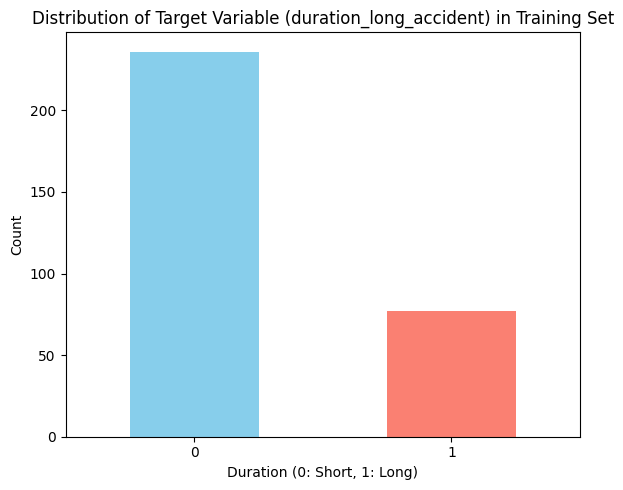

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming y_train_iter_3 is your target variable for the training set
if 'y_train_iter_3' in locals():
    plt.figure(figsize=(6, 5))
    # Use value_counts to get the counts of each category (0 and 1)
    # sort_index() ensures the bars are in order 0, 1
    y_train_iter_3.value_counts().sort_index().plot(kind='bar', color=['skyblue', 'salmon'])

    plt.title('Distribution of Target Variable (duration_long_accident) in Training Set')
    plt.xlabel('Duration (0: Short, 1: Long)')
    plt.ylabel('Count')
    plt.xticks(rotation=0) # Keep labels horizontal
    plt.tight_layout() # Adjust layout to prevent labels overlapping
    plt.show()
else:
    print("Target variable y_train_iter_3 not available. Please ensure data splitting was successful.")

## spatial feature engineering

In [ ]:
if 'X_train_iter_3' in locals() and 'lat' in X_train_iter_3.columns and 'lng' in X_train_iter_3.columns: # Check if data and columns exist
    N_BINS = 8 # Example number of bins for gridding
    GEOHASH_PRECISION = 7 # Example geohash precision
    KDE_BANDWIDTH = 0.05 # Example KDE bandwidth - VERY SENSITIVE, needs tuning/domain knowledge

    # --- Create Road Segment ID using the adjusted function ---
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train_iter_3.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train_iter_3.columns:
        # Call the adjusted function
        X_train_iter_3 = create_road_segment_feature_adjusted(X_train_iter_3)
        X_val_iter_3 = create_road_segment_feature_adjusted(X_val_iter_3)
        X_test_iter_3 = create_road_segment_feature_adjusted(X_test_iter_3)
        print("Adjusted road segment ID feature created.")
        # You can check the counts of the new categories:
        # print("Value counts for adjusted segment_id in X_train_iter_3:")
        # print(X_train_iter_3['segment_id'].value_counts().head(10))
    else:
        print("Skipping road segment ID creation: Required columns not found.")


    # --- Apply Coordinate Binning ---
    # (No changes needed here, ensure 'lat'/'lng' are present if you run this)
    if 'lat' in X_train_iter_3.columns and 'lng' in X_train_iter_3.columns:
        X_train_iter_3 = create_coordinate_bins(X_train_iter_3, n_bins=N_BINS, fit_df=X_train_iter_3.copy())
        X_val_iter_3 = create_coordinate_bins(X_val_iter_3, n_bins=N_BINS, fit_df=X_train_iter_3.copy())
        X_test_iter_3 = create_coordinate_bins(X_test_iter_3, n_bins=N_BINS, fit_df=X_train_iter_3.copy())
        print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
    else:
        print("Skipping coordinate binning: lat/lng columns not found.")


    # --- Apply Geohashing ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_3.columns and 'lng' in X_train_iter_3.columns:
        X_train_iter_3 = apply_geohash(X_train_iter_3, precision=GEOHASH_PRECISION)
        X_val_iter_3 = apply_geohash(X_val_iter_3, precision=GEOHASH_PRECISION)
        X_test_iter_3 = apply_geohash(X_test_iter_3, precision=GEOHASH_PRECISION)
        print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
    else:
        print("Skipping geohashing: lat/lng columns not found.")


    # --- Apply KDE Score ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_3.columns and 'lng' in X_train_iter_3.columns:
        X_train_iter_3_coords_for_kde = X_train_iter_3[['lat', 'lng']].dropna()
        if not X_train_iter_3_coords_for_kde.empty:
            X_train_iter_3 = apply_kde_score(X_train_iter_3.dropna(subset=['lat', 'lng']), X_train_iter_3_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_val_iter_3 = apply_kde_score(X_val_iter_3.dropna(subset=['lat', 'lng']), X_train_iter_3_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_test_iter_3 = apply_kde_score(X_test_iter_3.dropna(subset=['lat', 'lng']), X_train_iter_3_coords_for_kde, bandwidth=KDE_BANDWIDTH)

            # X_train_iter_3['kde_score'].fillna(0.0, inplace=True)
            X_train_iter_3.fillna({'kde_score':0.0},inplace=True)
            # X_val_iter_3['kde_score'].fillna(0.0, inplace=True)
            X_val_iter_3.fillna({'kde_score':0.0},inplace=True)
            # X_test_iter_3['kde_score'].fillna(0.0, inplace=True)
            X_test_iter_3.fillna({'kde_score':0.0},inplace=True)

            print("KDE scores created.")
        else:
            print("Skipping KDE: No valid coordinates in X_train_iter_3 to fit KDE.")
            X_train_iter_3['kde_score'] = 0.0
            X_val_iter_3['kde_score'] = 0.0
            X_test_iter_3['kde_score'] = 0.0
    else:
        print("Skipping KDE score: lat/lng columns not found.")


    # Display some of the new features
    # (Ensure the column name for segment_id matches what's created, e.g. 'segment_id')
    new_spatial_cols = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_3.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_3.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'kde_score' in X_train_iter_3.columns: new_spatial_cols.append('kde_score')
    # Check for the actual segment_id column name, assuming it's 'segment_id' from prefix='segment'
    if 'segment_id' in X_train_iter_3.columns: new_spatial_cols.append('segment_id')

    new_spatial_cols = [col for col in new_spatial_cols if col in X_train_iter_3.columns]
    if new_spatial_cols:
        print("\nSample of new spatial features in X_train_iter_3:")
        # In Colab, display() is better for DataFrames
        try:
            display(X_train_iter_3[new_spatial_cols].head())
        except NameError: # If display() is not available (e.g. standard Python script)
            print(X_train_iter_3[new_spatial_cols].head())

    else:
        print("\nNo new spatial features were added or found to display.")

else:
    print("Skipping spatial feature engineering: X_train_iter_3 or key columns not available.")

Adjusted road segment ID feature created.
Coordinate bins (8x8) created.
Geohash (precision 7) features created.
KDE scores created.

Sample of new spatial features in X_train_iter_3:


,grid_cell_8x8,geohash_p7,kde_score,segment_id
35,1_7,sw8zzd3,12.901846,E_44.0
176,7_2,swbb9tg,5.695342,A_11.6
367,7_3,swbbdgc,8.878136,N_16.5
101,5_5,swbbq5e,28.500867,E_30.5
170,4_6,swbbpnj,22.241806,A_36.4


In [ ]:
# X_train_iter_3, X_val_iter_3, X_test_iter_3 are your dataframes after spatial features are engineered
columns_to_drop_after_spatial_eng = ['lat', 'lng'] # Add any other raw source columns if needed

X_train_iter_3 = X_train_iter_3.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_val_iter_3 = X_val_iter_3.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_test_iter_3 = X_test_iter_3.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')

print(f"Dropped raw spatial columns: {columns_to_drop_after_spatial_eng}")

Dropped raw spatial columns: ['lat', 'lng']


## preprocessing

In [ ]:
if 'X_train_iter_3' in locals():
    # Identify feature types AFTER new spatial features are created
    # New categorical features from spatial engineering:
    new_cat_spatial_features = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_3.columns: new_cat_spatial_features.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_3.columns: new_cat_spatial_features.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'segment_id' in X_train_iter_3.columns: new_cat_spatial_features.append('segment_id')
    # Add more if you create other categorical spatial features e.g. lat_bin_N, lng_bin_N as separate features

    # New numerical features from spatial engineering:
    new_num_spatial_features = []
    if 'kde_score' in X_train_iter_3.columns: new_num_spatial_features.append('kde_score')


    all_categorical_features = X_train_iter_3.select_dtypes(include=['object', 'category']).columns.tolist()
    # Ensure our new spatial categoricals are included if not automatically detected as object/category
    for f in new_cat_spatial_features:
        if f not in all_categorical_features and f in X_train_iter_3.columns:
            all_categorical_features.append(f)
            X_train_iter_3[f] = X_train_iter_3[f].astype('category') # Ensure correct dtype
            X_val_iter_3[f] = X_val_iter_3[f].astype('category')
            X_test_iter_3[f] = X_test_iter_3[f].astype('category')


    # Features for 'unknown' imputation (original list)
    categorical_features_unknown_impute = [
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', "weather_description", 'effective_lighting_condition'
    ]
    categorical_features_unknown_impute = [col for col in categorical_features_unknown_impute if col in X_train_iter_3.columns and col in all_categorical_features]


    # Other categorical features (if any) for 'most_frequent' imputation
    # This will now include new_cat_spatial_features if they are not in the unknown_impute list
    categorical_features_mode_impute = [
        col for col in all_categorical_features if col not in categorical_features_unknown_impute
    ]

    boolean_features = X_train_iter_3.select_dtypes(include=['bool']).columns.tolist()
    for bf in boolean_features:
        X_train_iter_3[bf] = X_train_iter_3[bf].astype(int)
        X_val_iter_3[bf] = X_val_iter_3[bf].astype(int)
        X_test_iter_3[bf] = X_test_iter_3[bf].astype(int)

    numerical_features = X_train_iter_3.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    # Ensure our new numerical spatial features are included
    for f in new_num_spatial_features:
        if f not in numerical_features and f in X_train_iter_3.columns:
            numerical_features.append(f)


    print(f"Final Numerical features for preprocessor: {numerical_features}")
    print(f"Final Categorical features for 'unknown' imputation: {categorical_features_unknown_impute}")
    print(f"Final Categorical features for 'most_frequent' imputation: {categorical_features_mode_impute}")


    # --- The rest of your ColumnTransformer and preprocessing code follows ---
    # Create preprocessing pipelines (as you had before)
    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    categorical_pipeline_unknown = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    categorical_pipeline_mode = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')), # New spatial categoricals (grid_cell, geohash) usually don't have NaNs if created properly
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    transformers_list = []
    if numerical_features: # Add only if list is not empty
         transformers_list.append(('num', numerical_pipeline, numerical_features))
    if categorical_features_unknown_impute:
        transformers_list.append(('cat_unknown', categorical_pipeline_unknown, categorical_features_unknown_impute))
    if categorical_features_mode_impute:
        transformers_list.append(('cat_mode', categorical_pipeline_mode, categorical_features_mode_impute))

    preprocessor = ColumnTransformer(
        transformers=transformers_list,
        remainder='passthrough'
    )

    # Fit and transform (as you had before)
    # ... your existing code for fitting preprocessor and creating X_train_iter_3_processed_df ...
    # (No changes needed to that part if the feature lists fed into ColumnTransformer are correct)
    # Fit preprocessor on X_train_iter_3 and transform all sets
    X_train_iter_3_processed = preprocessor.fit_transform(X_train_iter_3)
    X_val_iter_3_processed = preprocessor.transform(X_val_iter_3)
    X_test_iter_3_processed = preprocessor.transform(X_test_iter_3)

    # Get feature names after one-hot encoding for RFE and interpretation
    try:
        feature_names_out = preprocessor.get_feature_names_out()
        X_train_iter_3_processed_df = pd.DataFrame(X_train_iter_3_processed, columns=feature_names_out, index=X_train_iter_3.index)
        X_val_iter_3_processed_df = pd.DataFrame(X_val_iter_3_processed, columns=feature_names_out, index=X_val_iter_3.index)
        X_test_iter_3_processed_df = pd.DataFrame(X_test_iter_3_processed, columns=feature_names_out, index=X_test_iter_3.index)
        print(f"Processed training data shape: {X_train_iter_3_processed_df.shape}")
    except Exception as e:
        print(f"Could not get feature names from preprocessor automatically: {e}")
        X_train_iter_3_processed_df = pd.DataFrame(X_train_iter_3_processed, index=X_train_iter_3.index)
        X_val_iter_3_processed_df = pd.DataFrame(X_val_iter_3_processed, index=X_val_iter_3.index)
        X_test_iter_3_processed_df = pd.DataFrame(X_test_iter_3_processed, index=X_test_iter_3.index)
        feature_names_out = X_train_iter_3_processed_df.columns.astype(str)
        print(f"Processed training data shape (generic column names): {X_train_iter_3_processed_df.shape}")

Final Numerical features for preprocessor: ['num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.', 'lat_bin_8', 'lng_bin_8', 'kde_score']
Final Categorical features for 'unknown' imputation: ['ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', 'effective_lighting_condition']
Final Categorical features for 'most_frequent' imputation: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'segment_id', 'grid_cell_8x8', 'geohash_p7']
Processed training data shape: (313, 682)


## colinearity


Mutual Information Scores (Top 15):
cat_mode__segment_id_E_46.0                                                       0.105343
cat_mode__ΧΙΛ.ΘΕΣΗ_37.8                                                           0.083386
cat_mode__segment_id_E_35.1                                                       0.082509
cat_mode__segment_id_P_7.0                                                        0.078222
cat_mode__ΧΙΛ.ΘΕΣΗ_25.8                                                           0.077936
cat_mode__ΧΙΛ.ΘΕΣΗ_16.5                                                           0.074546
cat_mode__segment_id_E_13.8                                                       0.071396
cat_mode__geohash_p7_swbbed7                                                      0.069415
cat_mode__segment_id_A_23.2                                                       0.068626
cat_mode__segment_id_M_0.8                                                        0.065898
cat_mode__segment_id_M_4.8                           

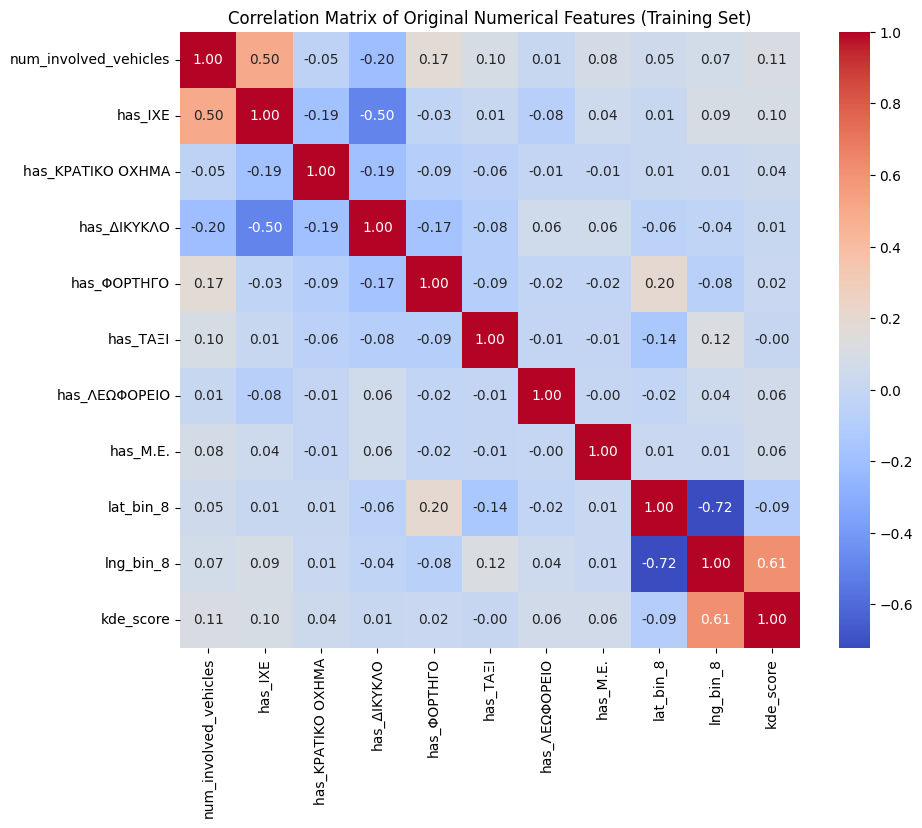

In [ ]:
if 'X_train_iter_3_processed_df' in locals():
    # Note: For filter methods, it's often better to use them on data *before* extensive transformations
    # if the transformations obscure original relationships (e.g. scaling for chi2).
    # However, for simplicity here, we use the processed data.
    # Ensure all data is non-negative for chi2 if applicable
    # For mutual_info_classif and f_classif, current processed data is fine.

    # Mutual Information (works for both num and cat (post-OHE))
    mi_scores = mutual_info_classif(X_train_iter_3_processed_df, y_train, random_state=42)
    mi_series = pd.Series(mi_scores, index=feature_names_out).sort_values(ascending=False)
    print("\nMutual Information Scores (Top 15):")
    print(mi_series.head(15))

    # Correlation (for numerical features in X_train_iter_3_processed_df - identify them again)
    # This is more complex with OHE. For now, let's skip detailed VIF on OHE.
    # A simple correlation heatmap on the original numerical features can be insightful:
    if len(numerical_features) > 1:
        plt.figure(figsize=(10, 8))
        sns.heatmap(X_train_iter_3[numerical_features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
        plt.title("Correlation Matrix of Original Numerical Features (Training Set)")
        plt.show()


## recursive feature elimination with cv


--- Iteration 3: Recursive Feature Elimination with Cross-Validation (RFECV) ---
RFECV will use the estimator: LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42,
                   solver='liblinear')
Cross-validation strategy: StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
Scoring metric for feature selection: 'roc_auc'
Fitting RFECV... (This might take some time)
Optimal number of features found by RFECV: 459

Selected features from RFECV (459):
Shape of X_train after RFECV: (313, 459)


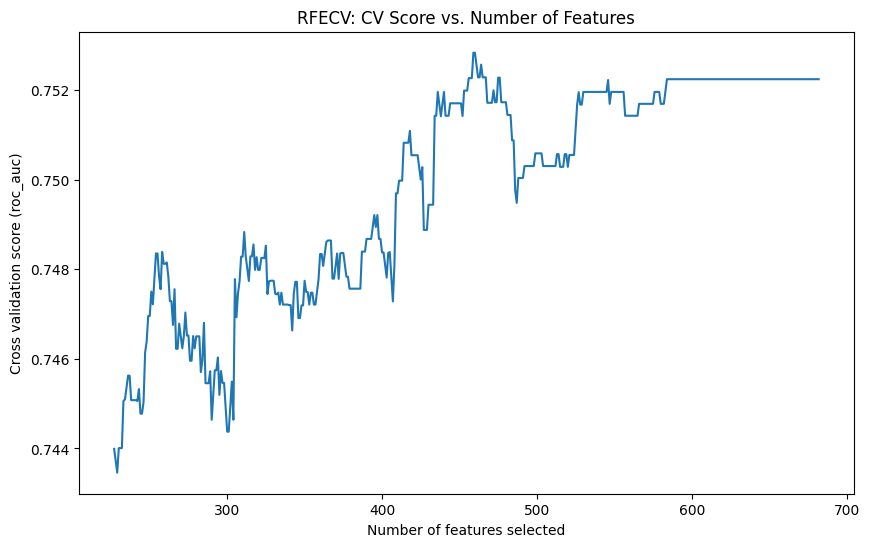

In [ ]:
# Ensure necessary imports
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression # Your chosen estimator
from sklearn.metrics import make_scorer, f1_score # For scoring if needed


if 'X_train_iter_3_processed_df' in locals() and X_train_iter_3_processed_df is not None and \
   'y_train_iter_3' in locals() and y_train_iter_3 is not None:

    print("\n--- Iteration 3: Recursive Feature Elimination with Cross-Validation (RFECV) ---")

    estimator_rfecv = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)

    # Define the cross-validation strategy
    # StratifiedKFold is good for classification, especially with imbalanced classes
    cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) # Using 5 splits as an example

    # Define the scoring metric for RFECV to optimize
    # For imbalanced classes, 'f1', 'roc_auc', or 'average_precision' (PR AUC) are often better than 'accuracy'.
    # Let's use 'f1' for the positive class (assuming positive_label=1)
    # If your positive class is not 1, adjust pos_label
    # You can also use 'roc_auc', 'average_precision', etc.
    scorer_for_rfecv = make_scorer(f1_score, pos_label=1, average='binary', zero_division=0)
    # Alternatively, just use a string like 'f1_macro', 'roc_auc'.
    # For binary classification and focusing on the positive class, 'f1' (which defaults to f1 of positive class if pos_label=1) or 'roc_auc' are good.
    # Let's use 'roc_auc' as it's a common general-purpose metric for RFECV selection
    # and less prone to issues if a fold has no positive predictions for some feature subsets.

    print(f"RFECV will use the estimator: {estimator_rfecv}")
    print(f"Cross-validation strategy: {cv_strategy}")
    print(f"Scoring metric for feature selection: 'roc_auc'") # Or your chosen scorer

    rfecv = RFECV(
        estimator=estimator_rfecv,
        step=1,  # Remove 1 feature at each step
        cv=cv_strategy,
        scoring='roc_auc',  # Metric to optimize for feature selection
        min_features_to_select=max(5, X_train_iter_3_processed_df.shape[1] // 3), # Example: select at least 5 features, or 10%
        n_jobs=-1 # Use all available cores
    )

    print("Fitting RFECV... (This might take some time)")
    try:
        rfecv.fit(X_train_iter_3_processed_df, y_train_iter_3)

        print(f"Optimal number of features found by RFECV: {rfecv.n_features_}")

        # Get the mask of selected features
        selected_features_rfecv_mask = rfecv.support_

        # Get the names of the selected features
        # Ensure that X_train_iter_3_processed_df has columns attribute (it should if it's a DataFrame)
        selected_features_rfecv = X_train_iter_3_processed_df.columns[selected_features_rfecv_mask]

        print(f"\nSelected features from RFECV ({len(selected_features_rfecv)}):")
        # Printing all feature names can be very long, consider printing only a few or just the count
        # print(selected_features_rfecv.tolist())

        # Update DataFrames to keep only RFECV selected features
        X_train_iter_3_iter_final = X_train_iter_3_processed_df[selected_features_rfecv]
        X_val_iter_3_iter_final = X_val_iter_3_processed_df[selected_features_rfecv]
        X_test_iter_3_iter_final = X_test_iter_3_processed_df[selected_features_rfecv]

        print(f"Shape of X_train after RFECV: {X_train_iter_3_iter_final.shape}")

        # You can also plot the number of features vs. cross-validation scores
        if hasattr(rfecv, "cv_results_"):
            try:
                import matplotlib.pyplot as plt
                n_scores = len(rfecv.cv_results_["mean_test_score"]) # Number of features evaluated
                plt.figure(figsize=(10,6))
                plt.xlabel("Number of features selected")
                plt.ylabel(f"Cross validation score ({rfecv.scoring})")
                plt.plot(
                    range(rfecv.min_features_to_select, n_scores + rfecv.min_features_to_select), # X-axis: number of features
                    rfecv.cv_results_["mean_test_score"],
                )
                plt.title("RFECV: CV Score vs. Number of Features")
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot RFECV scores: {plot_e}")

    except ValueError as ve:
        print(f"ValueError during RFECV fitting: {ve}")
        print("This might occur if input data is problematic or no features could be selected.")
        # Fallback: use all features from preprocessing if RFECV fails
        X_train_iter_3_iter_final = X_train_iter_3_processed_df.copy()
        X_val_iter_3_iter_final = X_val_iter_3_processed_df.copy()
        X_test_iter_3_iter_final = X_test_iter_3_processed_df.copy()
        print("Using all preprocessed features as RFECV failed.")
    except Exception as e:
        print(f"An unexpected error occurred during RFECV: {e}")
        X_train_iter_3_iter_final = X_train_iter_3_processed_df.copy() # Fallback
        X_val_iter_3_iter_final = X_val_iter_3_processed_df.copy()
        X_test_iter_3_iter_final = X_test_iter_3_processed_df.copy()
        print("Using all preprocessed features as RFECV encountered an error.")


else:
    print("Skipping RFECV as processed data (X_train_iter_3_processed_df or y_train_iter_3) is not available.")
    # Define fallback if previous steps failed
    if 'X_train_iter_3_processed_df' in locals() and X_train_iter_3_processed_df is not None:
        X_train_iter_3_iter_final = X_train_iter_3_processed_df.copy()
        X_val_iter_3_iter_final = X_val_iter_3_processed_df.copy() if 'X_val_iter_3_processed_df' in locals() and X_val_iter_3_processed_df is not None else None
        X_test_iter_3_iter_final = X_test_iter_3_processed_df.copy() if 'X_test_iter_3_processed_df' in locals() and X_test_iter_3_processed_df is not None else None
    else:
        X_train_iter_3_iter_final, X_val_iter_3_iter_final, X_test_iter_3_iter_final = None, None, None

## balancing techniques

In [ ]:
# Previous code: X_train_iter_3_iter_final, y_train_iter_3, X_val_iter_final, y_val are defined

resampled_datasets_iter_3 = {} # To store (X_resampled, y_resampled) for each technique

if 'X_train_iter_3_iter_final' in locals() and X_train_iter_3_iter_final is not None and y_train_iter_3 is not None:
    print(f"\nOriginal training set shape: {X_train_iter_3_iter_final.shape}, Original class distribution: {Counter(y_train_iter_3)}")
    minority_class_count = Counter(y_train_iter_3).get(1, 0) # Assuming 1 is the minority class

    # Store the original (non-resampled) training data as a baseline
    resampled_datasets_iter_3['Original'] = (X_train_iter_3_iter_final.copy(), y_train_iter_3.copy())

    # Define samplers
    samplers = {
        "RandomOverSampler": RandomOverSampler(random_state=42),
        "SMOTE": None, # Will initialize carefully due to k_neighbors
        "ADASYN": None, # Will initialize carefully due to n_neighbors
        "TomekLinks": TomekLinks(sampling_strategy='auto', n_jobs=-1), # Undersampling, removes Tomek links
        "SMOTETomek": None, # Will initialize carefully
        "SMOTEENN": None # Will initialize carefully
    }

    # SMOTE and ADASYN require k_neighbors (or n_neighbors for ADASYN) < minority_class_count
    if minority_class_count > 1:
        k_val = min(4, minority_class_count - 1) # A common heuristic for k, ensuring it's less than minority samples

        if k_val > 0 : # Ensure k_val is positive
            samplers["SMOTE"] = SMOTE(random_state=42, k_neighbors=k_val)
            samplers["ADASYN"] = ADASYN(random_state=42, n_neighbors=k_val) # ADASYN uses n_neighbors
            samplers["SMOTETomek"] = SMOTETomek(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), tomek=TomekLinks(sampling_strategy='auto'), n_jobs=-1)
            samplers["SMOTEENN"] = SMOTEENN(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), enn=None, n_jobs=-1) # enn default is good
        else:
            print(f"Skipping SMOTE-based samplers as k_val ({k_val}) would be too small or zero based on minority count ({minority_class_count}).")
            # Remove them if they can't be initialized
            for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
                if key in samplers: samplers.pop(key)

    else:
        print(f"Skipping SMOTE-based samplers as minority count ({minority_class_count}) is <= 1.")
        for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
            if key in samplers: samplers.pop(key)


    # Apply each sampler
    for name, sampler in samplers.items():
        if sampler is None: # Sampler was not initialized
            continue
        print(f"\nApplying {name}...")
        try:
            X_res, y_res = sampler.fit_resample(X_train_iter_3_iter_final, y_train_iter_3)
            resampled_datasets_iter_3[name] = (X_res, y_res)
            print(f"Resampled with {name}: X_shape={X_res.shape}, y_dist={Counter(y_res)}")
        except Exception as e:
            print(f"Could not apply {name}. Error: {e}")
            # Optionally store original if sampler fails, or skip
            # resampled_datasets_iter_3[name] = (X_train_iter_3_iter_final.copy(), y_train_iter_3.copy())


    if not resampled_datasets_iter_3: # If all samplers failed or were skipped
        print("No resampling techniques were successfully applied or initialized. Using original data only.")
        if 'Original' not in resampled_datasets_iter_3: # Should already be there
             resampled_datasets_iter_3['Original'] = (X_train_iter_3_iter_final.copy(), y_train_iter_3.copy())


else:
    print("Skipping balancing as X_train_iter_3_iter_final or y_train_iter_3 is not available.")
    # Ensure there's at least 'Original' if X_train_iter_3_iter_final was available
    if 'X_train_iter_3_iter_final' in locals() and X_train_iter_3_iter_final is not None and y_train_iter_3 is not None:
        resampled_datasets_iter_3['Original'] = (X_train_iter_3_iter_final.copy(), y_train_iter_3.copy())


Original training set shape: (313, 459), Original class distribution: Counter({0: 236, 1: 77})

Applying RandomOverSampler...
Resampled with RandomOverSampler: X_shape=(472, 459), y_dist=Counter({0: 236, 1: 236})

Applying SMOTE...
Resampled with SMOTE: X_shape=(472, 459), y_dist=Counter({0: 236, 1: 236})

Applying ADASYN...
Resampled with ADASYN: X_shape=(478, 459), y_dist=Counter({1: 242, 0: 236})

Applying TomekLinks...
Resampled with TomekLinks: X_shape=(300, 459), y_dist=Counter({0: 223, 1: 77})

Applying SMOTETomek...
Resampled with SMOTETomek: X_shape=(472, 459), y_dist=Counter({0: 236, 1: 236})

Applying SMOTEENN...
Resampled with SMOTEENN: X_shape=(329, 459), y_dist=Counter({1: 198, 0: 131})


## model training

In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier # Ensure this import is present


trained_models_iter_3 = {} # To store trained models: key will be "ModelName_SamplerName"

if 'resampled_datasets_iter_3' in locals() and resampled_datasets_iter_3:
    minority_class_label = 1 # Assuming 'death' is 1
    f1_minority_scorer = make_scorer(f1_score, pos_label=minority_class_label, average='binary') # For CV if you add it later

    for sampler_name, (X_train_curr_resampled, y_train_curr_resampled) in resampled_datasets_iter_3.items():
        print(f"\n--- Training models on data from: {sampler_name} ---")
        print(f"Training data shape: {X_train_curr_resampled.shape}, Distribution: {Counter(y_train_curr_resampled)}")

        # Define your models here or ensure they are defined from a previous cell
        # Re-initialize models for each dataset to ensure they are fresh

        # Calculate scale_pos_weight for XGBoost based on the current resampled data
        counts_curr = Counter(y_train_curr_resampled)
        scale_pos_weight_curr = counts_curr[0] / counts_curr[1] if counts_curr[1] > 0 else 1

        # calculate the ratio of the target variable in the training set in order to
        # get the weights for the custom ratio logistic regression
        counts_curr = Counter(y_train_curr_resampled)
        n_majority = counts_curr.get(0, 0) # Count of class 0 (assuming majority)
        n_minority = counts_curr.get(1, 0) # Count of class 1 (assuming minority)

        if n_minority > 0 and n_majority > 0:
          # A simple inverse frequency ratio: weight_minority = N_majority / N_minority
          # Or, to make the majority weight 1, weight_minority = N_majority / N_minority
          # Or inversely proportional to frequency: weight_i = 1 / freq_i
          # For 1:9 ratio, N_majority / N_minority is approx 9 / 1 = 9
          # Let's use a ratio where the minority class weight is 9 times the majority class weight.
          # We can arbitrarily set the majority weight to 1 and the minority weight to 9.
          # custom_class_weights = {0: 1.0, 1: 9.0} # Using floats is standard
          weight_minority = n_majority / n_minority
          custom_class_weights = {0: 1.0, 1: weight_minority}


        current_models_definitions = {
            'LogisticRegression': LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_custom_ratio':LogisticRegression(solver='liblinear',random_state=42,class_weight=custom_class_weights,max_iter=1000),
            'LogisticRegression_L1': LogisticRegression(solver='liblinear', penalty='l1', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_L2':LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000, penalty='l2'),
            'RandomForest': RandomForestClassifier(random_state=42, class_weight='balanced_subsample', n_estimators=100),
            'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='logloss',
                             scale_pos_weight=scale_pos_weight_curr),
            'BalancedRandomForest': BalancedRandomForestClassifier(random_state=42, n_estimators=100, sampling_strategy='auto', replacement=True, n_jobs=-1),
            'RUSBoost': RUSBoostClassifier(random_state=42, n_estimators=50, sampling_strategy='auto') # n_estimators often lower for boosting
        }
        # Note on class_weight='balanced':
        # For 'Original' data (imbalanced), it's useful.
        # For data resampled to be perfectly balanced (e.g., SMOTE to 50/50), class_weight='balanced' might have less effect
        # or could be omitted, but it generally doesn't hurt and can help if balance isn't perfect.

        for model_name, model_instance in current_models_definitions.items():
            full_model_name = f"{model_name}_{sampler_name}"
            print(f"Training {full_model_name}...")
            try:
                model_instance.fit(X_train_curr_resampled, y_train_curr_resampled)
                trained_models_iter_3[full_model_name] = model_instance
                print(f"{full_model_name} trained.")
            except Exception as e:
                print(f"Could not train {full_model_name}. Error: {e}")
                trained_models_iter_3[full_model_name] = None # Store None if training failed

else:
    print("Skipping model training as no resampled datasets are available.")


--- Training models on data from: Original ---
Training data shape: (313, 459), Distribution: Counter({0: 236, 1: 77})
Training LogisticRegression_Original...
LogisticRegression_Original trained.
Training LogisticRegression_custom_ratio_Original...
LogisticRegression_custom_ratio_Original trained.
Training LogisticRegression_L1_Original...
LogisticRegression_L1_Original trained.
Training LogisticRegression_L2_Original...
LogisticRegression_L2_Original trained.
Training RandomForest_Original...
RandomForest_Original trained.
Training XGBoost_Original...
XGBoost_Original trained.
Training BalancedRandomForest_Original...
BalancedRandomForest_Original trained.
Training RUSBoost_Original...
RUSBoost_Original trained.

--- Training models on data from: RandomOverSampler ---
Training data shape: (472, 459), Distribution: Counter({0: 236, 1: 236})
Training LogisticRegression_RandomOverSampler...
LogisticRegression_RandomOverSampler trained.
Training LogisticRegression_custom_ratio_RandomOver

## model evaluation

In [ ]:
if 'trained_models_iter_3' in locals() and trained_models_iter_3 and \
   'X_val_iter_3_iter_final' in locals() and X_val_iter_3_iter_final is not None and y_val_iter_3 is not None:

    print("\n--- Model Assessment on Validation Set ---")

    # Store results for later comparison if needed
    validation_results_iter_3 = {}

    for full_model_name, model in trained_models_iter_3.items():
        if model is not None: # Check if model was trained
            print(f"\n--- Assessing: {full_model_name} ---")
            try:
                y_pred_val_iter_3 = model.predict(X_val_iter_3_iter_final)
                y_proba_val_iter_3 = model.predict_proba(X_val_iter_3_iter_final)[:, 1] # Probability of positive class

                report = classification_report(y_val_iter_3, y_pred_val_iter_3, target_names=['Short (0)', 'Long (1)'], output_dict=True)
                roc_auc = roc_auc_score(y_val_iter_3, y_proba_val_iter_3)
                precision_pr, recall_pr, _ = precision_recall_curve(y_val_iter_3, y_proba_val_iter_3)
                pr_auc = auc(recall_pr, precision_pr)
                conf_matrix = confusion_matrix(y_val_iter_3, y_pred_val_iter_3)

                print(classification_report(y_val_iter_3, y_pred_val_iter_3, target_names=['Short (0)', 'Long (1)']))
                print(f"Confusion Matrix:\n{conf_matrix}")
                print(f"ROC AUC: {roc_auc:.4f}")
                print(f"PR AUC: {pr_auc:.4f}")

                # Store results
                validation_results_iter_3[full_model_name] = {
                    'classification_report': report,
                    'confusion_matrix': conf_matrix.tolist(), # convert numpy array to list for easier storage/JSON
                    'roc_auc': roc_auc,
                    'pr_auc': pr_auc,
                    'f1_long': report.get('Long (1)', {}).get('f1-score', 0), # F1 for minority class
                    'recall_long': report.get('Long (1)', {}).get('recall', 0) # Recall for minority class
                }
            except Exception as e:
                print(f"Could not assess {full_model_name}. Error: {e}")
                validation_results_iter_3[full_model_name] = {'error': str(e)}
        else:
            print(f"Model {full_model_name} was not trained, skipping assessment.")
            validation_results_iter_3[full_model_name] = {'error': 'Model not trained'}

    # Optional: Print a summary table of key metrics from validation_results_iter_3
    if validation_results_iter_3:
        print("\n--- Validation Results Summary (F1 and Recall for Long class, PR AUC) ---")
        summary_df = pd.DataFrame([
            {'Model_Sampler': name,
             'F1_long': data.get('f1_long', 'N/A'),
             'Recall_long': data.get('recall_long', 'N/A'),
             'PR_AUC': data.get('pr_auc', 'N/A'),
             'ROC_AUC': data.get('roc_auc', 'N/A')}
            for name, data in validation_results_iter_3.items() if 'error' not in data
        ])
        if not summary_df.empty:
            summary_df = summary_df.sort_values(by='F1_long', ascending=False) # Sort by F1 for Long class
            try:
                display(summary_df) # Works well in Colab
            except NameError:
                print(summary_df)
        else:
            print("No valid results to summarize.")


else:
    print("Skipping model assessment: Trained models or validation data are not available.")


--- Model Assessment on Validation Set ---

--- Assessing: LogisticRegression_Original ---
              precision    recall  f1-score   support

   Short (0)       0.86      0.77      0.81        79
    Long (1)       0.47      0.62      0.53        26

    accuracy                           0.73       105
   macro avg       0.66      0.69      0.67       105
weighted avg       0.76      0.73      0.74       105

Confusion Matrix:
[[61 18]
 [10 16]]
ROC AUC: 0.7639
PR AUC: 0.4858

--- Assessing: LogisticRegression_custom_ratio_Original ---
              precision    recall  f1-score   support

   Short (0)       0.85      0.78      0.82        79
    Long (1)       0.47      0.58      0.52        26

    accuracy                           0.73       105
   macro avg       0.66      0.68      0.67       105
weighted avg       0.76      0.73      0.74       105

Confusion Matrix:
[[62 17]
 [11 15]]
ROC AUC: 0.7639
PR AUC: 0.4857

--- Assessing: LogisticRegression_L1_Original ---
      

,Model_Sampler,F1_long,Recall_long,PR_AUC,ROC_AUC
15,RUSBoost_RandomOverSampler,0.557377,0.653846,0.438120,0.744158
35,LogisticRegression_L2_TomekLinks,0.539683,0.653846,0.483068,0.764849
32,LogisticRegression_TomekLinks,0.539683,0.653846,0.483068,0.764849
0,LogisticRegression_Original,0.533333,0.615385,0.485833,0.763875
3,LogisticRegression_L2_Original,0.533333,0.615385,0.485833,0.763875
33,LogisticRegression_custom_ratio_TomekLinks,0.533333,0.615385,0.488623,0.768744
1,LogisticRegression_custom_ratio_Original,0.517241,0.576923,0.485739,0.763875
16,LogisticRegression_SMOTE,0.509091,0.538462,0.491244,0.763875
40,LogisticRegression_SMOTETomek,0.509091,0.538462,0.491244,0.763875
17,LogisticRegression_custom_ratio_SMOTE,0.509091,0.538462,0.491244,0.763875


## error analysis

In [ ]:
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt # Ensure these are imported if you want plots
import seaborn as sns           # Ensure these are imported if you want plots

def perform_detailed_error_analysis(
    model_name, model,
    X_val_processed_features, y_true_labels,
    X_val_original_features, # DataFrame with original, interpretable features (MUST BE ALIGNED WITH y_true_labels)
    key_categorical_features, # List of key categorical feature names
    key_numerical_features,   # List of key numerical feature names
    target_class_name='Long', positive_label=1, negative_label=0
):
    print(f"\n--- Detailed Error Analysis for: {model_name} ---")

    if model is None:
        print(f"Model '{model_name}' is None, skipping analysis.")
        return None

    # CRITICAL PRE-CONDITION CHECK:
    if not X_val_original_features.index.equals(y_true_labels.index):
        print("CRITICAL ERROR in perform_detailed_error_analysis: ")
        print("Indices of X_val_original_features and y_true_labels DO NOT MATCH upon entry.")
        print("Ensure X_val_original_features is correctly prepared with an index matching y_true_labels before calling this function.")
        print(f"X_val_original_features index head: {X_val_original_features.index[:3]}")
        print(f"y_true_labels index head: {y_true_labels.index[:3]}")
        return None

    if not X_val_processed_features.index.equals(y_true_labels.index):
        print("CRITICAL WARNING in perform_detailed_error_analysis: ")
        print("Indices of X_val_processed_features and y_true_labels DO NOT MATCH upon entry.")
        print("This can lead to misaligned predictions if not handled carefully in model.predict stage.")
        # Depending on model behavior, predictions might still align if X_val_processed_features was used to generate y_pred in order.


    # Make predictions
    y_pred = model.predict(X_val_processed_features)
    y_pred_series = pd.Series(y_pred, index=y_true_labels.index) # Align y_pred with y_true_labels' index

    y_pred_proba = None
    if hasattr(model, "predict_proba"):
        try:
            # Get probability of the positive class
            y_pred_proba_all = model.predict_proba(X_val_processed_features)
            y_pred_proba = pd.Series(y_pred_proba_all[:, positive_label], index=y_true_labels.index)
        except Exception as e:
            print(f"Warning: Could not get predict_proba: {e}")
    else:
        print("Warning: Model does not have predict_proba method.")

    # Create a DataFrame with true labels, predicted labels, and original features
    analysis_df = X_val_original_features.copy()
    analysis_df['actual_duration'] = y_true_labels
    analysis_df['predicted_duration'] = y_pred_series # Use aligned predictions
    if y_pred_proba is not None:
        analysis_df[f'predicted_proba_{target_class_name}'] = y_pred_proba

    # Define groups
    tp_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == positive_label)]
    fp_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == positive_label)]
    fn_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == negative_label)]
    tn_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == negative_label)]

    actual_pos_count = (analysis_df['actual_duration'] == positive_label).sum()
    predicted_pos_count = (analysis_df['predicted_duration'] == positive_label).sum()

    print(f"\nOverall Validation Set Performance ({model_name}):")
    print(f"Total cases: {len(analysis_df)}")
    print(f"Actual {target_class_name}s ({positive_label}): {actual_pos_count}")
    print(f"Predicted {target_class_name}s ({positive_label}): {predicted_pos_count}")
    print(f"TP ({target_class_name}): {len(tp_data)}, FP ({target_class_name}): {len(fp_data)}, FN ({target_class_name}): {len(fn_data)}, TN (Not {target_class_name}): {len(tn_data)}")

    groups = {
        f'TPs for {target_class_name}': tp_data,
        f'FNs for {target_class_name} (Actual {target_class_name}, Predicted Short)': fn_data,
        f'FPs for {target_class_name} (Actual Short, Predicted {target_class_name})': fp_data,
        # You can also analyze TNs if desired
        # f'TNs (Not {target_class_name})': tn_data
    }

    for group_name_full, group_df in groups.items():
        if group_df.empty:
            print(f"\nNo data for {group_name_full} group.")
            continue
        print(f"\n--- Characteristics of {group_name_full} (Count: {len(group_df)}) ---")

        try:
            print(f"Overall descriptive stats for {group_name_full}:")
            display(group_df.describe(include='all').transpose().fillna(''))
        except Exception as e:
            print(f"Could not display describe for {group_name_full}: {e}")

        # Numerical features summary
        numerical_features_in_group = [col for col in key_numerical_features if col in group_df.columns]
        if numerical_features_in_group:
            print(f"\nNumerical Feature Summaries for {group_name_full}:")
            try:
                display(group_df[numerical_features_in_group].describe().transpose().fillna(''))
            except Exception as e:
                print(f"Could not display numerical summaries for {group_name_full}: {e}")

        # Categorical features summary
        categorical_features_in_group = [col for col in key_categorical_features if col in group_df.columns]
        if categorical_features_in_group:
            print(f"\nCategorical Feature Value Counts (Top 5) for {group_name_full}:")
            for col in categorical_features_in_group:
                print(f"\nValue counts for '{col}' in {group_name_full}:")
                try:
                    display(group_df[col].value_counts(normalize=True, dropna=False).head().to_frame())
                except Exception as e:
                    print(f"Could not display value_counts for {col} in {group_name_full}: {e}")

        if y_pred_proba is not None and ('FNs' in group_name_full or 'FPs' in group_name_full):
             print(f"\nPredicted Probabilities for {group_name_full}:")
             try:
                display(group_df[[f'predicted_proba_{target_class_name}']].describe().transpose().fillna(''))
             except Exception as e:
                print(f"Could not display probability summaries for {group_name_full}: {e}")


    # Optional: Display sample rows from FN and FP
    if not fn_data.empty:
        print(f"\nSample False Negatives (Actual {target_class_name}, Predicted Short):")
        display(fn_data.head(min(5, len(fn_data))))
    if not fp_data.empty:
        print(f"\nSample False Positives (Actual Short, Predicted {target_class_name}):")
        display(fp_data.head(min(5, len(fp_data))))

    print(f"\n--- End of Error Analysis for: {model_name} ---")
    return analysis_df

In [ ]:
# --- This code comes AFTER your existing Iteration 3 setup: ---
# 1. df_iteration_p75 created
# 2. df_iter3 created from df_iteration_p75
# 3. X, y split from df_iter3
# 4. X_train_iter_3, X_val_iter_3, X_test_iter_3, y_train_iter_3, y_val_iter_3, y_test_iter_3 created via train_test_split

# IMPORTANT: Create a copy of X_val_iter_3 for original features analysis BEFORE it's modified
# This X_val_iter_3 comes from the train_test_split and contains the features selected in `columns_iter3`
# Its index is aligned with y_val_iter_3.
if 'X_val_iter_3' in locals() and 'y_val_iter_3' in locals():
    X_val_iter_3_original_for_analysis = X_val_iter_3.copy()
    print(f"Captured X_val_iter_3_original_for_analysis with shape: {X_val_iter_3_original_for_analysis.shape}")
else:
    print("Error: X_val_iter_3 or y_val_iter_3 not found before capturing original validation features for analysis.")
    # Handle this error, perhaps by exiting or ensuring these variables are correctly named and populated

# ... then your existing code for:
# ... spatial feature engineering (modifying X_train_iter_3, X_val_iter_3, X_test_iter_3)
# ... dropping lat/lng (modifying X_train_iter_3, X_val_iter_3, X_test_iter_3)
# ... identifying feature types and preprocessing (creating X_train_iter_3_processed_df, X_val_iter_3_processed_df, etc.)
# ... RFECV (creating X_train_iter_3_iter_final, X_val_iter_3_iter_final, etc.)
# ... Resampling (creating resampled_datasets_iter_3)
# ... Model training (populating trained_models_iter_3)
# ... Model assessment loop (populating validation_results_iter_3) ...
# --- END OF YOUR EXISTING Iteration 3 PIPELINE (before adding error analysis call) ---


# --- Now, add the call to the detailed error analysis function ---
print("\n\n--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---")

if ('trained_models_iter_3' in locals() and trained_models_iter_3 and
    'X_val_iter_3_iter_final' in locals() and X_val_iter_3_iter_final is not None and
    'y_val_iter_3' in locals() and y_val_iter_3 is not None and
    'X_val_iter_3_original_for_analysis' in locals() and X_val_iter_3_original_for_analysis is not None):

    # Define the key original feature columns you want to analyze in detail
    # These should be columns present in X_val_iter_3_original_for_analysis
    key_categorical_to_analyze = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ',
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.',
        'effective_lighting_condition', 'segment_id', 'grid_cell_8x8', 'geohash_p7'
    ]
    key_numerical_to_analyze = [
        'num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ',
        'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'lat_bin_8', 'lng_bin_8', 'kde_score' # Assuming lat/lng bins were in original features
    ]

    # Filter to ensure all listed columns are actually in the DataFrame to avoid errors
    key_cats_present = [col for col in key_categorical_to_analyze if col in X_val_iter_3_original_for_analysis.columns]
    key_nums_present = [col for col in key_numerical_to_analyze if col in X_val_iter_3_original_for_analysis.columns]

    # Choose the model you want to analyze from your trained_models_iter_3 dictionary
    # For example, if RUSBoost_RandomOverSampler was trained on 'Original' (non-resampled) data:
    model_key_to_analyze = 'RUSBoost_RandomOverSampler_Original' # Adjust if your sampler name differs (e.g. 'Original' for no sampler)

    if model_key_to_analyze in trained_models_iter_3:
        model_object_to_analyze = trained_models_iter_3[model_key_to_analyze]

        if model_object_to_analyze is not None:
            print(f"\n>>> Performing detailed analysis for model: {model_key_to_analyze}")
            # Call the function
            error_analysis_output_df_iter3 = perform_detailed_error_analysis(
                model_name=model_key_to_analyze,
                model=model_object_to_analyze,
                X_val_processed_features=X_val_iter_3_iter_final, # Processed features for prediction
                y_true_labels=y_val_iter_3,                        # True labels
                X_val_original_features=X_val_iter_3_original_for_analysis, # ALIGNED original features
                key_categorical_features=key_cats_present,
                key_numerical_features=key_nums_present,
                target_class_name='Long_P75' # Custom name for clarity
            )
            if error_analysis_output_df_iter3 is not None:
                print("\nError analysis DataFrame sample (iter3):")
                display(error_analysis_output_df_iter3.head())
        else:
            print(f"Model object for {model_key_to_analyze} is None (was not trained).")
    else:
        print(f"Model key '{model_key_to_analyze}' not found in trained_models_iter_3.")
        print(f"Available models: {list(trained_models_iter_3.keys())}")

else:
    print("One or more required DataFrames for detailed error analysis are missing. Please check: ")
    print("- trained_models_iter_3 (and the specific model key)")
    print("- X_val_iter_3_iter_final (processed validation features)")
    print("- y_val_iter_3 (validation labels)")
    print("- X_val_iter_3_original_for_analysis (original validation features, captured before modification)")

Captured X_val_iter_3_original_for_analysis with shape: (105, 24)


--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---
Model key 'RUSBoost_RandomOverSampler_Original' not found in trained_models_iter_3.
Available models: ['LogisticRegression_Original', 'LogisticRegression_custom_ratio_Original', 'LogisticRegression_L1_Original', 'LogisticRegression_L2_Original', 'RandomForest_Original', 'XGBoost_Original', 'BalancedRandomForest_Original', 'RUSBoost_Original', 'LogisticRegression_RandomOverSampler', 'LogisticRegression_custom_ratio_RandomOverSampler', 'LogisticRegression_L1_RandomOverSampler', 'LogisticRegression_L2_RandomOverSampler', 'RandomForest_RandomOverSampler', 'XGBoost_RandomOverSampler', 'BalancedRandomForest_RandomOverSampler', 'RUSBoost_RandomOverSampler', 'LogisticRegression_SMOTE', 'LogisticRegression_custom_ratio_SMOTE', 'LogisticRegression_L1_SMOTE', 'LogisticRegression_L2_SMOTE', 'RandomForest_SMOTE', 'XGBoost_SMOTE', 'BalancedRandomForest_SMOTE', 

In [ ]:
# Previous code:
# ...
# Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
X_val_iter_3, X_test_iter_3, y_val_iter_3, y_test_iter_3 = train_test_split(
    X_temp_iter_3, y_temp_iter_3, test_size=0.5, random_state=42, stratify=y_temp_iter_3
)

# ---> ADD THIS LINE IMMEDIATELY AFTER THE SPLIT <---
X_val_iter_3_original_for_analysis = X_val_iter_3.copy()
print(f"Captured X_val_iter_3_original_for_analysis with shape: {X_val_iter_3_original_for_analysis.shape} and index: {X_val_iter_3_original_for_analysis.index[:3]}")
print(f"y_val_iter_3 index for comparison: {y_val_iter_3.index[:3]}")
if not X_val_iter_3_original_for_analysis.index.equals(y_val_iter_3.index):
    print("WARNING: Index of X_val_iter_3_original_for_analysis does not initially match y_val_iter_3. This should ideally not happen if both are direct outputs of train_test_split on X_temp_iter_3 and y_temp_iter_3.")


# Now your existing code continues:
# X_train_iter_3_for_fitting = X_train_iter_3.copy()
# ...
# X_train_iter_3 = X_train_iter_3.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
# X_val_iter_3 = X_val_iter_3.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore') # X_val_iter_3 is modified here
# ... and so on through preprocessing, RFECV, training, assessment ...

Captured X_val_iter_3_original_for_analysis with shape: (105, 20) and index: Index([16, 274, 415], dtype='int64')
y_val_iter_3 index for comparison: Index([16, 274, 415], dtype='int64')


In [ ]:
# --- This code block comes AFTER your "Model Assessment on Validation Set" loop ---

print("\n\n--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---")

# Ensure all necessary variables from your pipeline are available and correctly named
if ('trained_models_iter_3' in locals() and trained_models_iter_3 and
    'X_val_iter_3_iter_final' in locals() and X_val_iter_3_iter_final is not None and
    'y_val_iter_3' in locals() and y_val_iter_3 is not None and
    'X_val_iter_3_original_for_analysis' in locals() and X_val_iter_3_original_for_analysis is not None):

    # Define the key original feature columns you want to analyze in detail.
    # These should be columns present in X_val_iter_3_original_for_analysis.
    # These are examples; adjust them based on the actual columns in X_val_iter_3_original_for_analysis
    key_categorical_to_analyze = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ',
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', # ΤΕΧΝ._ΦΩΤ. might have many NaNs or been replaced
        'effective_lighting_condition', # This was intended to replace ΤΕΧΝ._ΦΩΤ.
        # Add spatial categorical features IF they were part of X_val_iter_3_original_for_analysis
        # (i.e., if they were created *before* this copy was made, which is usually not the case for error analysis on originals)
        # 'segment_id', 'grid_cell_8x8', 'geohash_p7' # Only include if they are original interpretable features
    ]
    key_numerical_to_analyze = [
        'num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ',
        'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        # Add spatial numerical features IF they were part of X_val_iter_3_original_for_analysis
        # 'lat_bin_8', 'lng_bin_8', 'kde_score' # Only include if they are original interpretable features
        # Note: Your `columns_iter3` included 'lat', 'lng' - these would be good for analysis if present.
        # If 'lat', 'lng' were dropped from X_val_iter_3 before the copy, they won't be in X_val_iter_3_original_for_analysis.
        # It's best if X_val_iter_3_original_for_analysis contains as many raw interpretable features as possible.
    ]

    # Filter to ensure all listed columns are actually in the DataFrame to avoid errors
    key_cats_present = [col for col in key_categorical_to_analyze if col in X_val_iter_3_original_for_analysis.columns]
    key_nums_present = [col for col in key_numerical_to_analyze if col in X_val_iter_3_original_for_analysis.columns]

    # Choose the model you want to analyze (e.g., the best one from your summary table)
    # The key should match exactly how it's stored in trained_models_iter_3
    # Example: If 'Original' was the sampler_name for the non-resampled data
    model_key_to_analyze = 'RUSBoost_RandomOverSampler' # Or 'RUSBoost_RandomOverSampler_Original' depending on your naming
    # Check your `validation_results_iter_3` summary table for the exact `Model_Sampler` name of your best model.

    if model_key_to_analyze in trained_models_iter_3:
        model_object_to_analyze = trained_models_iter_3[model_key_to_analyze]

        if model_object_to_analyze is not None:
            print(f"\n>>> Performing detailed analysis for model: {model_key_to_analyze}")
            analysis_output_df_iter3 = perform_detailed_error_analysis(
                model_name=model_key_to_analyze,
                model=model_object_to_analyze,
                X_val_processed_features=X_val_iter_3_iter_final, # This is X_val after all processing and RFECV
                y_true_labels=y_val_iter_3,
                X_val_original_features=X_val_iter_3_original_for_analysis, # The ALIGNED original features
                key_categorical_features=key_cats_present,
                key_numerical_features=key_nums_present,
                target_class_name='Long_P75' # Custom name for clarity in this iteration's report
            )
            if analysis_output_df_iter3 is not None:
                print("\nError analysis DataFrame sample (iter3):")
                display(analysis_output_df_iter3.head())
        else:
            print(f"Model object for {model_key_to_analyze} is None (was not trained).")
    else:
        print(f"Model key '{model_key_to_analyze}' not found in trained_models_iter_3.")
        print(f"Available models in trained_models_iter_3: {list(trained_models_iter_3.keys())}")
else:
    print("One or more required DataFrames for detailed error analysis are missing. Please check:")
    print(f"- Is 'trained_models_iter_3' populated? (Content: {list(trained_models_iter_3.keys()) if 'trained_models_iter_3' in locals() else 'Not found'})")
    print(f"- Is 'X_val_iter_3_iter_final' available? ({'Yes' if 'X_val_iter_3_iter_final' in locals() and X_val_iter_3_iter_final is not None else 'No'})")
    print(f"- Is 'y_val_iter_3' available? ({'Yes' if 'y_val_iter_3' in locals() and y_val_iter_3 is not None else 'No'})")
    print(f"- Is 'X_val_iter_3_original_for_analysis' available? ({'Yes' if 'X_val_iter_3_original_for_analysis' in locals() and X_val_iter_3_original_for_analysis is not None else 'No'})")



--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---

>>> Performing detailed analysis for model: RUSBoost_RandomOverSampler

--- Detailed Error Analysis for: RUSBoost_RandomOverSampler ---

Overall Validation Set Performance (RUSBoost_RandomOverSampler):
Total cases: 105
Actual Long_P75s (1): 26
Predicted Long_P75s (1): 35
TP (Long_P75): 17, FP (Long_P75): 18, FN (Long_P75): 9, TN (Not Long_P75): 61

--- Characteristics of TPs for Long_P75 (Count: 17) ---
Overall descriptive stats for TPs for Long_P75:


<ipython-input-162-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,17.0,6,A,8,,,,,,,
ΧΙΛ.ΘΕΣΗ,17.0,,,,15.970588,18.793608,0.0,0.0,11.5,24.4,49.5
ΣΗΡΑΓΓΑ,17.0,2,no_ΣΗΡΑΓΓΑ,16,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,17.0,10,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),4,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,17.0,1,ΟΧΙ,17,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,17.0,2,ΚΑΛΟΚΑΙΡΙΑ,16,,,,,,,
ΣΥΝΘ._ΟΔ.,17.0,2,ΚΑΝΟΝΙΚΕΣ,15,,,,,,,
ΚΑΤ._ΟΔ.,17.0,2,ΚΑΝΟΝΙΚΗ,16,,,,,,,
ΤΕΧΝ._ΦΩΤ.,6.0,1,ΕΠΑΡΚΗΣ,6,,,,,,,
lat,17.0,,,,38.023283,0.061038,37.913973,37.97501,38.057557,38.059586,38.089301



Numerical Feature Summaries for TPs for Long_P75:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,17.0,2.117647,0.857493,1.0,2.0,2.0,3.0,4.0



Categorical Feature Value Counts (Top 5) for TPs for Long_P75:

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in TPs for Long_P75:


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
A,0.470588
E,0.294118
Z,0.058824
M,0.058824
K,0.058824



Value counts for 'ΧΙΛ.ΘΕΣΗ' in TPs for Long_P75:


,proportion
ΧΙΛ.ΘΕΣΗ,
0.0,0.411765
20.1,0.058824
16.9,0.058824
11.5,0.058824
49.5,0.058824



Value counts for 'ΣΗΡΑΓΓΑ' in TPs for Long_P75:


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,0.941176
ΖΕΦΥΡΙΟΥ - Α,0.058824



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in TPs for Long_P75:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.235294
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.176471
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.117647
4D.Β - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΟΜΕΤΩΠΙΚΗ,0.117647
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.058824



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in TPs for Long_P75:


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in TPs for Long_P75:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.941176
ΧΑΛΑΖΙ,0.058824



Value counts for 'ΣΥΝΘ._ΟΔ.' in TPs for Long_P75:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.882353
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.117647



Value counts for 'ΚΑΤ._ΟΔ.' in TPs for Long_P75:


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,0.941176
ΑΛΛΗ,0.058824



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in TPs for Long_P75:


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.647059
ΕΠΑΡΚΗΣ,0.352941



Value counts for 'effective_lighting_condition' in TPs for Long_P75:


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.470588
Night - Artificial Lighting Sufficient (Manual),0.235294
Night - Artificial Lighting Issue Suspected,0.176471
Daylight - Sufficient (Manual),0.117647



--- Characteristics of FNs for Long_P75 (Actual Long_P75, Predicted Short) (Count: 9) ---
Overall descriptive stats for FNs for Long_P75 (Actual Long_P75, Predicted Short):


<ipython-input-162-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,9.0,4,E,4,,,,,,,
ΧΙΛ.ΘΕΣΗ,9.0,,,,22.433333,16.941591,0.5,5.2,26.9,33.7,48.3
ΣΗΡΑΓΓΑ,9.0,1,no_ΣΗΡΑΓΓΑ,9,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,9.0,4,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,3,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,9.0,1,ΟΧΙ,9,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,9.0,2,ΚΑΛΟΚΑΙΡΙΑ,8,,,,,,,
ΣΥΝΘ._ΟΔ.,9.0,2,ΚΑΝΟΝΙΚΕΣ,7,,,,,,,
ΚΑΤ._ΟΔ.,9.0,1,ΚΑΝΟΝΙΚΗ,9,,,,,,,
ΤΕΧΝ._ΦΩΤ.,4.0,1,ΕΠΑΡΚΗΣ,4,,,,,,,
lat,9.0,,,,38.005862,0.046753,37.909946,37.978487,38.008546,38.0363,38.067995



Numerical Feature Summaries for FNs for Long_P75 (Actual Long_P75, Predicted Short):


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,9.0,1.888889,0.600925,1.0,2.0,2.0,2.0,3.0



Categorical Feature Value Counts (Top 5) for FNs for Long_P75 (Actual Long_P75, Predicted Short):

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
E,0.444444
A,0.222222
M,0.222222
K,0.111111



Value counts for 'ΧΙΛ.ΘΕΣΗ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΧΙΛ.ΘΕΣΗ,
20.9,0.111111
48.3,0.111111
0.5,0.111111
26.9,0.111111
5.2,0.111111



Value counts for 'ΣΗΡΑΓΓΑ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,1.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.333333
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.333333
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.222222
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.111111



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.888889
ΒΡΟΧΗ,0.111111



Value counts for 'ΣΥΝΘ._ΟΔ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.777778
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.222222



Value counts for 'ΚΑΤ._ΟΔ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,1.0



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.555556
ΕΠΑΡΚΗΣ,0.444444



Value counts for 'effective_lighting_condition' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.555556
Night - Artificial Lighting Sufficient (Manual),0.333333
Daylight - Sufficient (Manual),0.111111



Predicted Probabilities for FNs for Long_P75 (Actual Long_P75, Predicted Short):


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Long_P75,9.0,0.441082,0.043106,0.366376,0.406677,0.438559,0.474469,0.492805



--- Characteristics of FPs for Long_P75 (Actual Short, Predicted Long_P75) (Count: 18) ---
Overall descriptive stats for FPs for Long_P75 (Actual Short, Predicted Long_P75):


<ipython-input-162-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,18.0,3,A,11,,,,,,,
ΧΙΛ.ΘΕΣΗ,18.0,,,,19.738889,16.419326,0.0,3.925,19.9,26.95,48.8
ΣΗΡΑΓΓΑ,18.0,2,no_ΣΗΡΑΓΓΑ,17,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,18.0,7,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,5,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,18.0,1,ΟΧΙ,18,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,17.0,1,ΚΑΛΟΚΑΙΡΙΑ,17,,,,,,,
ΣΥΝΘ._ΟΔ.,17.0,2,ΚΑΝΟΝΙΚΕΣ,13,,,,,,,
ΚΑΤ._ΟΔ.,17.0,1,ΚΑΝΟΝΙΚΗ,17,,,,,,,
ΤΕΧΝ._ΦΩΤ.,4.0,1,ΕΠΑΡΚΗΣ,4,,,,,,,
lat,18.0,,,,38.030388,0.059032,37.911989,37.979643,38.058845,38.071064,38.094453



Numerical Feature Summaries for FPs for Long_P75 (Actual Short, Predicted Long_P75):


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,18.0,1.722222,0.95828,1.0,1.0,2.0,2.0,5.0



Categorical Feature Value Counts (Top 5) for FPs for Long_P75 (Actual Short, Predicted Long_P75):

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
A,0.611111
E,0.277778
K,0.111111



Value counts for 'ΧΙΛ.ΘΕΣΗ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΧΙΛ.ΘΕΣΗ,
0.0,0.111111
16.4,0.055556
24.0,0.055556
24.4,0.055556
40.5,0.055556



Value counts for 'ΣΗΡΑΓΓΑ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,0.944444
ΧΟΛΑΡΓΟΥ - Κ,0.055556



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.277778
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.222222
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.222222
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.111111
4D.Υ1 - ΣΥΓΚΡΟΥΣΗ ΑΝΩ ΤΩΝ ΤΕΣΣΑΡΩΝ ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.055556



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.944444
NaN,0.055556



Value counts for 'ΣΥΝΘ._ΟΔ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.722222
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.222222
NaN,0.055556



Value counts for 'ΚΑΤ._ΟΔ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,0.944444
NaN,0.055556



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.777778
ΕΠΑΡΚΗΣ,0.222222



Value counts for 'effective_lighting_condition' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.666667
Night - Artificial Lighting Sufficient (Manual),0.222222
Night - Artificial Lighting Issue Suspected,0.111111



Predicted Probabilities for FPs for Long_P75 (Actual Short, Predicted Long_P75):


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Long_P75,18.0,0.550775,0.035643,0.507037,0.53315,0.534208,0.560297,0.640616



Sample False Negatives (Actual Long_P75, Predicted Short):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,lat,...,has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,has_ΔΙΚΥΚΛΟ,has_ΦΟΡΤΗΓΟ,has_ΤΑΞΙ,has_ΛΕΩΦΟΡΕΙΟ,has_Μ.Ε.,effective_lighting_condition,actual_duration,predicted_duration,predicted_proba_Long_P75
63,A,20.9,no_ΣΗΡΑΓΓΑ,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.067995,...,False,True,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),1,0,0.438559
249,E,48.3,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,37.909946,...,False,True,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),1,0,0.472265
280,K,0.5,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,37.977841,...,False,True,False,False,False,False,Night - Artificial Lighting Sufficient (Manual),1,0,0.480776
242,E,26.9,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,38.047464,...,False,True,False,False,False,False,Night - Artificial Lighting Sufficient (Manual),1,0,0.406677
24,M,5.2,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,38.005239,...,False,False,True,False,False,False,Daylight - Sufficient (Manual),1,0,0.492805



Sample False Positives (Actual Short, Predicted Long_P75):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,lat,...,has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,has_ΔΙΚΥΚΛΟ,has_ΦΟΡΤΗΓΟ,has_ΤΑΞΙ,has_ΛΕΩΦΟΡΕΙΟ,has_Μ.Ε.,effective_lighting_condition,actual_duration,predicted_duration,predicted_proba_Long_P75
64,E,16.4,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,38.079011,...,False,False,False,True,False,False,Night - Artificial Lighting Sufficient (Manual),0,1,0.607981
374,A,24.0,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.059881,...,False,False,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,1,0.533150
221,A,40.5,no_ΣΗΡΑΓΓΑ,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,37.968933,...,False,False,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,1,0.533150
258,E,24.4,no_ΣΗΡΑΓΓΑ,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,38.059821,...,False,False,False,False,False,False,Night - Artificial Lighting Sufficient (Manual),0,1,0.540826
94,A,7.9,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.094453,...,False,False,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,1,0.600598



--- End of Error Analysis for: RUSBoost_RandomOverSampler ---

Error analysis DataFrame sample (iter3):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,lat,...,has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,has_ΔΙΚΥΚΛΟ,has_ΦΟΡΤΗΓΟ,has_ΤΑΞΙ,has_ΛΕΩΦΟΡΕΙΟ,has_Μ.Ε.,effective_lighting_condition,actual_duration,predicted_duration,predicted_proba_Long_P75
16,A,35.2,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.012749,...,False,False,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,0,0.492805
274,E,26.8,no_ΣΗΡΑΓΓΑ,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.048031,...,False,False,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,0,0.458101
415,E,0.0,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.057868,...,False,True,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,0,0.444556
490,B,5.6,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.008275,...,False,True,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,0,0.374515
437,A,26.2,no_ΣΗΡΑΓΓΑ,4D.Χ - ΠΡΟΣΚΡΟΥΣΗ ΣΕ ΜΟΝΙΜΗ ΣΗΜΑΝΣΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,38.051178,...,True,False,False,False,False,False,Daylight - Assumed Sufficient (No Manual Entry),0,0,0.482892


# Iteration 4

## definition of the target variable

In [ ]:
import pandas as pd
import numpy as np

# Assuming 'df' is your initial DataFrame loaded from the CSV.
# Create a fresh copy for this new iteration to avoid interference
# if df_original was modified extensively in previous iterations.
df_iteration_p75_v2 = df.copy() # Using a new copy for this iteration

if df_iteration_p75_v2 is not None and 'duration_minutes' in df_iteration_p75_v2.columns:
    # --- 1. Calculate the 75th Percentile Threshold ---
    percentile_75_duration = df_iteration_p75_v2['duration_minutes'].quantile(0.75)
    print(f"Calculated 75th Percentile Duration (threshold): {percentile_75_duration:.2f} minutes")

    # --- 2. Create the Binary Target Variable 'duration_long_accident_p75' ---
    # 1 if duration_minutes > percentile_75_duration, 0 otherwise
    df_iteration_p75_v2['duration_long_accident_p75'] = np.where(
        df_iteration_p75_v2['duration_minutes'] > percentile_75_duration, 1, 0
    )

    print(f"\n--- Target Variable Distribution ('duration_long_accident_p75' based on 75th Percentile) ---")
    print(df_iteration_p75_v2['duration_long_accident_p75'].value_counts(normalize=True))
    print("\nValue Counts:")
    print(df_iteration_p75_v2['duration_long_accident_p75'].value_counts())

    # Display the first few rows with the new column and original duration
    print(f"\n--- DataFrame Head with new 'duration_long_accident_p75' column ---")
    cols_to_show = ['duration_minutes', 'duration_long_accident_p75']
    try:
        # Assuming 'display' is available in your environment (e.g., Jupyter)
        from IPython.display import display
        display(df_iteration_p75_v2[cols_to_show].head())
    except ImportError:
        print(df_iteration_p75_v2[cols_to_show].head())

    # You can also check a few rows where duration_minutes is around the threshold
    print(f"\n--- Sample rows around the P75 threshold ({percentile_75_duration:.2f} min) ---")
    sample_around_threshold = df_iteration_p75_v2[
        (df_iteration_p75_v2['duration_minutes'] >= percentile_75_duration - 5) &
        (df_iteration_p75_v2['duration_minutes'] <= percentile_75_duration + 5)
    ][cols_to_show].sort_values(by='duration_minutes')
    try:
        display(sample_around_threshold.head(10))
    except NameError:
        print(sample_around_threshold.head(10))

else:
    if df_iteration_p75_v2 is None:
        print("DataFrame was not loaded. Cannot create target variable.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame.")
        # print(f"Available columns are: {df_iteration_p75_v2.columns.tolist()}") # Uncomment to see columns

Calculated 75th Percentile Duration (threshold): 75.00 minutes

--- Target Variable Distribution ('duration_long_accident_p75' based on 75th Percentile) ---
duration_long_accident_p75
0    0.753346
1    0.246654
Name: proportion, dtype: float64

Value Counts:
duration_long_accident_p75
0    394
1    129
Name: count, dtype: int64

--- DataFrame Head with new 'duration_long_accident_p75' column ---


,duration_minutes,duration_long_accident_p75
0,43.0,0
1,106.0,1
2,66.0,0
3,20.0,0
4,65.0,0



--- Sample rows around the P75 threshold (75.00 min) ---


,duration_minutes,duration_long_accident_p75
275,70.0,0
349,70.0,0
208,70.0,0
430,70.0,0
442,70.0,0
407,71.0,0
179,71.0,0
40,71.0,0
363,71.0,0
455,71.0,0


## creation of new features based on the error analysis of the previous iteration

In [ ]:
# This code block comes AFTER your existing code for creating df_iteration_p75_v2
# and the 'duration_long_accident_p75' column.

print("\n--- Creating New Features based on P75 Error Analysis ---")

# Define the "exit/veer" accident subcategories
exit_veer_types = ['4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ', '4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ']

# 1. is_exit_veer_on_highway_A_FP_alert
# ---------------------------------------
# Justification:
# Your error analysis for RUSBoost_RandomOverSampler (P75) showed that False Positives
# (short accidents predicted as long) frequently involved "Exit/Veer" type accidents.
# Specifically, Highway 'A' was dominant in these FPs (11 out of 18 FPs occurred on highway 'A',
# while 'Exit/Veer' types jointly accounted for 5 (Left) + 4 (Right) = 9 out of 18 FPs).
# This feature flags the specific combination of an "Exit/Veer" accident occurring on Highway 'A',
# which appears to be a scenario where the model might be overestimating duration.
df_iteration_p75_v2['is_exit_veer_on_highway_A_FP_alert'] = (
    (df_iteration_p75_v2['ΥΠΟΚΑΤΗΓΟΡΙΑ'].isin(exit_veer_types)) &
    (df_iteration_p75_v2['ΑΥΤ/ΔΡΟΜΟΣ'] == 'A')
).astype(int)
print("Created 'is_exit_veer_on_highway_A_FP_alert'")

# 2. is_exit_veer_on_wet_road_FP_alert
# ------------------------------------
# Justification:
# "Exit/Veer" accidents were prominent among False Positives. Additionally, wet roads
# (`ΣΥΝΘ._ΟΔ. == 'ΥΓΡΟ - ΒΡΕΓΜΕΝΟ'`) were present in a notable portion of FPs (4 out of 18 FPs, or 22%).
# This was a higher proportion than for True Positives (12%) for wet roads.
# This feature identifies an "Exit/Veer" accident on a wet road, a combination
# where the model might be incorrectly predicting a long duration for an actually short event.
df_iteration_p75_v2['is_exit_veer_on_wet_road_FP_alert'] = (
    (df_iteration_p75_v2['ΥΠΟΚΑΤΗΓΟΡΙΑ'].isin(exit_veer_types)) &
    (df_iteration_p75_v2['ΣΥΝΘ._ΟΔ.'] == 'ΥΓΡΟ - ΒΡΕΓΜΕΝΟ')
).astype(int)
print("Created 'is_exit_veer_on_wet_road_FP_alert'")

# 3. low_vehicle_count_and_exit_veer_FP_alert
# -------------------------------------------
# Justification:
# False Positives for the P75 threshold tended to involve fewer vehicles (mean 1.72, mostly 1 or 2)
# compared to True Positives (mean 2.12). "Exit/Veer" accidents were also common in these FPs.
# This feature flags "Exit/Veer" accidents that involve only one vehicle (`num_involved_vehicles <= 1`),
# as these might be less complex and therefore shorter than the model assumes when just seeing the "Exit/Veer" type.
df_iteration_p75_v2['low_vehicle_count_and_exit_veer_FP_alert'] = (
    (df_iteration_p75_v2['ΥΠΟΚΑΤΗΓΟΡΙΑ'].isin(exit_veer_types)) &
    (df_iteration_p75_v2['num_involved_vehicles'] <= 1) # Using <= 1; if num_involved_vehicles is always >= 1, then == 1 is fine too.
).astype(int)
print("Created 'low_vehicle_count_and_exit_veer_FP_alert'")

print("\n--- Value Counts for New Features ---")
new_fp_features = [
    'is_exit_veer_on_highway_A_FP_alert',
    'is_exit_veer_on_wet_road_FP_alert',
    'low_vehicle_count_and_exit_veer_FP_alert'
]
for col in new_fp_features:
    if col in df_iteration_p75_v2.columns:
        print(f"\nValue counts for {col}:")
        print(df_iteration_p75_v2[col].value_counts(dropna=False))

# Display the first few rows with the new feature columns for verification
print("\n--- DataFrame Head with New FP Alert Features ---")
cols_to_show_new_features = ['duration_minutes', 'duration_long_accident_p75',
                             'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΑΥΤ/ΔΡΟΜΟΣ', 'ΣΥΝΘ._ΟΔ.', 'num_involved_vehicles'] + new_fp_features
cols_to_show_new_features = [col for col in cols_to_show_new_features if col in df_iteration_p75_v2.columns]

try:
    from IPython.display import display # Ensure display is imported
    display(df_iteration_p75_v2[cols_to_show_new_features].head())
except ImportError:
    print(df_iteration_p75_v2[cols_to_show_new_features].head())


--- Creating New Features based on P75 Error Analysis ---
Created 'is_exit_veer_on_highway_A_FP_alert'
Created 'is_exit_veer_on_wet_road_FP_alert'
Created 'low_vehicle_count_and_exit_veer_FP_alert'

--- Value Counts for New Features ---

Value counts for is_exit_veer_on_highway_A_FP_alert:
is_exit_veer_on_highway_A_FP_alert
0    491
1     32
Name: count, dtype: int64

Value counts for is_exit_veer_on_wet_road_FP_alert:
is_exit_veer_on_wet_road_FP_alert
0    509
1     14
Name: count, dtype: int64

Value counts for low_vehicle_count_and_exit_veer_FP_alert:
low_vehicle_count_and_exit_veer_FP_alert
0    439
1     84
Name: count, dtype: int64

--- DataFrame Head with New FP Alert Features ---


,duration_minutes,duration_long_accident_p75,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΑΥΤ/ΔΡΟΜΟΣ,ΣΥΝΘ._ΟΔ.,num_involved_vehicles,is_exit_veer_on_highway_A_FP_alert,is_exit_veer_on_wet_road_FP_alert,low_vehicle_count_and_exit_veer_FP_alert
0,43.0,0,4D.ΣΤ - ΣΕ ΟΧΗΜΑ ΠΟΥ ΣΤΑΘΜΕΥΕΙ,K,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,2,0,0,0
1,106.0,1,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,P,ΚΑΝΟΝΙΚΕΣ,1,0,0,1
2,66.0,0,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,E,ΚΑΝΟΝΙΚΕΣ,1,0,0,1
3,20.0,0,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,K,ΚΑΝΟΝΙΚΕΣ,2,0,0,0
4,65.0,0,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,A,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,2,0,0,0


## definition of columns

In [ ]:
if df_iteration_p75_v2 is not None:
    columns_iter4 = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ',
        'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
        'ΚΑΤ._ΟΔ.','ΤΕΧΝ._ΦΩΤ.', #'accident_type', # This is now our target or related to it
        'lat', 'lng', 'num_involved_vehicles', 'has_ΙΧΕ',
        'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ',
        'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'duration_long_accident_p75', # Keep the target variable
        'effective_lighting_condition',# replacing ΤΕΧΝ._ΦΩΤ. with effective_lighting_condition
        'is_exit_veer_on_highway_A_FP_alert',
        'is_exit_veer_on_wet_road_FP_alert',
        'low_vehicle_count_and_exit_veer_FP_alert',

        # 0.55 f1


        # 'temperature_2m',
        # 'temperature_category',
        # 'relative_humidity_2m',
        # 'wind_gusts_10m',
        "precipitation",

        # 0.55 again

        "day_of_week_sin",
        "day_of_week_cos",
        # "month_sin",
        # "month_cos",
        # "day_of_month_sin",
        # "day_of_month_cos",
        # "closest_toll_euclidean_km",
        # "closest_intersection_euclidean_km",
        # 0.54

        # "involves_heavy_vehicle",
        # "is_rapid_temp_change",
        # "time_since_previous_accident_hours",
        # 0.5

        "accidents_past_3h",
        # same

        "road_lanes",
        "road_maxspeed",
        # 0.57

        # "road_surface",
        # "road_smoothness",
        # "road_bridge",

        # "road_context",
        # "curve_category",
        # "curve_direction",
        # "direction_name"

    ]
    # Ensure all selected columns exist in df_iteration_p75_v2
    columns_iter4 = [col for col in columns_iter4 if col in df_iteration_p75_v2.columns]
    if 'duration_long_accident_p75' not in columns_iter4 and 'duration_long_accident_p75' in df_iteration_p75_v2.columns:
         columns_iter4.append('duration_long_accident_p75')


    df_iter4 = df_iteration_p75_v2[columns_iter4].copy()
    print(f"\n--- Iteration 4: Working with {len(df_iter4.columns)-1} features ---")
    # display(df_iter1.head())



--- Iteration 4: Working with 29 features ---


## stratified data splitting

In [ ]:
if 'df_iter4' in locals() and df_iter4 is not None:
    X = df_iter4.drop('duration_long_accident_p75', axis=1)
    y = df_iter4['duration_long_accident_p75']

    # Split into Train (60%) and Temp (40% for Val+Test)
    X_train_iter_4, X_temp_iter_4, y_train_iter_4, y_temp_iter_4 = train_test_split(
        X, y, test_size=0.4, random_state=42, stratify=y
    )

    # Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
    X_val_iter_4, X_test_iter_4, y_val_iter_4, y_test_iter_4 = train_test_split(
        X_temp_iter_4, y_temp_iter_4, test_size=0.5, random_state=42, stratify=y_temp_iter_4
    )

    print(f"Training set: {X_train_iter_4.shape}, {y_train_iter_4.shape}, Minority class: {Counter(y_train_iter_4)[1]}")
    print(f"Validation set: {X_val_iter_4.shape}, {y_val_iter_4.shape}, Minority class: {Counter(y_val_iter_4)[1]}")
    print(f"Test set: {X_test_iter_4.shape}, {y_test_iter_4.shape}, Minority class: {Counter(y_test_iter_4)[1]}")


Training set: (313, 29), (313,), Minority class: 77
Validation set: (105, 29), (105,), Minority class: 26
Test set: (105, 29), (105,), Minority class: 26


In [ ]:
X_train_iter_4_for_fitting = X_train_iter_4.copy()
X_test_iter_4_original_from_split = X_test_iter_4.copy() # You likely already do this or similar

print("Saved a pristine copy of X_train_iter_4 (for fitting spatial transforms on val/test) and X_test_iter_4.")


Saved a pristine copy of X_train_iter_4 (for fitting spatial transforms on val/test) and X_test_iter_4.


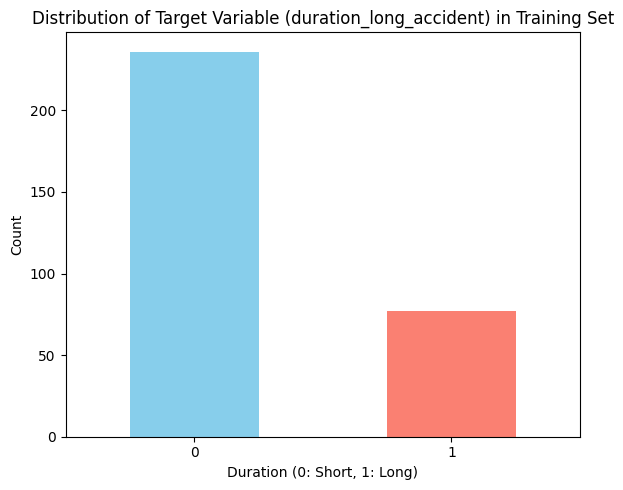

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming y_train_iter_3 is your target variable for the training set
if 'y_train_iter_3' in locals():
    plt.figure(figsize=(6, 5))
    # Use value_counts to get the counts of each category (0 and 1)
    # sort_index() ensures the bars are in order 0, 1
    y_train_iter_3.value_counts().sort_index().plot(kind='bar', color=['skyblue', 'salmon'])

    plt.title('Distribution of Target Variable (duration_long_accident) in Training Set')
    plt.xlabel('Duration (0: Short, 1: Long)')
    plt.ylabel('Count')
    plt.xticks(rotation=0) # Keep labels horizontal
    plt.tight_layout() # Adjust layout to prevent labels overlapping
    plt.show()
else:
    print("Target variable y_train_iter_3 not available. Please ensure data splitting was successful.")

## spatial feature engineering

In [ ]:
if 'X_train_iter_4' in locals() and 'lat' in X_train_iter_4.columns and 'lng' in X_train_iter_4.columns: # Check if data and columns exist
    N_BINS = 8 # Example number of bins for gridding
    GEOHASH_PRECISION = 7 # Example geohash precision
    KDE_BANDWIDTH = 0.05 # Example KDE bandwidth - VERY SENSITIVE, needs tuning/domain knowledge

    # --- Create Road Segment ID using the adjusted function ---
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train_iter_4.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train_iter_4.columns:
        # Call the adjusted function
        X_train_iter_4 = create_road_segment_feature_adjusted(X_train_iter_4)
        X_val_iter_4 = create_road_segment_feature_adjusted(X_val_iter_4)
        X_test_iter_4 = create_road_segment_feature_adjusted(X_test_iter_4)
        print("Adjusted road segment ID feature created.")
        # You can check the counts of the new categories:
        # print("Value counts for adjusted segment_id in X_train_iter_4:")
        # print(X_train_iter_4['segment_id'].value_counts().head(10))
    else:
        print("Skipping road segment ID creation: Required columns not found.")


    # --- Apply Coordinate Binning ---
    # (No changes needed here, ensure 'lat'/'lng' are present if you run this)
    if 'lat' in X_train_iter_4.columns and 'lng' in X_train_iter_4.columns:
        X_train_iter_4 = create_coordinate_bins(X_train_iter_4, n_bins=N_BINS, fit_df=X_train_iter_4.copy())
        X_val_iter_4 = create_coordinate_bins(X_val_iter_4, n_bins=N_BINS, fit_df=X_train_iter_4.copy())
        X_test_iter_4 = create_coordinate_bins(X_test_iter_4, n_bins=N_BINS, fit_df=X_train_iter_4.copy())
        print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
    else:
        print("Skipping coordinate binning: lat/lng columns not found.")


    # --- Apply Geohashing ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_4.columns and 'lng' in X_train_iter_4.columns:
        X_train_iter_4 = apply_geohash(X_train_iter_4, precision=GEOHASH_PRECISION)
        X_val_iter_4 = apply_geohash(X_val_iter_4, precision=GEOHASH_PRECISION)
        X_test_iter_4 = apply_geohash(X_test_iter_4, precision=GEOHASH_PRECISION)
        print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
    else:
        print("Skipping geohashing: lat/lng columns not found.")


    # --- Apply KDE Score ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_4.columns and 'lng' in X_train_iter_4.columns:
        X_train_iter_4_coords_for_kde = X_train_iter_4[['lat', 'lng']].dropna()
        if not X_train_iter_4_coords_for_kde.empty:
            X_train_iter_4 = apply_kde_score(X_train_iter_4.dropna(subset=['lat', 'lng']), X_train_iter_4_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_val_iter_4 = apply_kde_score(X_val_iter_4.dropna(subset=['lat', 'lng']), X_train_iter_4_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_test_iter_4 = apply_kde_score(X_test_iter_4.dropna(subset=['lat', 'lng']), X_train_iter_4_coords_for_kde, bandwidth=KDE_BANDWIDTH)

            # X_train_iter_4['kde_score'].fillna(0.0, inplace=True)
            X_train_iter_4.fillna({'kde_score':0.0},inplace=True)
            # X_val_iter_4['kde_score'].fillna(0.0, inplace=True)
            X_val_iter_4.fillna({'kde_score':0.0},inplace=True)
            # X_test_iter_4['kde_score'].fillna(0.0, inplace=True)
            X_test_iter_4.fillna({'kde_score':0.0},inplace=True)

            print("KDE scores created.")
        else:
            print("Skipping KDE: No valid coordinates in X_train_iter_4 to fit KDE.")
            X_train_iter_4['kde_score'] = 0.0
            X_val_iter_4['kde_score'] = 0.0
            X_test_iter_4['kde_score'] = 0.0
    else:
        print("Skipping KDE score: lat/lng columns not found.")


    # Display some of the new features
    # (Ensure the column name for segment_id matches what's created, e.g. 'segment_id')
    new_spatial_cols = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_4.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_4.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'kde_score' in X_train_iter_4.columns: new_spatial_cols.append('kde_score')
    # Check for the actual segment_id column name, assuming it's 'segment_id' from prefix='segment'
    if 'segment_id' in X_train_iter_4.columns: new_spatial_cols.append('segment_id')

    new_spatial_cols = [col for col in new_spatial_cols if col in X_train_iter_4.columns]
    if new_spatial_cols:
        print("\nSample of new spatial features in X_train_iter_4:")
        # In Colab, display() is better for DataFrames
        try:
            display(X_train_iter_4[new_spatial_cols].head())
        except NameError: # If display() is not available (e.g. standard Python script)
            print(X_train_iter_4[new_spatial_cols].head())

    else:
        print("\nNo new spatial features were added or found to display.")

else:
    print("Skipping spatial feature engineering: X_train_iter_4 or key columns not available.")

Adjusted road segment ID feature created.
Coordinate bins (8x8) created.
Geohash (precision 7) features created.
KDE scores created.

Sample of new spatial features in X_train_iter_4:


,grid_cell_8x8,geohash_p7,kde_score,segment_id
35,1_7,sw8zzd3,12.901846,E_44.0
176,7_2,swbb9tg,5.695342,A_11.6
367,7_3,swbbdgc,8.878136,N_16.5
101,5_5,swbbq5e,28.500867,E_30.5
170,4_6,swbbpnj,22.241806,A_36.4


In [ ]:
# X_train_iter_4, X_val_iter_4, X_test_iter_4 are your dataframes after spatial features are engineered
columns_to_drop_after_spatial_eng = ['lat', 'lng'] # Add any other raw source columns if needed

X_train_iter_4 = X_train_iter_4.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_val_iter_4 = X_val_iter_4.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_test_iter_4 = X_test_iter_4.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')

print(f"Dropped raw spatial columns: {columns_to_drop_after_spatial_eng}")

Dropped raw spatial columns: ['lat', 'lng']


## preprocessing

In [ ]:
if 'X_train_iter_4' in locals():
    # Identify feature types AFTER new spatial features are created
    # New categorical features from spatial engineering:
    new_cat_spatial_features = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_4.columns: new_cat_spatial_features.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_4.columns: new_cat_spatial_features.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'segment_id' in X_train_iter_4.columns: new_cat_spatial_features.append('segment_id')
    # Add more if you create other categorical spatial features e.g. lat_bin_N, lng_bin_N as separate features

    # New numerical features from spatial engineering:
    new_num_spatial_features = []
    if 'kde_score' in X_train_iter_4.columns: new_num_spatial_features.append('kde_score')


    all_categorical_features = X_train_iter_4.select_dtypes(include=['object', 'category']).columns.tolist()
    # Ensure our new spatial categoricals are included if not automatically detected as object/category
    for f in new_cat_spatial_features:
        if f not in all_categorical_features and f in X_train_iter_4.columns:
            all_categorical_features.append(f)
            X_train_iter_4[f] = X_train_iter_4[f].astype('category') # Ensure correct dtype
            X_val_iter_4[f] = X_val_iter_4[f].astype('category')
            X_test_iter_4[f] = X_test_iter_4[f].astype('category')


    # Features for 'unknown' imputation (original list)
    categorical_features_unknown_impute = [
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', "weather_description", 'effective_lighting_condition'
    ]
    categorical_features_unknown_impute = [col for col in categorical_features_unknown_impute if col in X_train_iter_4.columns and col in all_categorical_features]


    # Other categorical features (if any) for 'most_frequent' imputation
    # This will now include new_cat_spatial_features if they are not in the unknown_impute list
    categorical_features_mode_impute = [
        col for col in all_categorical_features if col not in categorical_features_unknown_impute
    ]

    boolean_features = X_train_iter_4.select_dtypes(include=['bool']).columns.tolist()
    for bf in boolean_features:
        X_train_iter_4[bf] = X_train_iter_4[bf].astype(int)
        X_val_iter_4[bf] = X_val_iter_4[bf].astype(int)
        X_test_iter_4[bf] = X_test_iter_4[bf].astype(int)

    numerical_features = X_train_iter_4.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    # Ensure our new numerical spatial features are included
    for f in new_num_spatial_features:
        if f not in numerical_features and f in X_train_iter_4.columns:
            numerical_features.append(f)


    print(f"Final Numerical features for preprocessor: {numerical_features}")
    print(f"Final Categorical features for 'unknown' imputation: {categorical_features_unknown_impute}")
    print(f"Final Categorical features for 'most_frequent' imputation: {categorical_features_mode_impute}")


    # --- The rest of your ColumnTransformer and preprocessing code follows ---
    # Create preprocessing pipelines (as you had before)
    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    categorical_pipeline_unknown = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    categorical_pipeline_mode = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')), # New spatial categoricals (grid_cell, geohash) usually don't have NaNs if created properly
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    transformers_list = []
    if numerical_features: # Add only if list is not empty
         transformers_list.append(('num', numerical_pipeline, numerical_features))
    if categorical_features_unknown_impute:
        transformers_list.append(('cat_unknown', categorical_pipeline_unknown, categorical_features_unknown_impute))
    if categorical_features_mode_impute:
        transformers_list.append(('cat_mode', categorical_pipeline_mode, categorical_features_mode_impute))

    preprocessor = ColumnTransformer(
        transformers=transformers_list,
        remainder='passthrough'
    )

    # Fit and transform (as you had before)
    # ... your existing code for fitting preprocessor and creating X_train_iter_4_processed_df ...
    # (No changes needed to that part if the feature lists fed into ColumnTransformer are correct)
    # Fit preprocessor on X_train_iter_4 and transform all sets
    X_train_iter_4_processed = preprocessor.fit_transform(X_train_iter_4)
    X_val_iter_4_processed = preprocessor.transform(X_val_iter_4)
    X_test_iter_4_processed = preprocessor.transform(X_test_iter_4)

    # Get feature names after one-hot encoding for RFE and interpretation
    try:
        feature_names_out = preprocessor.get_feature_names_out()
        X_train_iter_4_processed_df = pd.DataFrame(X_train_iter_4_processed, columns=feature_names_out, index=X_train_iter_4.index)
        X_val_iter_4_processed_df = pd.DataFrame(X_val_iter_4_processed, columns=feature_names_out, index=X_val_iter_4.index)
        X_test_iter_4_processed_df = pd.DataFrame(X_test_iter_4_processed, columns=feature_names_out, index=X_test_iter_4.index)
        print(f"Processed training data shape: {X_train_iter_4_processed_df.shape}")
    except Exception as e:
        print(f"Could not get feature names from preprocessor automatically: {e}")
        X_train_iter_4_processed_df = pd.DataFrame(X_train_iter_4_processed, index=X_train_iter_4.index)
        X_val_iter_4_processed_df = pd.DataFrame(X_val_iter_4_processed, index=X_val_iter_4.index)
        X_test_iter_4_processed_df = pd.DataFrame(X_test_iter_4_processed, index=X_test_iter_4.index)
        feature_names_out = X_train_iter_4_processed_df.columns.astype(str)
        print(f"Processed training data shape (generic column names): {X_train_iter_4_processed_df.shape}")

Final Numerical features for preprocessor: ['num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.', 'is_exit_veer_on_highway_A_FP_alert', 'is_exit_veer_on_wet_road_FP_alert', 'low_vehicle_count_and_exit_veer_FP_alert', 'precipitation', 'day_of_week_sin', 'day_of_week_cos', 'accidents_past_3h', 'road_lanes', 'road_maxspeed', 'lat_bin_8', 'lng_bin_8', 'kde_score']
Final Categorical features for 'unknown' imputation: ['ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', 'effective_lighting_condition']
Final Categorical features for 'most_frequent' imputation: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'segment_id', 'grid_cell_8x8', 'geohash_p7']
Processed training data shape: (313, 691)


## colinearity


Mutual Information Scores (Top 15):
cat_mode__segment_id_N_19.3     0.100226
cat_mode__geohash_p7_swbbkzy    0.072511
cat_mode__segment_id_E_43.7     0.069556
cat_mode__geohash_p7_swbbmp6    0.065770
cat_mode__segment_id_K_1.5      0.063816
cat_mode__geohash_p7_swbbp5n    0.061887
cat_mode__geohash_p7_sw8zz99    0.061332
cat_mode__segment_id_A_45.3     0.060899
cat_mode__segment_id_Y_8.1      0.059251
cat_mode__segment_id_Z_19.5     0.057706
cat_mode__segment_id_E_35.1     0.057476
cat_mode__segment_id_P_5.6      0.056891
cat_mode__segment_id_Z_16.0     0.056453
cat_mode__ΧΙΛ.ΘΕΣΗ_19.6         0.055564
cat_mode__segment_id_X_5.6      0.054950
dtype: float64


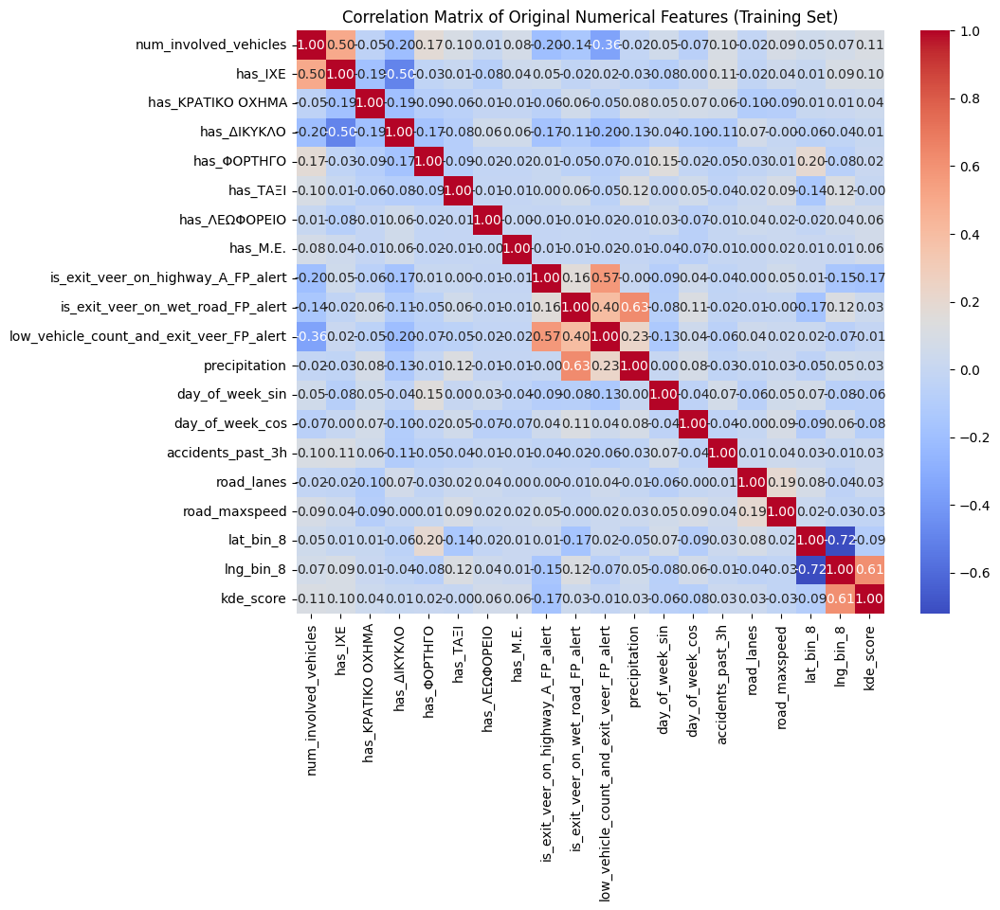

In [ ]:
if 'X_train_iter_4_processed_df' in locals():
    # Note: For filter methods, it's often better to use them on data *before* extensive transformations
    # if the transformations obscure original relationships (e.g. scaling for chi2).
    # However, for simplicity here, we use the processed data.
    # Ensure all data is non-negative for chi2 if applicable
    # For mutual_info_classif and f_classif, current processed data is fine.

    # Mutual Information (works for both num and cat (post-OHE))
    mi_scores = mutual_info_classif(X_train_iter_4_processed_df, y_train, random_state=42)
    mi_series = pd.Series(mi_scores, index=feature_names_out).sort_values(ascending=False)
    print("\nMutual Information Scores (Top 15):")
    print(mi_series.head(15))

    # Correlation (for numerical features in X_train_iter_4_processed_df - identify them again)
    # This is more complex with OHE. For now, let's skip detailed VIF on OHE.
    # A simple correlation heatmap on the original numerical features can be insightful:
    if len(numerical_features) > 1:
        plt.figure(figsize=(10, 8))
        sns.heatmap(X_train_iter_4[numerical_features].corr(), annot=True, cmap='coolwarm', fmt=".2f")
        plt.title("Correlation Matrix of Original Numerical Features (Training Set)")
        plt.show()


## recursive feature elimination with cross validation


--- Iteration 3: Recursive Feature Elimination with Cross-Validation (RFECV) ---
RFECV will use the estimator: LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42,
                   solver='liblinear')
Cross-validation strategy: StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
Scoring metric for feature selection: 'roc_auc'
Fitting RFECV... (This might take some time)
Optimal number of features found by RFECV: 512

Selected features from RFECV (512):
Shape of X_train after RFECV: (313, 512)


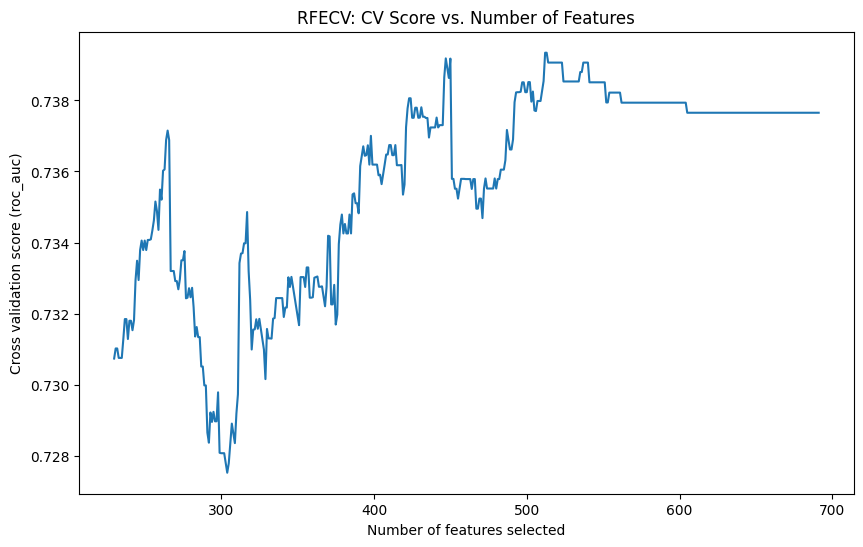

In [ ]:
# Ensure necessary imports
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression # Your chosen estimator
from sklearn.metrics import make_scorer, f1_score # For scoring if needed


if 'X_train_iter_4_processed_df' in locals() and X_train_iter_4_processed_df is not None and \
   'y_train_iter_4' in locals() and y_train_iter_4 is not None:

    print("\n--- Iteration 3: Recursive Feature Elimination with Cross-Validation (RFECV) ---")

    estimator_rfecv = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)

    # Define the cross-validation strategy
    # StratifiedKFold is good for classification, especially with imbalanced classes
    cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) # Using 5 splits as an example

    # Define the scoring metric for RFECV to optimize
    # For imbalanced classes, 'f1', 'roc_auc', or 'average_precision' (PR AUC) are often better than 'accuracy'.
    # Let's use 'f1' for the positive class (assuming positive_label=1)
    # If your positive class is not 1, adjust pos_label
    # You can also use 'roc_auc', 'average_precision', etc.
    scorer_for_rfecv = make_scorer(f1_score, pos_label=1, average='binary', zero_division=0)
    # Alternatively, just use a string like 'f1_macro', 'roc_auc'.
    # For binary classification and focusing on the positive class, 'f1' (which defaults to f1 of positive class if pos_label=1) or 'roc_auc' are good.
    # Let's use 'roc_auc' as it's a common general-purpose metric for RFECV selection
    # and less prone to issues if a fold has no positive predictions for some feature subsets.

    print(f"RFECV will use the estimator: {estimator_rfecv}")
    print(f"Cross-validation strategy: {cv_strategy}")
    print(f"Scoring metric for feature selection: 'roc_auc'") # Or your chosen scorer

    rfecv = RFECV(
        estimator=estimator_rfecv,
        step=1,  # Remove 1 feature at each step
        cv=cv_strategy,
        scoring='roc_auc',  # Metric to optimize for feature selection
        min_features_to_select=max(5, X_train_iter_4_processed_df.shape[1] // 3), # Example: select at least 5 features, or 10%
        n_jobs=-1 # Use all available cores
    )

    print("Fitting RFECV... (This might take some time)")
    try:
        rfecv.fit(X_train_iter_4_processed_df, y_train_iter_4)

        print(f"Optimal number of features found by RFECV: {rfecv.n_features_}")

        # Get the mask of selected features
        selected_features_rfecv_mask = rfecv.support_

        # Get the names of the selected features
        # Ensure that X_train_iter_4_processed_df has columns attribute (it should if it's a DataFrame)
        selected_features_rfecv = X_train_iter_4_processed_df.columns[selected_features_rfecv_mask]

        print(f"\nSelected features from RFECV ({len(selected_features_rfecv)}):")
        # Printing all feature names can be very long, consider printing only a few or just the count
        # print(selected_features_rfecv.tolist())

        # Update DataFrames to keep only RFECV selected features
        X_train_iter_4_iter_final = X_train_iter_4_processed_df[selected_features_rfecv]
        X_val_iter_4_iter_final = X_val_iter_4_processed_df[selected_features_rfecv]
        X_test_iter_4_iter_final = X_test_iter_4_processed_df[selected_features_rfecv]

        print(f"Shape of X_train after RFECV: {X_train_iter_4_iter_final.shape}")

        # You can also plot the number of features vs. cross-validation scores
        if hasattr(rfecv, "cv_results_"):
            try:
                import matplotlib.pyplot as plt
                n_scores = len(rfecv.cv_results_["mean_test_score"]) # Number of features evaluated
                plt.figure(figsize=(10,6))
                plt.xlabel("Number of features selected")
                plt.ylabel(f"Cross validation score ({rfecv.scoring})")
                plt.plot(
                    range(rfecv.min_features_to_select, n_scores + rfecv.min_features_to_select), # X-axis: number of features
                    rfecv.cv_results_["mean_test_score"],
                )
                plt.title("RFECV: CV Score vs. Number of Features")
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot RFECV scores: {plot_e}")

    except ValueError as ve:
        print(f"ValueError during RFECV fitting: {ve}")
        print("This might occur if input data is problematic or no features could be selected.")
        # Fallback: use all features from preprocessing if RFECV fails
        X_train_iter_4_iter_final = X_train_iter_4_processed_df.copy()
        X_val_iter_4_iter_final = X_val_iter_4_processed_df.copy()
        X_test_iter_4_iter_final = X_test_iter_4_processed_df.copy()
        print("Using all preprocessed features as RFECV failed.")
    except Exception as e:
        print(f"An unexpected error occurred during RFECV: {e}")
        X_train_iter_4_iter_final = X_train_iter_4_processed_df.copy() # Fallback
        X_val_iter_4_iter_final = X_val_iter_4_processed_df.copy()
        X_test_iter_4_iter_final = X_test_iter_4_processed_df.copy()
        print("Using all preprocessed features as RFECV encountered an error.")


else:
    print("Skipping RFECV as processed data (X_train_iter_4_processed_df or y_train_iter_4) is not available.")
    # Define fallback if previous steps failed
    if 'X_train_iter_4_processed_df' in locals() and X_train_iter_4_processed_df is not None:
        X_train_iter_4_iter_final = X_train_iter_4_processed_df.copy()
        X_val_iter_4_iter_final = X_val_iter_4_processed_df.copy() if 'X_val_iter_4_processed_df' in locals() and X_val_iter_4_processed_df is not None else None
        X_test_iter_4_iter_final = X_test_iter_4_processed_df.copy() if 'X_test_iter_4_processed_df' in locals() and X_test_iter_4_processed_df is not None else None
    else:
        X_train_iter_4_iter_final, X_val_iter_4_iter_final, X_test_iter_4_iter_final = None, None, None

## balancing techniques

In [ ]:
# Previous code: X_train_iter_4_iter_final, y_train_iter_4, X_val_iter_final, y_val are defined

resampled_datasets_iter_4 = {} # To store (X_resampled, y_resampled) for each technique

if 'X_train_iter_4_iter_final' in locals() and X_train_iter_4_iter_final is not None and y_train_iter_4 is not None:
    print(f"\nOriginal training set shape: {X_train_iter_4_iter_final.shape}, Original class distribution: {Counter(y_train_iter_4)}")
    minority_class_count = Counter(y_train_iter_4).get(1, 0) # Assuming 1 is the minority class

    # Store the original (non-resampled) training data as a baseline
    resampled_datasets_iter_4['Original'] = (X_train_iter_4_iter_final.copy(), y_train_iter_4.copy())

    # Define samplers
    samplers = {
        "RandomOverSampler": RandomOverSampler(random_state=42),
        "SMOTE": None, # Will initialize carefully due to k_neighbors
        "ADASYN": None, # Will initialize carefully due to n_neighbors
        "TomekLinks": TomekLinks(sampling_strategy='auto', n_jobs=-1), # Undersampling, removes Tomek links
        "SMOTETomek": None, # Will initialize carefully
        "SMOTEENN": None # Will initialize carefully
    }

    # SMOTE and ADASYN require k_neighbors (or n_neighbors for ADASYN) < minority_class_count
    if minority_class_count > 1:
        k_val = min(4, minority_class_count - 1) # A common heuristic for k, ensuring it's less than minority samples

        if k_val > 0 : # Ensure k_val is positive
            samplers["SMOTE"] = SMOTE(random_state=42, k_neighbors=k_val)
            samplers["ADASYN"] = ADASYN(random_state=42, n_neighbors=k_val) # ADASYN uses n_neighbors
            samplers["SMOTETomek"] = SMOTETomek(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), tomek=TomekLinks(sampling_strategy='auto'), n_jobs=-1)
            samplers["SMOTEENN"] = SMOTEENN(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), enn=None, n_jobs=-1) # enn default is good
        else:
            print(f"Skipping SMOTE-based samplers as k_val ({k_val}) would be too small or zero based on minority count ({minority_class_count}).")
            # Remove them if they can't be initialized
            for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
                if key in samplers: samplers.pop(key)

    else:
        print(f"Skipping SMOTE-based samplers as minority count ({minority_class_count}) is <= 1.")
        for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
            if key in samplers: samplers.pop(key)


    # Apply each sampler
    for name, sampler in samplers.items():
        if sampler is None: # Sampler was not initialized
            continue
        print(f"\nApplying {name}...")
        try:
            X_res, y_res = sampler.fit_resample(X_train_iter_4_iter_final, y_train_iter_4)
            resampled_datasets_iter_4[name] = (X_res, y_res)
            print(f"Resampled with {name}: X_shape={X_res.shape}, y_dist={Counter(y_res)}")
        except Exception as e:
            print(f"Could not apply {name}. Error: {e}")
            # Optionally store original if sampler fails, or skip
            # resampled_datasets_iter_4[name] = (X_train_iter_4_iter_final.copy(), y_train_iter_4.copy())


    if not resampled_datasets_iter_4: # If all samplers failed or were skipped
        print("No resampling techniques were successfully applied or initialized. Using original data only.")
        if 'Original' not in resampled_datasets_iter_4: # Should already be there
             resampled_datasets_iter_4['Original'] = (X_train_iter_4_iter_final.copy(), y_train_iter_4.copy())


else:
    print("Skipping balancing as X_train_iter_4_iter_final or y_train_iter_4 is not available.")
    # Ensure there's at least 'Original' if X_train_iter_4_iter_final was available
    if 'X_train_iter_4_iter_final' in locals() and X_train_iter_4_iter_final is not None and y_train_iter_4 is not None:
        resampled_datasets_iter_4['Original'] = (X_train_iter_4_iter_final.copy(), y_train_iter_4.copy())


Original training set shape: (313, 512), Original class distribution: Counter({0: 236, 1: 77})

Applying RandomOverSampler...
Resampled with RandomOverSampler: X_shape=(472, 512), y_dist=Counter({0: 236, 1: 236})

Applying SMOTE...
Resampled with SMOTE: X_shape=(472, 512), y_dist=Counter({0: 236, 1: 236})

Applying ADASYN...
Resampled with ADASYN: X_shape=(467, 512), y_dist=Counter({0: 236, 1: 231})

Applying TomekLinks...
Resampled with TomekLinks: X_shape=(298, 512), y_dist=Counter({0: 221, 1: 77})

Applying SMOTETomek...
Resampled with SMOTETomek: X_shape=(471, 512), y_dist=Counter({0: 236, 1: 235})

Applying SMOTEENN...
Resampled with SMOTEENN: X_shape=(313, 512), y_dist=Counter({1: 202, 0: 111})


## model training

In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier # Ensure this import is present


trained_models_iter_4 = {} # To store trained models: key will be "ModelName_SamplerName"

if 'resampled_datasets_iter_4' in locals() and resampled_datasets_iter_4:
    minority_class_label = 1 # Assuming 'death' is 1
    f1_minority_scorer = make_scorer(f1_score, pos_label=minority_class_label, average='binary') # For CV if you add it later

    for sampler_name, (X_train_curr_resampled, y_train_curr_resampled) in resampled_datasets_iter_4.items():
        print(f"\n--- Training models on data from: {sampler_name} ---")
        print(f"Training data shape: {X_train_curr_resampled.shape}, Distribution: {Counter(y_train_curr_resampled)}")

        # Define your models here or ensure they are defined from a previous cell
        # Re-initialize models for each dataset to ensure they are fresh

        # Calculate scale_pos_weight for XGBoost based on the current resampled data
        counts_curr = Counter(y_train_curr_resampled)
        scale_pos_weight_curr = counts_curr[0] / counts_curr[1] if counts_curr[1] > 0 else 1

        # calculate the ratio of the target variable in the training set in order to
        # get the weights for the custom ratio logistic regression
        counts_curr = Counter(y_train_curr_resampled)
        n_majority = counts_curr.get(0, 0) # Count of class 0 (assuming majority)
        n_minority = counts_curr.get(1, 0) # Count of class 1 (assuming minority)

        if n_minority > 0 and n_majority > 0:

          weight_minority = n_majority / n_minority
          custom_class_weights = {0: 1.0, 1: weight_minority}


        current_models_definitions = {
            'LogisticRegression': LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_custom_ratio':LogisticRegression(solver='liblinear',random_state=42,class_weight=custom_class_weights,max_iter=1000),
            'LogisticRegression_L1': LogisticRegression(solver='liblinear', penalty='l1', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_L2':LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000, penalty='l2'),
            'RandomForest': RandomForestClassifier(random_state=42, class_weight='balanced_subsample', n_estimators=100),
            'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='logloss',
                             scale_pos_weight=scale_pos_weight_curr),
            'BalancedRandomForest': BalancedRandomForestClassifier(random_state=42, n_estimators=100, sampling_strategy='auto', replacement=True, n_jobs=-1),
            'RUSBoost': RUSBoostClassifier(random_state=42, n_estimators=50, sampling_strategy='auto') # n_estimators often lower for boosting
        }
        # Note on class_weight='balanced':
        # For 'Original' data (imbalanced), it's useful.
        # For data resampled to be perfectly balanced (e.g., SMOTE to 50/50), class_weight='balanced' might have less effect
        # or could be omitted, but it generally doesn't hurt and can help if balance isn't perfect.

        for model_name, model_instance in current_models_definitions.items():
            full_model_name = f"{model_name}_{sampler_name}"
            print(f"Training {full_model_name}...")
            try:
                model_instance.fit(X_train_curr_resampled, y_train_curr_resampled)
                trained_models_iter_4[full_model_name] = model_instance
                print(f"{full_model_name} trained.")
            except Exception as e:
                print(f"Could not train {full_model_name}. Error: {e}")
                trained_models_iter_4[full_model_name] = None # Store None if training failed

else:
    print("Skipping model training as no resampled datasets are available.")


--- Training models on data from: Original ---
Training data shape: (313, 512), Distribution: Counter({0: 236, 1: 77})
Training LogisticRegression_Original...
LogisticRegression_Original trained.
Training LogisticRegression_custom_ratio_Original...
LogisticRegression_custom_ratio_Original trained.
Training LogisticRegression_L1_Original...
LogisticRegression_L1_Original trained.
Training LogisticRegression_L2_Original...
LogisticRegression_L2_Original trained.
Training RandomForest_Original...
RandomForest_Original trained.
Training XGBoost_Original...
XGBoost_Original trained.
Training BalancedRandomForest_Original...
BalancedRandomForest_Original trained.
Training RUSBoost_Original...
RUSBoost_Original trained.

--- Training models on data from: RandomOverSampler ---
Training data shape: (472, 512), Distribution: Counter({0: 236, 1: 236})
Training LogisticRegression_RandomOverSampler...
LogisticRegression_RandomOverSampler trained.
Training LogisticRegression_custom_ratio_RandomOver

## model evaluation

In [ ]:
if 'trained_models_iter_4' in locals() and trained_models_iter_4 and \
   'X_val_iter_4_iter_final' in locals() and X_val_iter_4_iter_final is not None and y_val_iter_4 is not None:

    print("\n--- Model Assessment on Validation Set ---")

    # Store results for later comparison if needed
    validation_results_iter_4 = {}

    for full_model_name, model in trained_models_iter_4.items():
        if model is not None: # Check if model was trained
            print(f"\n--- Assessing: {full_model_name} ---")
            try:
                y_pred_val_iter_4 = model.predict(X_val_iter_4_iter_final)
                y_proba_val_iter_4 = model.predict_proba(X_val_iter_4_iter_final)[:, 1] # Probability of positive class

                report = classification_report(y_val_iter_4, y_pred_val_iter_4, target_names=['Short (0)', 'Long (1)'], output_dict=True)
                roc_auc = roc_auc_score(y_val_iter_4, y_proba_val_iter_4)
                precision_pr, recall_pr, _ = precision_recall_curve(y_val_iter_4, y_proba_val_iter_4)
                pr_auc = auc(recall_pr, precision_pr)
                conf_matrix = confusion_matrix(y_val_iter_4, y_pred_val_iter_4)

                print(classification_report(y_val_iter_4, y_pred_val_iter_4, target_names=['Short (0)', 'Long (1)']))
                print(f"Confusion Matrix:\n{conf_matrix}")
                print(f"ROC AUC: {roc_auc:.4f}")
                print(f"PR AUC: {pr_auc:.4f}")

                # Store results
                validation_results_iter_4[full_model_name] = {
                    'classification_report': report,
                    'confusion_matrix': conf_matrix.tolist(), # convert numpy array to list for easier storage/JSON
                    'roc_auc': roc_auc,
                    'pr_auc': pr_auc,
                    'f1_long': report.get('Long (1)', {}).get('f1-score', 0), # F1 for minority class
                    'recall_long': report.get('Long (1)', {}).get('recall', 0) # Recall for minority class
                }
            except Exception as e:
                print(f"Could not assess {full_model_name}. Error: {e}")
                validation_results_iter_4[full_model_name] = {'error': str(e)}
        else:
            print(f"Model {full_model_name} was not trained, skipping assessment.")
            validation_results_iter_4[full_model_name] = {'error': 'Model not trained'}

    # Optional: Print a summary table of key metrics from validation_results_iter_4
    if validation_results_iter_4:
        print("\n--- Validation Results Summary (F1 and Recall for Long class, PR AUC) ---")
        summary_df = pd.DataFrame([
            {'Model_Sampler': name,
             'F1_long': data.get('f1_long', 'N/A'),
             'Recall_long': data.get('recall_long', 'N/A'),
             'PR_AUC': data.get('pr_auc', 'N/A'),
             'ROC_AUC': data.get('roc_auc', 'N/A')}
            for name, data in validation_results_iter_4.items() if 'error' not in data
        ])
        if not summary_df.empty:
            summary_df = summary_df.sort_values(by='F1_long', ascending=False) # Sort by F1 for Long class
            try:
                display(summary_df) # Works well in Colab
            except NameError:
                print(summary_df)
        else:
            print("No valid results to summarize.")


else:
    print("Skipping model assessment: Trained models or validation data are not available.")


--- Model Assessment on Validation Set ---

--- Assessing: LogisticRegression_Original ---
              precision    recall  f1-score   support

   Short (0)       0.87      0.76      0.81        79
    Long (1)       0.47      0.65      0.55        26

    accuracy                           0.73       105
   macro avg       0.67      0.71      0.68       105
weighted avg       0.77      0.73      0.75       105

Confusion Matrix:
[[60 19]
 [ 9 17]]
ROC AUC: 0.7634
PR AUC: 0.4917

--- Assessing: LogisticRegression_custom_ratio_Original ---
              precision    recall  f1-score   support

   Short (0)       0.87      0.78      0.83        79
    Long (1)       0.50      0.65      0.57        26

    accuracy                           0.75       105
   macro avg       0.69      0.72      0.70       105
weighted avg       0.78      0.75      0.76       105

Confusion Matrix:
[[62 17]
 [ 9 17]]
ROC AUC: 0.7644
PR AUC: 0.4988

--- Assessing: LogisticRegression_L1_Original ---
      

,Model_Sampler,F1_long,Recall_long,PR_AUC,ROC_AUC
40,LogisticRegression_SMOTETomek,0.596491,0.653846,0.490259,0.760467
41,LogisticRegression_custom_ratio_SMOTETomek,0.596491,0.653846,0.490259,0.760467
43,LogisticRegression_L2_SMOTETomek,0.596491,0.653846,0.490259,0.760467
31,RUSBoost_ADASYN,0.596491,0.653846,0.455801,0.754869
19,LogisticRegression_L2_SMOTE,0.576271,0.653846,0.493803,0.762902
16,LogisticRegression_SMOTE,0.576271,0.653846,0.493803,0.762902
17,LogisticRegression_custom_ratio_SMOTE,0.576271,0.653846,0.493803,0.762902
1,LogisticRegression_custom_ratio_Original,0.566667,0.653846,0.498792,0.764362
8,LogisticRegression_RandomOverSampler,0.557377,0.653846,0.501598,0.766796
11,LogisticRegression_L2_RandomOverSampler,0.557377,0.653846,0.501598,0.766796


## error analysis

In [ ]:
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt # Ensure these are imported if you want plots
import seaborn as sns           # Ensure these are imported if you want plots

def perform_detailed_error_analysis(
    model_name, model,
    X_val_processed_features, y_true_labels,
    X_val_original_features, # DataFrame with original, interpretable features (MUST BE ALIGNED WITH y_true_labels)
    key_categorical_features, # List of key categorical feature names
    key_numerical_features,   # List of key numerical feature names
    target_class_name='Long', positive_label=1, negative_label=0
):
    print(f"\n--- Detailed Error Analysis for: {model_name} ---")

    if model is None:
        print(f"Model '{model_name}' is None, skipping analysis.")
        return None

    # CRITICAL PRE-CONDITION CHECK:
    if not X_val_original_features.index.equals(y_true_labels.index):
        print("CRITICAL ERROR in perform_detailed_error_analysis: ")
        print("Indices of X_val_original_features and y_true_labels DO NOT MATCH upon entry.")
        print("Ensure X_val_original_features is correctly prepared with an index matching y_true_labels before calling this function.")
        print(f"X_val_original_features index head: {X_val_original_features.index[:3]}")
        print(f"y_true_labels index head: {y_true_labels.index[:3]}")
        return None

    if not X_val_processed_features.index.equals(y_true_labels.index):
        print("CRITICAL WARNING in perform_detailed_error_analysis: ")
        print("Indices of X_val_processed_features and y_true_labels DO NOT MATCH upon entry.")
        print("This can lead to misaligned predictions if not handled carefully in model.predict stage.")
        # Depending on model behavior, predictions might still align if X_val_processed_features was used to generate y_pred in order.


    # Make predictions
    y_pred = model.predict(X_val_processed_features)
    y_pred_series = pd.Series(y_pred, index=y_true_labels.index) # Align y_pred with y_true_labels' index

    y_pred_proba = None
    if hasattr(model, "predict_proba"):
        try:
            # Get probability of the positive class
            y_pred_proba_all = model.predict_proba(X_val_processed_features)
            y_pred_proba = pd.Series(y_pred_proba_all[:, positive_label], index=y_true_labels.index)
        except Exception as e:
            print(f"Warning: Could not get predict_proba: {e}")
    else:
        print("Warning: Model does not have predict_proba method.")

    # Create a DataFrame with true labels, predicted labels, and original features
    analysis_df = X_val_original_features.copy()
    analysis_df['actual_duration'] = y_true_labels
    analysis_df['predicted_duration'] = y_pred_series # Use aligned predictions
    if y_pred_proba is not None:
        analysis_df[f'predicted_proba_{target_class_name}'] = y_pred_proba

    # Define groups
    tp_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == positive_label)]
    fp_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == positive_label)]
    fn_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == negative_label)]
    tn_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == negative_label)]

    actual_pos_count = (analysis_df['actual_duration'] == positive_label).sum()
    predicted_pos_count = (analysis_df['predicted_duration'] == positive_label).sum()

    print(f"\nOverall Validation Set Performance ({model_name}):")
    print(f"Total cases: {len(analysis_df)}")
    print(f"Actual {target_class_name}s ({positive_label}): {actual_pos_count}")
    print(f"Predicted {target_class_name}s ({positive_label}): {predicted_pos_count}")
    print(f"TP ({target_class_name}): {len(tp_data)}, FP ({target_class_name}): {len(fp_data)}, FN ({target_class_name}): {len(fn_data)}, TN (Not {target_class_name}): {len(tn_data)}")

    groups = {
        f'TPs for {target_class_name}': tp_data,
        f'FNs for {target_class_name} (Actual {target_class_name}, Predicted Short)': fn_data,
        f'FPs for {target_class_name} (Actual Short, Predicted {target_class_name})': fp_data,
        # You can also analyze TNs if desired
        # f'TNs (Not {target_class_name})': tn_data
    }

    for group_name_full, group_df in groups.items():
        if group_df.empty:
            print(f"\nNo data for {group_name_full} group.")
            continue
        print(f"\n--- Characteristics of {group_name_full} (Count: {len(group_df)}) ---")

        try:
            print(f"Overall descriptive stats for {group_name_full}:")
            display(group_df.describe(include='all').transpose().fillna(''))
        except Exception as e:
            print(f"Could not display describe for {group_name_full}: {e}")

        # Numerical features summary
        numerical_features_in_group = [col for col in key_numerical_features if col in group_df.columns]
        if numerical_features_in_group:
            print(f"\nNumerical Feature Summaries for {group_name_full}:")
            try:
                display(group_df[numerical_features_in_group].describe().transpose().fillna(''))
            except Exception as e:
                print(f"Could not display numerical summaries for {group_name_full}: {e}")

        # Categorical features summary
        categorical_features_in_group = [col for col in key_categorical_features if col in group_df.columns]
        if categorical_features_in_group:
            print(f"\nCategorical Feature Value Counts (Top 5) for {group_name_full}:")
            for col in categorical_features_in_group:
                print(f"\nValue counts for '{col}' in {group_name_full}:")
                try:
                    display(group_df[col].value_counts(normalize=True, dropna=False).head().to_frame())
                except Exception as e:
                    print(f"Could not display value_counts for {col} in {group_name_full}: {e}")

        if y_pred_proba is not None and ('FNs' in group_name_full or 'FPs' in group_name_full):
             print(f"\nPredicted Probabilities for {group_name_full}:")
             try:
                display(group_df[[f'predicted_proba_{target_class_name}']].describe().transpose().fillna(''))
             except Exception as e:
                print(f"Could not display probability summaries for {group_name_full}: {e}")


    # Optional: Display sample rows from FN and FP
    if not fn_data.empty:
        print(f"\nSample False Negatives (Actual {target_class_name}, Predicted Short):")
        display(fn_data.head(min(5, len(fn_data))))
    if not fp_data.empty:
        print(f"\nSample False Positives (Actual Short, Predicted {target_class_name}):")
        display(fp_data.head(min(5, len(fp_data))))

    print(f"\n--- End of Error Analysis for: {model_name} ---")
    return analysis_df

In [ ]:
# --- This code comes AFTER your existing Iteration 3 setup: ---
# 1. df_iteration_p75 created
# 2. df_iter3 created from df_iteration_p75
# 3. X, y split from df_iter3
# 4. X_train_iter_4, X_val_iter_4, X_test_iter_4, y_train_iter_4, y_val_iter_4, y_test_iter_4 created via train_test_split

# IMPORTANT: Create a copy of X_val_iter_4 for original features analysis BEFORE it's modified
# This X_val_iter_4 comes from the train_test_split and contains the features selected in `columns_iter3`
# Its index is aligned with y_val_iter_4.
if 'X_val_iter_4' in locals() and 'y_val_iter_4' in locals():
    X_val_iter_4_original_for_analysis = X_val_iter_4.copy()
    print(f"Captured X_val_iter_4_original_for_analysis with shape: {X_val_iter_4_original_for_analysis.shape}")
else:
    print("Error: X_val_iter_4 or y_val_iter_4 not found before capturing original validation features for analysis.")
    # Handle this error, perhaps by exiting or ensuring these variables are correctly named and populated

# ... then your existing code for:
# ... spatial feature engineering (modifying X_train_iter_4, X_val_iter_4, X_test_iter_4)
# ... dropping lat/lng (modifying X_train_iter_4, X_val_iter_4, X_test_iter_4)
# ... identifying feature types and preprocessing (creating X_train_iter_4_processed_df, X_val_iter_4_processed_df, etc.)
# ... RFECV (creating X_train_iter_4_iter_final, X_val_iter_4_iter_final, etc.)
# ... Resampling (creating resampled_datasets_iter_4)
# ... Model training (populating trained_models_iter_4)
# ... Model assessment loop (populating validation_results_iter_4) ...
# --- END OF YOUR EXISTING Iteration 3 PIPELINE (before adding error analysis call) ---


# --- Now, add the call to the detailed error analysis function ---
print("\n\n--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---")

if ('trained_models_iter_4' in locals() and trained_models_iter_4 and
    'X_val_iter_4_iter_final' in locals() and X_val_iter_4_iter_final is not None and
    'y_val_iter_4' in locals() and y_val_iter_4 is not None and
    'X_val_iter_4_original_for_analysis' in locals() and X_val_iter_4_original_for_analysis is not None):

    # Define the key original feature columns you want to analyze in detail
    # These should be columns present in X_val_iter_4_original_for_analysis
    key_categorical_to_analyze = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ',
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.',
        'effective_lighting_condition', 'segment_id', 'grid_cell_8x8', 'geohash_p7'
    ]
    key_numerical_to_analyze = [
        'num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ',
        'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'lat_bin_8', 'lng_bin_8', 'kde_score' # Assuming lat/lng bins were in original features
    ]

    # Filter to ensure all listed columns are actually in the DataFrame to avoid errors
    key_cats_present = [col for col in key_categorical_to_analyze if col in X_val_iter_4_original_for_analysis.columns]
    key_nums_present = [col for col in key_numerical_to_analyze if col in X_val_iter_4_original_for_analysis.columns]

    # Choose the model you want to analyze from your trained_models_iter_4 dictionary
    # For example, if RUSBoost_RandomOverSampler was trained on 'Original' (non-resampled) data:
    model_key_to_analyze = 'LogisticRegression_SMOTETomek' # Adjust if your sampler name differs (e.g. 'Original' for no sampler)

    if model_key_to_analyze in trained_models_iter_4:
        model_object_to_analyze = trained_models_iter_4[model_key_to_analyze]

        if model_object_to_analyze is not None:
            print(f"\n>>> Performing detailed analysis for model: {model_key_to_analyze}")
            # Call the function
            error_analysis_output_df_iter3 = perform_detailed_error_analysis(
                model_name=model_key_to_analyze,
                model=model_object_to_analyze,
                X_val_processed_features=X_val_iter_4_iter_final, # Processed features for prediction
                y_true_labels=y_val_iter_4,                        # True labels
                X_val_original_features=X_val_iter_4_original_for_analysis, # ALIGNED original features
                key_categorical_features=key_cats_present,
                key_numerical_features=key_nums_present,
                target_class_name='Long_P75' # Custom name for clarity
            )
            if error_analysis_output_df_iter3 is not None:
                print("\nError analysis DataFrame sample (iter3):")
                display(error_analysis_output_df_iter3.head())
        else:
            print(f"Model object for {model_key_to_analyze} is None (was not trained).")
    else:
        print(f"Model key '{model_key_to_analyze}' not found in trained_models_iter_4.")
        print(f"Available models: {list(trained_models_iter_4.keys())}")

else:
    print("One or more required DataFrames for detailed error analysis are missing. Please check: ")
    print("- trained_models_iter_4 (and the specific model key)")
    print("- X_val_iter_4_iter_final (processed validation features)")
    print("- y_val_iter_4 (validation labels)")
    print("- X_val_iter_4_original_for_analysis (original validation features, captured before modification)")

Captured X_val_iter_4_original_for_analysis with shape: (105, 33)


--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---

>>> Performing detailed analysis for model: LogisticRegression_SMOTETomek

--- Detailed Error Analysis for: LogisticRegression_SMOTETomek ---

Overall Validation Set Performance (LogisticRegression_SMOTETomek):
Total cases: 105
Actual Long_P75s (1): 26
Predicted Long_P75s (1): 31
TP (Long_P75): 17, FP (Long_P75): 14, FN (Long_P75): 9, TN (Not Long_P75): 65

--- Characteristics of TPs for Long_P75 (Count: 17) ---
Overall descriptive stats for TPs for Long_P75:


<ipython-input-180-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,17.0,6,A,7,,,,,,,
ΧΙΛ.ΘΕΣΗ,17.0,12,0.0,6,,,,,,,
ΣΗΡΑΓΓΑ,17.0,2,no_ΣΗΡΑΓΓΑ,16,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,17.0,9,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),3,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,17.0,1,ΟΧΙ,17,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,17.0,2,ΚΑΛΟΚΑΙΡΙΑ,16,,,,,,,
ΣΥΝΘ._ΟΔ.,17.0,2,ΚΑΝΟΝΙΚΕΣ,15,,,,,,,
ΚΑΤ._ΟΔ.,17.0,2,ΚΑΝΟΝΙΚΗ,16,,,,,,,
ΤΕΧΝ._ΦΩΤ.,6.0,1,ΕΠΑΡΚΗΣ,6,,,,,,,
num_involved_vehicles,17.0,,,,2.058824,0.826936,1.0,2.0,2.0,2.0,4.0



Numerical Feature Summaries for TPs for Long_P75:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,17.0,2.058824,0.826936,1.000000,2.000000,2.000000,2.000000,4.000000
has_ΙΧΕ,17.0,0.823529,0.392953,0.000000,1.000000,1.000000,1.000000,1.000000
has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,17.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_ΔΙΚΥΚΛΟ,17.0,0.176471,0.392953,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΦΟΡΤΗΓΟ,17.0,0.294118,0.469668,0.000000,0.000000,0.000000,1.000000,1.000000
has_ΤΑΞΙ,17.0,0.176471,0.392953,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΛΕΩΦΟΡΕΙΟ,17.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_Μ.Ε.,17.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
lat_bin_8,17.0,4.176471,2.603730,0.000000,2.000000,6.000000,6.000000,7.000000
lng_bin_8,17.0,3.588235,2.851728,0.000000,0.000000,3.000000,6.000000,7.000000



Categorical Feature Value Counts (Top 5) for TPs for Long_P75:

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in TPs for Long_P75:


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
A,0.411765
E,0.294118
M,0.117647
Z,0.058824
K,0.058824



Value counts for 'ΧΙΛ.ΘΕΣΗ' in TPs for Long_P75:


,proportion
ΧΙΛ.ΘΕΣΗ,
0.0,0.352941
20.1,0.058824
16.9,0.058824
11.5,0.058824
49.5,0.058824



Value counts for 'ΣΗΡΑΓΓΑ' in TPs for Long_P75:


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,0.941176
ΖΕΦΥΡΙΟΥ - Α,0.058824



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in TPs for Long_P75:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.176471
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.176471
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.117647
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.117647
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.117647



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in TPs for Long_P75:


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in TPs for Long_P75:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.941176
ΧΑΛΑΖΙ,0.058824



Value counts for 'ΣΥΝΘ._ΟΔ.' in TPs for Long_P75:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.882353
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.117647



Value counts for 'ΚΑΤ._ΟΔ.' in TPs for Long_P75:


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,0.941176
ΑΛΛΗ,0.058824



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in TPs for Long_P75:


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.647059
ΕΠΑΡΚΗΣ,0.352941



Value counts for 'effective_lighting_condition' in TPs for Long_P75:


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.470588
Night - Artificial Lighting Sufficient (Manual),0.235294
Night - Artificial Lighting Issue Suspected,0.176471
Daylight - Sufficient (Manual),0.117647



Value counts for 'segment_id' in TPs for Long_P75:


,proportion
segment_id,
E_EntryZone_Or_UnknownKM,0.176471
A_EntryZone_Or_UnknownKM,0.117647
A_20.1,0.058824
Z_16.9,0.058824
E_11.5,0.058824



Value counts for 'grid_cell_8x8' in TPs for Long_P75:


,proportion
grid_cell_8x8,
6.0_0,0.294118
7.0_3,0.117647
1.0_7,0.117647
0.0_7,0.117647
4.0_6,0.117647



Value counts for 'geohash_p7' in TPs for Long_P75:


,proportion
geohash_p7,
swb8x01,0.176471
swb8x04,0.117647
swbbedq,0.058824
swbbdg2,0.058824
swbb9tf,0.058824



--- Characteristics of FNs for Long_P75 (Actual Long_P75, Predicted Short) (Count: 9) ---
Overall descriptive stats for FNs for Long_P75 (Actual Long_P75, Predicted Short):


<ipython-input-180-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,9.0,4,E,4,,,,,,,
ΧΙΛ.ΘΕΣΗ,9.0,9,20.9,1,,,,,,,
ΣΗΡΑΓΓΑ,9.0,1,no_ΣΗΡΑΓΓΑ,9,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,9.0,5,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,3,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,9.0,1,ΟΧΙ,9,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,9.0,2,ΚΑΛΟΚΑΙΡΙΑ,8,,,,,,,
ΣΥΝΘ._ΟΔ.,9.0,2,ΚΑΝΟΝΙΚΕΣ,7,,,,,,,
ΚΑΤ._ΟΔ.,9.0,1,ΚΑΝΟΝΙΚΗ,9,,,,,,,
ΤΕΧΝ._ΦΩΤ.,4.0,1,ΕΠΑΡΚΗΣ,4,,,,,,,
num_involved_vehicles,9.0,,,,2.0,0.707107,1.0,2.0,2.0,2.0,3.0



Numerical Feature Summaries for FNs for Long_P75 (Actual Long_P75, Predicted Short):


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,9.0,2.000000,0.707107,1.000000,2.000000,2.000000,2.000000,3.000000
has_ΙΧΕ,9.0,0.777778,0.440959,0.000000,1.000000,1.000000,1.000000,1.000000
has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,9.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_ΔΙΚΥΚΛΟ,9.0,0.777778,0.440959,0.000000,1.000000,1.000000,1.000000,1.000000
has_ΦΟΡΤΗΓΟ,9.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_ΤΑΞΙ,9.0,0.111111,0.333333,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΛΕΩΦΟΡΕΙΟ,9.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_Μ.Ε.,9.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
lat_bin_8,9.0,4.333333,2.061553,0.000000,3.000000,5.000000,6.000000,6.000000
lng_bin_8,9.0,4.555556,1.943651,0.000000,4.000000,5.000000,5.000000,7.000000



Categorical Feature Value Counts (Top 5) for FNs for Long_P75 (Actual Long_P75, Predicted Short):

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
E,0.444444
A,0.333333
K,0.111111
M,0.111111



Value counts for 'ΧΙΛ.ΘΕΣΗ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΧΙΛ.ΘΕΣΗ,
20.9,0.111111
48.3,0.111111
0.5,0.111111
26.9,0.111111
24.4,0.111111



Value counts for 'ΣΗΡΑΓΓΑ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,1.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.333333
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.222222
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.222222
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.111111
4D.Ι - ΣΕ ΚΤΙΣΜΑ/ΣΤΑΘ. ΑΝΤΙΚΕΙΜΕΝΟ,0.111111



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.888889
ΒΡΟΧΗ,0.111111



Value counts for 'ΣΥΝΘ._ΟΔ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.777778
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.222222



Value counts for 'ΚΑΤ._ΟΔ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,1.0



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.555556
ΕΠΑΡΚΗΣ,0.444444



Value counts for 'effective_lighting_condition' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.555556
Night - Artificial Lighting Sufficient (Manual),0.333333
Daylight - Sufficient (Manual),0.111111



Value counts for 'segment_id' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
segment_id,
A_20.9,0.111111
E_48.3,0.111111
K_0.5,0.111111
E_26.9,0.111111
A_24.4,0.111111



Value counts for 'grid_cell_8x8' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
grid_cell_8x8,
6.0_4,0.222222
3.0_5,0.222222
0.0_7,0.111111
6.0_5,0.111111
6.0_0,0.111111



Value counts for 'geohash_p7' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
geohash_p7,
swbbefh,0.111111
sw8zxvr,0.111111
swbbj9d,0.111111
swbbmq3,0.111111
swbbsb8,0.111111



Predicted Probabilities for FNs for Long_P75 (Actual Long_P75, Predicted Short):


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Long_P75,9.0,0.166511,0.090697,0.043199,0.080457,0.158685,0.254601,0.25846



--- Characteristics of FPs for Long_P75 (Actual Short, Predicted Long_P75) (Count: 14) ---
Overall descriptive stats for FPs for Long_P75 (Actual Short, Predicted Long_P75):


<ipython-input-180-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,14.0,2,E,8,,,,,,,
ΧΙΛ.ΘΕΣΗ,14.0,13,0.0,2,,,,,,,
ΣΗΡΑΓΓΑ,14.0,1,no_ΣΗΡΑΓΓΑ,14,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,14.0,7,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,4,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,14.0,1,ΟΧΙ,14,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,14.0,1,ΚΑΛΟΚΑΙΡΙΑ,14,,,,,,,
ΣΥΝΘ._ΟΔ.,14.0,2,ΚΑΝΟΝΙΚΕΣ,12,,,,,,,
ΚΑΤ._ΟΔ.,14.0,1,ΚΑΝΟΝΙΚΗ,14,,,,,,,
ΤΕΧΝ._ΦΩΤ.,3.0,1,ΕΠΑΡΚΗΣ,3,,,,,,,
num_involved_vehicles,14.0,,,,2.142857,1.292412,1.0,1.25,2.0,2.0,5.0



Numerical Feature Summaries for FPs for Long_P75 (Actual Short, Predicted Long_P75):


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,14.0,2.142857,1.292412,1.000000,1.250000,2.000000,2.000000,5.000000
has_ΙΧΕ,14.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,14.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_ΔΙΚΥΚΛΟ,14.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_ΦΟΡΤΗΓΟ,14.0,0.214286,0.425815,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΤΑΞΙ,14.0,0.142857,0.363137,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΛΕΩΦΟΡΕΙΟ,14.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_Μ.Ε.,14.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
lat_bin_8,14.0,3.785714,3.067913,-1.000000,1.000000,5.500000,6.000000,7.000000
lng_bin_8,14.0,4.142857,2.797173,0.000000,1.500000,4.500000,7.000000,7.000000



Categorical Feature Value Counts (Top 5) for FPs for Long_P75 (Actual Short, Predicted Long_P75):

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
E,0.571429
A,0.428571



Value counts for 'ΧΙΛ.ΘΕΣΗ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΧΙΛ.ΘΕΣΗ,
0.0,0.142857
42.1,0.071429
16.4,0.071429
7.9,0.071429
43.1,0.071429



Value counts for 'ΣΗΡΑΓΓΑ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,1.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.285714
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.142857
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.142857
4D.Υ1 - ΣΥΓΚΡΟΥΣΗ ΑΝΩ ΤΩΝ ΤΕΣΣΑΡΩΝ ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.142857
4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,0.142857



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,1.0



Value counts for 'ΣΥΝΘ._ΟΔ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.857143
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.142857



Value counts for 'ΚΑΤ._ΟΔ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,1.0



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.785714
ΕΠΑΡΚΗΣ,0.214286



Value counts for 'effective_lighting_condition' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
effective_lighting_condition,
Daylight - Assumed Sufficient (No Manual Entry),0.642857
Night - Artificial Lighting Sufficient (Manual),0.214286
Night - Artificial Lighting Issue Suspected,0.142857



Value counts for 'segment_id' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
segment_id,
E_EntryZone_Or_UnknownKM,0.142857
E_42.1,0.071429
E_16.4,0.071429
A_7.9,0.071429
E_43.1,0.071429



Value counts for 'grid_cell_8x8' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
grid_cell_8x8,
7.0_3,0.142857
1.0_7,0.142857
0.0_7,0.142857
6.0_0,0.142857
2.0_7,0.071429



Value counts for 'geohash_p7' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
geohash_p7,
swb8x01,0.142857
sw8zzt9,0.071429
swbbdu1,0.071429
swbb8wv,0.071429
sw8zzec,0.071429



Predicted Probabilities for FPs for Long_P75 (Actual Short, Predicted Long_P75):


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Long_P75,14.0,0.765358,0.113988,0.618307,0.686798,0.747148,0.808348,0.997151



Sample False Negatives (Actual Long_P75, Predicted Short):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,road_maxspeed,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration,predicted_proba_Long_P75
63,A,20.9,no_ΣΗΡΑΓΓΑ,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,3,...,50.0,A_20.9,6.0,4,6.0_4,swbbefh,14.911992,1,0,0.244062
249,E,48.3,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,50.0,E_48.3,0.0,7,0.0_7,sw8zxvr,7.887097,1,0,0.143705
280,K,0.5,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,2,...,100.0,K_0.5,3.0,5,3.0_5,swbbj9d,20.237827,1,0,0.258460
242,E,26.9,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,1,...,100.0,E_26.9,6.0,5,6.0_5,swbbmq3,25.755430,1,0,0.057140
384,A,24.4,no_ΣΗΡΑΓΓΑ,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,3,...,100.0,A_24.4,6.0,4,6.0_4,swbbsb8,21.402336,1,0,0.158685



Sample False Positives (Actual Short, Predicted Long_P75):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,road_maxspeed,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration,predicted_proba_Long_P75
119,E,42.1,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,100.0,E_42.1,2.0,7,2.0_7,sw8zzt9,15.222874,0,1,0.632022
64,E,16.4,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,2,...,100.0,E_16.4,7.0,3,7.0_3,swbbdu1,8.826497,0,1,0.944938
94,A,7.9,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,120.0,A_7.9,-1.0,1,unknown_cell,swbb8wv,5.050685,0,1,0.688244
361,E,43.1,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,100.0,E_43.1,1.0,7,1.0_7,sw8zzec,14.054608,0,1,0.754643
349,E,0.0,no_ΣΗΡΑΓΓΑ,4D.Υ1 - ΣΥΓΚΡΟΥΣΗ ΑΝΩ ΤΩΝ ΤΕΣΣΑΡΩΝ ΟΧΗΜΑΤΩΝ (Κ...,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,5,...,100.0,E_EntryZone_Or_UnknownKM,6.0,0,6.0_0,swb8x01,7.545538,0,1,0.736699



--- End of Error Analysis for: LogisticRegression_SMOTETomek ---

Error analysis DataFrame sample (iter3):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,road_maxspeed,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration,predicted_proba_Long_P75
16,A,35.2,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,120.0,A_35.2,4.0,6,4.0_6,swbbr05,22.720951,0,0,0.245082
274,E,26.8,no_ΣΗΡΑΓΓΑ,4D.Ν - ΕΚΤΡΟΠΗ ΔΕΞΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,60.0,E_26.8,6.0,5,6.0_5,swbbmq3,25.601001,0,0,0.237543
415,E,0.0,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,100.0,E_EntryZone_Or_UnknownKM,6.0,0,6.0_0,swb8x01,7.545538,0,0,0.117957
490,B,5.6,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,NaN,B_5.6,4.0,6,4.0_6,swbbnrj,28.159081,0,0,0.058353
437,A,26.2,no_ΣΗΡΑΓΓΑ,4D.Χ - ΠΡΟΣΚΡΟΥΣΗ ΣΕ ΜΟΝΙΜΗ ΣΗΜΑΝΣΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,100.0,A_26.2,6.0,5,6.0_5,swbbmpj,24.631705,0,0,0.178017


## feature analysis

In [ ]:
summary_df

,Model_Sampler,F1_long,Recall_long,PR_AUC,ROC_AUC
40,LogisticRegression_SMOTETomek,0.596491,0.653846,0.490259,0.760467
41,LogisticRegression_custom_ratio_SMOTETomek,0.596491,0.653846,0.490259,0.760467
43,LogisticRegression_L2_SMOTETomek,0.596491,0.653846,0.490259,0.760467
31,RUSBoost_ADASYN,0.596491,0.653846,0.455801,0.754869
19,LogisticRegression_L2_SMOTE,0.576271,0.653846,0.493803,0.762902
16,LogisticRegression_SMOTE,0.576271,0.653846,0.493803,0.762902
17,LogisticRegression_custom_ratio_SMOTE,0.576271,0.653846,0.493803,0.762902
1,LogisticRegression_custom_ratio_Original,0.566667,0.653846,0.498792,0.764362
8,LogisticRegression_RandomOverSampler,0.557377,0.653846,0.501598,0.766796
11,LogisticRegression_L2_RandomOverSampler,0.557377,0.653846,0.501598,0.766796


## coefficients



--- Iteration 4: Additional Analysis (Feature Importance & Threshold Tuning) ---
Iter 4: Best model selected for further analysis: LogisticRegression_SMOTETomek

--- Iter 4: Feature Importance for LogisticRegression_SMOTETomek ---


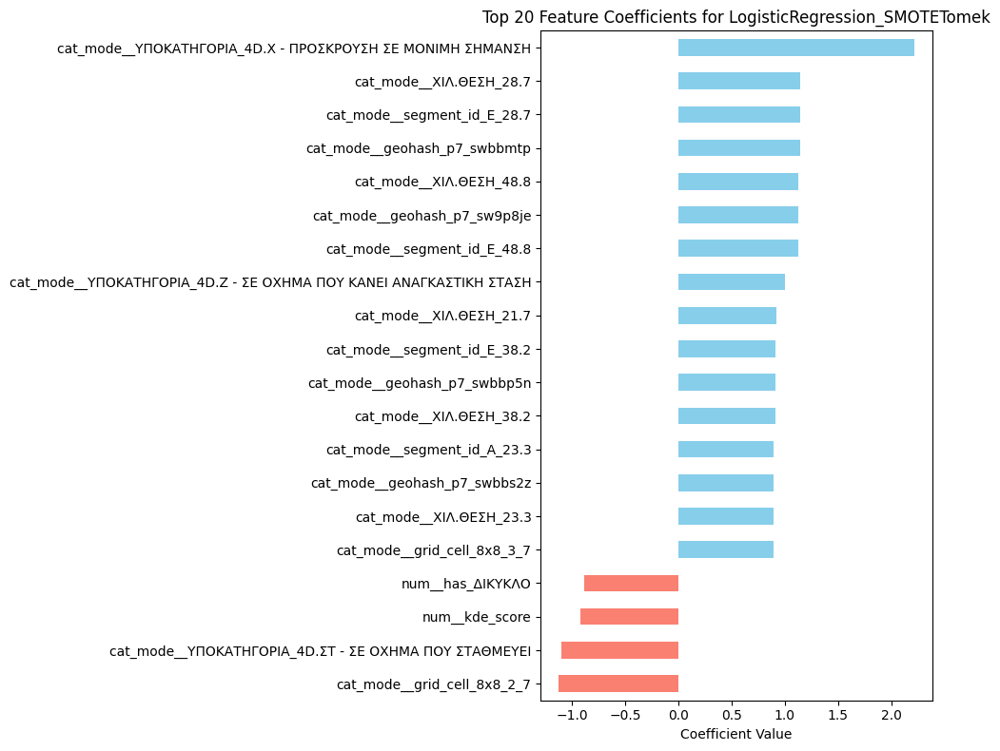

Top 20 Logistic Regression Coefficients:


,Coefficient
cat_mode__grid_cell_8x8_2_7,-1.123965
cat_mode__ΥΠΟΚΑΤΗΓΟΡΙΑ_4D.ΣΤ - ΣΕ ΟΧΗΜΑ ΠΟΥ ΣΤΑΘΜΕΥΕΙ,-1.093221
num__kde_score,-0.917581
num__has_ΔΙΚΥΚΛΟ,-0.887468
cat_mode__grid_cell_8x8_3_7,0.892846
cat_mode__ΧΙΛ.ΘΕΣΗ_23.3,0.898588
cat_mode__geohash_p7_swbbs2z,0.898588
cat_mode__segment_id_A_23.3,0.898588
cat_mode__ΧΙΛ.ΘΕΣΗ_38.2,0.916395
cat_mode__geohash_p7_swbbp5n,0.916395


In [ ]:
print("\n\n--- Iteration 4: Additional Analysis (Feature Importance & Threshold Tuning) ---")

best_model_name_iter4 = None
best_model_object_iter4 = None
y_proba_val_for_best_model_iter4 = None

# Determine the best model from validation results
if 'summary_df' in locals() and not summary_df.empty:
    best_model_name_iter4 = summary_df.iloc[0]['Model_Sampler'] # Assumes sorted by F1_long
    if best_model_name_iter4 in trained_models_iter_4:
        best_model_object_iter4 = trained_models_iter_4[best_model_name_iter4]
        if best_model_name_iter4 in validation_results_iter_4 and 'y_proba_val' in validation_results_iter_4[best_model_name_iter4]:
             y_proba_val_for_best_model_iter4 = validation_results_iter_4[best_model_name_iter4]['y_proba_val']
        else: # Recalculate if not stored
            if best_model_object_iter4 and hasattr(best_model_object_iter4, "predict_proba") and X_val_iter_4_iter_final is not None:
                y_proba_val_for_best_model_iter4 = best_model_object_iter4.predict_proba(X_val_iter_4_iter_final)[:, 1]

    print(f"Iter 4: Best model selected for further analysis: {best_model_name_iter4}")
else:
    print("Iter 4: Could not determine best model from validation summary.")

if best_model_object_iter4 is not None and X_val_iter_4_iter_final is not None and y_val_iter_4 is not None:

    # --- 1. Feature Importance Analysis ---
    print(f"\n--- Iter 4: Feature Importance for {best_model_name_iter4} ---")

    # a) Logistic Regression Coefficients (if applicable)
    if isinstance(best_model_object_iter4, LogisticRegression):
        if hasattr(best_model_object_iter4, 'coef_') and selected_features_rfecv is not None:
            coefficients_iter4 = best_model_object_iter4.coef_[0] # Assuming binary classification
            coef_series_iter4 = pd.Series(coefficients_iter4, index=selected_features_rfecv) # Use RFECV selected feature names

            # Sort by absolute value for top N
            top_n_coef_iter4 = coef_series_iter4.abs().sort_values(ascending=False).head(20)
            top_n_actual_coef_iter4 = coef_series_iter4.loc[top_n_coef_iter4.index].sort_values()

            plt.figure(figsize=(10, 8))
            top_n_actual_coef_iter4.plot(kind='barh', color=top_n_actual_coef_iter4.apply(lambda x: 'skyblue' if x > 0 else 'salmon'))
            plt.title(f'Top 20 Feature Coefficients for {best_model_name_iter4}')
            plt.xlabel('Coefficient Value')
            plt.tight_layout()
            plt.show()
            print("Top 20 Logistic Regression Coefficients:")
            display(top_n_actual_coef_iter4.to_frame(name="Coefficient"))
        else:
            print("Could not retrieve coefficients (model not fitted, or not Logistic Regression with coef_, or feature names missing).")

## permutation


Calculating Permutation Importance for LogisticRegression_SMOTETomek...


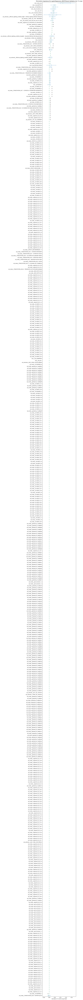


Top 15 Features by Permutation Importance (Mean Decrease in F1 Long):


,Mean Importance Decrease
num__kde_score,0.140058
num__has_ΦΟΡΤΗΓΟ,0.046318
cat_mode__ΑΥΤ/ΔΡΟΜΟΣ_E,0.045419
num__day_of_week_cos,0.037856
num__has_ΤΑΞΙ,0.035987
num__num_involved_vehicles,0.034053
num__has_ΔΙΚΥΚΛΟ,0.031139
cat_unknown__effective_lighting_condition_Night - Artificial Lighting Sufficient (Manual),0.030924
cat_unknown__ΣΥΝΘ._ΟΔ._ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.029472
num__low_vehicle_count_and_exit_veer_FP_alert,0.027595


In [ ]:
from sklearn.inspection import permutation_importance
print(f"\nCalculating Permutation Importance for {best_model_name_iter4}...")
# Ensure selected_features_rfecv (feature names for X_val_iter_4_iter_final) is available
if selected_features_rfecv is not None and len(selected_features_rfecv) == X_val_iter_4_iter_final.shape[1]:
    try:
        perm_importance = permutation_importance(
            best_model_object_iter4,
            X_val_iter_4_iter_final,
            y_val_iter_4,
            scoring=make_scorer(f1_score, pos_label=1, average='binary', zero_division=0), # F1 for 'Long' class
            n_repeats=10,
            random_state=42,
            n_jobs=-1
        )
        sorted_idx = perm_importance.importances_mean.argsort()
        perm_importance_df = pd.DataFrame(
            perm_importance.importances[sorted_idx].T,
            columns=selected_features_rfecv[sorted_idx] # Use RFECV selected feature names
        )

        plt.figure(figsize=(12, max(8, len(selected_features_rfecv) * 0.3))) # Dynamic height
        perm_importance_df.plot.box(vert=False, whis=10, ax=plt.gca())
        plt.title(f"Permutation Importance for {best_model_name_iter4} (Validation Set, F1 Long)")
        plt.xlabel("Decrease in F1 Score (Long Class)")
        plt.tight_layout()
        plt.show()

        # Display top N mean importances
        top_n_perm = 15
        perm_mean_series = pd.Series(perm_importance.importances_mean, index=selected_features_rfecv)
        print(f"\nTop {top_n_perm} Features by Permutation Importance (Mean Decrease in F1 Long):")
        display(perm_mean_series.sort_values(ascending=False).head(top_n_perm).to_frame(name="Mean Importance Decrease"))

    except Exception as e_perm:
        print(f"Error calculating Permutation Importance: {e_perm}")
else:
    print("Skipping Permutation Importance: Feature names (selected_features_rfecv) not available or mismatch columns.")


## threshold tuning


--- Iter 4: Threshold Fine-tuning for LogisticRegression_SMOTETomek ---
Best Threshold: 0.5077 (yields F1 Long: 0.5965)


<ipython-input-185-195baabbf84e>:11: RuntimeWarning: invalid value encountered in divide
  f1_scores_thresh = (2 * precisions * recalls) / (precisions + recalls)


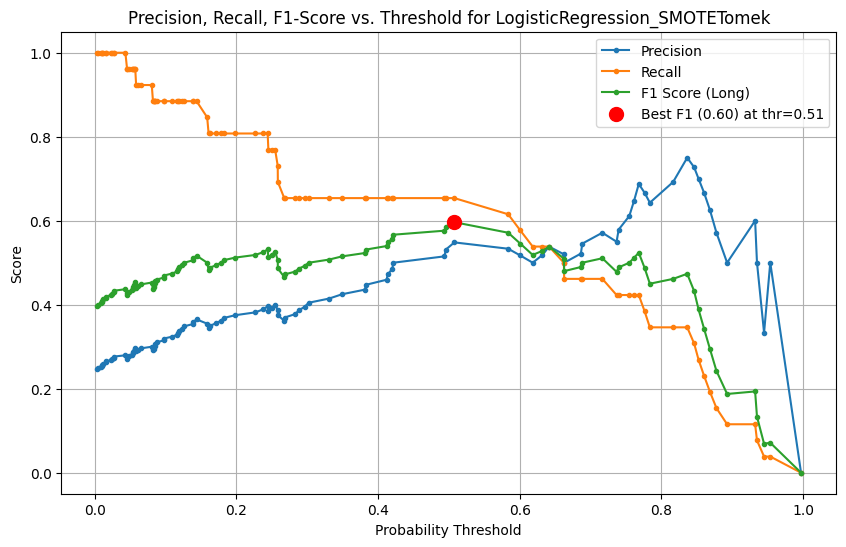


Classification Report on Validation Set with Tuned Threshold:
              precision    recall  f1-score   support

   Short (0)       0.88      0.82      0.85        79
    Long (1)       0.55      0.65      0.60        26

    accuracy                           0.78       105
   macro avg       0.71      0.74      0.72       105
weighted avg       0.80      0.78      0.79       105


Confusion Matrix with Tuned Threshold:
[[65 14]
 [ 9 17]]


In [ ]:
if y_proba_val_for_best_model_iter4 is not None:
        print(f"\n--- Iter 4: Threshold Fine-tuning for {best_model_name_iter4} ---")
        precisions, recalls, thresholds_pr = precision_recall_curve(y_val_iter_4, y_proba_val_for_best_model_iter4)

        # Exclude the last precision (1.0) and recall (0.0) which don't have a corresponding threshold
        if len(thresholds_pr) == len(precisions) - 1:
            precisions = precisions[:-1]
            recalls = recalls[:-1]

        # Calculate F1 score for each threshold
        f1_scores_thresh = (2 * precisions * recalls) / (precisions + recalls)
        f1_scores_thresh = np.nan_to_num(f1_scores_thresh) # Handle division by zero if P or R is 0

        best_f1_idx = np.argmax(f1_scores_thresh)
        best_threshold = thresholds_pr[best_f1_idx]
        best_f1_score = f1_scores_thresh[best_f1_idx]

        print(f"Best Threshold: {best_threshold:.4f} (yields F1 Long: {best_f1_score:.4f})")

        plt.figure(figsize=(10, 6))
        plt.plot(thresholds_pr, precisions, label='Precision', marker='.')
        plt.plot(thresholds_pr, recalls, label='Recall', marker='.')
        plt.plot(thresholds_pr, f1_scores_thresh, label='F1 Score (Long)', marker='.')
        plt.scatter(best_threshold, best_f1_score, marker='o', color='red', label=f'Best F1 ({best_f1_score:.2f}) at thr={best_threshold:.2f}', s=100, zorder=5)
        plt.xlabel("Probability Threshold")
        plt.ylabel("Score")
        plt.title(f"Precision, Recall, F1-Score vs. Threshold for {best_model_name_iter4}")
        plt.legend()
        plt.grid(True)
        plt.show()

        # Evaluate with the new threshold on validation set
        y_pred_tuned_thresh = (y_proba_val_for_best_model_iter4 >= best_threshold).astype(int)
        print("\nClassification Report on Validation Set with Tuned Threshold:")
        print(classification_report(y_val_iter_4, y_pred_tuned_thresh, target_names=['Short (0)', 'Long (1)'], zero_division=0))
        print("\nConfusion Matrix with Tuned Threshold:")
        print(confusion_matrix(y_val_iter_4, y_pred_tuned_thresh))
else:
        print("Skipping Threshold Tuning: Validation probabilities not available for the best model.")

## test set evaluation

Using tuned threshold for test set evaluation: 0.5077
Model selected for final test set evaluation: LogisticRegression_SMOTETomek

--- Iteration 4: Final Evaluation on Test Set ---
Using Model: LogisticRegression_SMOTETomek
Using Threshold: 0.5077

ROC AUC (Test Set): 0.6918
PR AUC (Test Set): 0.3788

Classification Report (Test Set with Tuned Threshold):
              precision    recall  f1-score   support

   Short (0)       0.82      0.75      0.78        79
    Long (1)       0.39      0.50      0.44        26

    accuracy                           0.69       105
   macro avg       0.61      0.62      0.61       105
weighted avg       0.71      0.69      0.70       105


Confusion Matrix (Test Set with Tuned Threshold):
[[59 20]
 [13 13]]


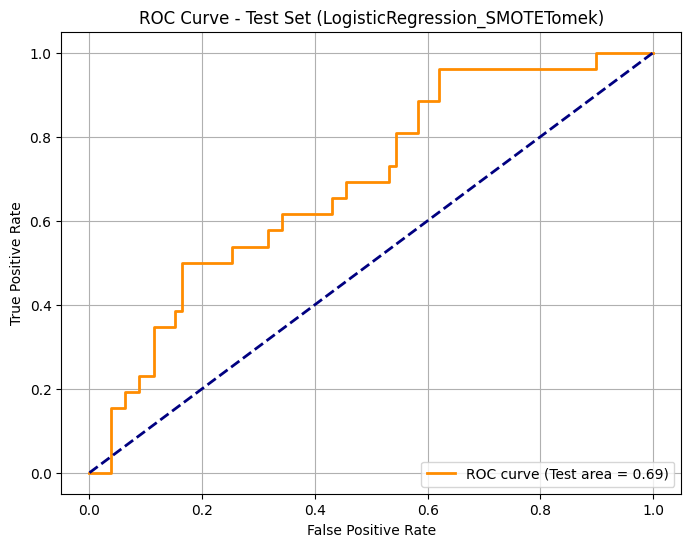

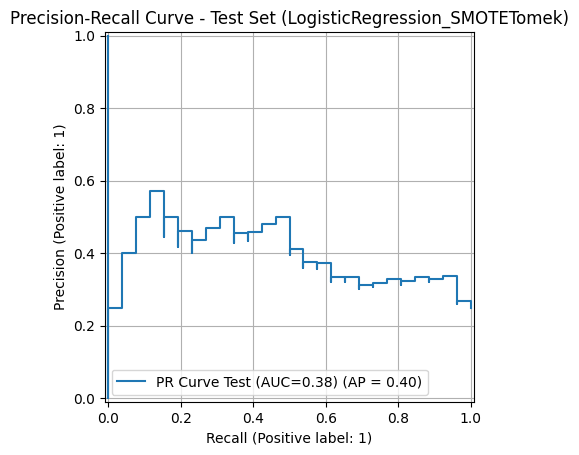

In [ ]:
# Ensure this variable is set from the threshold tuning step in Iteration 4
# For example, if it was determined in the previous cell:
# best_threshold_iter4 = 0.5077 # Make sure this is the actual best threshold found

# Check if best_threshold_iter4 was actually found and set
if 'best_threshold' in locals(): # Assuming 'best_threshold' was the name used in the tuning cell
    best_threshold_iter4_for_test = best_threshold
    print(f"Using tuned threshold for test set evaluation: {best_threshold_iter4_for_test:.4f}")
else:
    # Fallback to default 0.5 if not found, with a warning
    best_threshold_iter4_for_test = 0.5
    print("Warning: 'best_threshold' from tuning not found. Defaulting to 0.5 for test set evaluation.")


# Determine the model to use for final evaluation (should be the one threshold was tuned for)
# Assuming 'best_model_name_iter4' and 'trained_models_iter_4' are available from previous cells
final_chosen_model_iter4 = None
if 'best_model_name_iter4' in locals() and best_model_name_iter4 in trained_models_iter_4:
    final_chosen_model_iter4 = trained_models_iter_4[best_model_name_iter4]
    print(f"Model selected for final test set evaluation: {best_model_name_iter4}")
else:
    print("Error: Could not identify the 'best_model_name_iter4' or it's not in 'trained_models_iter_4'. Cannot proceed with test evaluation.")

# --- Final Evaluation on Test Set using the CHOSEN MODEL and TUNED THRESHOLD ---
if ('X_test_iter_4_iter_final' in locals() and X_test_iter_4_iter_final is not None and not X_test_iter_4_iter_final.empty and
    'y_test_iter_4' in locals() and y_test_iter_4 is not None and
    final_chosen_model_iter4 is not None):

    print(f"\n--- Iteration 4: Final Evaluation on Test Set ---")
    print(f"Using Model: {best_model_name_iter4 if 'best_model_name_iter4' in locals() else type(final_chosen_model_iter4).__name__}")
    print(f"Using Threshold: {best_threshold_iter4_for_test:.4f}")

    try:
        # Get probabilities for the positive class
        if hasattr(final_chosen_model_iter4, "predict_proba"):
            y_proba_test_iter4 = final_chosen_model_iter4.predict_proba(X_test_iter_4_iter_final)[:, 1]

            # Apply the tuned threshold
            y_pred_test_iter4_tuned = (y_proba_test_iter4 >= best_threshold_iter4_for_test).astype(int)

            # Ensure y_test_iter_4 is aligned if X_test_iter_4_iter_final maintained its index
            # (Usually, train_test_split preserves index, and so does DataFrame creation from numpy array if index is passed)
            y_true_test_aligned_iter4 = y_test_iter_4.loc[X_test_iter_4_iter_final.index] if isinstance(X_test_iter_4_iter_final, pd.DataFrame) else y_test_iter_4

            # Calculate metrics
            roc_auc_test_iter4 = roc_auc_score(y_true_test_aligned_iter4, y_proba_test_iter4) # ROC AUC uses probabilities
            precision_pr_test_iter4, recall_pr_test_iter4, _ = precision_recall_curve(y_true_test_aligned_iter4, y_proba_test_iter4)
            pr_auc_test_iter4 = auc(recall_pr_test_iter4, precision_pr_test_iter4) # PR AUC uses probabilities

            print(f"\nROC AUC (Test Set): {roc_auc_test_iter4:.4f}")
            print(f"PR AUC (Test Set): {pr_auc_test_iter4:.4f}")

            print("\nClassification Report (Test Set with Tuned Threshold):")
            # For classification_report, use the thresholded predictions
            print(classification_report(y_true_test_aligned_iter4, y_pred_test_iter4_tuned, target_names=['Short (0)', 'Long (1)'], zero_division=0))

            print("\nConfusion Matrix (Test Set with Tuned Threshold):")
            cm_test_iter4 = confusion_matrix(y_true_test_aligned_iter4, y_pred_test_iter4_tuned)
            print(cm_test_iter4)

            # Plot ROC Curve for Test Set
            fpr_test, tpr_test, _ = roc_curve(y_true_test_aligned_iter4, y_proba_test_iter4)
            plt.figure(figsize=(8,6))
            plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'ROC curve (Test area = {roc_auc_test_iter4:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve - Test Set ({best_model_name_iter4 if "best_model_name_iter4" in locals() else "Best Model"})')
            plt.legend(loc="lower right")
            plt.grid(True)
            plt.show()

            # Plot Precision-Recall Curve for Test Set
            PrecisionRecallDisplay.from_predictions(y_true_test_aligned_iter4, y_proba_test_iter4, name=f"PR Curve Test (AUC={pr_auc_test_iter4:.2f})", ax=plt.gca())
            plt.title(f'Precision-Recall Curve - Test Set ({best_model_name_iter4 if "best_model_name_iter4" in locals() else "Best Model"})')
            plt.grid(True)
            plt.show()

        else:
            print("Selected model does not have 'predict_proba' method. Cannot apply tuned threshold or calculate ROC/PR AUC.")
            # Fallback to just predict if no predict_proba (though Logistic Regression should have it)
            y_pred_test_iter4_default = final_chosen_model_iter4.predict(X_test_iter_4_iter_final)
            y_true_test_aligned_iter4 = y_test_iter_4.loc[X_test_iter_4_iter_final.index] if isinstance(X_test_iter_4_iter_final, pd.DataFrame) else y_test_iter_4
            print("\nClassification Report (Test Set with Default Threshold):")
            print(classification_report(y_true_test_aligned_iter4, y_pred_test_iter4_default, target_names=['Short (0)', 'Long (1)'], zero_division=0))
            print("\nConfusion Matrix (Test Set with Default Threshold):")
            print(confusion_matrix(y_true_test_aligned_iter4, y_pred_test_iter4_default))

    except Exception as e:
        print(f"Error during Iteration 4 test set evaluation: {e}")
else:
    print("Skipping Iteration 4 final test set evaluation: One or more required components are missing.")
    if not ('X_test_iter_4_iter_final' in locals() and X_test_iter_4_iter_final is not None and not X_test_iter_4_iter_final.empty):
        print("- X_test_iter_4_iter_final (final processed test features) not available or empty.")
    if not ('y_test_iter_4' in locals() and y_test_iter_4 is not None):
        print("- y_test_iter_4 (true test labels) not available.")
    if final_chosen_model_iter4 is None:
        print("- final_chosen_model_iter4 (the model to evaluate) is not defined.")

# Iteration 5

## definition of target variable

In [ ]:
import pandas as pd
import numpy as np

# Assuming 'df' is your initial DataFrame loaded from the CSV.
# Create a fresh copy for this new iteration to avoid interference
# if df_original was modified extensively in previous iterations.
df_iteration_p90 = df.copy() # Using a new copy for this iteration

if df_iteration_p90 is not None and 'duration_minutes' in df_iteration_p90.columns:
    # --- 1. Calculate the 90th Percentile Threshold ---
    percentile_90_duration = df_iteration_p90['duration_minutes'].quantile(0.90)
    print(f"Calculated 90th Percentile Duration (threshold): {percentile_90_duration:.2f} minutes")

    # --- 2. Create the Binary Target Variable 'duration_long_accident_p90' ---
    # 1 if duration_minutes > percentile_90_duration, 0 otherwise
    df_iteration_p90['duration_long_accident_p90'] = np.where(
        df_iteration_p90['duration_minutes'] > percentile_90_duration, 1, 0
    )

    print(f"\n--- Target Variable Distribution ('duration_long_accident_p90' based on 90th Percentile) ---")
    print(df_iteration_p90['duration_long_accident_p90'].value_counts(normalize=True))
    print("\nValue Counts:")
    print(df_iteration_p90['duration_long_accident_p90'].value_counts())

    # Display the first few rows with the new column and original duration
    print(f"\n--- DataFrame Head with new 'duration_long_accident_p90' column ---")
    cols_to_show = ['duration_minutes', 'duration_long_accident_p90']
    try:
        # Assuming 'display' is available in your environment (e.g., Jupyter)
        from IPython.display import display
        display(df_iteration_p90[cols_to_show].head())
    except ImportError:
        print(df_iteration_p90[cols_to_show].head())

    # You can also check a few rows where duration_minutes is around the threshold
    print(f"\n--- Sample rows around the P90 threshold ({percentile_90_duration:.2f} min) ---")
    sample_around_threshold = df_iteration_p90[
        (df_iteration_p90['duration_minutes'] >= percentile_90_duration - 5) &
        (df_iteration_p90['duration_minutes'] <= percentile_90_duration + 5)
    ][cols_to_show].sort_values(by='duration_minutes')
    try:
        display(sample_around_threshold.head(10))
    except NameError:
        print(sample_around_threshold.head(10))

else:
    if df_iteration_p90 is None:
        print("DataFrame was not loaded. Cannot create target variable.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame.")
        # print(f"Available columns are: {df_iteration_p90.columns.tolist()}") # Uncomment to see columns

Calculated 90th Percentile Duration (threshold): 98.80 minutes

--- Target Variable Distribution ('duration_long_accident_p90' based on 90th Percentile) ---
duration_long_accident_p90
0    0.898662
1    0.101338
Name: proportion, dtype: float64

Value Counts:
duration_long_accident_p90
0    470
1     53
Name: count, dtype: int64

--- DataFrame Head with new 'duration_long_accident_p90' column ---


,duration_minutes,duration_long_accident_p90
0,43.0,0
1,106.0,1
2,66.0,0
3,20.0,0
4,65.0,0



--- Sample rows around the P90 threshold (98.80 min) ---


,duration_minutes,duration_long_accident_p90
107,94.0,0
200,94.0,0
280,94.0,0
236,94.0,0
283,94.0,0
413,94.0,0
483,94.0,0
369,95.0,0
366,96.0,0
266,96.0,0


## definition of  columns

In [ ]:
if df_iteration_p90 is not None:
    columns_iter5 = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ',
        'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
        'ΚΑΤ._ΟΔ.','ΤΕΧΝ._ΦΩΤ.', #'accident_type', # This is now our target or related to it
        'lat', 'lng', 'num_involved_vehicles', 'has_ΙΧΕ',
        'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ',
        'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'duration_long_accident_p90', # Keep the target variable
        # 'effective_lighting_condition',# replacing ΤΕΧΝ._ΦΩΤ. with effective_lighting_condition
        # 'is_exit_veer_on_highway_A_FP_alert',
        # 'is_exit_veer_on_wet_road_FP_alert',
        # 'low_vehicle_count_and_exit_veer_FP_alert',

        # 0.55 f1


        # 'temperature_2m',
        # 'temperature_category',
        # 'relative_humidity_2m',
        # 'wind_gusts_10m',
        # "precipitation",

        # 0.55 again

        # "day_of_week_sin",
        # "day_of_week_cos",
        # "month_sin",
        # "month_cos",
        # "day_of_month_sin",
        # "day_of_month_cos",
        # "closest_toll_euclidean_km",
        # "closest_intersection_euclidean_km",
        # 0.54

        # "involves_heavy_vehicle",
        # "is_rapid_temp_change",
        # "time_since_previous_accident_hours",
        # 0.5

        # "accidents_past_3h",
        # same

        # "road_lanes",
        # "road_maxspeed",
        # 0.57

        # "road_surface",
        # "road_smoothness",
        # "road_bridge",

        # "road_context",
        # "curve_category",
        # "curve_direction",
        # "direction_name"

    ]
    # Ensure all selected columns exist in df_iteration_p90
    columns_iter5 = [col for col in columns_iter5 if col in df_iteration_p90.columns]
    if 'duration_long_accident_p90' not in columns_iter5 and 'duration_long_accident_p90' in df_iteration_p90.columns:
         columns_iter5.append('duration_long_accident_p90')


    df_iter5 = df_iteration_p90[columns_iter5].copy()
    print(f"\n--- Iteration 5: Working with {len(df_iter5.columns)-1} features ---")
    # display(df_iter1.head())



--- Iteration 5: Working with 19 features ---


## stratified data splitting

In [ ]:
if 'df_iter5' in locals() and df_iter5 is not None:
    X = df_iter5.drop('duration_long_accident_p90', axis=1)
    y = df_iter5['duration_long_accident_p90']

    # Split into Train (60%) and Temp (40% for Val+Test)
    X_train_iter_5, X_temp_iter_5, y_train_iter_5, y_temp_iter_5 = train_test_split(
        X, y, test_size=0.4, random_state=42, stratify=y
    )

    # Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
    X_val_iter_5, X_test_iter_5, y_val_iter_5, y_test_iter_5 = train_test_split(
        X_temp_iter_5, y_temp_iter_5, test_size=0.5, random_state=42, stratify=y_temp_iter_5
    )

    print(f"Training set: {X_train_iter_5.shape}, {y_train_iter_5.shape}, Minority class: {Counter(y_train_iter_5)[1]}")
    print(f"Validation set: {X_val_iter_5.shape}, {y_val_iter_5.shape}, Minority class: {Counter(y_val_iter_5)[1]}")
    print(f"Test set: {X_test_iter_5.shape}, {y_test_iter_5.shape}, Minority class: {Counter(y_test_iter_5)[1]}")


Training set: (313, 19), (313,), Minority class: 32
Validation set: (105, 19), (105,), Minority class: 11
Test set: (105, 19), (105,), Minority class: 10


## spatial feature engineering

In [ ]:
if 'X_train_iter_5' in locals() and 'lat' in X_train_iter_5.columns and 'lng' in X_train_iter_5.columns: # Check if data and columns exist
    N_BINS = 8 # Example number of bins for gridding
    GEOHASH_PRECISION = 7 # Example geohash precision
    KDE_BANDWIDTH = 0.05 # Example KDE bandwidth - VERY SENSITIVE, needs tuning/domain knowledge

    # --- Create Road Segment ID using the adjusted function ---
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train_iter_5.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train_iter_5.columns:
        # Call the adjusted function
        X_train_iter_5 = create_road_segment_feature_adjusted(X_train_iter_5)
        X_val_iter_5 = create_road_segment_feature_adjusted(X_val_iter_5)
        X_test_iter_5 = create_road_segment_feature_adjusted(X_test_iter_5)
        print("Adjusted road segment ID feature created.")
        # You can check the counts of the new categories:
        # print("Value counts for adjusted segment_id in X_train_iter_5:")
        # print(X_train_iter_5['segment_id'].value_counts().head(10))
    else:
        print("Skipping road segment ID creation: Required columns not found.")


    # --- Apply Coordinate Binning ---
    # (No changes needed here, ensure 'lat'/'lng' are present if you run this)
    if 'lat' in X_train_iter_5.columns and 'lng' in X_train_iter_5.columns:
        X_train_iter_5 = create_coordinate_bins(X_train_iter_5, n_bins=N_BINS, fit_df=X_train_iter_5.copy())
        X_val_iter_5 = create_coordinate_bins(X_val_iter_5, n_bins=N_BINS, fit_df=X_train_iter_5.copy())
        X_test_iter_5 = create_coordinate_bins(X_test_iter_5, n_bins=N_BINS, fit_df=X_train_iter_5.copy())
        print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
    else:
        print("Skipping coordinate binning: lat/lng columns not found.")


    # --- Apply Geohashing ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_5.columns and 'lng' in X_train_iter_5.columns:
        X_train_iter_5 = apply_geohash(X_train_iter_5, precision=GEOHASH_PRECISION)
        X_val_iter_5 = apply_geohash(X_val_iter_5, precision=GEOHASH_PRECISION)
        X_test_iter_5 = apply_geohash(X_test_iter_5, precision=GEOHASH_PRECISION)
        print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
    else:
        print("Skipping geohashing: lat/lng columns not found.")


    # --- Apply KDE Score ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_5.columns and 'lng' in X_train_iter_5.columns:
        X_train_iter_5_coords_for_kde = X_train_iter_5[['lat', 'lng']].dropna()
        if not X_train_iter_5_coords_for_kde.empty:
            X_train_iter_5 = apply_kde_score(X_train_iter_5.dropna(subset=['lat', 'lng']), X_train_iter_5_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_val_iter_5 = apply_kde_score(X_val_iter_5.dropna(subset=['lat', 'lng']), X_train_iter_5_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_test_iter_5 = apply_kde_score(X_test_iter_5.dropna(subset=['lat', 'lng']), X_train_iter_5_coords_for_kde, bandwidth=KDE_BANDWIDTH)

            # X_train_iter_5['kde_score'].fillna(0.0, inplace=True)
            X_train_iter_5.fillna({'kde_score':0.0},inplace=True)
            # X_val_iter_5['kde_score'].fillna(0.0, inplace=True)
            X_val_iter_5.fillna({'kde_score':0.0},inplace=True)
            # X_test_iter_5['kde_score'].fillna(0.0, inplace=True)
            X_test_iter_5.fillna({'kde_score':0.0},inplace=True)

            print("KDE scores created.")
        else:
            print("Skipping KDE: No valid coordinates in X_train_iter_5 to fit KDE.")
            X_train_iter_5['kde_score'] = 0.0
            X_val_iter_5['kde_score'] = 0.0
            X_test_iter_5['kde_score'] = 0.0
    else:
        print("Skipping KDE score: lat/lng columns not found.")


    # Display some of the new features
    # (Ensure the column name for segment_id matches what's created, e.g. 'segment_id')
    new_spatial_cols = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_5.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_5.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'kde_score' in X_train_iter_5.columns: new_spatial_cols.append('kde_score')
    # Check for the actual segment_id column name, assuming it's 'segment_id' from prefix='segment'
    if 'segment_id' in X_train_iter_5.columns: new_spatial_cols.append('segment_id')

    new_spatial_cols = [col for col in new_spatial_cols if col in X_train_iter_5.columns]
    if new_spatial_cols:
        print("\nSample of new spatial features in X_train_iter_5:")
        # In Colab, display() is better for DataFrames
        try:
            display(X_train_iter_5[new_spatial_cols].head())
        except NameError: # If display() is not available (e.g. standard Python script)
            print(X_train_iter_5[new_spatial_cols].head())

    else:
        print("\nNo new spatial features were added or found to display.")

else:
    print("Skipping spatial feature engineering: X_train_iter_5 or key columns not available.")

Adjusted road segment ID feature created.
Coordinate bins (8x8) created.
Geohash (precision 7) features created.
KDE scores created.

Sample of new spatial features in X_train_iter_5:


,grid_cell_8x8,geohash_p7,kde_score,segment_id
285,7_1,swbb8yf,5.312389,A_8.6
375,6_5,swbbsbn,23.490453,E_25.2
381,4_6,swbbnrr,26.434559,Y_5.8
160,7_2,swbb9w0,5.035669,A_11.3
4,6_4,swbbs35,19.180723,A_22.8


In [ ]:
# X_train_iter_5, X_val_iter_5, X_test_iter_5 are your dataframes after spatial features are engineered
columns_to_drop_after_spatial_eng = ['lat', 'lng'] # Add any other raw source columns if needed

X_train_iter_5 = X_train_iter_5.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_val_iter_5 = X_val_iter_5.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_test_iter_5 = X_test_iter_5.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')

print(f"Dropped raw spatial columns: {columns_to_drop_after_spatial_eng}")

Dropped raw spatial columns: ['lat', 'lng']


## preprocessing

In [ ]:
if 'X_train_iter_5' in locals():
    # Identify feature types AFTER new spatial features are created
    # New categorical features from spatial engineering:
    new_cat_spatial_features = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_5.columns: new_cat_spatial_features.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_5.columns: new_cat_spatial_features.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'segment_id' in X_train_iter_5.columns: new_cat_spatial_features.append('segment_id')
    # Add more if you create other categorical spatial features e.g. lat_bin_N, lng_bin_N as separate features

    # New numerical features from spatial engineering:
    new_num_spatial_features = []
    if 'kde_score' in X_train_iter_5.columns: new_num_spatial_features.append('kde_score')


    all_categorical_features = X_train_iter_5.select_dtypes(include=['object', 'category']).columns.tolist()
    # Ensure our new spatial categoricals are included if not automatically detected as object/category
    for f in new_cat_spatial_features:
        if f not in all_categorical_features and f in X_train_iter_5.columns:
            all_categorical_features.append(f)
            X_train_iter_5[f] = X_train_iter_5[f].astype('category') # Ensure correct dtype
            X_val_iter_5[f] = X_val_iter_5[f].astype('category')
            X_test_iter_5[f] = X_test_iter_5[f].astype('category')


    # Features for 'unknown' imputation (original list)
    categorical_features_unknown_impute = [
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', "weather_description", 'effective_lighting_condition'
    ]
    categorical_features_unknown_impute = [col for col in categorical_features_unknown_impute if col in X_train_iter_5.columns and col in all_categorical_features]


    # Other categorical features (if any) for 'most_frequent' imputation
    # This will now include new_cat_spatial_features if they are not in the unknown_impute list
    categorical_features_mode_impute = [
        col for col in all_categorical_features if col not in categorical_features_unknown_impute
    ]

    boolean_features = X_train_iter_5.select_dtypes(include=['bool']).columns.tolist()
    for bf in boolean_features:
        X_train_iter_5[bf] = X_train_iter_5[bf].astype(int)
        X_val_iter_5[bf] = X_val_iter_5[bf].astype(int)
        X_test_iter_5[bf] = X_test_iter_5[bf].astype(int)

    numerical_features = X_train_iter_5.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    # Ensure our new numerical spatial features are included
    for f in new_num_spatial_features:
        if f not in numerical_features and f in X_train_iter_5.columns:
            numerical_features.append(f)


    print(f"Final Numerical features for preprocessor: {numerical_features}")
    print(f"Final Categorical features for 'unknown' imputation: {categorical_features_unknown_impute}")
    print(f"Final Categorical features for 'most_frequent' imputation: {categorical_features_mode_impute}")


    # --- The rest of your ColumnTransformer and preprocessing code follows ---
    # Create preprocessing pipelines (as you had before)
    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    categorical_pipeline_unknown = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    categorical_pipeline_mode = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')), # New spatial categoricals (grid_cell, geohash) usually don't have NaNs if created properly
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    transformers_list = []
    if numerical_features: # Add only if list is not empty
         transformers_list.append(('num', numerical_pipeline, numerical_features))
    if categorical_features_unknown_impute:
        transformers_list.append(('cat_unknown', categorical_pipeline_unknown, categorical_features_unknown_impute))
    if categorical_features_mode_impute:
        transformers_list.append(('cat_mode', categorical_pipeline_mode, categorical_features_mode_impute))

    preprocessor = ColumnTransformer(
        transformers=transformers_list,
        remainder='passthrough'
    )

    # Fit and transform (as you had before)
    # ... your existing code for fitting preprocessor and creating X_train_iter_5_processed_df ...
    # (No changes needed to that part if the feature lists fed into ColumnTransformer are correct)
    # Fit preprocessor on X_train_iter_5 and transform all sets
    X_train_iter_5_processed = preprocessor.fit_transform(X_train_iter_5)
    X_val_iter_5_processed = preprocessor.transform(X_val_iter_5)
    X_test_iter_5_processed = preprocessor.transform(X_test_iter_5)

    # Get feature names after one-hot encoding for RFE and interpretation
    try:
        feature_names_out = preprocessor.get_feature_names_out()
        X_train_iter_5_processed_df = pd.DataFrame(X_train_iter_5_processed, columns=feature_names_out, index=X_train_iter_5.index)
        X_val_iter_5_processed_df = pd.DataFrame(X_val_iter_5_processed, columns=feature_names_out, index=X_val_iter_5.index)
        X_test_iter_5_processed_df = pd.DataFrame(X_test_iter_5_processed, columns=feature_names_out, index=X_test_iter_5.index)
        print(f"Processed training data shape: {X_train_iter_5_processed_df.shape}")
    except Exception as e:
        print(f"Could not get feature names from preprocessor automatically: {e}")
        X_train_iter_5_processed_df = pd.DataFrame(X_train_iter_5_processed, index=X_train_iter_5.index)
        X_val_iter_5_processed_df = pd.DataFrame(X_val_iter_5_processed, index=X_val_iter_5.index)
        X_test_iter_5_processed_df = pd.DataFrame(X_test_iter_5_processed, index=X_test_iter_5.index)
        feature_names_out = X_train_iter_5_processed_df.columns.astype(str)
        print(f"Processed training data shape (generic column names): {X_train_iter_5_processed_df.shape}")

Final Numerical features for preprocessor: ['num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.', 'lat_bin_8', 'lng_bin_8', 'kde_score']
Final Categorical features for 'unknown' imputation: ['ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.']
Final Categorical features for 'most_frequent' imputation: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'segment_id', 'grid_cell_8x8', 'geohash_p7']
Processed training data shape: (313, 667)


## recursive feature elimination with cross validation


--- Iteration 5: Recursive Feature Elimination with Cross-Validation (RFECV) ---
RFECV will use the estimator: LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42,
                   solver='liblinear')
Cross-validation strategy: StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
Scoring metric for feature selection: 'roc_auc'
Fitting RFECV... (This might take some time)
Optimal number of features found by RFECV: 227

Selected features from RFECV (227):
Shape of X_train after RFECV: (313, 227)


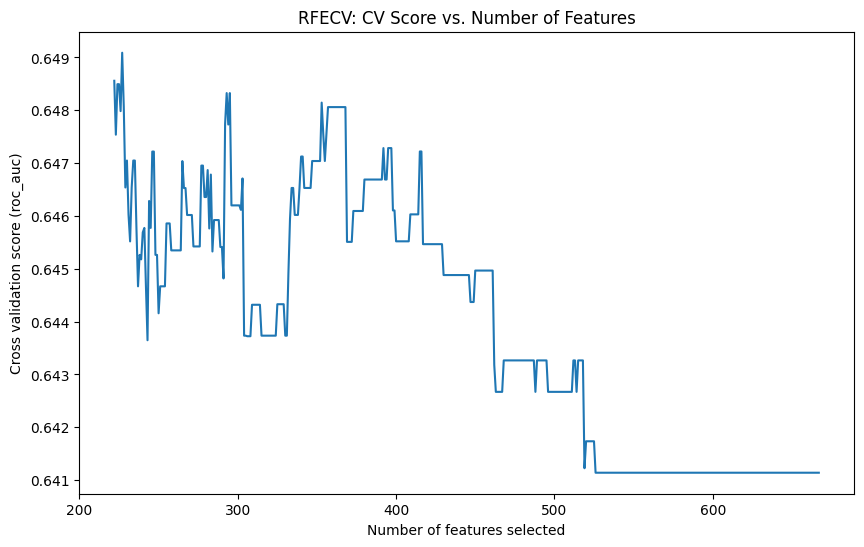

In [ ]:
# Ensure necessary imports
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression # Your chosen estimator
from sklearn.metrics import make_scorer, f1_score # For scoring if needed


if 'X_train_iter_5_processed_df' in locals() and X_train_iter_5_processed_df is not None and \
   'y_train_iter_5' in locals() and y_train_iter_5 is not None:

    print("\n--- Iteration 5: Recursive Feature Elimination with Cross-Validation (RFECV) ---")

    estimator_rfecv = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)

    # Define the cross-validation strategy
    # StratifiedKFold is good for classification, especially with imbalanced classes
    cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) # Using 5 splits as an example

    # Define the scoring metric for RFECV to optimize
    # For imbalanced classes, 'f1', 'roc_auc', or 'average_precision' (PR AUC) are often better than 'accuracy'.
    # Let's use 'f1' for the positive class (assuming positive_label=1)
    # If your positive class is not 1, adjust pos_label
    # You can also use 'roc_auc', 'average_precision', etc.
    scorer_for_rfecv = make_scorer(f1_score, pos_label=1, average='binary', zero_division=0)
    # Alternatively, just use a string like 'f1_macro', 'roc_auc'.
    # For binary classification and focusing on the positive class, 'f1' (which defaults to f1 of positive class if pos_label=1) or 'roc_auc' are good.
    # Let's use 'roc_auc' as it's a common general-purpose metric for RFECV selection
    # and less prone to issues if a fold has no positive predictions for some feature subsets.

    print(f"RFECV will use the estimator: {estimator_rfecv}")
    print(f"Cross-validation strategy: {cv_strategy}")
    print(f"Scoring metric for feature selection: 'roc_auc'") # Or your chosen scorer

    rfecv = RFECV(
        estimator=estimator_rfecv,
        step=1,  # Remove 1 feature at each step
        cv=cv_strategy,
        scoring='roc_auc',  # Metric to optimize for feature selection
        min_features_to_select=max(5, X_train_iter_5_processed_df.shape[1] // 3), # Example: select at least 5 features, or 10%
        n_jobs=-1 # Use all available cores
    )

    print("Fitting RFECV... (This might take some time)")
    try:
        rfecv.fit(X_train_iter_5_processed_df, y_train_iter_5)

        print(f"Optimal number of features found by RFECV: {rfecv.n_features_}")

        # Get the mask of selected features
        selected_features_rfecv_mask = rfecv.support_

        # Get the names of the selected features
        # Ensure that X_train_iter_5_processed_df has columns attribute (it should if it's a DataFrame)
        selected_features_rfecv = X_train_iter_5_processed_df.columns[selected_features_rfecv_mask]

        print(f"\nSelected features from RFECV ({len(selected_features_rfecv)}):")
        # Printing all feature names can be very long, consider printing only a few or just the count
        # print(selected_features_rfecv.tolist())

        # Update DataFrames to keep only RFECV selected features
        X_train_iter_5_iter_final = X_train_iter_5_processed_df[selected_features_rfecv]
        X_val_iter_5_iter_final = X_val_iter_5_processed_df[selected_features_rfecv]
        X_test_iter_5_iter_final = X_test_iter_5_processed_df[selected_features_rfecv]

        print(f"Shape of X_train after RFECV: {X_train_iter_5_iter_final.shape}")

        # You can also plot the number of features vs. cross-validation scores
        if hasattr(rfecv, "cv_results_"):
            try:
                import matplotlib.pyplot as plt
                n_scores = len(rfecv.cv_results_["mean_test_score"]) # Number of features evaluated
                plt.figure(figsize=(10,6))
                plt.xlabel("Number of features selected")
                plt.ylabel(f"Cross validation score ({rfecv.scoring})")
                plt.plot(
                    range(rfecv.min_features_to_select, n_scores + rfecv.min_features_to_select), # X-axis: number of features
                    rfecv.cv_results_["mean_test_score"],
                )
                plt.title("RFECV: CV Score vs. Number of Features")
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot RFECV scores: {plot_e}")

    except ValueError as ve:
        print(f"ValueError during RFECV fitting: {ve}")
        print("This might occur if input data is problematic or no features could be selected.")
        # Fallback: use all features from preprocessing if RFECV fails
        X_train_iter_5_iter_final = X_train_iter_5_processed_df.copy()
        X_val_iter_5_iter_final = X_val_iter_5_processed_df.copy()
        X_test_iter_5_iter_final = X_test_iter_5_processed_df.copy()
        print("Using all preprocessed features as RFECV failed.")
    except Exception as e:
        print(f"An unexpected error occurred during RFECV: {e}")
        X_train_iter_5_iter_final = X_train_iter_5_processed_df.copy() # Fallback
        X_val_iter_5_iter_final = X_val_iter_5_processed_df.copy()
        X_test_iter_5_iter_final = X_test_iter_5_processed_df.copy()
        print("Using all preprocessed features as RFECV encountered an error.")


else:
    print("Skipping RFECV as processed data (X_train_iter_5_processed_df or y_train_iter_5) is not available.")
    # Define fallback if previous steps failed
    if 'X_train_iter_5_processed_df' in locals() and X_train_iter_5_processed_df is not None:
        X_train_iter_5_iter_final = X_train_iter_5_processed_df.copy()
        X_val_iter_5_iter_final = X_val_iter_5_processed_df.copy() if 'X_val_iter_5_processed_df' in locals() and X_val_iter_5_processed_df is not None else None
        X_test_iter_5_iter_final = X_test_iter_5_processed_df.copy() if 'X_test_iter_5_processed_df' in locals() and X_test_iter_5_processed_df is not None else None
    else:
        X_train_iter_5_iter_final, X_val_iter_5_iter_final, X_test_iter_5_iter_final = None, None, None

## balancing techniques

In [ ]:
# Previous code: X_train_iter_5_iter_final, y_train_iter_5, X_val_iter_final, y_val are defined

resampled_datasets_iter_5 = {} # To store (X_resampled, y_resampled) for each technique

if 'X_train_iter_5_iter_final' in locals() and X_train_iter_5_iter_final is not None and y_train_iter_5 is not None:
    print(f"\nOriginal training set shape: {X_train_iter_5_iter_final.shape}, Original class distribution: {Counter(y_train_iter_5)}")
    minority_class_count = Counter(y_train_iter_5).get(1, 0) # Assuming 1 is the minority class

    # Store the original (non-resampled) training data as a baseline
    resampled_datasets_iter_5['Original'] = (X_train_iter_5_iter_final.copy(), y_train_iter_5.copy())

    # Define samplers
    samplers = {
        "RandomOverSampler": RandomOverSampler(random_state=42),
        "SMOTE": None, # Will initialize carefully due to k_neighbors
        "ADASYN": None, # Will initialize carefully due to n_neighbors
        "TomekLinks": TomekLinks(sampling_strategy='auto', n_jobs=-1), # Undersampling, removes Tomek links
        "SMOTETomek": None, # Will initialize carefully
        "SMOTEENN": None # Will initialize carefully
    }

    # SMOTE and ADASYN require k_neighbors (or n_neighbors for ADASYN) < minority_class_count
    if minority_class_count > 1:
        k_val = min(4, minority_class_count - 1) # A common heuristic for k, ensuring it's less than minority samples

        if k_val > 0 : # Ensure k_val is positive
            samplers["SMOTE"] = SMOTE(random_state=42, k_neighbors=k_val)
            samplers["ADASYN"] = ADASYN(random_state=42, n_neighbors=k_val) # ADASYN uses n_neighbors
            samplers["SMOTETomek"] = SMOTETomek(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), tomek=TomekLinks(sampling_strategy='auto'), n_jobs=-1)
            samplers["SMOTEENN"] = SMOTEENN(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), enn=None, n_jobs=-1) # enn default is good
        else:
            print(f"Skipping SMOTE-based samplers as k_val ({k_val}) would be too small or zero based on minority count ({minority_class_count}).")
            # Remove them if they can't be initialized
            for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
                if key in samplers: samplers.pop(key)

    else:
        print(f"Skipping SMOTE-based samplers as minority count ({minority_class_count}) is <= 1.")
        for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
            if key in samplers: samplers.pop(key)


    # Apply each sampler
    for name, sampler in samplers.items():
        if sampler is None: # Sampler was not initialized
            continue
        print(f"\nApplying {name}...")
        try:
            X_res, y_res = sampler.fit_resample(X_train_iter_5_iter_final, y_train_iter_5)
            resampled_datasets_iter_5[name] = (X_res, y_res)
            print(f"Resampled with {name}: X_shape={X_res.shape}, y_dist={Counter(y_res)}")
        except Exception as e:
            print(f"Could not apply {name}. Error: {e}")
            # Optionally store original if sampler fails, or skip
            # resampled_datasets_iter_5[name] = (X_train_iter_5_iter_final.copy(), y_train_iter_5.copy())


    if not resampled_datasets_iter_5: # If all samplers failed or were skipped
        print("No resampling techniques were successfully applied or initialized. Using original data only.")
        if 'Original' not in resampled_datasets_iter_5: # Should already be there
             resampled_datasets_iter_5['Original'] = (X_train_iter_5_iter_final.copy(), y_train_iter_5.copy())


else:
    print("Skipping balancing as X_train_iter_5_iter_final or y_train_iter_5 is not available.")
    # Ensure there's at least 'Original' if X_train_iter_5_iter_final was available
    if 'X_train_iter_5_iter_final' in locals() and X_train_iter_5_iter_final is not None and y_train_iter_5 is not None:
        resampled_datasets_iter_5['Original'] = (X_train_iter_5_iter_final.copy(), y_train_iter_5.copy())


Original training set shape: (313, 227), Original class distribution: Counter({0: 281, 1: 32})

Applying RandomOverSampler...
Resampled with RandomOverSampler: X_shape=(562, 227), y_dist=Counter({0: 281, 1: 281})

Applying SMOTE...
Resampled with SMOTE: X_shape=(562, 227), y_dist=Counter({0: 281, 1: 281})

Applying ADASYN...
Resampled with ADASYN: X_shape=(568, 227), y_dist=Counter({1: 287, 0: 281})

Applying TomekLinks...
Resampled with TomekLinks: X_shape=(304, 227), y_dist=Counter({0: 272, 1: 32})

Applying SMOTETomek...
Resampled with SMOTETomek: X_shape=(562, 227), y_dist=Counter({0: 281, 1: 281})

Applying SMOTEENN...
Resampled with SMOTEENN: X_shape=(487, 227), y_dist=Counter({1: 273, 0: 214})


## model training

In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier # Ensure this import is present


trained_models_iter_5 = {} # To store trained models: key will be "ModelName_SamplerName"

if 'resampled_datasets_iter_5' in locals() and resampled_datasets_iter_5:
    minority_class_label = 1 # Assuming 'death' is 1
    f1_minority_scorer = make_scorer(f1_score, pos_label=minority_class_label, average='binary') # For CV if you add it later

    for sampler_name, (X_train_curr_resampled, y_train_curr_resampled) in resampled_datasets_iter_5.items():
        print(f"\n--- Training models on data from: {sampler_name} ---")
        print(f"Training data shape: {X_train_curr_resampled.shape}, Distribution: {Counter(y_train_curr_resampled)}")

        # Define your models here or ensure they are defined from a previous cell
        # Re-initialize models for each dataset to ensure they are fresh

        # Calculate scale_pos_weight for XGBoost based on the current resampled data
        counts_curr = Counter(y_train_curr_resampled)
        scale_pos_weight_curr = counts_curr[0] / counts_curr[1] if counts_curr[1] > 0 else 1

        # calculate the ratio of the target variable in the training set in order to
        # get the weights for the custom ratio logistic regression
        counts_curr = Counter(y_train_curr_resampled)
        n_majority = counts_curr.get(0, 0) # Count of class 0 (assuming majority)
        n_minority = counts_curr.get(1, 0) # Count of class 1 (assuming minority)

        if n_minority > 0 and n_majority > 0:

          weight_minority = n_majority / n_minority
          custom_class_weights = {0: 1.0, 1: weight_minority}


        current_models_definitions = {
            'LogisticRegression': LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_custom_ratio':LogisticRegression(solver='liblinear',random_state=42,class_weight=custom_class_weights,max_iter=1000),
            'LogisticRegression_L1': LogisticRegression(solver='liblinear', penalty='l1', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_L2':LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000, penalty='l2'),
            'RandomForest': RandomForestClassifier(random_state=42, class_weight='balanced_subsample', n_estimators=100),
            'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='logloss',
                             scale_pos_weight=scale_pos_weight_curr),
            'BalancedRandomForest': BalancedRandomForestClassifier(random_state=42, n_estimators=100, sampling_strategy='auto', replacement=True, n_jobs=-1),
            'RUSBoost': RUSBoostClassifier(random_state=42, n_estimators=50, sampling_strategy='auto') # n_estimators often lower for boosting
        }
        # Note on class_weight='balanced':
        # For 'Original' data (imbalanced), it's useful.
        # For data resampled to be perfectly balanced (e.g., SMOTE to 50/50), class_weight='balanced' might have less effect
        # or could be omitted, but it generally doesn't hurt and can help if balance isn't perfect.

        for model_name, model_instance in current_models_definitions.items():
            full_model_name = f"{model_name}_{sampler_name}"
            print(f"Training {full_model_name}...")
            try:
                model_instance.fit(X_train_curr_resampled, y_train_curr_resampled)
                trained_models_iter_5[full_model_name] = model_instance
                print(f"{full_model_name} trained.")
            except Exception as e:
                print(f"Could not train {full_model_name}. Error: {e}")
                trained_models_iter_5[full_model_name] = None # Store None if training failed

else:
    print("Skipping model training as no resampled datasets are available.")


--- Training models on data from: Original ---
Training data shape: (313, 227), Distribution: Counter({0: 281, 1: 32})
Training LogisticRegression_Original...
LogisticRegression_Original trained.
Training LogisticRegression_custom_ratio_Original...
LogisticRegression_custom_ratio_Original trained.
Training LogisticRegression_L1_Original...
LogisticRegression_L1_Original trained.
Training LogisticRegression_L2_Original...
LogisticRegression_L2_Original trained.
Training RandomForest_Original...
RandomForest_Original trained.
Training XGBoost_Original...
XGBoost_Original trained.
Training BalancedRandomForest_Original...
BalancedRandomForest_Original trained.
Training RUSBoost_Original...
RUSBoost_Original trained.

--- Training models on data from: RandomOverSampler ---
Training data shape: (562, 227), Distribution: Counter({0: 281, 1: 281})
Training LogisticRegression_RandomOverSampler...
LogisticRegression_RandomOverSampler trained.
Training LogisticRegression_custom_ratio_RandomOver

## model evaluation

In [ ]:
if 'trained_models_iter_5' in locals() and trained_models_iter_5 and \
   'X_val_iter_5_iter_final' in locals() and X_val_iter_5_iter_final is not None and y_val_iter_5 is not None:

    print("\n--- Model Assessment on Validation Set ---")

    # Store results for later comparison if needed
    validation_results_iter_5 = {}

    for full_model_name, model in trained_models_iter_5.items():
        if model is not None: # Check if model was trained
            print(f"\n--- Assessing: {full_model_name} ---")
            try:
                y_pred_val_iter_5 = model.predict(X_val_iter_5_iter_final)
                y_proba_val_iter_5 = model.predict_proba(X_val_iter_5_iter_final)[:, 1] # Probability of positive class

                report = classification_report(y_val_iter_5, y_pred_val_iter_5, target_names=['Short (0)', 'Long (1)'], output_dict=True)
                roc_auc = roc_auc_score(y_val_iter_5, y_proba_val_iter_5)
                precision_pr, recall_pr, _ = precision_recall_curve(y_val_iter_5, y_proba_val_iter_5)
                pr_auc = auc(recall_pr, precision_pr)
                conf_matrix = confusion_matrix(y_val_iter_5, y_pred_val_iter_5)

                print(classification_report(y_val_iter_5, y_pred_val_iter_5, target_names=['Short (0)', 'Long (1)']))
                print(f"Confusion Matrix:\n{conf_matrix}")
                print(f"ROC AUC: {roc_auc:.4f}")
                print(f"PR AUC: {pr_auc:.4f}")

                # Store results
                validation_results_iter_5[full_model_name] = {
                    'classification_report': report,
                    'confusion_matrix': conf_matrix.tolist(), # convert numpy array to list for easier storage/JSON
                    'roc_auc': roc_auc,
                    'pr_auc': pr_auc,
                    'f1_long': report.get('Long (1)', {}).get('f1-score', 0), # F1 for minority class
                    'recall_long': report.get('Long (1)', {}).get('recall', 0) # Recall for minority class
                }
            except Exception as e:
                print(f"Could not assess {full_model_name}. Error: {e}")
                validation_results_iter_5[full_model_name] = {'error': str(e)}
        else:
            print(f"Model {full_model_name} was not trained, skipping assessment.")
            validation_results_iter_5[full_model_name] = {'error': 'Model not trained'}

    # Optional: Print a summary table of key metrics from validation_results_iter_5
    if validation_results_iter_5:
        print("\n--- Validation Results Summary (F1 and Recall for Long class, PR AUC) ---")
        summary_df = pd.DataFrame([
            {'Model_Sampler': name,
             'F1_long': data.get('f1_long', 'N/A'),
             'Recall_long': data.get('recall_long', 'N/A'),
             'PR_AUC': data.get('pr_auc', 'N/A'),
             'ROC_AUC': data.get('roc_auc', 'N/A')}
            for name, data in validation_results_iter_5.items() if 'error' not in data
        ])
        if not summary_df.empty:
            summary_df = summary_df.sort_values(by='F1_long', ascending=False) # Sort by F1 for Long class
            try:
                display(summary_df) # Works well in Colab
            except NameError:
                print(summary_df)
        else:
            print("No valid results to summarize.")


else:
    print("Skipping model assessment: Trained models or validation data are not available.")


--- Model Assessment on Validation Set ---

--- Assessing: LogisticRegression_Original ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.88      0.89        94
    Long (1)       0.15      0.18      0.17        11

    accuracy                           0.81       105
   macro avg       0.53      0.53      0.53       105
weighted avg       0.82      0.81      0.82       105

Confusion Matrix:
[[83 11]
 [ 9  2]]
ROC AUC: 0.5213
PR AUC: 0.1205

--- Assessing: LogisticRegression_custom_ratio_Original ---
              precision    recall  f1-score   support

   Short (0)       0.89      0.89      0.89        94
    Long (1)       0.09      0.09      0.09        11

    accuracy                           0.81       105
   macro avg       0.49      0.49      0.49       105
weighted avg       0.81      0.81      0.81       105

Confusion Matrix:
[[84 10]
 [10  1]]
ROC AUC: 0.4942
PR AUC: 0.1079

--- Assessing: LogisticRegression_L1_Original ---
      

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      0.73      0.81        94
    Long (1)       0.11      0.27      0.15        11

    accuracy                           0.69       105
   macro avg       0.50      0.50      0.48       105
weighted avg       0.81      0.69      0.74       105

Confusion Matrix:
[[69 25]
 [ 8  3]]
ROC AUC: 0.5919
PR AUC: 0.1196

--- Assessing: RUSBoost_Original ---
              precision    recall  f1-score   support

   Short (0)       0.92      0.52      0.67        94
    Long (1)       0.13      0.64      0.22        11

    accuracy                           0.53       105
   macro avg       0.53      0.58      0.44       105
weighted avg       0.84      0.53      0.62       105

Confusion Matrix:
[[49 45]
 [ 4  7]]
ROC AUC: 0.5788
PR AUC: 0.4045

--- Assessing: LogisticRegression_RandomOverSampler ---
              precision    recall  f1-score   support

   Short (0)       0.89      0.88      0.89        94
    Lo

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      0.94      0.92        94
    Long (1)       0.14      0.09      0.11        11

    accuracy                           0.85       105
   macro avg       0.52      0.51      0.51       105
weighted avg       0.82      0.85      0.83       105

Confusion Matrix:
[[88  6]
 [10  1]]
ROC AUC: 0.5745
PR AUC: 0.1365

--- Assessing: LogisticRegression_L2_SMOTE ---
              precision    recall  f1-score   support

   Short (0)       0.89      0.89      0.89        94
    Long (1)       0.09      0.09      0.09        11

    accuracy                           0.81       105
   macro avg       0.49      0.49      0.49       105
weighted avg       0.81      0.81      0.81       105

Confusion Matrix:
[[84 10]
 [10  1]]
ROC AUC: 0.5203
PR AUC: 0.1145

--- Assessing: RandomForest_SMOTE ---
              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.6291
PR AUC: 0.1454

--- Assessing: RUSBoost_SMOTE ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.87      0.89        94
    Long (1)       0.14      0.18      0.16        11

    accuracy                           0.80       105
   macro avg       0.52      0.53      0.52       105
weighted avg       0.82      0.80      0.81       105

Confusion Matrix:
[[82 12]
 [ 9  2]]
ROC AUC: 0.5048
PR AUC: 0.1049

--- Assessing: LogisticRegression_ADASYN ---
              precision    recall  f1-score   support

   Short (0)       0.89      0.90      0.90        94
    Long (1)       0

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      0.89      0.90        94
    Long (1)       0.17      0.18      0.17        11

    accuracy                           0.82       105
   macro avg       0.53      0.54      0.54       105
weighted avg       0.83      0.82      0.82       105

Confusion Matrix:
[[84 10]
 [ 9  2]]
ROC AUC: 0.5010
PR AUC: 0.1103

--- Assessing: LogisticRegression_L1_TomekLinks ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.80      0.85        94
    Long (1)       0.17      0.36      0.24        11

    accuracy                           0.75       105
   macro avg       0.54      0.58      0.54       105
weighted avg       0.84      0.75      0.79       105

Confusion Matrix:
[[75 19]
 [ 7  4]]
ROC AUC: 0.6093
PR AUC: 0.2197

--- Assessing: LogisticRegression_L2_TomekLinks ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.86      0.88      

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Short (0)       0.90      0.93      0.91        94
    Long (1)       0.12      0.09      0.11        11

    accuracy                           0.84       105
   macro avg       0.51      0.51      0.51       105
weighted avg       0.82      0.84      0.83       105

Confusion Matrix:
[[87  7]
 [10  1]]
ROC AUC: 0.6896
PR AUC: 0.1631

--- Assessing: BalancedRandomForest_TomekLinks ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.73      0.81        94
    Long (1)       0.14      0.36      0.20        11

    accuracy                           0.70       105
   macro avg       0.52      0.55      0.51       105
weighted avg       0.83      0.70      0.75       105

Confusion Matrix:
[[69 25]
 [ 7  4]]
ROC AUC: 0.6180
PR AUC: 0.1458

--- Assessing: RUSBoost_TomekLinks ---
              precision    recall  f1-score   support

   Short (0)       0.92      0.52      0.67        94
    Long 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.6291
PR AUC: 0.1454

--- Assessing: RUSBoost_SMOTETomek ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.87      0.89        94
    Long (1)       0.14      0.18      0.16        11

    accuracy                           0.80       105
   macro avg       0.52      0.53      0.52       105
weighted avg       0.82      0.80      0.81       105

Confusion Matrix:
[[82 12]
 [ 9  2]]
ROC AUC: 0.5048
PR AUC: 0.1049

--- Assessing: LogisticRegression_SMOTEENN ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.81      0.85        94
    Long (1) 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

   Short (0)       0.92      0.73      0.82        94
    Long (1)       0.17      0.45      0.24        11

    accuracy                           0.70       105
   macro avg       0.54      0.59      0.53       105
weighted avg       0.84      0.70      0.76       105

Confusion Matrix:
[[69 25]
 [ 6  5]]
ROC AUC: 0.5919
PR AUC: 0.1365

--- Assessing: LogisticRegression_L2_SMOTEENN ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.81      0.85        94
    Long (1)       0.14      0.27      0.19        11

    accuracy                           0.75       105
   macro avg       0.52      0.54      0.52       105
weighted avg       0.82      0.75      0.78       105

Confusion Matrix:
[[76 18]
 [ 8  3]]
ROC AUC: 0.5648
PR AUC: 0.1274

--- Assessing: RandomForest_SMOTEENN ---
              precision    recall  f1-score   support

   Short (0)       0.89      0.99      0.94        94
    Long

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

,Model_Sampler,F1_long,Recall_long,PR_AUC,ROC_AUC
50,LogisticRegression_L1_SMOTEENN,0.243902,0.454545,0.136521,0.591876
2,LogisticRegression_L1_Original,0.242424,0.363636,0.218271,0.604449
34,LogisticRegression_L1_TomekLinks,0.235294,0.363636,0.219748,0.609284
7,RUSBoost_Original,0.222222,0.636364,0.404537,0.578820
39,RUSBoost_TomekLinks,0.222222,0.636364,0.404537,0.578820
26,LogisticRegression_L1_ADASYN,0.200000,0.181818,0.128458,0.558994
38,BalancedRandomForest_TomekLinks,0.200000,0.363636,0.145767,0.617988
49,LogisticRegression_custom_ratio_SMOTEENN,0.187500,0.272727,0.127577,0.565764
48,LogisticRegression_SMOTEENN,0.187500,0.272727,0.127388,0.564797
51,LogisticRegression_L2_SMOTEENN,0.187500,0.272727,0.127388,0.564797


## error analysis

In [ ]:
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt # Ensure these are imported if you want plots
import seaborn as sns           # Ensure these are imported if you want plots

def perform_detailed_error_analysis(
    model_name, model,
    X_val_processed_features, y_true_labels,
    X_val_original_features, # DataFrame with original, interpretable features (MUST BE ALIGNED WITH y_true_labels)
    key_categorical_features, # List of key categorical feature names
    key_numerical_features,   # List of key numerical feature names
    target_class_name='Long', positive_label=1, negative_label=0
):
    print(f"\n--- Detailed Error Analysis for: {model_name} ---")

    if model is None:
        print(f"Model '{model_name}' is None, skipping analysis.")
        return None

    # CRITICAL PRE-CONDITION CHECK:
    if not X_val_original_features.index.equals(y_true_labels.index):
        print("CRITICAL ERROR in perform_detailed_error_analysis: ")
        print("Indices of X_val_original_features and y_true_labels DO NOT MATCH upon entry.")
        print("Ensure X_val_original_features is correctly prepared with an index matching y_true_labels before calling this function.")
        print(f"X_val_original_features index head: {X_val_original_features.index[:3]}")
        print(f"y_true_labels index head: {y_true_labels.index[:3]}")
        return None

    if not X_val_processed_features.index.equals(y_true_labels.index):
        print("CRITICAL WARNING in perform_detailed_error_analysis: ")
        print("Indices of X_val_processed_features and y_true_labels DO NOT MATCH upon entry.")
        print("This can lead to misaligned predictions if not handled carefully in model.predict stage.")
        # Depending on model behavior, predictions might still align if X_val_processed_features was used to generate y_pred in order.


    # Make predictions
    y_pred = model.predict(X_val_processed_features)
    y_pred_series = pd.Series(y_pred, index=y_true_labels.index) # Align y_pred with y_true_labels' index

    y_pred_proba = None
    if hasattr(model, "predict_proba"):
        try:
            # Get probability of the positive class
            y_pred_proba_all = model.predict_proba(X_val_processed_features)
            y_pred_proba = pd.Series(y_pred_proba_all[:, positive_label], index=y_true_labels.index)
        except Exception as e:
            print(f"Warning: Could not get predict_proba: {e}")
    else:
        print("Warning: Model does not have predict_proba method.")

    # Create a DataFrame with true labels, predicted labels, and original features
    analysis_df = X_val_original_features.copy()
    analysis_df['actual_duration'] = y_true_labels
    analysis_df['predicted_duration'] = y_pred_series # Use aligned predictions
    if y_pred_proba is not None:
        analysis_df[f'predicted_proba_{target_class_name}'] = y_pred_proba

    # Define groups
    tp_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == positive_label)]
    fp_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == positive_label)]
    fn_data = analysis_df[(analysis_df['actual_duration'] == positive_label) & (analysis_df['predicted_duration'] == negative_label)]
    tn_data = analysis_df[(analysis_df['actual_duration'] == negative_label) & (analysis_df['predicted_duration'] == negative_label)]

    actual_pos_count = (analysis_df['actual_duration'] == positive_label).sum()
    predicted_pos_count = (analysis_df['predicted_duration'] == positive_label).sum()

    print(f"\nOverall Validation Set Performance ({model_name}):")
    print(f"Total cases: {len(analysis_df)}")
    print(f"Actual {target_class_name}s ({positive_label}): {actual_pos_count}")
    print(f"Predicted {target_class_name}s ({positive_label}): {predicted_pos_count}")
    print(f"TP ({target_class_name}): {len(tp_data)}, FP ({target_class_name}): {len(fp_data)}, FN ({target_class_name}): {len(fn_data)}, TN (Not {target_class_name}): {len(tn_data)}")

    groups = {
        f'TPs for {target_class_name}': tp_data,
        f'FNs for {target_class_name} (Actual {target_class_name}, Predicted Short)': fn_data,
        f'FPs for {target_class_name} (Actual Short, Predicted {target_class_name})': fp_data,
        # You can also analyze TNs if desired
        # f'TNs (Not {target_class_name})': tn_data
    }

    for group_name_full, group_df in groups.items():
        if group_df.empty:
            print(f"\nNo data for {group_name_full} group.")
            continue
        print(f"\n--- Characteristics of {group_name_full} (Count: {len(group_df)}) ---")

        try:
            print(f"Overall descriptive stats for {group_name_full}:")
            display(group_df.describe(include='all').transpose().fillna(''))
        except Exception as e:
            print(f"Could not display describe for {group_name_full}: {e}")

        # Numerical features summary
        numerical_features_in_group = [col for col in key_numerical_features if col in group_df.columns]
        if numerical_features_in_group:
            print(f"\nNumerical Feature Summaries for {group_name_full}:")
            try:
                display(group_df[numerical_features_in_group].describe().transpose().fillna(''))
            except Exception as e:
                print(f"Could not display numerical summaries for {group_name_full}: {e}")

        # Categorical features summary
        categorical_features_in_group = [col for col in key_categorical_features if col in group_df.columns]
        if categorical_features_in_group:
            print(f"\nCategorical Feature Value Counts (Top 5) for {group_name_full}:")
            for col in categorical_features_in_group:
                print(f"\nValue counts for '{col}' in {group_name_full}:")
                try:
                    display(group_df[col].value_counts(normalize=True, dropna=False).head().to_frame())
                except Exception as e:
                    print(f"Could not display value_counts for {col} in {group_name_full}: {e}")

        if y_pred_proba is not None and ('FNs' in group_name_full or 'FPs' in group_name_full):
             print(f"\nPredicted Probabilities for {group_name_full}:")
             try:
                display(group_df[[f'predicted_proba_{target_class_name}']].describe().transpose().fillna(''))
             except Exception as e:
                print(f"Could not display probability summaries for {group_name_full}: {e}")


    # Optional: Display sample rows from FN and FP
    if not fn_data.empty:
        print(f"\nSample False Negatives (Actual {target_class_name}, Predicted Short):")
        display(fn_data.head(min(5, len(fn_data))))
    if not fp_data.empty:
        print(f"\nSample False Positives (Actual Short, Predicted {target_class_name}):")
        display(fp_data.head(min(5, len(fp_data))))

    print(f"\n--- End of Error Analysis for: {model_name} ---")
    return analysis_df

In [ ]:
# --- This code comes AFTER your existing Iteration 3 setup: ---
# 1. df_iteration_p75 created
# 2. df_iter3 created from df_iteration_p75
# 3. X, y split from df_iter3
# 4. X_train_iter_5, X_val_iter_5, X_test_iter_5, y_train_iter_5, y_val_iter_5, y_test_iter_5 created via train_test_split

# IMPORTANT: Create a copy of X_val_iter_5 for original features analysis BEFORE it's modified
# This X_val_iter_5 comes from the train_test_split and contains the features selected in `columns_iter3`
# Its index is aligned with y_val_iter_5.
if 'X_val_iter_5' in locals() and 'y_val_iter_5' in locals():
    X_val_iter_5_original_for_analysis = X_val_iter_5.copy()
    print(f"Captured X_val_iter_5_original_for_analysis with shape: {X_val_iter_5_original_for_analysis.shape}")
else:
    print("Error: X_val_iter_5 or y_val_iter_5 not found before capturing original validation features for analysis.")
    # Handle this error, perhaps by exiting or ensuring these variables are correctly named and populated

# ... then your existing code for:
# ... spatial feature engineering (modifying X_train_iter_5, X_val_iter_5, X_test_iter_5)
# ... dropping lat/lng (modifying X_train_iter_5, X_val_iter_5, X_test_iter_5)
# ... identifying feature types and preprocessing (creating X_train_iter_5_processed_df, X_val_iter_5_processed_df, etc.)
# ... RFECV (creating X_train_iter_5_iter_final, X_val_iter_5_iter_final, etc.)
# ... Resampling (creating resampled_datasets_iter_5)
# ... Model training (populating trained_models_iter_5)
# ... Model assessment loop (populating validation_results_iter_5) ...
# --- END OF YOUR EXISTING Iteration 3 PIPELINE (before adding error analysis call) ---


# --- Now, add the call to the detailed error analysis function ---
print("\n\n--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---")

if ('trained_models_iter_5' in locals() and trained_models_iter_5 and
    'X_val_iter_5_iter_final' in locals() and X_val_iter_5_iter_final is not None and
    'y_val_iter_5' in locals() and y_val_iter_5 is not None and
    'X_val_iter_5_original_for_analysis' in locals() and X_val_iter_5_original_for_analysis is not None):

    # Define the key original feature columns you want to analyze in detail
    # These should be columns present in X_val_iter_5_original_for_analysis
    key_categorical_to_analyze = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ',
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.',
        'effective_lighting_condition', 'segment_id', 'grid_cell_8x8', 'geohash_p7'
    ]
    key_numerical_to_analyze = [
        'num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ',
        'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'lat_bin_8', 'lng_bin_8', 'kde_score' # Assuming lat/lng bins were in original features
    ]

    # Filter to ensure all listed columns are actually in the DataFrame to avoid errors
    key_cats_present = [col for col in key_categorical_to_analyze if col in X_val_iter_5_original_for_analysis.columns]
    key_nums_present = [col for col in key_numerical_to_analyze if col in X_val_iter_5_original_for_analysis.columns]

    # Choose the model you want to analyze from your trained_models_iter_5 dictionary
    # For example, if RUSBoost_RandomOverSampler was trained on 'Original' (non-resampled) data:
    model_key_to_analyze = 'LogisticRegression_L1_SMOTEENN' # Adjust if your sampler name differs (e.g. 'Original' for no sampler)

    if model_key_to_analyze in trained_models_iter_5:
        model_object_to_analyze = trained_models_iter_5[model_key_to_analyze]

        if model_object_to_analyze is not None:
            print(f"\n>>> Performing detailed analysis for model: {model_key_to_analyze}")
            # Call the function
            error_analysis_output_df_iter3 = perform_detailed_error_analysis(
                model_name=model_key_to_analyze,
                model=model_object_to_analyze,
                X_val_processed_features=X_val_iter_5_iter_final, # Processed features for prediction
                y_true_labels=y_val_iter_5,                        # True labels
                X_val_original_features=X_val_iter_5_original_for_analysis, # ALIGNED original features
                key_categorical_features=key_cats_present,
                key_numerical_features=key_nums_present,
                target_class_name='Long_P75' # Custom name for clarity
            )
            if error_analysis_output_df_iter3 is not None:
                print("\nError analysis DataFrame sample (iter3):")
                display(error_analysis_output_df_iter3.head())
        else:
            print(f"Model object for {model_key_to_analyze} is None (was not trained).")
    else:
        print(f"Model key '{model_key_to_analyze}' not found in trained_models_iter_5.")
        print(f"Available models: {list(trained_models_iter_5.keys())}")

else:
    print("One or more required DataFrames for detailed error analysis are missing. Please check: ")
    print("- trained_models_iter_5 (and the specific model key)")
    print("- X_val_iter_5_iter_final (processed validation features)")
    print("- y_val_iter_5 (validation labels)")
    print("- X_val_iter_5_original_for_analysis (original validation features, captured before modification)")

<ipython-input-197-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


Captured X_val_iter_5_original_for_analysis with shape: (105, 23)


--- Starting Detailed Error Analysis for Iteration 3 (P75 Threshold) ---

>>> Performing detailed analysis for model: LogisticRegression_L1_SMOTEENN

--- Detailed Error Analysis for: LogisticRegression_L1_SMOTEENN ---

Overall Validation Set Performance (LogisticRegression_L1_SMOTEENN):
Total cases: 105
Actual Long_P75s (1): 11
Predicted Long_P75s (1): 30
TP (Long_P75): 5, FP (Long_P75): 25, FN (Long_P75): 6, TN (Not Long_P75): 69

--- Characteristics of TPs for Long_P75 (Count: 5) ---
Overall descriptive stats for TPs for Long_P75:


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,5.0,4,A,2,,,,,,,
ΧΙΛ.ΘΕΣΗ,5.0,5,1.0,1,,,,,,,
ΣΗΡΑΓΓΑ,5.0,1,no_ΣΗΡΑΓΓΑ,5,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,5.0,5,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,1,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,5.0,1,ΟΧΙ,5,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,5.0,1,ΚΑΛΟΚΑΙΡΙΑ,5,,,,,,,
ΣΥΝΘ._ΟΔ.,5.0,1,ΚΑΝΟΝΙΚΕΣ,5,,,,,,,
ΚΑΤ._ΟΔ.,5.0,1,ΚΑΝΟΝΙΚΗ,5,,,,,,,
ΤΕΧΝ._ΦΩΤ.,2.0,1,ΕΠΑΡΚΗΣ,2,,,,,,,
num_involved_vehicles,5.0,,,,1.8,0.83666,1.0,1.0,2.0,2.0,3.0



Numerical Feature Summaries for TPs for Long_P75:


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,5.0,1.800000,0.836660,1.000000,1.000000,2.00000,2.000000,3.000000
has_ΙΧΕ,5.0,0.400000,0.547723,0.000000,0.000000,0.00000,1.000000,1.000000
has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,5.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
has_ΔΙΚΥΚΛΟ,5.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
has_ΦΟΡΤΗΓΟ,5.0,0.600000,0.547723,0.000000,0.000000,1.00000,1.000000,1.000000
has_ΤΑΞΙ,5.0,0.200000,0.447214,0.000000,0.000000,0.00000,0.000000,1.000000
has_ΛΕΩΦΟΡΕΙΟ,5.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
has_Μ.Ε.,5.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
lat_bin_8,5.0,5.800000,1.095445,4.000000,6.000000,6.00000,6.000000,7.000000
lng_bin_8,5.0,2.800000,2.280351,0.000000,2.000000,2.00000,4.000000,6.000000



Categorical Feature Value Counts (Top 5) for TPs for Long_P75:

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in TPs for Long_P75:


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
A,0.4
Z,0.2
E,0.2
B,0.2



Value counts for 'ΧΙΛ.ΘΕΣΗ' in TPs for Long_P75:


,proportion
ΧΙΛ.ΘΕΣΗ,
1.0,0.2
18.6,0.2
21.2,0.2
12.5,0.2
5.4,0.2



Value counts for 'ΣΗΡΑΓΓΑ' in TPs for Long_P75:


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,1.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in TPs for Long_P75:


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,0.2
4D.Α - ΣΥΓΚΡΟΥΣΗ ΜΕΤΩΠΙΚΗ,0.2
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.2
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.2
4D.Χ - ΠΡΟΣΚΡΟΥΣΗ ΣΕ ΜΟΝΙΜΗ ΣΗΜΑΝΣΗ,0.2



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in TPs for Long_P75:


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in TPs for Long_P75:


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,1.0



Value counts for 'ΣΥΝΘ._ΟΔ.' in TPs for Long_P75:


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,1.0



Value counts for 'ΚΑΤ._ΟΔ.' in TPs for Long_P75:


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,1.0



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in TPs for Long_P75:


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.6
ΕΠΑΡΚΗΣ,0.4



Value counts for 'segment_id' in TPs for Long_P75:


,proportion
segment_id,
A_1.0,0.2
Z_18.6,0.2
A_21.2,0.2
E_12.5,0.2
B_5.4,0.2



Value counts for 'grid_cell_8x8' in TPs for Long_P75:


,proportion
grid_cell_8x8,
6.0_0,0.2
6.0_2,0.2
6.0_4,0.2
7.0_2,0.2
4.0_6,0.2



Value counts for 'geohash_p7' in TPs for Long_P75:


,proportion
geohash_p7,
swb8x32,0.2
swbbd8c,0.2
swbbecz,0.2
swbb9vd,0.2
swbbnqv,0.2



--- Characteristics of FNs for Long_P75 (Actual Long_P75, Predicted Short) (Count: 6) ---
Overall descriptive stats for FNs for Long_P75 (Actual Long_P75, Predicted Short):


<ipython-input-197-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,6.0,2,A,4,,,,,,,
ΧΙΛ.ΘΕΣΗ,6.0,6,39.5,1,,,,,,,
ΣΗΡΑΓΓΑ,6.0,2,no_ΣΗΡΑΓΓΑ,5,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,6.0,4,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),2,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,6.0,1,ΟΧΙ,6,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,6.0,1,ΚΑΛΟΚΑΙΡΙΑ,6,,,,,,,
ΣΥΝΘ._ΟΔ.,6.0,1,ΚΑΝΟΝΙΚΕΣ,6,,,,,,,
ΚΑΤ._ΟΔ.,6.0,1,ΚΑΝΟΝΙΚΗ,6,,,,,,,
ΤΕΧΝ._ΦΩΤ.,2.0,1,ΕΠΑΡΚΗΣ,2,,,,,,,
num_involved_vehicles,6.0,,,,2.0,0.894427,1.0,1.25,2.0,2.75,3.0



Numerical Feature Summaries for FNs for Long_P75 (Actual Long_P75, Predicted Short):


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,6.0,2.000000,0.894427,1.000000,1.250000,2.000000,2.750000,3.000000
has_ΙΧΕ,6.0,0.666667,0.516398,0.000000,0.250000,1.000000,1.000000,1.000000
has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_ΔΙΚΥΚΛΟ,6.0,0.666667,0.516398,0.000000,0.250000,1.000000,1.000000,1.000000
has_ΦΟΡΤΗΓΟ,6.0,0.166667,0.408248,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΤΑΞΙ,6.0,0.166667,0.408248,0.000000,0.000000,0.000000,0.000000,1.000000
has_ΛΕΩΦΟΡΕΙΟ,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
has_Μ.Ε.,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
lat_bin_8,6.0,3.666667,2.503331,0.000000,2.250000,4.000000,5.000000,7.000000
lng_bin_8,6.0,5.333333,1.751190,2.000000,5.250000,6.000000,6.000000,7.000000



Categorical Feature Value Counts (Top 5) for FNs for Long_P75 (Actual Long_P75, Predicted Short):

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
A,0.666667
E,0.333333



Value counts for 'ΧΙΛ.ΘΕΣΗ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΧΙΛ.ΘΕΣΗ,
39.5,0.166667
27.8,0.166667
11.4,0.166667
38.2,0.166667
30.7,0.166667



Value counts for 'ΣΗΡΑΓΓΑ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,0.833333
ΒΡΙΛΗΣΣΙΩΝ - Α,0.166667



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.333333
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.333333
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.166667
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.166667



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,1.0



Value counts for 'ΣΥΝΘ._ΟΔ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,1.0



Value counts for 'ΚΑΤ._ΟΔ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,1.0



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.666667
ΕΠΑΡΚΗΣ,0.333333



Value counts for 'segment_id' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
segment_id,
A_39.5,0.166667
A_27.8,0.166667
A_11.4,0.166667
E_38.2,0.166667
A_30.7,0.166667



Value counts for 'grid_cell_8x8' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
grid_cell_8x8,
2.0_6,0.166667
5.0_5,0.166667
7.0_2,0.166667
3.0_6,0.166667
5.0_6,0.166667



Value counts for 'geohash_p7' in FNs for Long_P75 (Actual Long_P75, Predicted Short):


,proportion
geohash_p7,
swbbp32,0.166667
swbbmt8,0.166667
swbb9tc,0.166667
swbbp5n,0.166667
swbbq5k,0.166667



Predicted Probabilities for FNs for Long_P75 (Actual Long_P75, Predicted Short):


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Long_P75,6.0,0.111475,0.146702,0.001512,0.006288,0.0349,0.211497,0.330423



--- Characteristics of FPs for Long_P75 (Actual Short, Predicted Long_P75) (Count: 25) ---
Overall descriptive stats for FPs for Long_P75 (Actual Short, Predicted Long_P75):


<ipython-input-197-65f9e545c442>:89: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  display(group_df.describe(include='all').transpose().fillna(''))


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ΑΥΤ/ΔΡΟΜΟΣ,25.0,5,E,14,,,,,,,
ΧΙΛ.ΘΕΣΗ,25.0,23,0.0,3,,,,,,,
ΣΗΡΑΓΓΑ,25.0,1,no_ΣΗΡΑΓΓΑ,25,,,,,,,
ΥΠΟΚΑΤΗΓΟΡΙΑ,25.0,11,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,7,,,,,,,
ΘΕΣΗ_ΕΡΓΟΥ,25.0,1,ΟΧΙ,25,,,,,,,
ΚΑΙΡ._ΣΥΝΘ.,24.0,2,ΚΑΛΟΚΑΙΡΙΑ,23,,,,,,,
ΣΥΝΘ._ΟΔ.,24.0,2,ΚΑΝΟΝΙΚΕΣ,21,,,,,,,
ΚΑΤ._ΟΔ.,24.0,1,ΚΑΝΟΝΙΚΗ,24,,,,,,,
ΤΕΧΝ._ΦΩΤ.,5.0,1,ΕΠΑΡΚΗΣ,5,,,,,,,
num_involved_vehicles,25.0,,,,1.96,0.840635,1.0,2.0,2.0,2.0,5.0



Numerical Feature Summaries for FPs for Long_P75 (Actual Short, Predicted Long_P75):


,count,mean,std,min,25%,50%,75%,max
num_involved_vehicles,25.0,1.960000,0.840635,1.000000,2.00000,2.000000,2.000000,5.000000
has_ΙΧΕ,25.0,0.680000,0.476095,0.000000,0.00000,1.000000,1.000000,1.000000
has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ,25.0,0.240000,0.435890,0.000000,0.00000,0.000000,0.000000,1.000000
has_ΔΙΚΥΚΛΟ,25.0,0.120000,0.331662,0.000000,0.00000,0.000000,0.000000,1.000000
has_ΦΟΡΤΗΓΟ,25.0,0.440000,0.506623,0.000000,0.00000,0.000000,1.000000,1.000000
has_ΤΑΞΙ,25.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
has_ΛΕΩΦΟΡΕΙΟ,25.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
has_Μ.Ε.,25.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
lat_bin_8,25.0,4.760000,2.165641,-1.000000,4.00000,6.000000,6.000000,7.000000
lng_bin_8,25.0,4.000000,2.291288,0.000000,2.00000,5.000000,5.000000,7.000000



Categorical Feature Value Counts (Top 5) for FPs for Long_P75 (Actual Short, Predicted Long_P75):

Value counts for 'ΑΥΤ/ΔΡΟΜΟΣ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΑΥΤ/ΔΡΟΜΟΣ,
E,0.56
A,0.28
M,0.08
Z,0.04
P,0.04



Value counts for 'ΧΙΛ.ΘΕΣΗ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΧΙΛ.ΘΕΣΗ,
0.0,0.12
26.7,0.04
21.6,0.04
42.1,0.04
10.1,0.04



Value counts for 'ΣΗΡΑΓΓΑ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΣΗΡΑΓΓΑ,
no_ΣΗΡΑΓΓΑ,1.0



Value counts for 'ΥΠΟΚΑΤΗΓΟΡΙΑ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΥΠΟΚΑΤΗΓΟΡΙΑ,
4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,0.28
4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,0.16
4D.Β - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΟΜΕΤΩΠΙΚΗ,0.08
4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),0.08
4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,0.08



Value counts for 'ΘΕΣΗ_ΕΡΓΟΥ' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΘΕΣΗ_ΕΡΓΟΥ,
ΟΧΙ,1.0



Value counts for 'ΚΑΙΡ._ΣΥΝΘ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΚΑΙΡ._ΣΥΝΘ.,
ΚΑΛΟΚΑΙΡΙΑ,0.92
NaN,0.04
ΒΡΟΧΗ,0.04



Value counts for 'ΣΥΝΘ._ΟΔ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΣΥΝΘ._ΟΔ.,
ΚΑΝΟΝΙΚΕΣ,0.84
ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,0.12
NaN,0.04



Value counts for 'ΚΑΤ._ΟΔ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΚΑΤ._ΟΔ.,
ΚΑΝΟΝΙΚΗ,0.96
NaN,0.04



Value counts for 'ΤΕΧΝ._ΦΩΤ.' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
ΤΕΧΝ._ΦΩΤ.,
NaN,0.8
ΕΠΑΡΚΗΣ,0.2



Value counts for 'segment_id' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
segment_id,
E_EntryZone_Or_UnknownKM,0.12
E_26.7,0.04
A_21.6,0.04
E_42.1,0.04
E_10.1,0.04



Value counts for 'grid_cell_8x8' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
grid_cell_8x8,
6.0_4,0.16
6.0_5,0.12
6.0_0,0.12
5.0_5,0.08
7.0_1,0.08



Value counts for 'geohash_p7' in FPs for Long_P75 (Actual Short, Predicted Long_P75):


,proportion
geohash_p7,
swb8x01,0.12
swbbmq8,0.04
swbbs1f,0.04
sw8zzt9,0.04
swbb9nx,0.04



Predicted Probabilities for FPs for Long_P75 (Actual Short, Predicted Long_P75):


,count,mean,std,min,25%,50%,75%,max
predicted_proba_Long_P75,25.0,0.803429,0.155811,0.54633,0.611809,0.863596,0.934177,0.995458



Sample False Negatives (Actual Long_P75, Predicted Short):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,has_Μ.Ε.,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration,predicted_proba_Long_P75
462,A,39.5,no_ΣΗΡΑΓΓΑ,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,3,...,0,A_39.5,2.0,6,2.0_6,swbbp32,18.600622,1,0,0.002730
254,A,27.8,no_ΣΗΡΑΓΓΑ,4D.Ο - ΑΝΑΤΡΟΠΗ ΣΤΗΝ ΟΔΟ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,1,...,0,A_27.8,5.0,5,5.0_5,swbbmt8,26.858509,1,0,0.330423
359,A,11.4,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,A_11.4,7.0,2,7.0_2,swbb9tc,5.049778,1,0,0.264383
219,E,38.2,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,E_38.2,3.0,6,3.0_6,swbbp5n,20.108726,1,0,0.016960
421,A,30.7,ΒΡΙΛΗΣΣΙΩΝ - Α,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,3,...,0,A_30.7,5.0,6,5.0_6,swbbq5k,27.533091,1,0,0.052840



Sample False Positives (Actual Short, Predicted Long_P75):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,has_Μ.Ε.,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration,predicted_proba_Long_P75
15,A,21.6,no_ΣΗΡΑΓΓΑ,4D.Β - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,A_21.6,6.0,4,6.0_4,swbbs1f,16.729501,0,1,0.782700
461,E,26.7,no_ΣΗΡΑΓΓΑ,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,ΚΑΝΟΝΙΚΗ,NaN,3,...,0,E_26.7,6.0,5,6.0_5,swbbmq8,25.715617,0,1,0.782656
119,E,42.1,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,E_42.1,1.0,7,1.0_7,sw8zzt9,14.518033,0,1,0.886981
240,E,10.1,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,E_10.1,7.0,1,7.0_1,swbb9nx,4.989244,0,1,0.994758
482,E,29.2,no_ΣΗΡΑΓΓΑ,4D.Τ - ΣΥΓΚΡΟΥΣΗ 3 ΟΧΗΜΑΤΩΝ (ΚΑΡΑΜΠΟΛΑ),ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,3,...,0,E_29.2,5.0,5,5.0_5,swbbmug,27.385261,0,1,0.611809



--- End of Error Analysis for: LogisticRegression_L1_SMOTEENN ---

Error analysis DataFrame sample (iter3):


,ΑΥΤ/ΔΡΟΜΟΣ,ΧΙΛ.ΘΕΣΗ,ΣΗΡΑΓΓΑ,ΥΠΟΚΑΤΗΓΟΡΙΑ,ΘΕΣΗ_ΕΡΓΟΥ,ΚΑΙΡ._ΣΥΝΘ.,ΣΥΝΘ._ΟΔ.,ΚΑΤ._ΟΔ.,ΤΕΧΝ._ΦΩΤ.,num_involved_vehicles,...,has_Μ.Ε.,segment_id,lat_bin_8,lng_bin_8,grid_cell_8x8,geohash_p7,kde_score,actual_duration,predicted_duration,predicted_proba_Long_P75
241,E,29.5,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,1,...,0,E_29.5,5.0,5,5.0_5,swbbmut,27.387661,0,0,0.038559
385,A,47.0,no_ΣΗΡΑΓΓΑ,4D.Γ - ΣΥΓΚΡΟΥΣΗ ΠΛΑΓΙΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,A_47.0,0.0,7,0.0_7,sw8zxvb,8.425726,0,0,0.020174
327,A,48.8,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,2,...,0,A_48.8,0.0,7,0.0_7,sw9p8je,7.395525,0,0,0.303368
438,K,5.3,no_ΣΗΡΑΓΓΑ,4D.Δ - ΣΥΓΚΡΟΥΣΗ ΝΩΤΟΜΕΤΩΠΙΚΗ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΚΑΝΟΝΙΚΕΣ,ΚΑΝΟΝΙΚΗ,NaN,2,...,0,K_5.3,4.0,6,4.0_6,swbbnqv,26.578709,0,0,0.184963
30,B,5.6,no_ΣΗΡΑΓΓΑ,4D.Ξ - ΕΚΤΡΟΠΗ ΑΡΙΣΤΕΡΑ,ΟΧΙ,ΚΑΛΟΚΑΙΡΙΑ,ΥΓΡΟ - ΒΡΕΓΜΕΝΟ,ΚΑΝΟΝΙΚΗ,ΕΠΑΡΚΗΣ,1,...,0,B_5.6,4.0,6,4.0_6,swbbnrj,26.658151,0,0,0.039004


# iteration 6

## definition of target variable

In [ ]:
import pandas as pd
import numpy as np

# Assuming 'df' is your initial DataFrame loaded from the CSV.
# Create a fresh copy for this new iteration to avoid interference
# if df_original was modified extensively in previous iterations.
df_iteration_p90 = df.copy() # Using a new copy for this iteration

if df_iteration_p90 is not None and 'duration_minutes' in df_iteration_p90.columns:
    # --- 1. Calculate the 90th Percentile Threshold ---
    percentile_90_duration = df_iteration_p90['duration_minutes'].quantile(0.90)
    print(f"Calculated 90th Percentile Duration (threshold): {percentile_90_duration:.2f} minutes")

    # --- 2. Create the Binary Target Variable 'duration_long_accident_p90' ---
    # 1 if duration_minutes > percentile_90_duration, 0 otherwise
    df_iteration_p90['duration_long_accident_p90'] = np.where(
        df_iteration_p90['duration_minutes'] > percentile_90_duration, 1, 0
    )

    print(f"\n--- Target Variable Distribution ('duration_long_accident_p90' based on 90th Percentile) ---")
    print(df_iteration_p90['duration_long_accident_p90'].value_counts(normalize=True))
    print("\nValue Counts:")
    print(df_iteration_p90['duration_long_accident_p90'].value_counts())

    # Display the first few rows with the new column and original duration
    print(f"\n--- DataFrame Head with new 'duration_long_accident_p90' column ---")
    cols_to_show = ['duration_minutes', 'duration_long_accident_p90']
    try:
        # Assuming 'display' is available in your environment (e.g., Jupyter)
        from IPython.display import display
        display(df_iteration_p90[cols_to_show].head())
    except ImportError:
        print(df_iteration_p90[cols_to_show].head())

    # You can also check a few rows where duration_minutes is around the threshold
    print(f"\n--- Sample rows around the P90 threshold ({percentile_90_duration:.2f} min) ---")
    sample_around_threshold = df_iteration_p90[
        (df_iteration_p90['duration_minutes'] >= percentile_90_duration - 5) &
        (df_iteration_p90['duration_minutes'] <= percentile_90_duration + 5)
    ][cols_to_show].sort_values(by='duration_minutes')
    try:
        display(sample_around_threshold.head(10))
    except NameError:
        print(sample_around_threshold.head(10))

else:
    if df_iteration_p90 is None:
        print("DataFrame was not loaded. Cannot create target variable.")
    else:
        print("Error: 'duration_minutes' column not found in the DataFrame.")
        # print(f"Available columns are: {df_iteration_p90.columns.tolist()}") # Uncomment to see columns

Calculated 90th Percentile Duration (threshold): 98.80 minutes

--- Target Variable Distribution ('duration_long_accident_p90' based on 90th Percentile) ---
duration_long_accident_p90
0    0.898662
1    0.101338
Name: proportion, dtype: float64

Value Counts:
duration_long_accident_p90
0    470
1     53
Name: count, dtype: int64

--- DataFrame Head with new 'duration_long_accident_p90' column ---


,duration_minutes,duration_long_accident_p90
0,43.0,0
1,106.0,1
2,66.0,0
3,20.0,0
4,65.0,0



--- Sample rows around the P90 threshold (98.80 min) ---


,duration_minutes,duration_long_accident_p90
107,94.0,0
200,94.0,0
280,94.0,0
236,94.0,0
283,94.0,0
413,94.0,0
483,94.0,0
369,95.0,0
366,96.0,0
266,96.0,0


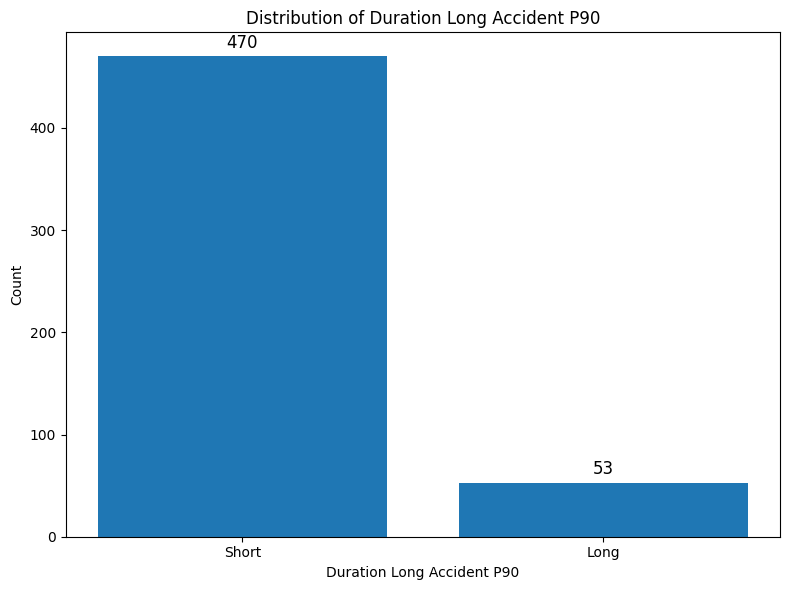

In [ ]:
## get distribution of target variable and show it in a graph

import matplotlib.pyplot as plt
import pandas as pd

# Get value counts for the binary column
counts = df_iteration_p90['duration_long_accident_p90'].value_counts()

# Create bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(counts.index, counts.values)

# Add value labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01 * max(counts.values),
             f'{int(height)}', ha='center', va='bottom', fontsize=12)

plt.xlabel('Duration Long Accident P90')
plt.ylabel('Count')
plt.title('Distribution of Duration Long Accident P90')
plt.xticks([0, 1], ['Short', 'Long'])  # Assuming 0/1 binary
plt.tight_layout()
plt.show()

## definition of columns

In [ ]:
if df_iteration_p90 is not None:
    columns_iter6 = [
        'ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ',
        'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.',
        'ΚΑΤ._ΟΔ.','ΤΕΧΝ._ΦΩΤ.', #'accident_type', # This is now our target or related to it
        'lat', 'lng', 'num_involved_vehicles', 'has_ΙΧΕ',
        'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ',
        'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.',
        'duration_long_accident_p90', # Keep the target variable
        # 'effective_lighting_condition',# replacing ΤΕΧΝ._ΦΩΤ. with effective_lighting_condition
        # 'is_exit_veer_on_highway_A_FP_alert',
        # 'is_exit_veer_on_wet_road_FP_alert',
        # 'low_vehicle_count_and_exit_veer_FP_alert',

        # 0.55 f1


        # 'temperature_2m',
        'temperature_category',
        # 'relative_humidity_2m',
        'wind_gusts_10m',
        "precipitation",

        # 0.55 again

        # "day_of_week_sin",
        # "day_of_week_cos",
        # "month_sin",
        # "month_cos",
        # "day_of_month_sin",
        # "day_of_month_cos",
        # "closest_toll_euclidean_km",
        # "closest_intersection_euclidean_km",
        # 0.54

        # "involves_heavy_vehicle",
        # "is_rapid_temp_change",
        # "time_since_previous_accident_hours",
        # 0.5

        # "accidents_past_3h",
        # same

        # "road_lanes",
        # "road_maxspeed",
        # 0.57

        # "road_surface",
        # "road_smoothness",
        # "road_bridge",

        # "road_context",
        # "curve_category",
        # "curve_direction",
        # "direction_name"

    ]
    # Ensure all selected columns exist in df_iteration_p90
    columns_iter6 = [col for col in columns_iter6 if col in df_iteration_p90.columns]
    if 'duration_long_accident_p90' not in columns_iter6 and 'duration_long_accident_p90' in df_iteration_p90.columns:
         columns_iter6.append('duration_long_accident_p90')


    df_iter6 = df_iteration_p90[columns_iter6].copy()
    print(f"\n--- Iteration 6: Working with {len(df_iter6.columns)-1} features ---")
    # display(df_iter1.head())



--- Iteration 6: Working with 22 features ---


##  stratified data splitting

In [ ]:
if 'df_iter6' in locals() and df_iter6 is not None:
    X = df_iter6.drop('duration_long_accident_p90', axis=1)
    y = df_iter6['duration_long_accident_p90']

    # Split into Train (60%) and Temp (40% for Val+Test)
    X_train_iter_6, X_temp_iter_6, y_train_iter_6, y_temp_iter_6 = train_test_split(
        X, y, test_size=0.4, random_state=42, stratify=y
    )

    # Split Temp into Validation (50% of Temp -> 20% of total) and Test (50% of Temp -> 20% of total)
    X_val_iter_6, X_test_iter_6, y_val_iter_6, y_test_iter_6 = train_test_split(
        X_temp_iter_6, y_temp_iter_6, test_size=0.5, random_state=42, stratify=y_temp_iter_6
    )

    print(f"Training set: {X_train_iter_6.shape}, {y_train_iter_6.shape}, Minority class: {Counter(y_train_iter_6)[1]}")
    print(f"Validation set: {X_val_iter_6.shape}, {y_val_iter_6.shape}, Minority class: {Counter(y_val_iter_6)[1]}")
    print(f"Test set: {X_test_iter_6.shape}, {y_test_iter_6.shape}, Minority class: {Counter(y_test_iter_6)[1]}")


Training set: (313, 22), (313,), Minority class: 32
Validation set: (105, 22), (105,), Minority class: 11
Test set: (105, 22), (105,), Minority class: 10


## spatial feature engineering

In [ ]:
if 'X_train_iter_6' in locals() and 'lat' in X_train_iter_6.columns and 'lng' in X_train_iter_6.columns: # Check if data and columns exist
    N_BINS = 8 # Example number of bins for gridding
    GEOHASH_PRECISION = 7 # Example geohash precision
    KDE_BANDWIDTH = 0.05 # Example KDE bandwidth - VERY SENSITIVE, needs tuning/domain knowledge

    # --- Create Road Segment ID using the adjusted function ---
    if 'ΑΥΤ/ΔΡΟΜΟΣ' in X_train_iter_6.columns and 'ΧΙΛ.ΘΕΣΗ' in X_train_iter_6.columns:
        # Call the adjusted function
        X_train_iter_6 = create_road_segment_feature_adjusted(X_train_iter_6)
        X_val_iter_6 = create_road_segment_feature_adjusted(X_val_iter_6)
        X_test_iter_6 = create_road_segment_feature_adjusted(X_test_iter_6)
        print("Adjusted road segment ID feature created.")
        # You can check the counts of the new categories:
        # print("Value counts for adjusted segment_id in X_train_iter_6:")
        # print(X_train_iter_6['segment_id'].value_counts().head(10))
    else:
        print("Skipping road segment ID creation: Required columns not found.")


    # --- Apply Coordinate Binning ---
    # (No changes needed here, ensure 'lat'/'lng' are present if you run this)
    if 'lat' in X_train_iter_6.columns and 'lng' in X_train_iter_6.columns:
        X_train_iter_6 = create_coordinate_bins(X_train_iter_6, n_bins=N_BINS, fit_df=X_train_iter_6.copy())
        X_val_iter_6 = create_coordinate_bins(X_val_iter_6, n_bins=N_BINS, fit_df=X_train_iter_6.copy())
        X_test_iter_6 = create_coordinate_bins(X_test_iter_6, n_bins=N_BINS, fit_df=X_train_iter_6.copy())
        print(f"Coordinate bins ({N_BINS}x{N_BINS}) created.")
    else:
        print("Skipping coordinate binning: lat/lng columns not found.")


    # --- Apply Geohashing ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_6.columns and 'lng' in X_train_iter_6.columns:
        X_train_iter_6 = apply_geohash(X_train_iter_6, precision=GEOHASH_PRECISION)
        X_val_iter_6 = apply_geohash(X_val_iter_6, precision=GEOHASH_PRECISION)
        X_test_iter_6 = apply_geohash(X_test_iter_6, precision=GEOHASH_PRECISION)
        print(f"Geohash (precision {GEOHASH_PRECISION}) features created.")
    else:
        print("Skipping geohashing: lat/lng columns not found.")


    # --- Apply KDE Score ---
    # (No changes needed here, ensure 'lat'/'lng' are present)
    if 'lat' in X_train_iter_6.columns and 'lng' in X_train_iter_6.columns:
        X_train_iter_6_coords_for_kde = X_train_iter_6[['lat', 'lng']].dropna()
        if not X_train_iter_6_coords_for_kde.empty:
            X_train_iter_6 = apply_kde_score(X_train_iter_6.dropna(subset=['lat', 'lng']), X_train_iter_6_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_val_iter_6 = apply_kde_score(X_val_iter_6.dropna(subset=['lat', 'lng']), X_train_iter_6_coords_for_kde, bandwidth=KDE_BANDWIDTH)
            X_test_iter_6 = apply_kde_score(X_test_iter_6.dropna(subset=['lat', 'lng']), X_train_iter_6_coords_for_kde, bandwidth=KDE_BANDWIDTH)

            # X_train_iter_6['kde_score'].fillna(0.0, inplace=True)
            X_train_iter_6.fillna({'kde_score':0.0},inplace=True)
            # X_val_iter_6['kde_score'].fillna(0.0, inplace=True)
            X_val_iter_6.fillna({'kde_score':0.0},inplace=True)
            # X_test_iter_6['kde_score'].fillna(0.0, inplace=True)
            X_test_iter_6.fillna({'kde_score':0.0},inplace=True)

            print("KDE scores created.")
        else:
            print("Skipping KDE: No valid coordinates in X_train_iter_6 to fit KDE.")
            X_train_iter_6['kde_score'] = 0.0
            X_val_iter_6['kde_score'] = 0.0
            X_test_iter_6['kde_score'] = 0.0
    else:
        print("Skipping KDE score: lat/lng columns not found.")


    # Display some of the new features
    # (Ensure the column name for segment_id matches what's created, e.g. 'segment_id')
    new_spatial_cols = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_6.columns: new_spatial_cols.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_6.columns: new_spatial_cols.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'kde_score' in X_train_iter_6.columns: new_spatial_cols.append('kde_score')
    # Check for the actual segment_id column name, assuming it's 'segment_id' from prefix='segment'
    if 'segment_id' in X_train_iter_6.columns: new_spatial_cols.append('segment_id')

    new_spatial_cols = [col for col in new_spatial_cols if col in X_train_iter_6.columns]
    if new_spatial_cols:
        print("\nSample of new spatial features in X_train_iter_6:")
        # In Colab, display() is better for DataFrames
        try:
            display(X_train_iter_6[new_spatial_cols].head())
        except NameError: # If display() is not available (e.g. standard Python script)
            print(X_train_iter_6[new_spatial_cols].head())

    else:
        print("\nNo new spatial features were added or found to display.")

else:
    print("Skipping spatial feature engineering: X_train_iter_6 or key columns not available.")

Adjusted road segment ID feature created.
Coordinate bins (8x8) created.
Geohash (precision 7) features created.
KDE scores created.

Sample of new spatial features in X_train_iter_6:


,grid_cell_8x8,geohash_p7,kde_score,segment_id
285,7_1,swbb8yf,5.312389,A_8.6
375,6_5,swbbsbn,23.490453,E_25.2
381,4_6,swbbnrr,26.434559,Y_5.8
160,7_2,swbb9w0,5.035669,A_11.3
4,6_4,swbbs35,19.180723,A_22.8


In [ ]:
# X_train_iter_6, X_val_iter_6, X_test_iter_6 are your dataframes after spatial features are engineered
columns_to_drop_after_spatial_eng = ['lat', 'lng'] # Add any other raw source columns if needed

X_train_iter_6 = X_train_iter_6.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_val_iter_6 = X_val_iter_6.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')
X_test_iter_6 = X_test_iter_6.drop(columns=columns_to_drop_after_spatial_eng, errors='ignore')

print(f"Dropped raw spatial columns: {columns_to_drop_after_spatial_eng}")

Dropped raw spatial columns: ['lat', 'lng']


## preprocessing

In [ ]:
if 'X_train_iter_6' in locals():
    # Identify feature types AFTER new spatial features are created
    # New categorical features from spatial engineering:
    new_cat_spatial_features = []
    if f'grid_cell_{N_BINS}x{N_BINS}' in X_train_iter_6.columns: new_cat_spatial_features.append(f'grid_cell_{N_BINS}x{N_BINS}')
    if f'geohash_p{GEOHASH_PRECISION}' in X_train_iter_6.columns: new_cat_spatial_features.append(f'geohash_p{GEOHASH_PRECISION}')
    if 'segment_id' in X_train_iter_6.columns: new_cat_spatial_features.append('segment_id')
    # Add more if you create other categorical spatial features e.g. lat_bin_N, lng_bin_N as separate features

    # New numerical features from spatial engineering:
    new_num_spatial_features = []
    if 'kde_score' in X_train_iter_6.columns: new_num_spatial_features.append('kde_score')


    all_categorical_features = X_train_iter_6.select_dtypes(include=['object', 'category']).columns.tolist()
    # Ensure our new spatial categoricals are included if not automatically detected as object/category
    for f in new_cat_spatial_features:
        if f not in all_categorical_features and f in X_train_iter_6.columns:
            all_categorical_features.append(f)
            X_train_iter_6[f] = X_train_iter_6[f].astype('category') # Ensure correct dtype
            X_val_iter_6[f] = X_val_iter_6[f].astype('category')
            X_test_iter_6[f] = X_test_iter_6[f].astype('category')


    # Features for 'unknown' imputation (original list)
    categorical_features_unknown_impute = [
        'ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.', "weather_description", 'effective_lighting_condition'
    ]
    categorical_features_unknown_impute = [col for col in categorical_features_unknown_impute if col in X_train_iter_6.columns and col in all_categorical_features]


    # Other categorical features (if any) for 'most_frequent' imputation
    # This will now include new_cat_spatial_features if they are not in the unknown_impute list
    categorical_features_mode_impute = [
        col for col in all_categorical_features if col not in categorical_features_unknown_impute
    ]

    boolean_features = X_train_iter_6.select_dtypes(include=['bool']).columns.tolist()
    for bf in boolean_features:
        X_train_iter_6[bf] = X_train_iter_6[bf].astype(int)
        X_val_iter_6[bf] = X_val_iter_6[bf].astype(int)
        X_test_iter_6[bf] = X_test_iter_6[bf].astype(int)

    numerical_features = X_train_iter_6.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    # Ensure our new numerical spatial features are included
    for f in new_num_spatial_features:
        if f not in numerical_features and f in X_train_iter_6.columns:
            numerical_features.append(f)


    print(f"Final Numerical features for preprocessor: {numerical_features}")
    print(f"Final Categorical features for 'unknown' imputation: {categorical_features_unknown_impute}")
    print(f"Final Categorical features for 'most_frequent' imputation: {categorical_features_mode_impute}")


    # --- The rest of your ColumnTransformer and preprocessing code follows ---
    # Create preprocessing pipelines (as you had before)
    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    categorical_pipeline_unknown = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Unknown')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    categorical_pipeline_mode = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')), # New spatial categoricals (grid_cell, geohash) usually don't have NaNs if created properly
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    transformers_list = []
    if numerical_features: # Add only if list is not empty
         transformers_list.append(('num', numerical_pipeline, numerical_features))
    if categorical_features_unknown_impute:
        transformers_list.append(('cat_unknown', categorical_pipeline_unknown, categorical_features_unknown_impute))
    if categorical_features_mode_impute:
        transformers_list.append(('cat_mode', categorical_pipeline_mode, categorical_features_mode_impute))

    preprocessor = ColumnTransformer(
        transformers=transformers_list,
        remainder='passthrough'
    )

    # Fit and transform (as you had before)
    # ... your existing code for fitting preprocessor and creating X_train_iter_6_processed_df ...
    # (No changes needed to that part if the feature lists fed into ColumnTransformer are correct)
    # Fit preprocessor on X_train_iter_6 and transform all sets
    X_train_iter_6_processed = preprocessor.fit_transform(X_train_iter_6)
    X_val_iter_6_processed = preprocessor.transform(X_val_iter_6)
    X_test_iter_6_processed = preprocessor.transform(X_test_iter_6)

    # Get feature names after one-hot encoding for RFE and interpretation
    try:
        feature_names_out = preprocessor.get_feature_names_out()
        X_train_iter_6_processed_df = pd.DataFrame(X_train_iter_6_processed, columns=feature_names_out, index=X_train_iter_6.index)
        X_val_iter_6_processed_df = pd.DataFrame(X_val_iter_6_processed, columns=feature_names_out, index=X_val_iter_6.index)
        X_test_iter_6_processed_df = pd.DataFrame(X_test_iter_6_processed, columns=feature_names_out, index=X_test_iter_6.index)
        print(f"Processed training data shape: {X_train_iter_6_processed_df.shape}")
    except Exception as e:
        print(f"Could not get feature names from preprocessor automatically: {e}")
        X_train_iter_6_processed_df = pd.DataFrame(X_train_iter_6_processed, index=X_train_iter_6.index)
        X_val_iter_6_processed_df = pd.DataFrame(X_val_iter_6_processed, index=X_val_iter_6.index)
        X_test_iter_6_processed_df = pd.DataFrame(X_test_iter_6_processed, index=X_test_iter_6.index)
        feature_names_out = X_train_iter_6_processed_df.columns.astype(str)
        print(f"Processed training data shape (generic column names): {X_train_iter_6_processed_df.shape}")

Final Numerical features for preprocessor: ['num_involved_vehicles', 'has_ΙΧΕ', 'has_ΚΡΑΤΙΚΟ ΟΧΗΜΑ', 'has_ΔΙΚΥΚΛΟ', 'has_ΦΟΡΤΗΓΟ', 'has_ΤΑΞΙ', 'has_ΛΕΩΦΟΡΕΙΟ', 'has_Μ.Ε.', 'wind_gusts_10m', 'precipitation', 'lat_bin_8', 'lng_bin_8', 'kde_score']
Final Categorical features for 'unknown' imputation: ['ΚΑΙΡ._ΣΥΝΘ.', 'ΣΥΝΘ._ΟΔ.', 'ΚΑΤ._ΟΔ.', 'ΤΕΧΝ._ΦΩΤ.']
Final Categorical features for 'most_frequent' imputation: ['ΑΥΤ/ΔΡΟΜΟΣ', 'ΧΙΛ.ΘΕΣΗ', 'ΣΗΡΑΓΓΑ', 'ΥΠΟΚΑΤΗΓΟΡΙΑ', 'ΘΕΣΗ_ΕΡΓΟΥ', 'temperature_category', 'segment_id', 'grid_cell_8x8', 'geohash_p7']
Processed training data shape: (313, 674)


## recursive feature elimination with cross validation


--- Iteration 5: Recursive Feature Elimination with Cross-Validation (RFECV) ---
RFECV will use the estimator: LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42,
                   solver='liblinear')
Cross-validation strategy: StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
Scoring metric for feature selection: 'roc_auc'
Fitting RFECV... (This might take some time)
Optimal number of features found by RFECV: 241

Selected features from RFECV (241):
Shape of X_train after RFECV: (313, 241)


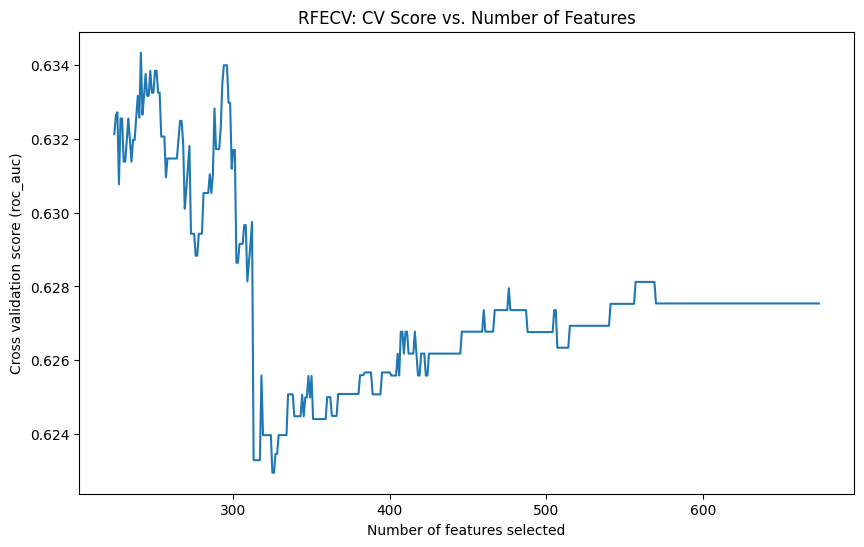

In [ ]:
# Ensure necessary imports
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression # Your chosen estimator
from sklearn.metrics import make_scorer, f1_score # For scoring if needed


if 'X_train_iter_6_processed_df' in locals() and X_train_iter_6_processed_df is not None and \
   'y_train_iter_6' in locals() and y_train_iter_6 is not None:

    print("\n--- Iteration 5: Recursive Feature Elimination with Cross-Validation (RFECV) ---")

    estimator_rfecv = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=42, max_iter=1000)

    # Define the cross-validation strategy
    # StratifiedKFold is good for classification, especially with imbalanced classes
    cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42) # Using 5 splits as an example

    # Define the scoring metric for RFECV to optimize
    # For imbalanced classes, 'f1', 'roc_auc', or 'average_precision' (PR AUC) are often better than 'accuracy'.
    # Let's use 'f1' for the positive class (assuming positive_label=1)
    # If your positive class is not 1, adjust pos_label
    # You can also use 'roc_auc', 'average_precision', etc.
    scorer_for_rfecv = make_scorer(f1_score, pos_label=1, average='binary', zero_division=0)
    # Alternatively, just use a string like 'f1_macro', 'roc_auc'.
    # For binary classification and focusing on the positive class, 'f1' (which defaults to f1 of positive class if pos_label=1) or 'roc_auc' are good.
    # Let's use 'roc_auc' as it's a common general-purpose metric for RFECV selection
    # and less prone to issues if a fold has no positive predictions for some feature subsets.

    print(f"RFECV will use the estimator: {estimator_rfecv}")
    print(f"Cross-validation strategy: {cv_strategy}")
    print(f"Scoring metric for feature selection: 'roc_auc'") # Or your chosen scorer

    rfecv = RFECV(
        estimator=estimator_rfecv,
        step=1,  # Remove 1 feature at each step
        cv=cv_strategy,
        scoring='roc_auc',  # Metric to optimize for feature selection
        min_features_to_select=max(5, X_train_iter_6_processed_df.shape[1] // 3), # Example: select at least 5 features, or 10%
        n_jobs=-1 # Use all available cores
    )

    print("Fitting RFECV... (This might take some time)")
    try:
        rfecv.fit(X_train_iter_6_processed_df, y_train_iter_6)

        print(f"Optimal number of features found by RFECV: {rfecv.n_features_}")

        # Get the mask of selected features
        selected_features_rfecv_mask = rfecv.support_

        # Get the names of the selected features
        # Ensure that X_train_iter_6_processed_df has columns attribute (it should if it's a DataFrame)
        selected_features_rfecv = X_train_iter_6_processed_df.columns[selected_features_rfecv_mask]

        print(f"\nSelected features from RFECV ({len(selected_features_rfecv)}):")
        # Printing all feature names can be very long, consider printing only a few or just the count
        # print(selected_features_rfecv.tolist())

        # Update DataFrames to keep only RFECV selected features
        X_train_iter_6_iter_final = X_train_iter_6_processed_df[selected_features_rfecv]
        X_val_iter_6_iter_final = X_val_iter_6_processed_df[selected_features_rfecv]
        X_test_iter_6_iter_final = X_test_iter_6_processed_df[selected_features_rfecv]

        print(f"Shape of X_train after RFECV: {X_train_iter_6_iter_final.shape}")

        # You can also plot the number of features vs. cross-validation scores
        if hasattr(rfecv, "cv_results_"):
            try:
                import matplotlib.pyplot as plt
                n_scores = len(rfecv.cv_results_["mean_test_score"]) # Number of features evaluated
                plt.figure(figsize=(10,6))
                plt.xlabel("Number of features selected")
                plt.ylabel(f"Cross validation score ({rfecv.scoring})")
                plt.plot(
                    range(rfecv.min_features_to_select, n_scores + rfecv.min_features_to_select), # X-axis: number of features
                    rfecv.cv_results_["mean_test_score"],
                )
                plt.title("RFECV: CV Score vs. Number of Features")
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot RFECV scores: {plot_e}")

    except ValueError as ve:
        print(f"ValueError during RFECV fitting: {ve}")
        print("This might occur if input data is problematic or no features could be selected.")
        # Fallback: use all features from preprocessing if RFECV fails
        X_train_iter_6_iter_final = X_train_iter_6_processed_df.copy()
        X_val_iter_6_iter_final = X_val_iter_6_processed_df.copy()
        X_test_iter_6_iter_final = X_test_iter_6_processed_df.copy()
        print("Using all preprocessed features as RFECV failed.")
    except Exception as e:
        print(f"An unexpected error occurred during RFECV: {e}")
        X_train_iter_6_iter_final = X_train_iter_6_processed_df.copy() # Fallback
        X_val_iter_6_iter_final = X_val_iter_6_processed_df.copy()
        X_test_iter_6_iter_final = X_test_iter_6_processed_df.copy()
        print("Using all preprocessed features as RFECV encountered an error.")


else:
    print("Skipping RFECV as processed data (X_train_iter_6_processed_df or y_train_iter_6) is not available.")
    # Define fallback if previous steps failed
    if 'X_train_iter_6_processed_df' in locals() and X_train_iter_6_processed_df is not None:
        X_train_iter_6_iter_final = X_train_iter_6_processed_df.copy()
        X_val_iter_6_iter_final = X_val_iter_6_processed_df.copy() if 'X_val_iter_6_processed_df' in locals() and X_val_iter_6_processed_df is not None else None
        X_test_iter_6_iter_final = X_test_iter_6_processed_df.copy() if 'X_test_iter_6_processed_df' in locals() and X_test_iter_6_processed_df is not None else None
    else:
        X_train_iter_6_iter_final, X_val_iter_6_iter_final, X_test_iter_6_iter_final = None, None, None

## balancing techniques

In [ ]:
# Previous code: X_train_iter_6_iter_final, y_train_iter_6, X_val_iter_final, y_val are defined

resampled_datasets_iter_6 = {} # To store (X_resampled, y_resampled) for each technique

if 'X_train_iter_6_iter_final' in locals() and X_train_iter_6_iter_final is not None and y_train_iter_6 is not None:
    print(f"\nOriginal training set shape: {X_train_iter_6_iter_final.shape}, Original class distribution: {Counter(y_train_iter_6)}")
    minority_class_count = Counter(y_train_iter_6).get(1, 0) # Assuming 1 is the minority class

    # Store the original (non-resampled) training data as a baseline
    resampled_datasets_iter_6['Original'] = (X_train_iter_6_iter_final.copy(), y_train_iter_6.copy())

    # Define samplers
    samplers = {
        "RandomOverSampler": RandomOverSampler(random_state=42),
        "SMOTE": None, # Will initialize carefully due to k_neighbors
        "ADASYN": None, # Will initialize carefully due to n_neighbors
        "TomekLinks": TomekLinks(sampling_strategy='auto', n_jobs=-1), # Undersampling, removes Tomek links
        "SMOTETomek": None, # Will initialize carefully
        "SMOTEENN": None # Will initialize carefully
    }

    # SMOTE and ADASYN require k_neighbors (or n_neighbors for ADASYN) < minority_class_count
    if minority_class_count > 1:
        k_val = min(4, minority_class_count - 1) # A common heuristic for k, ensuring it's less than minority samples

        if k_val > 0 : # Ensure k_val is positive
            samplers["SMOTE"] = SMOTE(random_state=42, k_neighbors=k_val)
            samplers["ADASYN"] = ADASYN(random_state=42, n_neighbors=k_val) # ADASYN uses n_neighbors
            samplers["SMOTETomek"] = SMOTETomek(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), tomek=TomekLinks(sampling_strategy='auto'), n_jobs=-1)
            samplers["SMOTEENN"] = SMOTEENN(random_state=42, smote=SMOTE(random_state=42, k_neighbors=k_val), enn=None, n_jobs=-1) # enn default is good
        else:
            print(f"Skipping SMOTE-based samplers as k_val ({k_val}) would be too small or zero based on minority count ({minority_class_count}).")
            # Remove them if they can't be initialized
            for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
                if key in samplers: samplers.pop(key)

    else:
        print(f"Skipping SMOTE-based samplers as minority count ({minority_class_count}) is <= 1.")
        for key in ["SMOTE", "ADASYN", "SMOTETomek", "SMOTEENN"]:
            if key in samplers: samplers.pop(key)


    # Apply each sampler
    for name, sampler in samplers.items():
        if sampler is None: # Sampler was not initialized
            continue
        print(f"\nApplying {name}...")
        try:
            X_res, y_res = sampler.fit_resample(X_train_iter_6_iter_final, y_train_iter_6)
            resampled_datasets_iter_6[name] = (X_res, y_res)
            print(f"Resampled with {name}: X_shape={X_res.shape}, y_dist={Counter(y_res)}")
        except Exception as e:
            print(f"Could not apply {name}. Error: {e}")
            # Optionally store original if sampler fails, or skip
            # resampled_datasets_iter_6[name] = (X_train_iter_6_iter_final.copy(), y_train_iter_6.copy())


    if not resampled_datasets_iter_6: # If all samplers failed or were skipped
        print("No resampling techniques were successfully applied or initialized. Using original data only.")
        if 'Original' not in resampled_datasets_iter_6: # Should already be there
             resampled_datasets_iter_6['Original'] = (X_train_iter_6_iter_final.copy(), y_train_iter_6.copy())


else:
    print("Skipping balancing as X_train_iter_6_iter_final or y_train_iter_6 is not available.")
    # Ensure there's at least 'Original' if X_train_iter_6_iter_final was available
    if 'X_train_iter_6_iter_final' in locals() and X_train_iter_6_iter_final is not None and y_train_iter_6 is not None:
        resampled_datasets_iter_6['Original'] = (X_train_iter_6_iter_final.copy(), y_train_iter_6.copy())


Original training set shape: (313, 241), Original class distribution: Counter({0: 281, 1: 32})

Applying RandomOverSampler...
Resampled with RandomOverSampler: X_shape=(562, 241), y_dist=Counter({0: 281, 1: 281})

Applying SMOTE...
Resampled with SMOTE: X_shape=(562, 241), y_dist=Counter({0: 281, 1: 281})

Applying ADASYN...
Resampled with ADASYN: X_shape=(551, 241), y_dist=Counter({0: 281, 1: 270})

Applying TomekLinks...
Resampled with TomekLinks: X_shape=(303, 241), y_dist=Counter({0: 271, 1: 32})

Applying SMOTETomek...
Resampled with SMOTETomek: X_shape=(562, 241), y_dist=Counter({0: 281, 1: 281})

Applying SMOTEENN...
Resampled with SMOTEENN: X_shape=(478, 241), y_dist=Counter({1: 275, 0: 203})


## model training

In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier # Ensure this import is present


trained_models_iter_6 = {} # To store trained models: key will be "ModelName_SamplerName"

if 'resampled_datasets_iter_6' in locals() and resampled_datasets_iter_6:
    minority_class_label = 1 # Assuming 'death' is 1
    f1_minority_scorer = make_scorer(f1_score, pos_label=minority_class_label, average='binary') # For CV if you add it later

    for sampler_name, (X_train_curr_resampled, y_train_curr_resampled) in resampled_datasets_iter_6.items():
        print(f"\n--- Training models on data from: {sampler_name} ---")
        print(f"Training data shape: {X_train_curr_resampled.shape}, Distribution: {Counter(y_train_curr_resampled)}")

        # Define your models here or ensure they are defined from a previous cell
        # Re-initialize models for each dataset to ensure they are fresh

        # Calculate scale_pos_weight for XGBoost based on the current resampled data
        counts_curr = Counter(y_train_curr_resampled)
        scale_pos_weight_curr = counts_curr[0] / counts_curr[1] if counts_curr[1] > 0 else 1

        # calculate the ratio of the target variable in the training set in order to
        # get the weights for the custom ratio logistic regression
        counts_curr = Counter(y_train_curr_resampled)
        n_majority = counts_curr.get(0, 0) # Count of class 0 (assuming majority)
        n_minority = counts_curr.get(1, 0) # Count of class 1 (assuming minority)

        if n_minority > 0 and n_majority > 0:

          weight_minority = n_majority / n_minority
          custom_class_weights = {0: 1.0, 1: weight_minority}


        current_models_definitions = {
            'LogisticRegression': LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_custom_ratio':LogisticRegression(solver='liblinear',random_state=42,class_weight=custom_class_weights,max_iter=1000),
            'LogisticRegression_L1': LogisticRegression(solver='liblinear', penalty='l1', random_state=42, class_weight='balanced', max_iter=1000),
            'LogisticRegression_L2':LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000, penalty='l2'),
            'RandomForest': RandomForestClassifier(random_state=42, class_weight='balanced_subsample', n_estimators=100),
            'XGBoost': xgb.XGBClassifier(random_state=42, eval_metric='logloss',
                             scale_pos_weight=scale_pos_weight_curr),
            'BalancedRandomForest': BalancedRandomForestClassifier(random_state=42, n_estimators=100, sampling_strategy='auto', replacement=True, n_jobs=-1),
            'RUSBoost': RUSBoostClassifier(random_state=42, n_estimators=50, sampling_strategy='auto') # n_estimators often lower for boosting
        }
        # Note on class_weight='balanced':
        # For 'Original' data (imbalanced), it's useful.
        # For data resampled to be perfectly balanced (e.g., SMOTE to 50/50), class_weight='balanced' might have less effect
        # or could be omitted, but it generally doesn't hurt and can help if balance isn't perfect.

        for model_name, model_instance in current_models_definitions.items():
            full_model_name = f"{model_name}_{sampler_name}"
            print(f"Training {full_model_name}...")
            try:
                model_instance.fit(X_train_curr_resampled, y_train_curr_resampled)
                trained_models_iter_6[full_model_name] = model_instance
                print(f"{full_model_name} trained.")
            except Exception as e:
                print(f"Could not train {full_model_name}. Error: {e}")
                trained_models_iter_6[full_model_name] = None # Store None if training failed

else:
    print("Skipping model training as no resampled datasets are available.")


--- Training models on data from: Original ---
Training data shape: (313, 241), Distribution: Counter({0: 281, 1: 32})
Training LogisticRegression_Original...
LogisticRegression_Original trained.
Training LogisticRegression_custom_ratio_Original...
LogisticRegression_custom_ratio_Original trained.
Training LogisticRegression_L1_Original...
LogisticRegression_L1_Original trained.
Training LogisticRegression_L2_Original...
LogisticRegression_L2_Original trained.
Training RandomForest_Original...
RandomForest_Original trained.
Training XGBoost_Original...
XGBoost_Original trained.
Training BalancedRandomForest_Original...
BalancedRandomForest_Original trained.
Training RUSBoost_Original...
RUSBoost_Original trained.

--- Training models on data from: RandomOverSampler ---
Training data shape: (562, 241), Distribution: Counter({0: 281, 1: 281})
Training LogisticRegression_RandomOverSampler...
LogisticRegression_RandomOverSampler trained.
Training LogisticRegression_custom_ratio_RandomOver

## model evaluation

In [ ]:
if 'trained_models_iter_6' in locals() and trained_models_iter_6 and \
   'X_val_iter_6_iter_final' in locals() and X_val_iter_6_iter_final is not None and y_val_iter_6 is not None:

    print("\n--- Model Assessment on Validation Set ---")

    # Store results for later comparison if needed
    validation_results_iter_6 = {}

    for full_model_name, model in trained_models_iter_6.items():
        if model is not None: # Check if model was trained
            print(f"\n--- Assessing: {full_model_name} ---")
            try:
                y_pred_val_iter_6 = model.predict(X_val_iter_6_iter_final)
                y_proba_val_iter_6 = model.predict_proba(X_val_iter_6_iter_final)[:, 1] # Probability of positive class

                report = classification_report(y_val_iter_6, y_pred_val_iter_6, target_names=['Short (0)', 'Long (1)'], output_dict=True)
                roc_auc = roc_auc_score(y_val_iter_6, y_proba_val_iter_6)
                precision_pr, recall_pr, _ = precision_recall_curve(y_val_iter_6, y_proba_val_iter_6)
                pr_auc = auc(recall_pr, precision_pr)
                conf_matrix = confusion_matrix(y_val_iter_6, y_pred_val_iter_6)

                print(classification_report(y_val_iter_6, y_pred_val_iter_6, target_names=['Short (0)', 'Long (1)']))
                print(f"Confusion Matrix:\n{conf_matrix}")
                print(f"ROC AUC: {roc_auc:.4f}")
                print(f"PR AUC: {pr_auc:.4f}")

                # Store results
                validation_results_iter_6[full_model_name] = {
                    'classification_report': report,
                    'confusion_matrix': conf_matrix.tolist(), # convert numpy array to list for easier storage/JSON
                    'roc_auc': roc_auc,
                    'pr_auc': pr_auc,
                    'f1_long': report.get('Long (1)', {}).get('f1-score', 0), # F1 for minority class
                    'recall_long': report.get('Long (1)', {}).get('recall', 0) # Recall for minority class
                }
            except Exception as e:
                print(f"Could not assess {full_model_name}. Error: {e}")
                validation_results_iter_6[full_model_name] = {'error': str(e)}
        else:
            print(f"Model {full_model_name} was not trained, skipping assessment.")
            validation_results_iter_6[full_model_name] = {'error': 'Model not trained'}

    # Optional: Print a summary table of key metrics from validation_results_iter_6
    if validation_results_iter_6:
        print("\n--- Validation Results Summary (F1 and Recall for Long class, PR AUC) ---")
        summary_df = pd.DataFrame([
            {'Model_Sampler': name,
             'F1_long': data.get('f1_long', 'N/A'),
             'Recall_long': data.get('recall_long', 'N/A'),
             'PR_AUC': data.get('pr_auc', 'N/A'),
             'ROC_AUC': data.get('roc_auc', 'N/A')}
            for name, data in validation_results_iter_6.items() if 'error' not in data
        ])
        if not summary_df.empty:
            summary_df = summary_df.sort_values(by='F1_long', ascending=False) # Sort by F1 for Long class
            try:
                display(summary_df) # Works well in Colab
            except NameError:
                print(summary_df)
        else:
            print("No valid results to summarize.")


else:
    print("Skipping model assessment: Trained models or validation data are not available.")


--- Model Assessment on Validation Set ---

--- Assessing: LogisticRegression_Original ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.89      0.90        94
    Long (1)       0.17      0.18      0.17        11

    accuracy                           0.82       105
   macro avg       0.53      0.54      0.54       105
weighted avg       0.83      0.82      0.82       105

Confusion Matrix:
[[84 10]
 [ 9  2]]
ROC AUC: 0.5368
PR AUC: 0.1321

--- Assessing: LogisticRegression_custom_ratio_Original ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.88      0.89        94
    Long (1)       0.15      0.18      0.17        11

    accuracy                           0.81       105
   macro avg       0.53      0.53      0.53       105
weighted avg       0.82      0.81      0.82       105

Confusion Matrix:
[[83 11]
 [ 9  2]]
ROC AUC: 0.5097
PR AUC: 0.1223

--- Assessing: LogisticRegression_L1_Original ---
      

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.91      0.91      0.91        94
    Long (1)       0.20      0.18      0.19        11

    accuracy                           0.84       105
   macro avg       0.55      0.55      0.55       105
weighted avg       0.83      0.84      0.83       105

Confusion Matrix:
[[86  8]
 [ 9  2]]
ROC AUC: 0.6354
PR AUC: 0.1558

--- Assessing: BalancedRandomForest_Original ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.73      0.81        94
    Long (1)       0.14      0.36      0.20        11

    accuracy                           0.70       105
   macro avg       0.52      0.55      0.51       105
weighted avg       0.83      0.70      0.75       105

Confusion Matrix:
[[69 25]
 [ 7  4]]
ROC AUC: 0.6078
PR AUC: 0.1531

--- Assessing: RUSBoost_Original ---
              precision    recall  f1-score   support

   Short (0)       0.92      0.52      0.67        94
    Long (1) 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.6069
PR AUC: 0.1290

--- Assessing: RUSBoost_RandomOverSampler ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.70      0.79        94
    Long (1)       0.12      0.36      0.19        11

    accuracy                           0.67       105
   macro avg       0.51      0.53      0.49       105
weighted avg       0.82      0.67      0.73       105

Confusion Matrix:
[[66 28]
 [ 7  4]]
ROC AUC: 0.5750
PR AUC: 0.1294

--- Assessing: LogisticRegression_SMOTE ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.89      0.90        94
    Long 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.91      0.96      0.93        94
    Long (1)       0.33      0.18      0.24        11

    accuracy                           0.88       105
   macro avg       0.62      0.57      0.58       105
weighted avg       0.85      0.88      0.86       105

Confusion Matrix:
[[90  4]
 [ 9  2]]
ROC AUC: 0.6393
PR AUC: 0.1674

--- Assessing: BalancedRandomForest_SMOTE ---
              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.5430
PR AUC: 0.1151

--- Assessing: RUSBoost_SMOTE ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.98      0.94        94
    Long (1)       

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      0.88      0.89        94
    Long (1)       0.15      0.18      0.17        11

    accuracy                           0.81       105
   macro avg       0.53      0.53      0.53       105
weighted avg       0.82      0.81      0.82       105

Confusion Matrix:
[[83 11]
 [ 9  2]]
ROC AUC: 0.5242
PR AUC: 0.1272

--- Assessing: LogisticRegression_custom_ratio_ADASYN ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.88      0.89        94
    Long (1)       0.15      0.18      0.17        11

    accuracy                           0.81       105
   macro avg       0.53      0.53      0.53       105
weighted avg       0.82      0.81      0.82       105

Confusion Matrix:
[[83 11]
 [ 9  2]]
ROC AUC: 0.5213
PR AUC: 0.1263

--- Assessing: LogisticRegression_L1_ADASYN ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.91      0.91    

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.5861
PR AUC: 0.1343

--- Assessing: XGBoost_ADASYN ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.96      0.93        94
    Long (1)       0.20      0.09      0.12        11

    accuracy                           0.87       105
   macro avg       0.55      0.52      0.53       105
weighted avg       0.83      0.87      0.84       105

Confusion Matrix:
[[90  4]
 [10  1]]
ROC AUC: 0.6170
PR AUC: 0.2150

--- Assessing: BalancedRandomForest_ADASYN ---


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.6093
PR AUC: 0.2267

--- Assessing: RUSBoost_ADASYN ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.91      0.91        94
    Long (1)       0.20      0.18      0.19        11

    accuracy                           0.84       105
   macro avg       0.55      0.55      0.55       105
weighted avg       0.83      0.84      0.83       105

Confusion Matrix:
[[86  8]
 [ 9  2]]
ROC AUC: 0.5556
PR AUC: 0.1342

--- Assessing: LogisticRegression_TomekLinks ---
              precision    recall  f1-score   support

   Short (0)       0.90      0.87      0.89        94
    Long (1)   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.90      0.89      0.90        94
    Long (1)       0.17      0.18      0.17        11

    accuracy                           0.82       105
   macro avg       0.53      0.54      0.54       105
weighted avg       0.83      0.82      0.82       105

Confusion Matrix:
[[84 10]
 [ 9  2]]
ROC AUC: 0.6944
PR AUC: 0.1662

--- Assessing: BalancedRandomForest_TomekLinks ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.78      0.84        94
    Long (1)       0.16      0.36      0.22        11

    accuracy                           0.73       105
   macro avg       0.54      0.57      0.53       105
weighted avg       0.83      0.73      0.77       105

Confusion Matrix:
[[73 21]
 [ 7  4]]
ROC AUC: 0.6601
PR AUC: 0.1601
Model RUSBoost_TomekLinks was not trained, skipping assessment.

--- Assessing: LogisticRegression_SMOTETomek ---
              precision    recall  f1-score 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.91      0.96      0.93        94
    Long (1)       0.33      0.18      0.24        11

    accuracy                           0.88       105
   macro avg       0.62      0.57      0.58       105
weighted avg       0.85      0.88      0.86       105

Confusion Matrix:
[[90  4]
 [ 9  2]]
ROC AUC: 0.6393
PR AUC: 0.1674

--- Assessing: BalancedRandomForest_SMOTETomek ---
              precision    recall  f1-score   support

   Short (0)       0.90      1.00      0.94        94
    Long (1)       0.00      0.00      0.00        11

    accuracy                           0.90       105
   macro avg       0.45      0.50      0.47       105
weighted avg       0.80      0.90      0.85       105

Confusion Matrix:
[[94  0]
 [11  0]]
ROC AUC: 0.5430
PR AUC: 0.1151

--- Assessing: RUSBoost_SMOTETomek ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.98      0.94        94
    Long 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

              precision    recall  f1-score   support

   Short (0)       0.91      0.79      0.85        94
    Long (1)       0.17      0.36      0.23        11

    accuracy                           0.74       105
   macro avg       0.54      0.58      0.54       105
weighted avg       0.84      0.74      0.78       105

Confusion Matrix:
[[74 20]
 [ 7  4]]
ROC AUC: 0.5329
PR AUC: 0.1185

--- Assessing: LogisticRegression_custom_ratio_SMOTEENN ---
              precision    recall  f1-score   support

   Short (0)       0.91      0.79      0.85        94
    Long (1)       0.17      0.36      0.23        11

    accuracy                           0.74       105
   macro avg       0.54      0.58      0.54       105
weighted avg       0.84      0.74      0.78       105

Confusion Matrix:
[[74 20]
 [ 7  4]]
ROC AUC: 0.5338
PR AUC: 0.1193

--- Assessing: LogisticRegression_L1_SMOTEENN ---
              precision    recall  f1-score   support

   Short (0)       0.94      0.78      0.85

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

,Model_Sampler,F1_long,Recall_long,PR_AUC,ROC_AUC
49,LogisticRegression_L1_SMOTEENN,0.315789,0.545455,0.129811,0.558027
34,LogisticRegression_L1_TomekLinks,0.294118,0.454545,0.185528,0.617988
46,RUSBoost_SMOTETomek,0.266667,0.181818,0.176826,0.588008
23,RUSBoost_SMOTE,0.266667,0.181818,0.176826,0.588008
2,LogisticRegression_L1_Original,0.258065,0.363636,0.163741,0.608317
21,XGBoost_SMOTE,0.235294,0.181818,0.167398,0.639265
44,XGBoost_SMOTETomek,0.235294,0.181818,0.167398,0.639265
54,RUSBoost_SMOTEENN,0.235294,0.363636,0.146192,0.599613
48,LogisticRegression_custom_ratio_SMOTEENN,0.228571,0.363636,0.119291,0.533849
47,LogisticRegression_SMOTEENN,0.228571,0.363636,0.118497,0.532882


## threshold tuning



--- Iteration 4: Additional Analysis (Feature Importance & Threshold Tuning) ---


<ipython-input-210-adf60138f085>:28: RuntimeWarning: invalid value encountered in divide
  f1_scores_thresh = (2 * precisions * recalls) / (precisions + recalls)



--- Iter 4: Threshold Fine-tuning for LogisticRegression_L1_SMOTEENN ---
Best Threshold: 0.6857 (yields F1 Long: 0.5000)


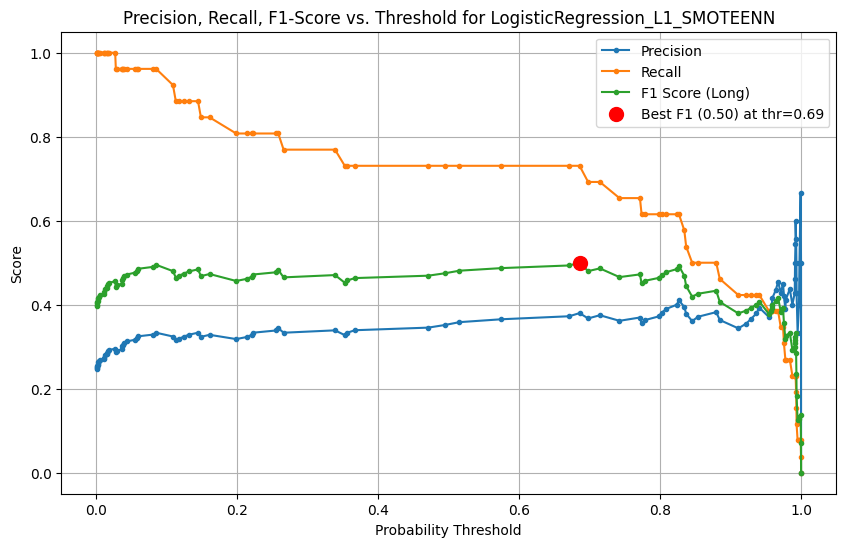


Classification Report on Validation Set with Tuned Threshold:
              precision    recall  f1-score   support

   Short (0)       0.87      0.61      0.72        79
    Long (1)       0.38      0.73      0.50        26

    accuracy                           0.64       105
   macro avg       0.63      0.67      0.61       105
weighted avg       0.75      0.64      0.66       105


Confusion Matrix with Tuned Threshold:
[[48 31]
 [ 7 19]]


In [ ]:
print("\n\n--- Iteration 4: Additional Analysis (Feature Importance & Threshold Tuning) ---")

best_model_name_iter6 = None
best_model_object_iter6 = None
y_proba_val_for_best_model_iter6 = None

# Determine the best model from validation results
if 'summary_df' in locals() and not summary_df.empty:
    best_model_name_iter6 = summary_df.iloc[0]['Model_Sampler'] # Assumes sorted by F1_long
    if best_model_name_iter6 in trained_models_iter_4:
        best_model_object_iter6 = trained_models_iter_4[best_model_name_iter6]
        if best_model_name_iter6 in validation_results_iter_4 and 'y_proba_val' in validation_results_iter_4[best_model_name_iter6]:
             y_proba_val_for_best_model_iter6 = validation_results_iter_4[best_model_name_iter6]['y_proba_val']
        else: # Recalculate if not stored
            if best_model_object_iter6 and hasattr(best_model_object_iter6, "predict_proba") and X_val_iter_4_iter_final is not None:
                y_proba_val_for_best_model_iter6 = best_model_object_iter6.predict_proba(X_val_iter_4_iter_final)[:, 1]

if y_proba_val_for_best_model_iter6 is not None:
        print(f"\n--- Iter 4: Threshold Fine-tuning for {best_model_name_iter6} ---")
        precisions, recalls, thresholds_pr = precision_recall_curve(y_val_iter_4, y_proba_val_for_best_model_iter6)

        # Exclude the last precision (1.0) and recall (0.0) which don't have a corresponding threshold
        if len(thresholds_pr) == len(precisions) - 1:
            precisions = precisions[:-1]
            recalls = recalls[:-1]

        # Calculate F1 score for each threshold
        f1_scores_thresh = (2 * precisions * recalls) / (precisions + recalls)
        f1_scores_thresh = np.nan_to_num(f1_scores_thresh) # Handle division by zero if P or R is 0

        best_f1_idx = np.argmax(f1_scores_thresh)
        best_threshold = thresholds_pr[best_f1_idx]
        best_f1_score = f1_scores_thresh[best_f1_idx]

        print(f"Best Threshold: {best_threshold:.4f} (yields F1 Long: {best_f1_score:.4f})")

        plt.figure(figsize=(10, 6))
        plt.plot(thresholds_pr, precisions, label='Precision', marker='.')
        plt.plot(thresholds_pr, recalls, label='Recall', marker='.')
        plt.plot(thresholds_pr, f1_scores_thresh, label='F1 Score (Long)', marker='.')
        plt.scatter(best_threshold, best_f1_score, marker='o', color='red', label=f'Best F1 ({best_f1_score:.2f}) at thr={best_threshold:.2f}', s=100, zorder=5)
        plt.xlabel("Probability Threshold")
        plt.ylabel("Score")
        plt.title(f"Precision, Recall, F1-Score vs. Threshold for {best_model_name_iter6}")
        plt.legend()
        plt.grid(True)
        plt.show()

        # Evaluate with the new threshold on validation set
        y_pred_tuned_thresh = (y_proba_val_for_best_model_iter6 >= best_threshold).astype(int)
        print("\nClassification Report on Validation Set with Tuned Threshold:")
        print(classification_report(y_val_iter_4, y_pred_tuned_thresh, target_names=['Short (0)', 'Long (1)'], zero_division=0))
        print("\nConfusion Matrix with Tuned Threshold:")
        print(confusion_matrix(y_val_iter_4, y_pred_tuned_thresh))
else:
        print("Skipping Threshold Tuning: Validation probabilities not available for the best model.")

## evaluation

Using tuned threshold for test set evaluation: 0.6857
Model selected for final test set evaluation: LogisticRegression_L1_SMOTEENN

--- Iteration 4: Final Evaluation on Test Set ---
Using Model: LogisticRegression_L1_SMOTEENN
Using Threshold: 0.6857

ROC AUC (Test Set): 0.8084
PR AUC (Test Set): 0.3066

Classification Report (Test Set with Tuned Threshold):
              precision    recall  f1-score   support

   Short (0)       0.96      0.83      0.89        95
    Long (1)       0.30      0.70      0.42        10

    accuracy                           0.82       105
   macro avg       0.63      0.77      0.66       105
weighted avg       0.90      0.82      0.85       105


Confusion Matrix (Test Set with Tuned Threshold):
[[79 16]
 [ 3  7]]


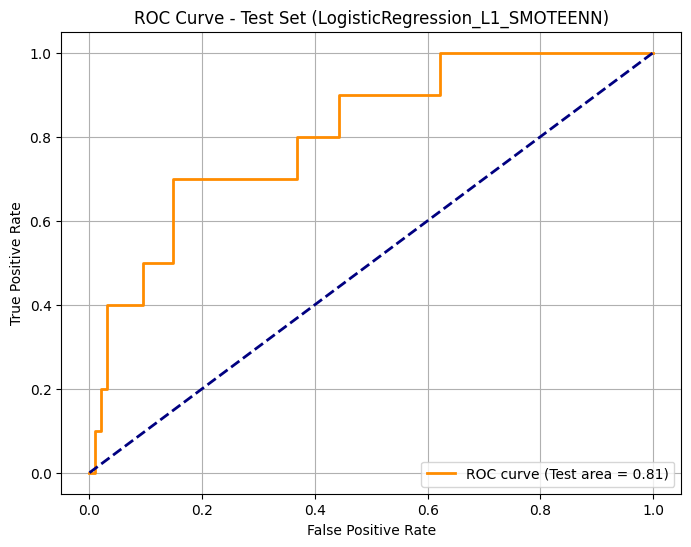

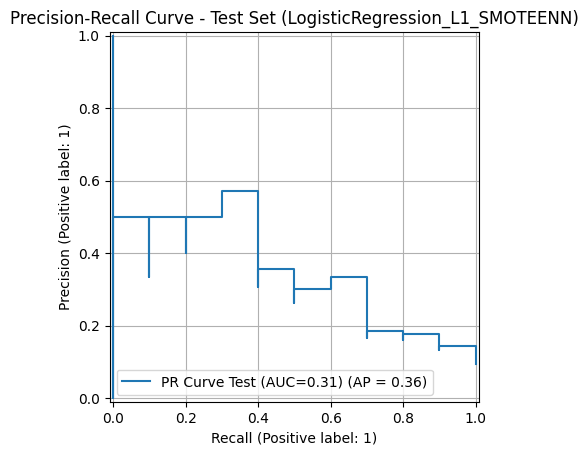

In [ ]:
# Ensure this variable is set from the threshold tuning step in Iteration 4
# For example, if it was determined in the previous cell:
# best_threshold_iter4 = 0.5077 # Make sure this is the actual best threshold found

# Check if best_threshold_iter4 was actually found and set
if 'best_threshold' in locals(): # Assuming 'best_threshold' was the name used in the tuning cell
    best_threshold_iter4_for_test = best_threshold
    print(f"Using tuned threshold for test set evaluation: {best_threshold_iter4_for_test:.4f}")
else:
    # Fallback to default 0.5 if not found, with a warning
    best_threshold_iter4_for_test = 0.5
    print("Warning: 'best_threshold' from tuning not found. Defaulting to 0.5 for test set evaluation.")


# Determine the model to use for final evaluation (should be the one threshold was tuned for)
# Assuming 'best_model_name_iter6' and 'trained_models_iter_6' are available from previous cells
final_chosen_model_iter6 = None
if 'best_model_name_iter6' in locals() and best_model_name_iter6 in trained_models_iter_6:
    final_chosen_model_iter6 = trained_models_iter_6[best_model_name_iter6]
    print(f"Model selected for final test set evaluation: {best_model_name_iter6}")
else:
    print("Error: Could not identify the 'best_model_name_iter6' or it's not in 'trained_models_iter_6'. Cannot proceed with test evaluation.")

# --- Final Evaluation on Test Set using the CHOSEN MODEL and TUNED THRESHOLD ---
if ('X_test_iter_6_iter_final' in locals() and X_test_iter_6_iter_final is not None and not X_test_iter_6_iter_final.empty and
    'y_test_iter_6' in locals() and y_test_iter_6 is not None and
    final_chosen_model_iter6 is not None):

    print(f"\n--- Iteration 4: Final Evaluation on Test Set ---")
    print(f"Using Model: {best_model_name_iter6 if 'best_model_name_iter6' in locals() else type(final_chosen_model_iter6).__name__}")
    print(f"Using Threshold: {best_threshold_iter4_for_test:.4f}")

    try:
        # Get probabilities for the positive class
        if hasattr(final_chosen_model_iter6, "predict_proba"):
            y_proba_test_iter4 = final_chosen_model_iter6.predict_proba(X_test_iter_6_iter_final)[:, 1]

            # Apply the tuned threshold
            y_pred_test_iter4_tuned = (y_proba_test_iter4 >= best_threshold_iter4_for_test).astype(int)

            # Ensure y_test_iter_6 is aligned if X_test_iter_6_iter_final maintained its index
            # (Usually, train_test_split preserves index, and so does DataFrame creation from numpy array if index is passed)
            y_true_test_aligned_iter4 = y_test_iter_6.loc[X_test_iter_6_iter_final.index] if isinstance(X_test_iter_6_iter_final, pd.DataFrame) else y_test_iter_6

            # Calculate metrics
            roc_auc_test_iter4 = roc_auc_score(y_true_test_aligned_iter4, y_proba_test_iter4) # ROC AUC uses probabilities
            precision_pr_test_iter4, recall_pr_test_iter4, _ = precision_recall_curve(y_true_test_aligned_iter4, y_proba_test_iter4)
            pr_auc_test_iter4 = auc(recall_pr_test_iter4, precision_pr_test_iter4) # PR AUC uses probabilities

            print(f"\nROC AUC (Test Set): {roc_auc_test_iter4:.4f}")
            print(f"PR AUC (Test Set): {pr_auc_test_iter4:.4f}")

            print("\nClassification Report (Test Set with Tuned Threshold):")
            # For classification_report, use the thresholded predictions
            print(classification_report(y_true_test_aligned_iter4, y_pred_test_iter4_tuned, target_names=['Short (0)', 'Long (1)'], zero_division=0))

            print("\nConfusion Matrix (Test Set with Tuned Threshold):")
            cm_test_iter4 = confusion_matrix(y_true_test_aligned_iter4, y_pred_test_iter4_tuned)
            print(cm_test_iter4)

            # Plot ROC Curve for Test Set
            fpr_test, tpr_test, _ = roc_curve(y_true_test_aligned_iter4, y_proba_test_iter4)
            plt.figure(figsize=(8,6))
            plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'ROC curve (Test area = {roc_auc_test_iter4:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve - Test Set ({best_model_name_iter6 if "best_model_name_iter6" in locals() else "Best Model"})')
            plt.legend(loc="lower right")
            plt.grid(True)
            plt.show()

            # Plot Precision-Recall Curve for Test Set
            PrecisionRecallDisplay.from_predictions(y_true_test_aligned_iter4, y_proba_test_iter4, name=f"PR Curve Test (AUC={pr_auc_test_iter4:.2f})", ax=plt.gca())
            plt.title(f'Precision-Recall Curve - Test Set ({best_model_name_iter6 if "best_model_name_iter6" in locals() else "Best Model"})')
            plt.grid(True)
            plt.show()

        else:
            print("Selected model does not have 'predict_proba' method. Cannot apply tuned threshold or calculate ROC/PR AUC.")
            # Fallback to just predict if no predict_proba (though Logistic Regression should have it)
            y_pred_test_iter4_default = final_chosen_model_iter6.predict(X_test_iter_6_iter_final)
            y_true_test_aligned_iter4 = y_test_iter_6.loc[X_test_iter_6_iter_final.index] if isinstance(X_test_iter_6_iter_final, pd.DataFrame) else y_test_iter_6
            print("\nClassification Report (Test Set with Default Threshold):")
            print(classification_report(y_true_test_aligned_iter4, y_pred_test_iter4_default, target_names=['Short (0)', 'Long (1)'], zero_division=0))
            print("\nConfusion Matrix (Test Set with Default Threshold):")
            print(confusion_matrix(y_true_test_aligned_iter4, y_pred_test_iter4_default))

    except Exception as e:
        print(f"Error during Iteration 4 test set evaluation: {e}")
else:
    print("Skipping Iteration 4 final test set evaluation: One or more required components are missing.")
    if not ('X_test_iter_6_iter_final' in locals() and X_test_iter_6_iter_final is not None and not X_test_iter_6_iter_final.empty):
        print("- X_test_iter_6_iter_final (final processed test features) not available or empty.")
    if not ('y_test_iter_6' in locals() and y_test_iter_6 is not None):
        print("- y_test_iter_6 (true test labels) not available.")
    if final_chosen_model_iter6 is None:
        print("- final_chosen_model_iter6 (the model to evaluate) is not defined.")